In [1]:
from IPython.core.interactiveshell import InteractiveShell 
InteractiveShell.ast_node_interactivity = "all"
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.pyplot import cm
%matplotlib inline
import seaborn as sns
import math
import plotly.express as px
import plotly.graph_objects as go
import plotly
import altair as alt
import xgboost
sns.set(style="darkgrid")

In [125]:
conda install -c conda-forge altair vega_datasets

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.10.3
  latest version: 4.11.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /Users/yosephismail/opt/anaconda3

  added / updated specs:
    - altair
    - vega_datasets


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    altair-4.1.0               |             py_1         614 KB  conda-forge
    conda-4.11.0               |   py38h50d1736_0        16.9 MB  conda-forge
    vega_datasets-0.9.0        |     pyhd3deb0d_0         179 KB  conda-forge
    ------------------------------------------------------------
                                           Total:        17.6 MB

The following NEW packages will be INSTALLED:

  altair             conda-forge/noarch::altair-4.1.0-py_1
  vega_datasets      conda-forge/noa

In [236]:
conda install -c plotly plotly=5.2.1

Solving environment: done

## Package Plan ##

  environment location: /Users/yosephismail/opt/anaconda3

  added / updated specs:
    - plotly=5.2.1


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    conda-4.11.0               |   py38hecd8cb5_0        14.4 MB
    plotly-5.2.1               |             py_0         6.8 MB  plotly
    ------------------------------------------------------------
                                           Total:        21.2 MB

The following packages will be UPDATED:

  plotly                                         5.1.0-py_0 --> 5.2.1-py_0

The following packages will be SUPERSEDED by a higher-priority channel:

  conda              conda-forge::conda-4.11.0-py38h50d173~ --> pkgs/main::conda-4.11.0-py38hecd8cb5_0



conda-4.11.0         | 14.4 MB   | ##################################### | 100% 
plotly-5.2.1         | 6.8 MB    | #######################

In [3]:
df_del = pd.read_csv('./batfast_6s/deliveries.csv')
df_del

,sim_number,timestamp,batfast_id,client_name,event_name,game_mode,score,speed,pitch,swing,pan,turn,r,theta,z,power,machine,scoring,length
0,46,2020-11-09 13:43:57+00:00,bfs4600002,sixes,fulham,Continuous,NaN,3.0,-1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,46,2020-11-09 13:44:43+00:00,bfs4600002,sixes,fulham,Continuous,NaN,3.0,-1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,46,2020-11-09 14:46:02+00:00,bfs4600002,sixes,fulham,Continuous,0,2.0,2.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,46,2020-11-09 14:46:25+00:00,bfs4600002,sixes,fulham,Continuous,0,2.0,2.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,46,2020-11-09 14:46:42+00:00,bfs4600002,sixes,fulham,Continuous,0,2.0,2.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1169227,65,2021-10-14 13:47:30+00:00,bfs00206688,sixes,gps,set_over_rr_RR,0,3.0,2.7,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Full
1169228,65,2021-10-14 13:47:47+00:00,bfs00206688,sixes,gps,set_over_rr_RR,0,4.0,2.5,0.0,3.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Yorker
1169229,65,2021-10-14 13:48:01+00:00,bfs00206688,sixes,gps,set_over_rr_RR,0,4.0,3.5,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Extra Short
1169230,65,2021-10-14 13:48:20+00:00,bfs00206688,sixes,gps,set_over_rr_RR,2,4.0,2.0,0.0,0.0,0.0,2.24,5.82,NaN,162,B2S,impact_scoring,Yorker


In [4]:
df_del.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1169232 entries, 0 to 1169231
Data columns (total 19 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   sim_number   1169232 non-null  object
 1   timestamp    1169232 non-null  object
 2   batfast_id   1169232 non-null  object
 3   client_name  1169232 non-null  object
 4   event_name   1169232 non-null  object
 5   game_mode    1169232 non-null  object
 6   score        1167147 non-null  object
 7   speed        1169232 non-null  object
 8   pitch        1169232 non-null  object
 9   swing        1169232 non-null  object
 10  pan          1169232 non-null  object
 11  turn         1169232 non-null  object
 12  r            450731 non-null   object
 13  theta        446810 non-null   object
 14  z            267156 non-null   object
 15  power        452188 non-null   object
 16  machine      1169200 non-null  object
 17  scoring      1169200 non-null  object
 18  length       1169200 n

In [5]:
df_del.describe()

,sim_number,timestamp,batfast_id,client_name,event_name,game_mode,score,speed,pitch,swing,pan,turn,r,theta,z,power,machine,scoring,length
count,1169232,1169232,1169232,1169232,1169232,1169232,1167147,1169232,1169232,1169232,1169232,1169232,450731,446810,267156,452188,1169200,1169200,1169200
unique,11,1064025,33647,2,5,16,10,20,48,15,31,15,874,66,3,966,2,4,5
top,53,timestamp,batfast_id,sixes,gps,set_over_rr_RR,0,3.0,3.0,0.0,0.0,0.0,7.07,0.14,1,44,B2S,impact_scoring,Yorker
freq,161779,1168,1168,1168064,679840,802606,710963,320295,369967,1163446,957555,761936,206094,108999,205764,2831,1168032,1167344,675168


In [6]:
df_del.drop(df_del.loc[df_del['pitch']=='pitch'].index, inplace=True)
df_del

,sim_number,timestamp,batfast_id,client_name,event_name,game_mode,score,speed,pitch,swing,pan,turn,r,theta,z,power,machine,scoring,length
0,46,2020-11-09 13:43:57+00:00,bfs4600002,sixes,fulham,Continuous,NaN,3.0,-1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,46,2020-11-09 13:44:43+00:00,bfs4600002,sixes,fulham,Continuous,NaN,3.0,-1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,46,2020-11-09 14:46:02+00:00,bfs4600002,sixes,fulham,Continuous,0,2.0,2.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,46,2020-11-09 14:46:25+00:00,bfs4600002,sixes,fulham,Continuous,0,2.0,2.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,46,2020-11-09 14:46:42+00:00,bfs4600002,sixes,fulham,Continuous,0,2.0,2.0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1169227,65,2021-10-14 13:47:30+00:00,bfs00206688,sixes,gps,set_over_rr_RR,0,3.0,2.7,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Full
1169228,65,2021-10-14 13:47:47+00:00,bfs00206688,sixes,gps,set_over_rr_RR,0,4.0,2.5,0.0,3.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Yorker
1169229,65,2021-10-14 13:48:01+00:00,bfs00206688,sixes,gps,set_over_rr_RR,0,4.0,3.5,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Extra Short
1169230,65,2021-10-14 13:48:20+00:00,bfs00206688,sixes,gps,set_over_rr_RR,2,4.0,2.0,0.0,0.0,0.0,2.24,5.82,NaN,162,B2S,impact_scoring,Yorker


In [7]:
df_del.describe()

,sim_number,timestamp,batfast_id,client_name,event_name,game_mode,score,speed,pitch,swing,pan,turn,r,theta,z,power,machine,scoring,length
count,1168064,1168064,1168064,1168064,1168064,1168064,1165979,1168064,1168064,1168064,1168064,1168064,449563,445642,265988,451020,1168032,1168032,1168032
unique,10,1064024,33646,1,4,15,9,19,47,14,30,14,873,65,2,965,1,3,4
top,53,2021-09-12 12:17:14+00:00,bfs4600058,sixes,gps,set_over_rr_RR,0,3.0,3.0,0.0,0.0,0.0,7.07,0.14,1,44,B2S,impact_scoring,Yorker
freq,161779,5,872,1168064,679840,802606,710963,320295,369967,1163446,957555,761936,206094,108999,205764,2831,1168032,1167344,675168


In [8]:
df_del['score'].value_counts()

0                710963
4                281514
6                 61391
3                 56462
Bowled            38463
2                 17183
Dead Ball             1
1                     1
Caught Behind         1
Name: score, dtype: int64

In [9]:
df_del["score"].replace({"Dead Ball": "No Ball"}, inplace=True)

In [10]:
df_del['wicket/dead ball'] = ''

In [11]:
df_del.loc[df_del.score.isin(['Bowled']), 'wicket/dead ball'] = 'Bowled'
df_del.loc[df_del.score.isin(['Caught Behind']), 'wicket/dead ball'] = 'Caught Behind'
df_del.loc[df_del.score.isin(['No Ball']), 'wicket/dead ball'] = 'No Ball'
df_del.loc[df_del.score.isin(['0','1','2','4','3','6','5']), 'wicket/dead ball'] = 'Not Out'


In [12]:
df_del["score"].replace({"Bowled": 0, "Caught Behind": 0, "No Ball": 1}, inplace=True)

In [13]:
df_del.describe()

,sim_number,timestamp,batfast_id,client_name,event_name,game_mode,score,speed,pitch,swing,pan,turn,r,theta,z,power,machine,scoring,length,wicket/dead ball
count,1168064,1168064,1168064,1168064,1168064,1168064,1165979,1168064,1168064,1168064,1168064,1168064,449563,445642,265988,451020,1168032,1168032,1168032,1168064
unique,10,1064024,33646,1,4,15,8,19,47,14,30,14,873,65,2,965,1,3,4,5
top,53,2021-09-12 12:17:14+00:00,bfs4600058,sixes,gps,set_over_rr_RR,0,3.0,3.0,0.0,0.0,0.0,7.07,0.14,1,44,B2S,impact_scoring,Yorker,Not Out
freq,161779,5,872,1168064,679840,802606,710963,320295,369967,1163446,957555,761936,206094,108999,205764,2831,1168032,1167344,675168,1127514


In [19]:
df_del['wicket/dead ball'].value_counts()

Not Out          1127514
Bowled             38463
Caught Behind          1
No Ball                1
Name: wicket/dead ball, dtype: int64

In [15]:
df_del['wicket/dead ball'].replace(r'^\s*$', np.NaN, regex=True, inplace=True)

In [20]:
df_del[df_del['wicket/dead ball'].isnull()]

,sim_number,timestamp,batfast_id,client_name,event_name,game_mode,score,speed,pitch,swing,pan,turn,r,theta,z,power,machine,scoring,length,wicket/dead ball
0,46,2020-11-09 13:43:57,bfs4600002,sixes,fulham,Continuous,NaN,3.0,-1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,46,2020-11-09 13:44:43,bfs4600002,sixes,fulham,Continuous,NaN,3.0,-1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,46,2020-11-17 15:40:09,bfs4600001,sixes,fulham,Test Ball,NaN,2.0,-0.4,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Yorker,NaN
21,46,2020-11-17 16:03:05,bfs4600001,sixes,fulham,Test Ball,NaN,4.0,3.5,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Extra Short,NaN
22,46,2020-11-17 16:03:57,bfs4600001,sixes,fulham,Test Ball,NaN,4.0,3.5,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Extra Short,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1161144,65,2021-10-06 08:34:24,bfs6500001,sixes,gps,Test Ball,NaN,4.5,3.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Extra Short,NaN
1161145,65,2021-10-06 08:35:11,bfs6500001,sixes,gps,Test Ball,NaN,2.5,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Yorker,NaN
1161146,65,2021-10-06 08:35:59,bfs6500001,sixes,gps,Test Ball,NaN,4.5,3.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Extra Short,NaN
1162218,65,2021-10-07 16:10:52,bfs6500001,sixes,gps,Test Ball,NaN,3.5,2.5,0.0,0.0,0.0,NaN,NaN,NaN,NaN,B2S,impact_scoring,Full,NaN


In [21]:
df_del['sim_number'] = df_del['sim_number'].astype('int64')
df_del['score'] = df_del['score'].astype('float64')
df_del['speed'] = df_del['speed'].astype('float64')
df_del['pitch'] = df_del['pitch'].astype('float64')
df_del['swing'] = df_del['swing'].astype('float64')
df_del['pan'] = df_del['pan'].astype('float64')
df_del['turn'] = df_del['turn'].astype('float64')
df_del['r'] = df_del['r'].astype('float64')
df_del['theta'] = df_del['theta'].astype('float64')
df_del['z'] = df_del['z'].astype('float64')
df_del['power'] = df_del['power'].astype('float64')

In [22]:
df_del['timestamp'] = df_del['timestamp'].astype('datetime64')

In [18]:
df_del.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1168064 entries, 0 to 1169231
Data columns (total 20 columns):
 #   Column            Non-Null Count    Dtype         
---  ------            --------------    -----         
 0   sim_number        1168064 non-null  int64         
 1   timestamp         1168064 non-null  datetime64[ns]
 2   batfast_id        1168064 non-null  object        
 3   client_name       1168064 non-null  object        
 4   event_name        1168064 non-null  object        
 5   game_mode         1168064 non-null  object        
 6   score             1165979 non-null  float64       
 7   speed             1168064 non-null  float64       
 8   pitch             1168064 non-null  float64       
 9   swing             1168064 non-null  float64       
 10  pan               1168064 non-null  float64       
 11  turn              1168064 non-null  float64       
 12  r                 449563 non-null   float64       
 13  theta             445642 non-null   float6

In [18]:
df_del.isnull().sum()

sim_number               0
timestamp                0
batfast_id               0
client_name              0
event_name               0
game_mode                0
score                 2085
speed                    0
pitch                    0
swing                    0
pan                      0
turn                     0
r                   718501
theta               722422
z                   902076
power               717044
machine                 32
scoring                 32
length                  32
wicket/dead ball      2085
dtype: int64

In [23]:
df_del = df_del.dropna(subset=['score'])
df_del = df_del.dropna(subset=['length'])

In [24]:
df_del.drop('r', axis=1, inplace=True)
df_del.drop('theta', axis=1, inplace=True)
df_del.drop('z', axis=1, inplace=True)
df_del.drop('power', axis=1, inplace=True)

In [25]:
df_del.isnull().sum()

sim_number          0
timestamp           0
batfast_id          0
client_name         0
event_name          0
game_mode           0
score               0
speed               0
pitch               0
swing               0
pan                 0
turn                0
machine             0
scoring             0
length              0
wicket/dead ball    0
dtype: int64

In [26]:
round(df_del.describe(),2)

,sim_number,score,speed,pitch,swing,pan,turn
count,1165949.00,1165949.00,1165949.00,1165949.00,1165949.00,1165949.00,1165949.00
mean,54.71,1.46,2.81,1.60,0.00,0.28,0.16
std,6.89,2.03,0.63,1.41,0.49,1.02,2.33
min,46.00,0.00,2.00,-1.90,-40.00,-12.00,-6.00
25%,47.00,0.00,2.00,1.00,0.00,0.00,0.00
50%,54.00,0.00,3.00,1.50,0.00,0.00,0.00
75%,56.00,4.00,3.50,3.00,0.00,0.00,0.00
max,68.00,6.00,5.50,3.80,40.00,12.00,6.00


In [27]:
df_del['game_mode'].value_counts()

set_over_rr_RR          801863
over_challenge_RR       358111
Whack_RR                  2258
the_hundred_RR            1958
ball_challenge             504
over_challenge             464
over_challenge_RR_BB       445
Whack                      219
Continuous                  64
over_challenge_BB           30
Finish                      30
_RR                          3
Name: game_mode, dtype: int64

In [28]:
df_del.drop(df_del.loc[df_del['game_mode']=='_RR'].index, inplace=True)
df_del.drop(df_del.loc[df_del['game_mode']=='Test Ball'].index, inplace=True)
df_del.drop(df_del.loc[df_del['game_mode']=='the_hundred_RR'].index, inplace=True)

In [29]:
df_del['sport'] = ''
df_del

,sim_number,timestamp,batfast_id,client_name,event_name,game_mode,score,speed,pitch,swing,pan,turn,machine,scoring,length,wicket/dead ball,sport
52,46,2020-11-17 17:34:38,bfs4600003,sixes,fulham,ball_challenge,0.0,3.0,3.5,0.0,0.0,0.0,B2S,impact_scoring,Extra Short,Not Out,
77,46,2020-11-18 08:40:48,bfs4600004,sixes,fulham,ball_challenge,0.0,2.0,3.5,0.0,0.0,0.0,B2S,impact_scoring,Extra Short,Not Out,
78,46,2020-11-18 08:41:11,bfs4600004,sixes,fulham,ball_challenge,0.0,2.0,3.5,0.0,0.0,0.0,B2S,impact_scoring,Extra Short,Not Out,
79,46,2020-11-18 08:41:30,bfs4600004,sixes,fulham,ball_challenge,4.0,2.0,3.5,0.0,0.0,0.0,B2S,impact_scoring,Extra Short,Not Out,
80,46,2020-11-18 08:42:32,bfs4600004,sixes,fulham,ball_challenge,0.0,2.0,3.5,0.0,0.0,0.0,B2S,impact_scoring,Extra Short,Not Out,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1169227,65,2021-10-14 13:47:30,bfs00206688,sixes,gps,set_over_rr_RR,0.0,3.0,2.7,0.0,0.0,0.0,B2S,impact_scoring,Full,Not Out,
1169228,65,2021-10-14 13:47:47,bfs00206688,sixes,gps,set_over_rr_RR,0.0,4.0,2.5,0.0,3.0,0.0,B2S,impact_scoring,Yorker,Not Out,
1169229,65,2021-10-14 13:48:01,bfs00206688,sixes,gps,set_over_rr_RR,0.0,4.0,3.5,0.0,0.0,0.0,B2S,impact_scoring,Extra Short,Not Out,
1169230,65,2021-10-14 13:48:20,bfs00206688,sixes,gps,set_over_rr_RR,2.0,4.0,2.0,0.0,0.0,0.0,B2S,impact_scoring,Yorker,Not Out,


In [30]:
df_del.loc[df_del.game_mode.isin(['set_over_rr_RR','the_hundred_RR', 'Whack', 'Continuous', 'Training','Finish', 'Whack_RR', 'ball_challenge', 'over_challenge', 'over_challenge_RR']), 'sport'] = 'cricket'
df_del.loc[df_del.game_mode.isin(['Continuous_BB', 'over_challenge_BB', 'over_challenge_RR_BB']), 'sport'] = 'baseball'

In [31]:
df_del['sport'].value_counts()

cricket     1163513
baseball        475
Name: sport, dtype: int64

In [32]:
df_del.drop(df_del.loc[df_del['sport']=='baseball'].index, inplace=True)

In [33]:
df_del['scoring'].value_counts()

impact_scoring    1163464
manual_scoring         49
Name: scoring, dtype: int64

In [34]:
df_del.drop(df_del.loc[df_del['scoring']=='manual_scoring'].index, inplace=True)

In [35]:
round(df_del.describe(),2)

,sim_number,score,speed,pitch,swing,pan,turn
count,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00
mean,54.72,1.46,2.81,1.60,0.00,0.28,0.16
std,6.89,2.03,0.63,1.41,0.31,1.02,2.33
min,46.00,0.00,2.00,-1.90,-25.00,-12.00,-6.00
25%,47.00,0.00,2.00,1.00,0.00,0.00,0.00
50%,54.00,0.00,3.00,1.50,0.00,0.00,0.00
75%,56.00,4.00,3.50,3.00,0.00,0.00,0.00
max,68.00,6.00,4.50,3.80,25.00,12.00,6.00


In [36]:
df_del["speed"] = df_del['speed']*10

In [37]:
df_del.drop('sim_number', axis=1, inplace=True)
df_del.drop('machine', axis=1, inplace=True)
df_del.drop('scoring', axis=1, inplace=True)
df_del.drop('sport', axis=1, inplace=True)

In [38]:
round(df_del.describe(),2)

,score,speed,pitch,swing,pan,turn
count,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00
mean,1.46,28.09,1.60,0.00,0.28,0.16
std,2.03,6.34,1.41,0.31,1.02,2.33
min,0.00,20.00,-1.90,-25.00,-12.00,-6.00
25%,0.00,20.00,1.00,0.00,0.00,0.00
50%,0.00,30.00,1.50,0.00,0.00,0.00
75%,4.00,35.00,3.00,0.00,0.00,0.00
max,6.00,45.00,3.80,25.00,12.00,6.00


In [39]:
df_del['length'].value_counts()

Yorker         672946
Extra Short    401753
Full            88765
Name: length, dtype: int64

In [40]:

df_time=df_del.sort_values('timestamp')
df_time['timestamp'].iloc[0] # first element 
df_time['timestamp'].iloc[-1] # last element 



Timestamp('2020-11-17 17:34:38')

Timestamp('2021-10-14 22:21:36')

In [41]:
df_time=df_del.loc[df_del['event_name'] == 'manchester']
df_time=df_time.sort_values('timestamp')
df_time['timestamp'].iloc[0] # first element 
df_time['timestamp'].iloc[-1] # last element 

Timestamp('2021-08-19 10:43:30')

Timestamp('2021-10-14 21:52:38')

<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'Distribution of All Deliveries Across Venues Per Month')

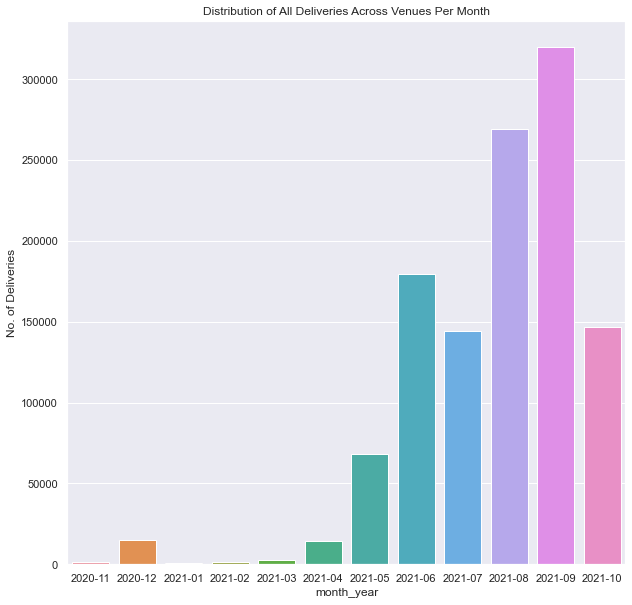

In [42]:
df_del['month_year'] = pd.to_datetime(df_del['timestamp']).dt.strftime('%Y-%m')
df_plot=df_del.groupby('month_year').agg({'month_year': 'count'}).rename(columns={'month_year': 'No. of Deliveries'})
df_plot=df_plot.reset_index()
plt.figure(figsize=(10,10))
sns.barplot(data=df_plot, x = "month_year", y='No. of Deliveries')
plt.title('Distribution of All Deliveries Across Venues Per Month')
plt.show()

In [43]:
df_user = pd.read_csv('./batfast_6s/user.csv')
df_user

,email,name,batfast_id,gender,age_group,hand,skill,timestamp,updated
0,applelemon@peoplevine.com,APPLE LEMON,bfs00200001,NaN,NaN,NaN,NaN,2021-04-19 16:53:57.406577+00:00,2021-05-28 14:36:01.140989+00:00
1,justin@brandexplosion.co.uk,JUSTIN GRANGER,bfs00200002,male,NaN,RHS,NaN,2021-04-21 15:35:33.375785+00:00,2021-07-13 13:44:27.352902+00:00
2,blake@sixescricket.com,BLAKE VAN DER LINDE,bfs00200003,male,16Plus,LHS,NaN,2021-04-21 16:47:16.060281+00:00,2021-09-01 15:38:14.071919+00:00
3,blake@sixescricket.com,BLAKE VAN DER LINDE,bfs00200004,NaN,NaN,NaN,NaN,2021-04-21 16:47:16.294376+00:00,2021-05-28 14:36:01.149213+00:00
4,blake@sixescricket.com,BLAKE VAN DER LINDE,bfs00200005,NaN,NaN,NaN,NaN,2021-04-22 14:33:35.290432+00:00,2021-05-28 14:36:01.165294+00:00
...,...,...,...,...,...,...,...,...,...
117001,NaN,NaN,bfs6100424,NaN,NaN,NaN,NaN,2021-09-18 12:29:16.246337+00:00,2021-09-18 12:29:16.246359+00:00
117002,NaN,NaN,bfs6100425,NaN,NaN,NaN,NaN,2021-09-18 12:29:16.251238+00:00,2021-09-18 12:29:16.251259+00:00
117003,NaN,NaN,bfs6100426,NaN,NaN,NaN,NaN,2021-09-18 14:23:01.813550+00:00,2021-09-18 14:23:01.813579+00:00
117004,NaN,NaN,bfs6100427,NaN,NaN,NaN,NaN,2021-09-18 15:34:32.738973+00:00,2021-09-18 15:34:32.738996+00:00


In [44]:
df_user.describe()

,email,name,batfast_id,gender,age_group,hand,skill,timestamp,updated
count,31083,79003,117006,61789,61999,61723,1210,117006,117006
unique,26186,39785,116891,6,5,3,13,116891,116891
top,na@gmail.com,PLAYER ONE,batfast_id,male,16Plus,RHS,35,timestamp,updated
freq,648,1069,116,51007,46559,56736,280,116,116


In [45]:
df_user.drop(df_user.loc[df_user['batfast_id']=='batfast_id'].index, inplace=True)
df_user

,email,name,batfast_id,gender,age_group,hand,skill,timestamp,updated
0,applelemon@peoplevine.com,APPLE LEMON,bfs00200001,NaN,NaN,NaN,NaN,2021-04-19 16:53:57.406577+00:00,2021-05-28 14:36:01.140989+00:00
1,justin@brandexplosion.co.uk,JUSTIN GRANGER,bfs00200002,male,NaN,RHS,NaN,2021-04-21 15:35:33.375785+00:00,2021-07-13 13:44:27.352902+00:00
2,blake@sixescricket.com,BLAKE VAN DER LINDE,bfs00200003,male,16Plus,LHS,NaN,2021-04-21 16:47:16.060281+00:00,2021-09-01 15:38:14.071919+00:00
3,blake@sixescricket.com,BLAKE VAN DER LINDE,bfs00200004,NaN,NaN,NaN,NaN,2021-04-21 16:47:16.294376+00:00,2021-05-28 14:36:01.149213+00:00
4,blake@sixescricket.com,BLAKE VAN DER LINDE,bfs00200005,NaN,NaN,NaN,NaN,2021-04-22 14:33:35.290432+00:00,2021-05-28 14:36:01.165294+00:00
...,...,...,...,...,...,...,...,...,...
117001,NaN,NaN,bfs6100424,NaN,NaN,NaN,NaN,2021-09-18 12:29:16.246337+00:00,2021-09-18 12:29:16.246359+00:00
117002,NaN,NaN,bfs6100425,NaN,NaN,NaN,NaN,2021-09-18 12:29:16.251238+00:00,2021-09-18 12:29:16.251259+00:00
117003,NaN,NaN,bfs6100426,NaN,NaN,NaN,NaN,2021-09-18 14:23:01.813550+00:00,2021-09-18 14:23:01.813579+00:00
117004,NaN,NaN,bfs6100427,NaN,NaN,NaN,NaN,2021-09-18 15:34:32.738973+00:00,2021-09-18 15:34:32.738996+00:00


In [46]:
df_user.describe()

,email,name,batfast_id,gender,age_group,hand,skill,timestamp,updated
count,30967,78887,116890,61673,61883,61607,1094,116890,116890
unique,26185,39784,116890,5,4,2,12,116890,116890
top,na@gmail.com,PLAYER ONE,bfs2701545,male,16Plus,RHS,35,2021-08-21 13:43:15.811171+00:00,2021-09-12 11:36:54.612732+00:00
freq,648,1069,1,51007,46559,56736,280,1,1


In [47]:
df_user['gender'].value_counts()

male      51007
female    10074
na          556
other        34
Male          2
Name: gender, dtype: int64

In [48]:
df_user['age_group'].value_counts()

16Plus    46559
10To16     7825
4To10      7469
11To16       30
Name: age_group, dtype: int64

In [49]:
df_user["gender"].replace({"Male": "male"}, inplace=True)
df_user["gender"].replace({"na": np.nan}, inplace=True)
df_user["age_group"].replace({"10to16": "11to16"}, inplace=True)

In [50]:
df_user['gender'].value_counts()

male      51009
female    10074
other        34
Name: gender, dtype: int64

In [51]:
df_user.drop(['timestamp'], axis=1, inplace=True)
df_user.drop(['updated'], axis=1, inplace=True)
df_user.drop(['email'], axis=1, inplace=True)
df_user.drop(['name'], axis=1, inplace=True)
df_user.drop(['skill'], axis=1, inplace=True)

In [52]:
df_u =df_user.copy()
df_u=df_u[df_u['hand'].notna()]
df_u=df_u[df_u['gender'].notna()]
df_u=df_u[df_u['age_group'].notna()]
fig = px.sunburst(df_u, path=['gender', 'hand','age_group'], values=df_u['batfast_id'].value_counts(), color='age_group',
                 title = 'Demographics of Users')

fig.show()

In [53]:
df = pd.merge(left=df_del, right=df_user, left_on='batfast_id', right_on='batfast_id')
df

,timestamp,batfast_id,client_name,event_name,game_mode,score,speed,pitch,swing,pan,turn,length,wicket/dead ball,month_year,gender,age_group,hand
0,2020-11-17 17:34:38,bfs4600003,sixes,fulham,ball_challenge,0.0,30.0,3.5,0.0,0.0,0.0,Extra Short,Not Out,2020-11,male,16Plus,RHS
1,2020-11-18 11:43:08,bfs4600003,sixes,fulham,ball_challenge,0.0,25.0,1.0,0.0,0.0,0.0,Yorker,Bowled,2020-11,male,16Plus,RHS
2,2020-11-18 11:43:32,bfs4600003,sixes,fulham,ball_challenge,0.0,25.0,1.0,0.0,0.0,0.0,Yorker,Not Out,2020-11,male,16Plus,RHS
3,2020-11-18 11:43:52,bfs4600003,sixes,fulham,ball_challenge,0.0,25.0,1.0,0.0,0.0,0.0,Yorker,Not Out,2020-11,male,16Plus,RHS
4,2020-11-18 11:44:58,bfs4600003,sixes,fulham,ball_challenge,0.0,30.0,1.5,0.0,0.0,0.0,Yorker,Bowled,2020-11,male,16Plus,RHS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163459,2021-10-14 13:47:03,bfs00206688,sixes,gps,set_over_rr_RR,0.0,40.0,3.5,0.0,0.0,0.0,Extra Short,Not Out,2021-10,male,16Plus,RHS
1163460,2021-10-14 13:47:30,bfs00206688,sixes,gps,set_over_rr_RR,0.0,30.0,2.7,0.0,0.0,0.0,Full,Not Out,2021-10,male,16Plus,RHS
1163461,2021-10-14 13:47:47,bfs00206688,sixes,gps,set_over_rr_RR,0.0,40.0,2.5,0.0,3.0,0.0,Yorker,Not Out,2021-10,male,16Plus,RHS
1163462,2021-10-14 13:48:01,bfs00206688,sixes,gps,set_over_rr_RR,0.0,40.0,3.5,0.0,0.0,0.0,Extra Short,Not Out,2021-10,male,16Plus,RHS


In [51]:
df['game_mode'].value_counts()

set_over_rr_RR       801814
over_challenge_RR    358111
Whack_RR               2258
ball_challenge          504
over_challenge          464
Whack                   219
Continuous               64
Finish                   30
Name: game_mode, dtype: int64

In [52]:
df['gender'].value_counts()

male      917493
female    213929
other       1080
Name: gender, dtype: int64

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1163464 entries, 0 to 1163463
Data columns (total 17 columns):
 #   Column            Non-Null Count    Dtype         
---  ------            --------------    -----         
 0   timestamp         1163464 non-null  datetime64[ns]
 1   batfast_id        1163464 non-null  object        
 2   client_name       1163464 non-null  object        
 3   event_name        1163464 non-null  object        
 4   game_mode         1163464 non-null  object        
 5   score             1163464 non-null  float64       
 6   speed             1163464 non-null  float64       
 7   pitch             1163464 non-null  float64       
 8   swing             1163464 non-null  float64       
 9   pan               1163464 non-null  float64       
 10  turn              1163464 non-null  float64       
 11  length            1163464 non-null  object        
 12  wicket/dead ball  1163464 non-null  object        
 13  month_year        1163464 non-null  object

In [54]:
round(df.describe(),2)

,score,speed,pitch,swing,pan,turn
count,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00
mean,1.46,28.09,1.60,0.00,0.28,0.16
std,2.03,6.34,1.41,0.31,1.02,2.33
min,0.00,20.00,-1.90,-25.00,-12.00,-6.00
25%,0.00,20.00,1.00,0.00,0.00,0.00
50%,0.00,30.00,1.50,0.00,0.00,0.00
75%,4.00,35.00,3.00,0.00,0.00,0.00
max,6.00,45.00,3.80,25.00,12.00,6.00


In [54]:
df['turn'] = np.where(df['hand'] == 'LHS',
                                df['turn'] * -1,
                                df['turn'])

In [55]:
df['swing'] = np.where(df['hand'] == 'LHS',
                                df['swing'] * -1,
                                df['swing'])

In [56]:
df['day_month_year'] = pd.to_datetime(df['timestamp']).dt.strftime('%d-%m-%Y')

In [57]:
df['session_no'] = pd.concat([x.groupby('day_month_year').ngroup()+1 for _,x in df.groupby('batfast_id')])

In [58]:
df['deliveries_faced']=df.groupby(['batfast_id','day_month_year']).cumcount()

In [59]:
df['overs']=df['deliveries_faced']//6

In [60]:
df = df.set_index(['batfast_id','session_no','event_name','overs', 'deliveries_faced'],drop=False)
df.sort_index(inplace=True)
df.head(20)

timestamp  \
batfast_id  session_no event_name overs deliveries_faced                       
bfs00200002 1          fulham     0     0                2021-07-13 12:15:31   
                                        1                2021-07-13 12:15:55   
                                        2                2021-07-13 12:16:10   
                                        3                2021-07-13 12:16:32   
                                        4                2021-07-13 12:16:52   
                                        5                2021-07-13 12:17:18   
                                  1     6                2021-07-13 12:20:34   
                                        7                2021-07-13 12:20:45   
                                        8                2021-07-13 12:21:02   
                                        9                2021-07-13 12:21:35   
                                        10               2021-07-13 12:21:52   
                                        11               2021-07-13 12:22:12   
                                  2     12               2021-07-13 12:25:36   
                                        13               2021-07-13 12:26:00   
                                        14               2021-07-13 12:26:18   
                                        15               2021-07-13 12:26:46   
                                        16               2021-07-13 12:27:23   
                                        17               2021-07-13 12:27:40   
                                  3     18               2021-07-13 12:31:26   
                                        19               2021-07-13 12:32:04   

                                                           batfast_id  \
batfast_id  session_no event_name overs deliveries_faced                
bfs00200002 1          fulham     0     0                 bfs00200002   
                                        1                 bfs00200002   
                                        2                 bfs00200002   
                                        3                 bfs00200002   
                                        4                 bfs00200002   
                                        5                 bfs00200002   
                                  1     6                 bfs00200002   
                                        7                 bfs00200002   
                                        8                 bfs00200002   
                                        9                 bfs00200002   
                                        10                bfs00200002   
                                        11                bfs00200002   
                                  2     12                bfs00200002   
                                        13                bfs00200002   
                                        14                bfs00200002   
                                        15                bfs00200002   
                                        16                bfs00200002   
                                        17                bfs00200002   
                                  3     18                bfs00200002   
                                        19                bfs00200002   

                                                         client_name  \
batfast_id  session_no event_name overs deliveries_faced               
bfs00200002 1          fulham     0     0                      sixes   
                                        1                      sixes   
                                        2                      sixes   
                                        3                      sixes   
                                        4                      sixes   
                                        5                      sixes   
                                  1     6                      sixes   
                                        7          

In [61]:
df.rename_axis(['Batfast_id','Session_no','Event_name','Overs', 'Deliveries_faced'],inplace=True)

In [62]:
df['runs']=df.groupby(['batfast_id','day_month_year'])['score'].cumsum()

In [63]:
df['no_of_wickets'] = df.assign(is_out=df['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['batfast_id', 'day_month_year'])['is_out'] \
                        .cumsum()

In [64]:
df['total_runs']=df.groupby(['batfast_id'])['score'].cumsum()

In [65]:
df["total_overs"]=df.groupby(['batfast_id']).cumcount()//6

In [66]:
df['total_deliveries']=df.groupby(['batfast_id']).cumcount()

In [67]:
df['total_wickets'] =df.assign(is_out=df['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['batfast_id'])['is_out'] \
                        .cumsum()

In [68]:
df['S/R'] = round((df['runs']/(df['deliveries_faced']+1)*100),2)

In [69]:
df['batting_avg']=df['total_runs']/(df['total_wickets']+1)

In [70]:
df['run_rate']=round((df['runs']/((df['deliveries_faced']+1)/6)),2)

In [71]:
df['runs_per_over']= df.groupby(['batfast_id','session_no','overs'])['score'].cumsum()


In [72]:
round(df.describe(),2)

,score,speed,pitch,swing,pan,turn,session_no,deliveries_faced,overs,runs,no_of_wickets,total_runs,total_overs,total_deliveries,total_wickets,S/R,batting_avg,run_rate,runs_per_over
count,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00,1163464.00
mean,1.46,28.09,1.60,0.00,0.28,0.19,1.11,19.82,2.89,30.47,0.64,36.91,3.58,23.99,0.78,143.43,22.44,8.61,5.03
std,2.03,6.34,1.41,0.31,1.02,2.33,0.83,16.29,2.70,28.88,1.06,62.89,6.27,37.67,1.70,85.88,23.84,5.15,5.16
min,0.00,20.00,-1.90,-25.00,-12.00,-6.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,20.00,1.00,0.00,0.00,0.00,1.00,8.00,1.00,10.00,0.00,10.00,1.00,8.00,0.00,87.50,7.00,5.25,0.00
50%,0.00,30.00,1.50,0.00,0.00,0.00,1.00,17.00,2.00,23.00,0.00,24.00,3.00,18.00,0.00,139.13,16.00,8.35,4.00
75%,4.00,35.00,3.00,0.00,0.00,0.00,1.00,28.00,4.00,42.00,1.00,45.00,4.00,29.00,1.00,194.12,30.00,11.65,8.00
max,6.00,45.00,3.80,25.00,12.00,6.00,24.00,245.00,40.00,395.00,21.00,1641.00,144.00,868.00,45.00,600.00,508.00,36.00,36.00


In [73]:
df.head(12)

timestamp  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                       
bfs00200002 1          fulham     0     0                2021-07-13 12:15:31   
                                        1                2021-07-13 12:15:55   
                                        2                2021-07-13 12:16:10   
                                        3                2021-07-13 12:16:32   
                                        4                2021-07-13 12:16:52   
                                        5                2021-07-13 12:17:18   
                                  1     6                2021-07-13 12:20:34   
                                        7                2021-07-13 12:20:45   
                                        8                2021-07-13 12:21:02   
                                        9                2021-07-13 12:21:35   
                                        10               2021-07-13 12:21:52   
                                        11               2021-07-13 12:22:12   

                                                           batfast_id  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                
bfs00200002 1          fulham     0     0                 bfs00200002   
                                        1                 bfs00200002   
                                        2                 bfs00200002   
                                        3                 bfs00200002   
                                        4                 bfs00200002   
                                        5                 bfs00200002   
                                  1     6                 bfs00200002   
                                        7                 bfs00200002   
                                        8                 bfs00200002   
                                        9                 bfs00200002   
                                        10                bfs00200002   
                                        11                bfs00200002   

                                                         client_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced               
bfs00200002 1          fulham     0     0                      sixes   
                                        1                      sixes   
                                        2                      sixes   
                                        3                      sixes   
                                        4                      sixes   
                                        5                      sixes   
                                  1     6                      sixes   
                                        7                      sixes   
                                        8                      sixes   
                                        9                      sixes   
                                        10                     sixes   
                                        11                     sixes   

                                                         event_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced              
bfs00200002 1          fulham     0     0                    fulham   
                                        1                    fulham   
                                        2                    fulham   
                                        3                    fulham   
                                        4                    fulham   
                                        5                    fulham   
                                  1     6                    fulham   
                                        7                    fulham   
                                        8                    fulham   
                                        9                    fulham   
                                        10                   f

In [51]:
df.isnull().sum()

timestamp               0
batfast_id              0
client_name             0
event_name              0
game_mode               0
score                   0
speed                   0
pitch                   0
swing                   0
pan                     0
turn                    0
length                  0
wicket/dead ball        0
month_year              0
gender              30962
age_group            8282
hand                26134
day_month_year          0
session_no              0
deliveries_faced        0
overs                   0
runs                    0
no_of_wickets           0
total_runs              0
total_overs             0
total_deliveries        0
total_wickets           0
S/R                     0
batting_avg             0
run_rate                0
runs_per_over           0
dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x132b6ec70>,
      dtype=object)

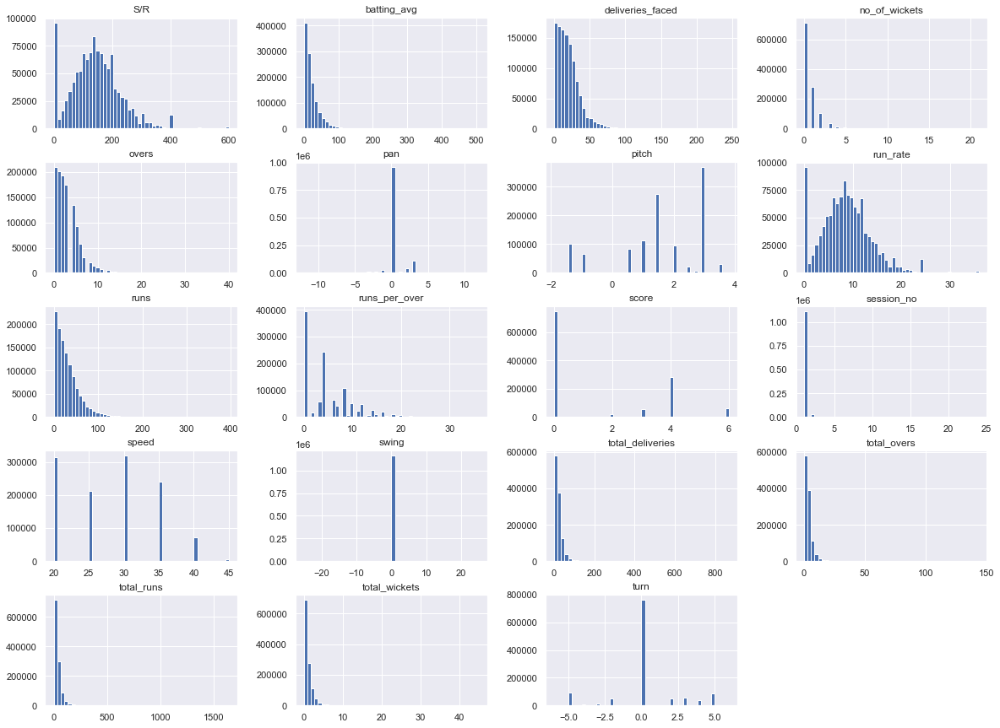

In [74]:
%matplotlib inline
import matplotlib.pyplot as plt
df.hist(bins=50, figsize=(20,15))

plt.show()

In [77]:
df_u1 =df.copy()
df_u1=df_u1[df_u1['hand'].notna()]
df_u1=df_u1[df_u1['gender'].notna()]
df_u1=df_u1[df_u1['age_group'].notna()]
df_u1= df_u1.groupby('batfast_id').agg({'hand': 'first', 'gender': 'first', 'age_group': 'first'})
df_u1=df_u1.reset_index()
fig = px.sunburst(df_u1, path=['gender', 'hand','age_group'], values=df_u1['batfast_id'].value_counts(), color='age_group',
                 title = 'Demographics of Users')

fig.show()

<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'Distribution of Total Deliveries Faced by Users')

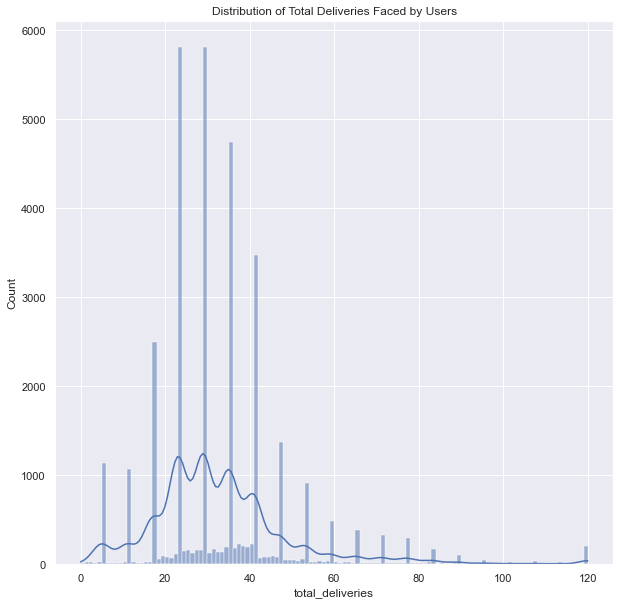

In [78]:
plt.figure(figsize=(10,10))
df_1=df.loc[(df['total_deliveries'] <= 120)]
df_1=df_1.groupby('batfast_id').agg({'total_deliveries':'max'})
sns.set(style="darkgrid")
sns.histplot(data=df_1, x="total_deliveries", kde=True,bins=120)
plt.title('Distribution of Total Deliveries Faced by Users')
plt.show()

<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'Distribution of Total Deliveries Faced by Users')

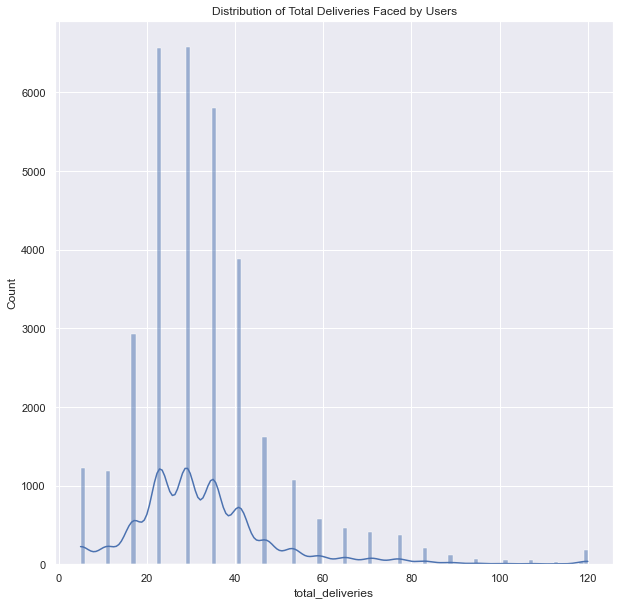

In [172]:
plt.figure(figsize=(10,10))
df_1a=df_reg.loc[(df_reg['total_deliveries'] <= 120)]
df_1a=df_1a.groupby('batfast_id').agg({'total_deliveries':'max'})
sns.set(style="darkgrid")
sns.histplot(data=df_1a, x="total_deliveries", kde=True,bins=120)
plt.title('Distribution of Total Deliveries Faced by Users')
plt.show()

<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'Distribution of Deliveries Faced by Users in One Session')

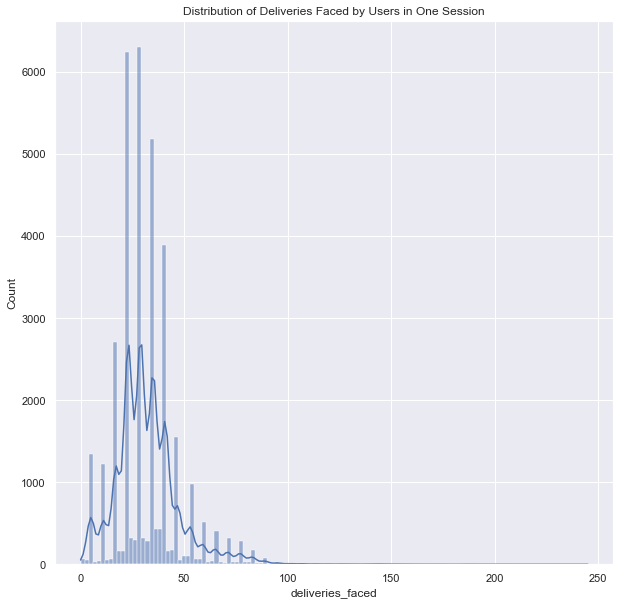

In [79]:
plt.figure(figsize=(10,10))
#df_1=df.loc[(df['deliveries_faced'] <= 100)]
df_1=df.groupby(['batfast_id','session_no']).agg({'deliveries_faced':'max'})
sns.set(style="darkgrid")
sns.histplot(data=df_1, x="deliveries_faced", kde=True,bins=125)
plt.title('Distribution of Deliveries Faced by Users in One Session')
plt.show()

<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'Distribution of Sessions Played by Users')

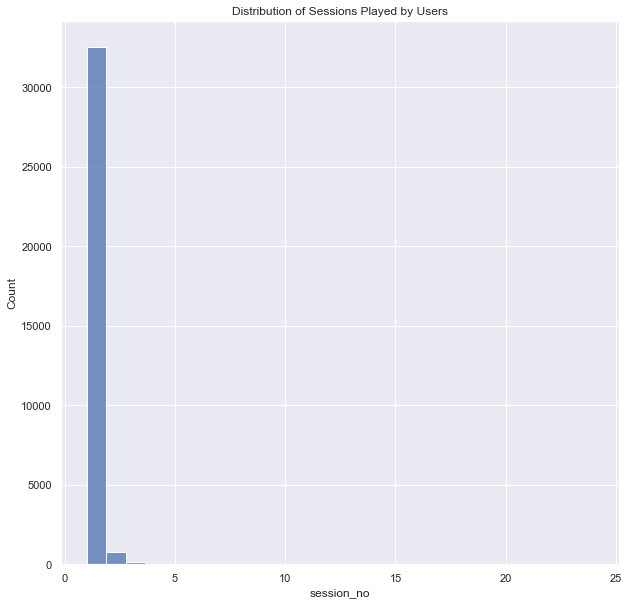

In [80]:
plt.figure(figsize=(10,10))
#df_1=df.loc[(df['session_no'] <= 10)]
df_1=df.groupby('batfast_id').agg({'session_no':'max'})
sns.set(style="darkgrid")
sns.histplot(data=df_1, x="session_no", kde=False, bins =26)
plt.title('Distribution of Sessions Played by Users')
plt.show()

In [75]:
df['hour'] = pd.to_datetime(df['timestamp']).dt.strftime('%H')

In [76]:
df['hour'].value_counts()

18    120628
17    117122
19    115502
15    108145
20    107928
16    106864
14     84052
13     79739
21     78983
12     76177
11     67198
10     39990
22     34432
09     18767
23      3458
08      3356
00       512
07       363
01       156
06        92
Name: hour, dtype: int64

In [77]:
df["hour"].replace({'00': '24', '01': '25' }, inplace=True)

<Figure size 720x720 with 0 Axes>

Text(0.5, 1.0, 'Average Score by Time of Day')

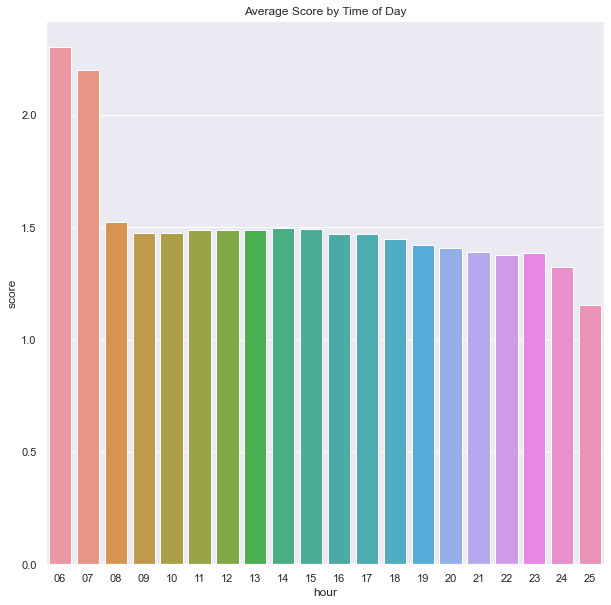

In [84]:
df_plot=df.groupby('hour').agg({'score': 'mean'})
df_plot=df_plot.reset_index()
plt.figure(figsize=(10,10))
sns.barplot(data=df_plot, x = "hour", y='score')
plt.title('Average Score by Time of Day')
plt.show()

In [261]:
df.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1163464 entries, ('bfs00200002', 1, 'fulham', 0, 0) to ('bfs901776', 1, 'gps', 4, 24)
Data columns (total 36 columns):
 #   Column            Non-Null Count    Dtype         
---  ------            --------------    -----         
 0   timestamp         1163464 non-null  datetime64[ns]
 1   batfast_id        1163464 non-null  object        
 2   client_name       1163464 non-null  object        
 3   event_name        1163464 non-null  object        
 4   game_mode         1163464 non-null  object        
 5   score             1163464 non-null  float64       
 6   speed             1163464 non-null  float64       
 7   pitch             1163464 non-null  float64       
 8   swing             1163464 non-null  float64       
 9   pan               1163464 non-null  float64       
 10  turn              1163464 non-null  float64       
 11  length            1163464 non-null  object        
 12  wicket/dead ball  1163464 non-null  object

In [78]:
df['hour'] = df['hour'].astype('int64')

<Figure size 1080x720 with 0 Axes>

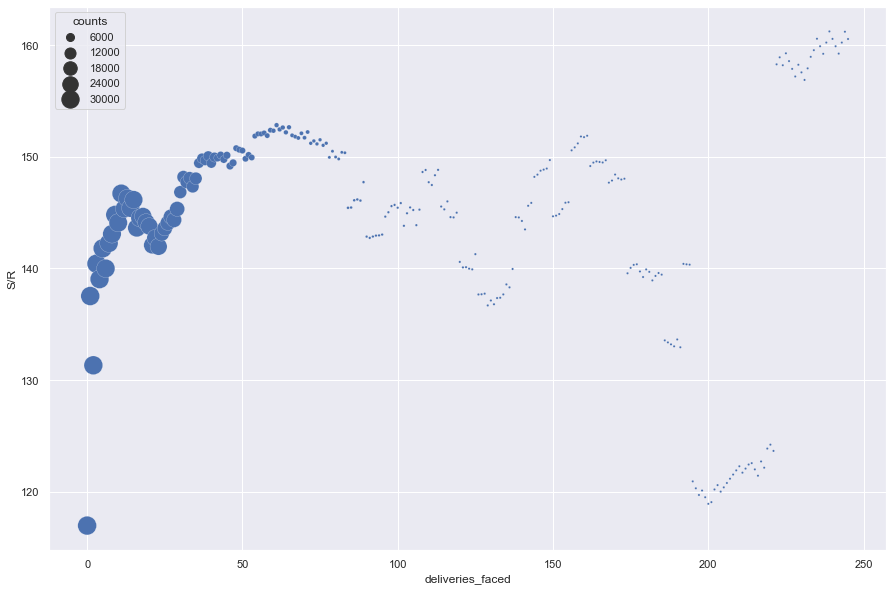

In [86]:
plt.figure(figsize=(15,10))
mean_SR = df.groupby('deliveries_faced').agg({'S/R': 'mean', 'deliveries_faced': 'count'}).rename(columns = {'deliveries_faced': 'counts'})
mean_SR['ln_count'] = np.log(mean_SR.counts+1)
mean_SR=mean_SR.reset_index(level=0)
# sns.regplot(x=mean_SR['deliveries_faced'], y=mean_SR['S/R'], line_kws={"color":"r","alpha":0.7,"lw":5})
# plt.title('Average Strike Rate Over Time')
# plt.show()

# plt.figure(figsize=(10, 10))
# plt.scatter(
#     x = mean_SR['deliveries_faced'], 
#     y = mean_SR['S/R'], 
#     s=mean_SR['counts'],
#     sizes=(20, 2000),
# #     c=age_group['age_group'].cat.codes, 
#     cmap="Accent", 
#     alpha=0.6, 
#     edgecolors="white", 
#     linewidth=2);
 
# # Add titles (main and on axis)
# #plt.yscale('log')
# plt.xlabel("Average S/R")
# plt.ylabel("Batting Avg")
# plt.title("Performance Over Time")
# #plt.ylim(0,50000)
# #plt.xlim(30, 75);
# # plt.legend()
# plt.show()

sns.scatterplot(data=mean_SR, x="deliveries_faced", y="S/R", size="counts", sizes=(5, 350))

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Average Strike Rate Over Time')

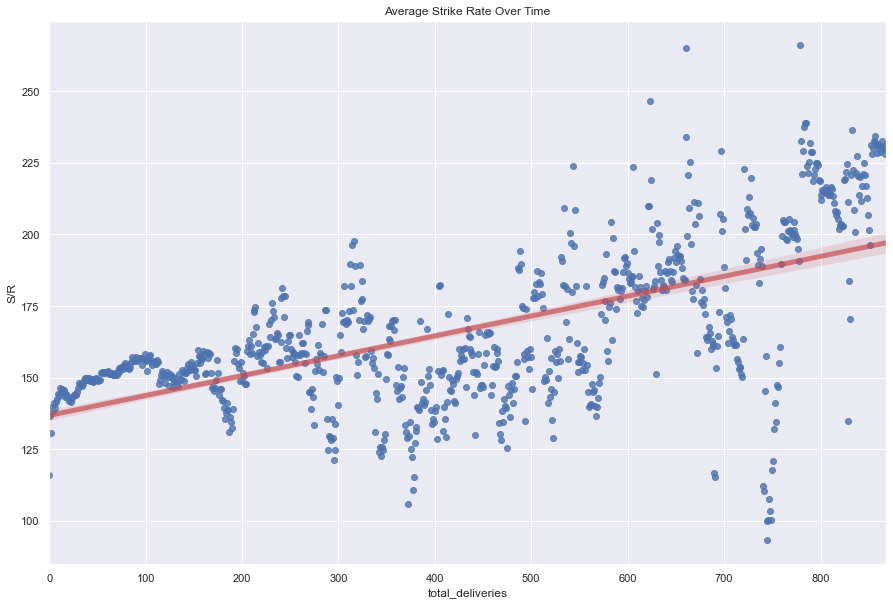

In [88]:
plt.figure(figsize=(15,10))
mean_SR = df.groupby('total_deliveries').agg({'S/R': 'mean'})
mean_SR=mean_SR.reset_index(level=0)
sns.regplot(x=mean_SR['total_deliveries'], y=mean_SR['S/R'], line_kws={"color":"r","alpha":0.7,"lw":5})
plt.title('Average Strike Rate Over Time')
plt.show()

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Batting Average Rate Over Time')

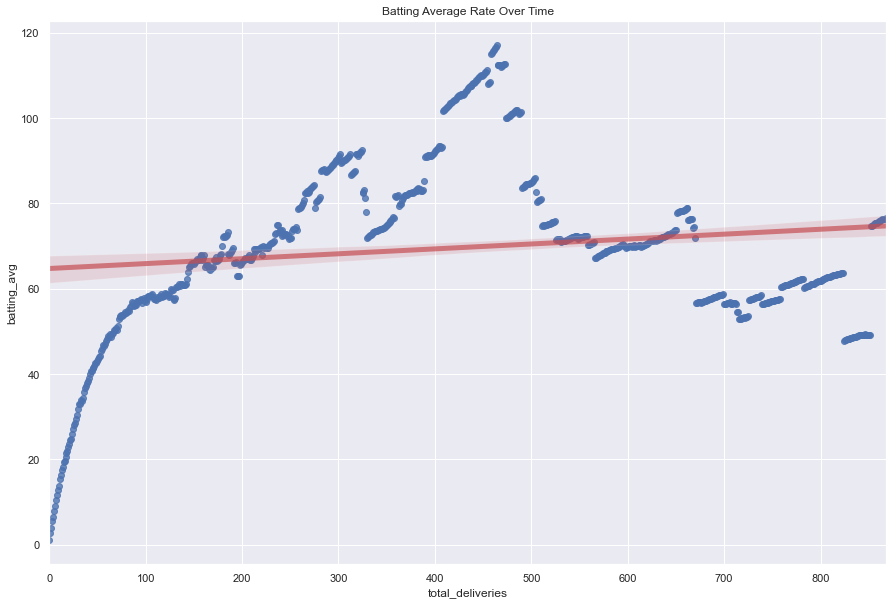

In [89]:
plt.figure(figsize=(15,10))
mean_SR = df.groupby('total_deliveries').agg({'batting_avg': 'mean'})
mean_SR=mean_SR.reset_index(level=0)
sns.regplot(x=mean_SR['total_deliveries'], y=mean_SR['batting_avg'], line_kws={"color":"r","alpha":0.7,"lw":5})
plt.title('Batting Average Rate Over Time')
plt.show()

<Figure size 720x720 with 0 Axes>

Text(0.5, 0, 'Average S/R')

Text(0, 0.5, 'Batting Avg')

Text(0.5, 1.0, 'Performance Over Time')

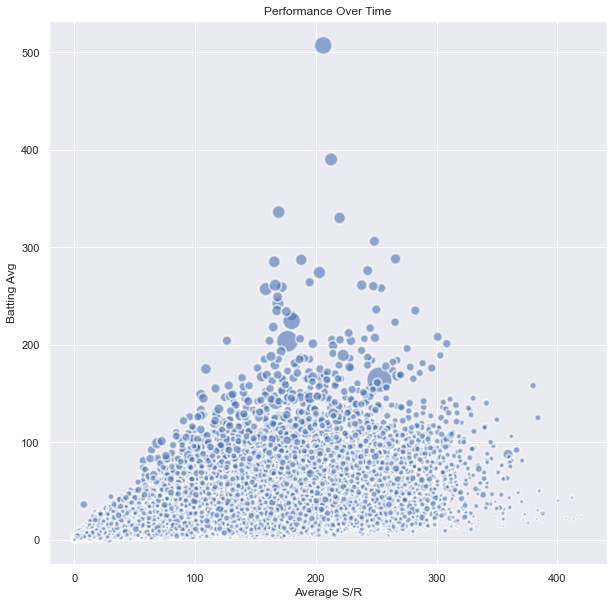

In [95]:
#df_reg['age_group'] = df_reg['age_group'].astype('category')

# age_group = df_reg.groupby(["batfast_id"]).agg({'age_group':'first'})
# age_group['age_group']=pd.Categorical(age_group['age_group'])
mean_SR = df.groupby(['batfast_id']).agg({'S/R': 'mean'})
mean_w = df.groupby(['batfast_id']).agg({'total_wickets': 'max', 'total_runs': 'max'})
mean_w['batting_avg']=mean_w['total_runs']/mean_w['total_wickets']
total_del = df.groupby(['batfast_id']).agg({'total_deliveries': 'max'})


plt.figure(figsize=(10, 10))
plt.scatter(
    x = mean_SR['S/R'], 
    y = mean_w['batting_avg'], 
    s=total_del['total_deliveries'], 
#     c=age_group['age_group'].cat.codes, 
    cmap="Accent", 
    alpha=0.6, 
    edgecolors="white", 
    linewidth=2);
 
# Add titles (main and on axis)
#plt.yscale('log')
plt.xlabel("Average S/R")
plt.ylabel("Batting Avg")
plt.title("Performance Over Time")
#plt.ylim(0,50000)
#plt.xlim(30, 75);
# plt.legend()
plt.show()

Text(0.5, 0.98, 'Comparing Features between Classical and Pop Music')

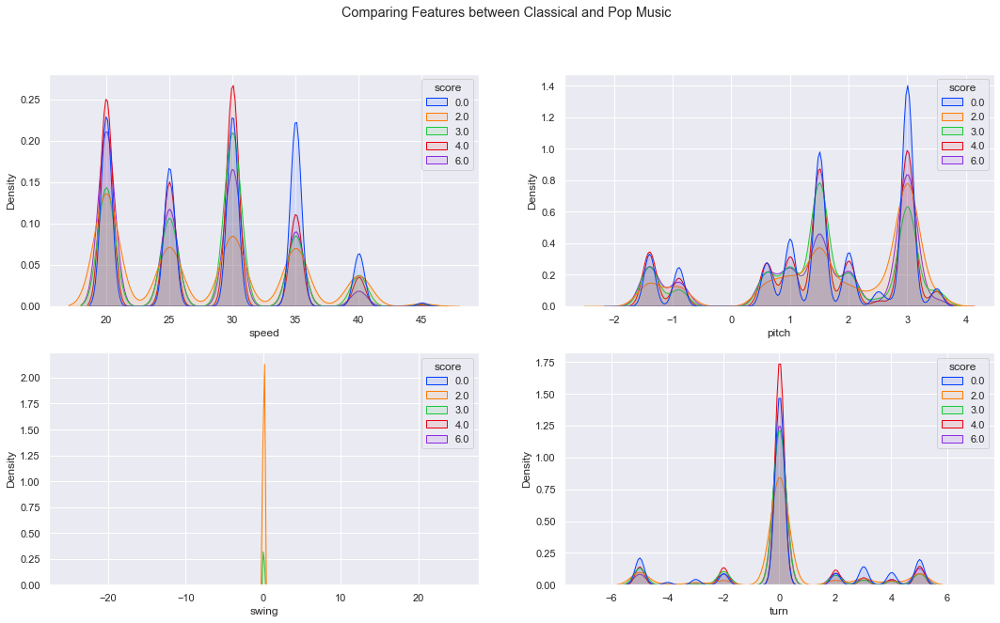

In [100]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

fig.suptitle('Comparing Features between Classical and Pop Music')

sns.kdeplot(ax=axes[0, 0], data=df, x = "speed", hue = "score", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[0, 1], data=df, x = "pitch", hue = "score", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[1, 0], data=df, x = "swing", hue = "score", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[1, 1], data=df, x = "turn", hue = "score", fill=True, common_norm=False,palette='bright', alpha=0.1)

plt.show()

Text(0.5, 0.98, 'Mean Scores Across Different Speed and Turn')

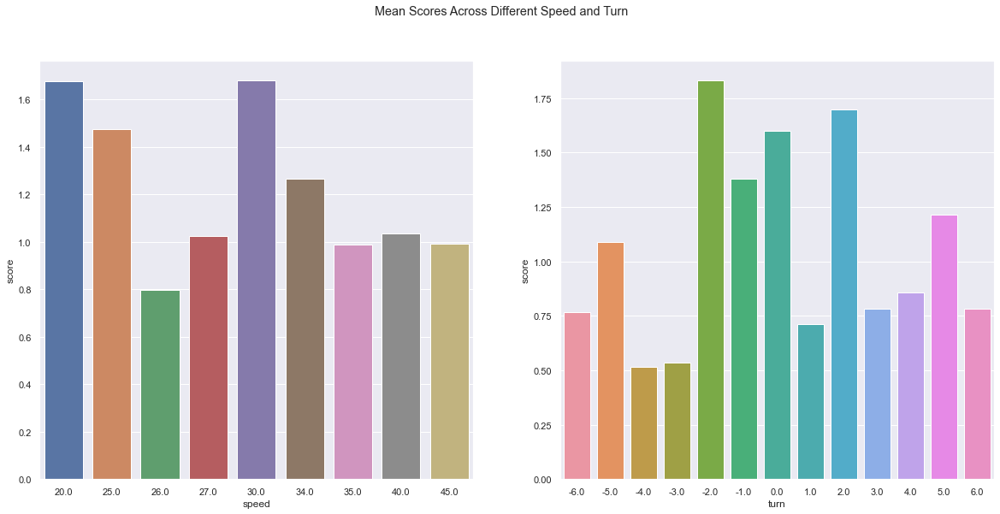

In [1083]:
mean_sp = df.groupby(['speed']).agg({'score': 'mean'})
mean_sp=mean_sp.reset_index()

mean_t = df.groupby(['turn']).agg({'score': 'mean'})
mean_t=mean_t.reset_index()

fig, (ax1,ax2) = plt.subplots(1,2, figsize=(20,9))
sns.set(style="darkgrid")
fig.suptitle('Mean Scores Across Different Speed and Turn')

sns.barplot(ax=ax1, y=mean_sp["score"], x=mean_sp['speed'])

sns.barplot(ax=ax2, y=mean_t["score"], x=mean_t['turn'] )
#plt.figure(figsize=(10, 10))


# Customize the axes and title
plt.show()

In [1085]:
df['turn'].value_counts()

 0.0    762286
-5.0     91832
 5.0     88846
 3.0     56113
-2.0     51283
 2.0     49221
 4.0     39127
-3.0     16438
-4.0      8044
 6.0       138
-6.0        77
 1.0        38
-1.0        21
Name: turn, dtype: int64

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'The Effect of Length on the Mean Score Across All Players')

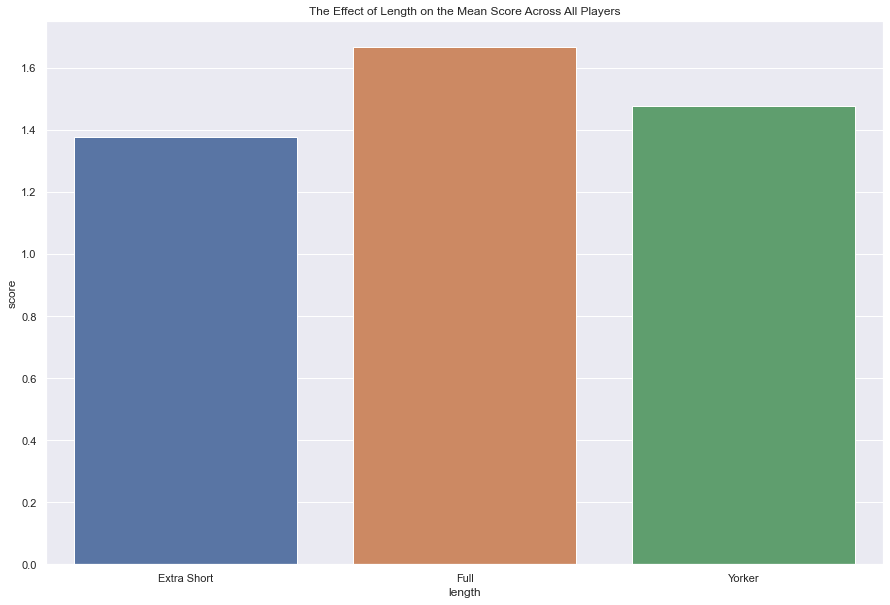

In [1086]:
mean_l = df.groupby(['length']).agg({'score': 'mean'})
mean_l=mean_l.reset_index()

plt.figure(figsize=(15,10))
#plt.figure(figsize=(10, 10))
ax = sns.barplot(x='length', y='score', data=mean_l)

# Customize the axes and title
plt.title('The Effect of Length on the Mean Score Across All Players')
plt.show()



In [79]:
conditions = [
    (df['speed'] < 30) & (df['turn'] >= -2) & (df['turn'] <= 2),
    (df['speed'] < 30) & (df['turn'] < -2),
    (df['speed'] < 30) & (df['turn'] > 2),
    (df['speed'] >= 30) & (df['speed'] < 40) & (df['turn'] >= -2) & (df['turn'] <= 2),
    (df['speed'] >= 30) & (df['speed'] < 40) & (df['turn'] < -2),
    (df['speed'] >= 30) & (df['speed'] < 40) & (df['turn'] > 2),
    (df['speed'] >= 40) & (df['speed'] <= 45) & (df['turn'] >= -2) & (df['turn'] <= 2),
    (df['speed'] >= 40) & (df['speed'] <= 45) & (df['turn'] < -2),
    (df['speed'] >= 40) & (df['speed'] <= 45) & (df['turn'] > 2)
    ]

values = ['Slow Straight', 'Slow Off Spin', 'Slow Leg Spin', 'Medium Straight', 'Medium Off Spin', 'Medium Leg Spin', 'Fast Straight', 'Fast Off Spin', 'Fast Leg Spin']

df['delivery_type'] = np.select(conditions, values)


In [80]:
conditions = [
    (df['delivery_type'] == 'Slow Straight') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Slow Off Spin') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Slow Leg Spin') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Slow Straight') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Slow Off Spin') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Slow Leg Spin') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Slow Straight') & (df['length'] == 'Yorker'),
    (df['delivery_type'] == 'Slow Off Spin') & (df['length'] == 'Yorker'),
    (df['delivery_type'] == 'Slow Leg Spin') & (df['length'] == 'Yorker'),
    (df['delivery_type'] == 'Medium Straight') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Medium Off Spin') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Medium Leg Spin') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Medium Straight') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Medium Off Spin') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Medium Leg Spin') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Medium Straight') & (df['length'] == 'Yorker'),
    (df['delivery_type'] == 'Medium Off Spin') & (df['length'] == 'Yorker'),
    (df['delivery_type'] == 'Medium Leg Spin') & (df['length'] == 'Yorker'),
    (df['delivery_type'] == 'Fast Straight') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Fast Off Spin') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Fast Leg Spin') & (df['length'] == 'Extra Short'),
    (df['delivery_type'] == 'Fast Straight') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Fast Off Spin') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Fast Leg Spin') & (df['length'] == 'Full'),
    (df['delivery_type'] == 'Fast Straight') & (df['length'] == 'Yorker'),
    (df['delivery_type'] == 'Fast Off Spin') & (df['length'] == 'Yorker'),
    (df['delivery_type'] == 'Fast Leg Spin') & (df['length'] == 'Yorker')
    ]

values = ['S_S_ES', 'S_OS_ES', 'S_LS_ES','S_S_F', 'S_OS_F', 'S_LS_F', 'S_S_Y', 'S_OS_Y', 'S_LS_Y','M_S_ES', 'M_OS_ES', 'M_LS_ES','M_S_F', 'M_OS_F', 'M_LS_F', 'M_S_Y', 'M_OS_Y', 'M_LS_Y', 'F_S_ES', 'F_OS_ES', 'F_LS_ES','F_S_F', 'F_OS_F', 'F_LS_F', 'F_S_Y', 'F_OS_Y', 'F_LS_Y']

df['length/type'] = np.select(conditions, values)

In [55]:
# add_suffix = lambda x: x + '_' + pd.RangeIndex(len(x)).astype(str)
# df['length/type'] = df.groupby(df.index.names[:-1])['length/type'].apply(add_suffix)

In [81]:
df['length/type_no']=df.groupby(df.index.names[:-1]).cumcount().astype(str)+ '_' + df['length/type']

In [80]:
df.head(20)

timestamp  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                       
bfs00200002 1          fulham     0     0                2021-07-13 12:15:31   
                                        1                2021-07-13 12:15:55   
                                        2                2021-07-13 12:16:10   
                                        3                2021-07-13 12:16:32   
                                        4                2021-07-13 12:16:52   
                                        5                2021-07-13 12:17:18   
                                  1     6                2021-07-13 12:20:34   
                                        7                2021-07-13 12:20:45   
                                        8                2021-07-13 12:21:02   
                                        9                2021-07-13 12:21:35   
                                        10               2021-07-13 12:21:52   
                                        11               2021-07-13 12:22:12   
                                  2     12               2021-07-13 12:25:36   
                                        13               2021-07-13 12:26:00   
                                        14               2021-07-13 12:26:18   
                                        15               2021-07-13 12:26:46   
                                        16               2021-07-13 12:27:23   
                                        17               2021-07-13 12:27:40   
                                  3     18               2021-07-13 12:31:26   
                                        19               2021-07-13 12:32:04   

                                                           batfast_id  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                
bfs00200002 1          fulham     0     0                 bfs00200002   
                                        1                 bfs00200002   
                                        2                 bfs00200002   
                                        3                 bfs00200002   
                                        4                 bfs00200002   
                                        5                 bfs00200002   
                                  1     6                 bfs00200002   
                                        7                 bfs00200002   
                                        8                 bfs00200002   
                                        9                 bfs00200002   
                                        10                bfs00200002   
                                        11                bfs00200002   
                                  2     12                bfs00200002   
                                        13                bfs00200002   
                                        14                bfs00200002   
                                        15                bfs00200002   
                                        16                bfs00200002   
                                        17                bfs00200002   
                                  3     18                bfs00200002   
                                        19                bfs00200002   

                                                         client_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced               
bfs00200002 1          fulham     0     0                      sixes   
                                        1                      sixes   
                                        2                      sixes   
                                        3                      sixes   
                                        4                      sixes   
                                        5                      sixes   
                                  1     6                      sixes   
                                        7          

Text(0.5, 0.98, 'Comparing Features between Classical and Pop Music')

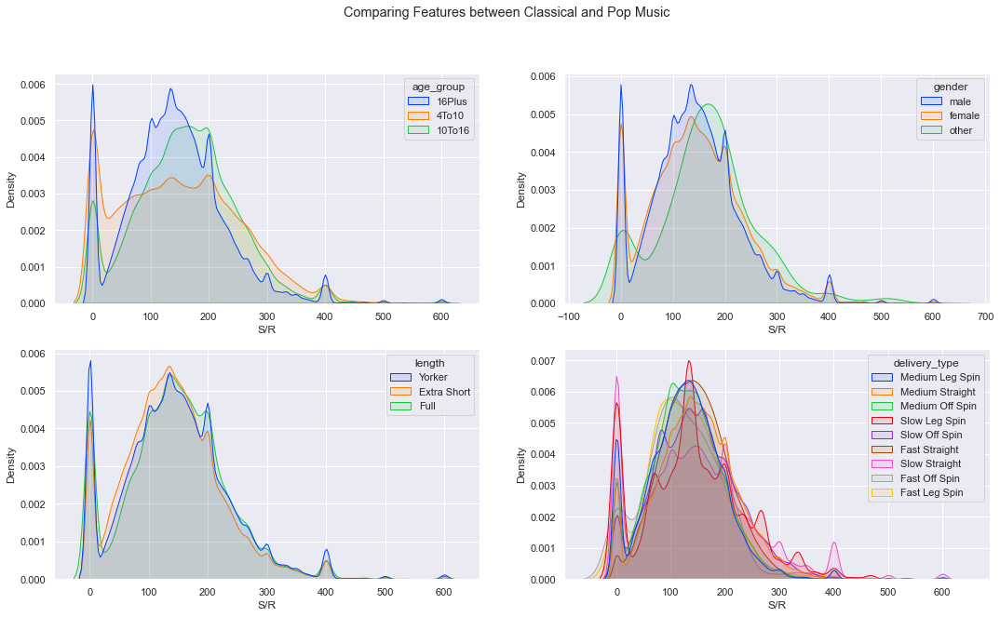

In [107]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

fig.suptitle('Comparing Features between Classical and Pop Music')

sns.kdeplot(ax=axes[0, 0], data=df, x = "S/R", hue = "age_group", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[0, 1], data=df, x = "S/R", hue = "gender", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[1, 0], data=df, x = "S/R", hue = "length", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[1, 1], data=df, x = "S/R", hue = "delivery_type", fill=True, common_norm=False,palette='bright', alpha=0.1)

plt.show()

In [108]:
df_1 = df.groupby(['Batfast_id']).agg({'S/R':'mean'})
extracted_col = df["gender"]
extracted_col2 = df["age_group"]
df_1 = df_1.join(extracted_col)
df_1 = df_1.join(extracted_col2)
df_1

S/R gender  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                    
bfs00200002 1          fulham     0     0                 114.6410   male   
                                        1                 114.6410   male   
                                        2                 114.6410   male   
                                        3                 114.6410   male   
                                        4                 114.6410   male   
...                                                            ...    ...   
bfs901776   1          gps        3     20                 79.1428   male   
                                        21                 79.1428   male   
                                        22                 79.1428   male   
                                        23                 79.1428   male   
                                  4     24                 79.1428   male   

                                                         age_group  
Batfast_id  Session_no Event_name Overs Deliveries_faced            
bfs00200002 1          fulham     0     0                      NaN  
                                        1                      NaN  
                                        2                      NaN  
                                        3                      NaN  
                                        4                      NaN  
...                                                            ...  
bfs901776   1          gps        3     20                  16Plus  
                                        21                  16Plus  
                                        22                  16Plus  
                                        23                  16Plus  
                                  4     24                  16Plus  

[1163464 rows x 3 columns]

Text(0.5, 0.98, 'Comparing Strike Rates Between Different Demographics')

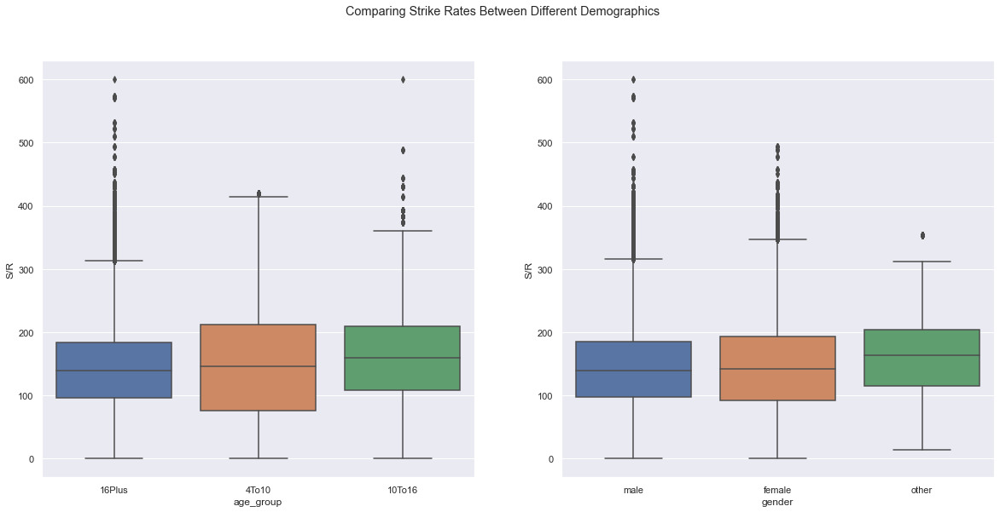

In [109]:
df_1 = df.groupby(['Batfast_id']).agg({'S/R':'mean'})
extracted_col = df["gender"]
extracted_col2 = df["age_group"]
df_1 = df_1.join(extracted_col)
df_1 = df_1.join(extracted_col2)
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(20,9))
sns.set(style="darkgrid")
fig.suptitle('Comparing Strike Rates Between Different Demographics')

sns.boxplot(ax=ax1, x=df_1["age_group"], y=df_1['S/R'])

sns.boxplot(ax=ax2, x=df_1["gender"], y=df_1['S/R'] )
#plt.figure(figsize=(10, 10))


# Customize the axes and title
plt.show()
# plt.figure(figsize=(10,10))
# sns.boxplot( x=df["age_group"], y=df["S/R"] )

Text(0.5, 0.98, 'Comparing Batting Average Between Different Demographics')

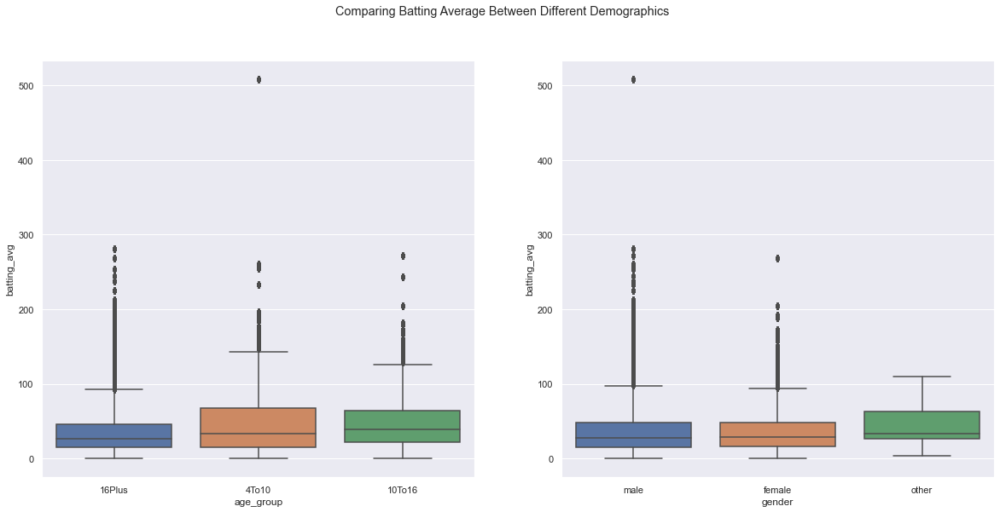

In [110]:
#df_1 = df.groupby(['batfast_id']).agg({'S/R':'mean'})
# df_1=df_1.reset_index()

df_1 = df.groupby(['Batfast_id']).agg({'batting_avg':'last'})
extracted_col = df["gender"]
extracted_col2 = df["age_group"]
df_1 = df_1.join(extracted_col)
df_1 = df_1.join(extracted_col2)


fig, (ax1,ax2) = plt.subplots(1,2, figsize=(20,9))
sns.set(style="darkgrid")
fig.suptitle('Comparing Batting Average Between Different Demographics')

sns.boxplot(ax=ax1, x=df_1["age_group"], y=df_1['batting_avg'] )

sns.boxplot(ax=ax2, x=df_1["gender"], y=df_1['batting_avg'] )
#plt.figure(figsize=(10, 10))


# Customize the axes and title
plt.show()
# plt.figure(figsize=(10,10))
# sns.boxplot( x=df["age_group"], y=df["S/R"] )

In [111]:
df_plot=df.groupby(['age_group', 'score']).size().reset_index().pivot(columns='score', index='age_group', values=0)
df_plot.fillna(0, inplace=True)
df_plot.reset_index()

score,age_group,0.0,2.0,3.0,4.0,6.0
0,10To16,32361,1300,2977,15122,3609
1,16Plus,658680,13370,49057,241281,51844
2,4To10,52038,2342,3869,22094,5238


In [112]:
df_plot=df.groupby(['age_group','score']).agg({'score':'count'}).rename(columns={'score':'counts'})
total= pd.DataFrame(df_plot.groupby(['age_group']).counts.sum())
df_plot=df_plot.join(total, lsuffix='', rsuffix='total').rename(columns={'countstotal':'total'})
# percentage = []
df_plot['pct']= round(df_plot['counts']/df_plot['total']*100,2)
# for i in range(df_plot.shape[0]):
#     pct = (df_plot.counts[i] / total) * 100
#     percentage.append(round(pct, 2))

# df_plot['percentage']=percentage
#total
df_plot

counts    total    pct
age_group score                        
10To16    0.0     32361    55369  58.45
          2.0      1300    55369   2.35
          3.0      2977    55369   5.38
          4.0     15122    55369  27.31
          6.0      3609    55369   6.52
16Plus    0.0    658680  1014232  64.94
          2.0     13370  1014232   1.32
          3.0     49057  1014232   4.84
          4.0    241281  1014232  23.79
          6.0     51844  1014232   5.11
4To10     0.0     52038    85581  60.81
          2.0      2342    85581   2.74
          3.0      3869    85581   4.52
          4.0     22094    85581  25.82
          6.0      5238    85581   6.12

Text(0.5, 0.98, 'Horizontally stacked subplots')

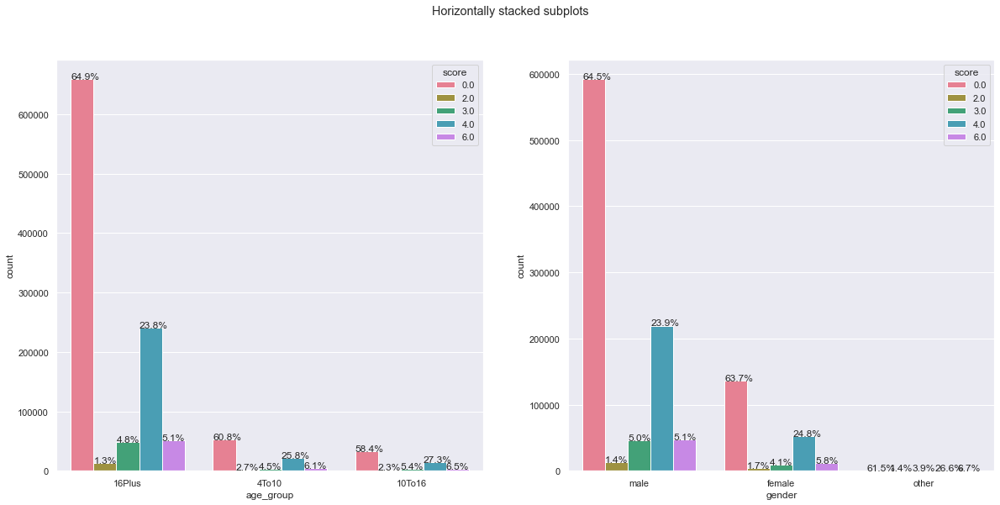

In [113]:
#plt.figure(figsize=(10,10))
def with_hue(ax, feature, Number_of_categories, hue_categories):
    a = [p.get_height() for p in ax.patches]
    patch = [p for p in ax.patches]
    for i in range(Number_of_categories):
        total = feature.value_counts().values[i]
        for j in range(hue_categories):
            percentage = '{:.1f}%'.format(100 * a[(j*Number_of_categories + i)]/total)
            x = patch[(j*Number_of_categories + i)].get_x() + patch[(j*Number_of_categories + i)].get_width() / 2 - 0.08
            y = patch[(j*Number_of_categories + i)].get_y() + patch[(j*Number_of_categories + i)].get_height() 
            ax.annotate(percentage, (x, y), size = 12)
    
    

# def with_hue_1(plot, feature, Number_of_categories, hue_categories):
#     a = [p.get_height() for p in plot.patches]
#     patch = [p for p in plot.patches]
#     for i in range(Number_of_categories):
#         total = feature.value_counts().values[i]
#         for j in range(hue_categories):
#             percentage = '{:.1f}%'.format(100 * a[(j*Number_of_categories + i)]/total)
#             x = patch[(j*Number_of_categories + i)].get_x() + patch[(j*Number_of_categories + i)].get_width() / 2 - 0.08
#             y = patch[(j*Number_of_categories + i)].get_y() + patch[(j*Number_of_categories + i)].get_height() 
#             ax2.annotate(percentage, (x, y), size = 12)
    
    
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,9))
fig.suptitle('Horizontally stacked subplots')
sns.countplot(ax=ax1,data=df, x = "age_group", hue = "score",palette='husl')

sns.countplot(ax=ax2,data=df, x = "gender", hue = "score", palette='husl')
with_hue(ax1,df.age_group,3,5)
with_hue(ax2,df.gender,3,5)

#plt.show()

    
# ax=sns.countplot(data=df, x = "age_group", hue = "score",palette='husl')
# with_hue(ax,df.age_group,3,5)
# plt.show()

Text(0.5, 0.98, 'Comparing Distribution of Scoring Between Different Demographics')

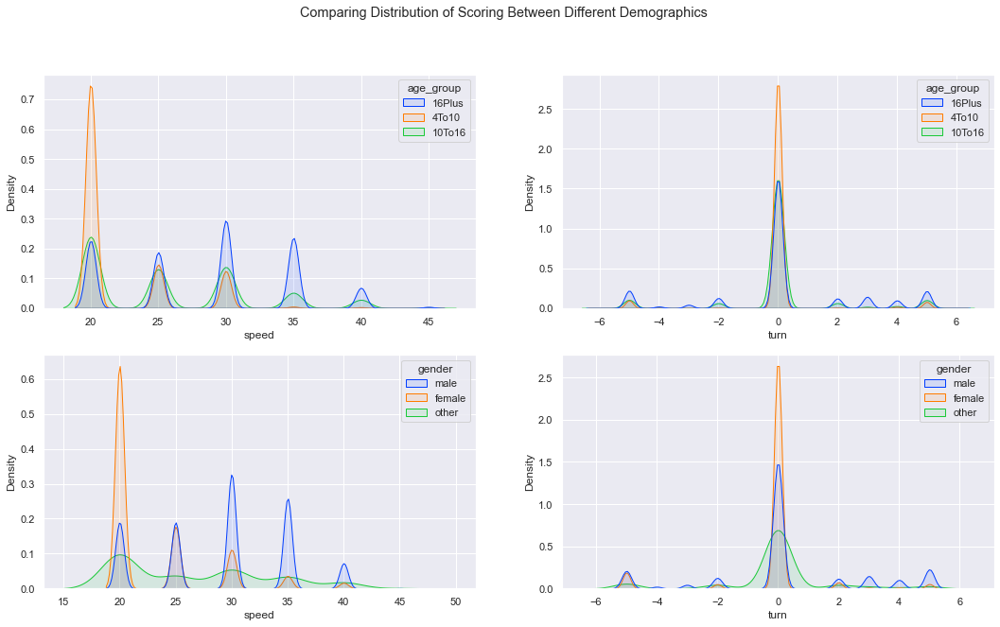

In [114]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

fig.suptitle('Comparing Distribution of Scoring Between Different Demographics')

sns.kdeplot(ax=axes[0, 0], data=df, x = "speed", hue = "age_group", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[0, 1], data=df, x = "turn", hue = "age_group", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[1, 0], data=df, x = "speed", hue = "gender", fill=True, common_norm=False,palette='bright', alpha=0.1)

sns.kdeplot(ax=axes[1, 1], data=df, x = "turn", hue = "gender", fill=True, common_norm=False,palette='bright', alpha=0.1)

plt.show()

In [115]:
df_len= df.groupby(['age_group', 'length']).agg({'length':'count'}).rename(columns={'length':'counts'}).reset_index().pivot(columns='length', index='age_group')  
df_len

counts               
length    Extra Short   Full  Yorker
age_group                           
10To16          20894   3078   31397
16Plus         320864  85177  608191
4To10           56654    266   28661

Text(0.5, 0.98, 'Comparing Performance Between Delivery Types at Different Lengths')

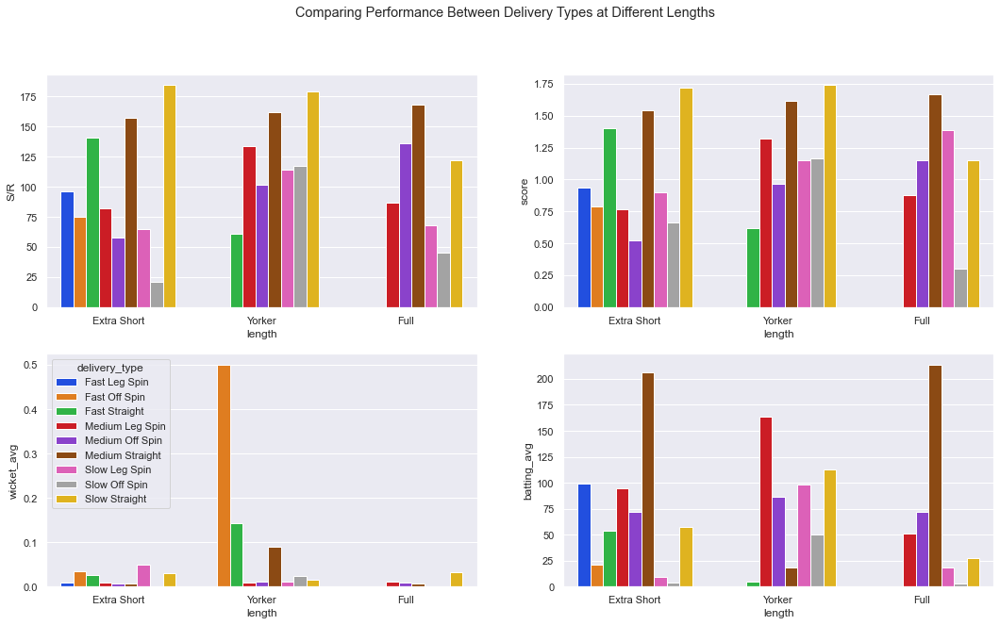

In [1095]:
df_sr =df.copy()
df_sr['total_runs']= df_sr.groupby(['length','delivery_type'])['score'].cumsum()
df_sr['total_deliveries']=df_sr.groupby(['length','delivery_type']).cumcount()+1
df_sr['S/R']=round((df_sr['total_runs']/(df_sr['total_deliveries']+1)*100),2)
mean_sr = df_sr.groupby(['delivery_type','length']).agg({'S/R': 'mean'})
mean_sr=mean_sr.reset_index()



mean_del = df.groupby(['delivery_type','length']).agg({'score': 'mean'})
mean_del=mean_del.reset_index()


df_w = df.copy()
df_w['total_wickets'] =df_w.assign(is_out=df_w['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['delivery_type','length'])['is_out'] \
                        .cumsum()
df_w['total_deliveries']=df_w.groupby(['delivery_type','length']).cumcount()+1

mean_w = df_w.groupby(['delivery_type','length']).agg({'total_wickets': 'max', 'total_deliveries': 'max'})
mean_w['wicket_avg']=mean_w['total_wickets']/mean_w['total_deliveries']
mean_w=mean_w.reset_index()


df_b = df.copy()
df_b['total_wickets'] =df_b.assign(is_out=df_b['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['delivery_type','length'])['is_out'] \
                        .cumsum()
df_b['total_runs']=df_b.groupby(['delivery_type','length'])['score'].cumsum()

mean_b = df_b.groupby(['delivery_type','length']).agg({'total_wickets': 'max', 'total_runs': 'max'})
mean_b['batting_avg']=mean_b['total_runs']/(mean_b['total_wickets']+1)
mean_b=mean_b.reset_index()


fig, axes = plt.subplots(2, 2, figsize=(18, 10))
sns.set(style="darkgrid")
fig.suptitle('Comparing Performance Between Delivery Types at Different Lengths')

a=sns.barplot(ax=axes[0, 0],data=mean_sr, x = "length",y='S/R', hue = "delivery_type",palette='bright')

b=sns.barplot(ax=axes[0, 1], data=mean_del, x = "length",y='score', hue = "delivery_type",palette='bright')

c=sns.barplot(ax=axes[1, 0], data=mean_w, x = "length",y='wicket_avg', hue = "delivery_type",palette='bright')

d=sns.barplot(ax=axes[1, 1], data=mean_b, x = "length",y='batting_avg', hue = "delivery_type",palette='bright')

#plt.figure(figsize=(10, 10))
a.legend_.remove()
b.legend_.remove()
d.legend_.remove()

# Customize the axes and title
plt.show()

In [1102]:
df_plot=df.groupby(['length/type', 'score']).size().reset_index().pivot(columns='score', index='length/type', values=0)
df_plot.fillna(0, inplace=True)
df_plot['total']=df_plot[0] + df_plot[2] + df_plot[3] + df_plot[4] + df_plot[6]
df_plot.sort_values(0, ascending=False)

score,0.0,2.0,3.0,4.0,6.0,total
length/type,,,,,,
S_S_Y,137926.0,2930.0,13384.0,69201.0,15401.0,238842.0
M_S_Y,124138.0,2302.0,13670.0,58886.0,9247.0,208243.0
S_S_ES,96590.0,3999.0,6418.0,45950.0,12076.0,165033.0
M_LS_ES,67527.0,1012.0,1890.0,9709.0,2816.0,82954.0
M_S_ES,55064.0,1044.0,4370.0,21992.0,5443.0,87913.0
M_S_F,52707.0,937.0,4527.0,24456.0,5722.0,88349.0
S_LS_Y,47405.0,978.0,1671.0,11627.0,3569.0,65250.0
S_OS_Y,41156.0,930.0,2566.0,11060.0,2279.0,57991.0
F_S_Y,28802.0,935.0,1135.0,3083.0,641.0,34596.0


In [133]:
df_plot=df_plot.drop(['S_LS_ES' , 'S_OS_F', 'S_LS_F','F_LS_Y','S_OS_ES','F_OS_Y'])

In [1103]:
fields = [0,2,3,4,6]
for i in fields:
    df_plot['{}_Percent'.format(i)] = df_plot[i] / df_plot['total']
df_plot=df_plot.sort_values('0_Percent', ascending=False)
df_plot = df_plot.iloc[-30:]
df_plot

score,0.0,2.0,3.0,4.0,6.0,total,0_Percent,2_Percent,3_Percent,4_Percent,6_Percent
length/type,,,,,,,,,,,
F_OS_Y,2.0,0.0,0.0,0.0,0.0,2.0,1.000000,0.000000,0.000000,0.000000,0.000000
F_LS_Y,7.0,0.0,0.0,0.0,0.0,7.0,1.000000,0.000000,0.000000,0.000000,0.000000
S_OS_F,9.0,0.0,1.0,0.0,0.0,10.0,0.900000,0.000000,0.100000,0.000000,0.000000
M_OS_ES,20944.0,446.0,543.0,1927.0,412.0,24272.0,0.862887,0.018375,0.022371,0.079392,0.016974
S_OS_ES,5.0,0.0,0.0,1.0,0.0,6.0,0.833333,0.000000,0.000000,0.166667,0.000000
F_S_Y,28802.0,935.0,1135.0,3083.0,641.0,34596.0,0.832524,0.027026,0.032807,0.089114,0.018528
M_LS_ES,67527.0,1012.0,1890.0,9709.0,2816.0,82954.0,0.814029,0.012200,0.022784,0.117041,0.033947
M_LS_F,138.0,4.0,3.0,19.0,10.0,174.0,0.793103,0.022989,0.017241,0.109195,0.057471
F_OS_ES,406.0,14.0,18.0,67.0,9.0,514.0,0.789883,0.027237,0.035019,0.130350,0.017510


In [1104]:
df_plot1 = pd.DataFrame(df_plot[['0_Percent', '2_Percent','3_Percent', '4_Percent', '6_Percent']].copy())
df_plot1

score,0_Percent,2_Percent,3_Percent,4_Percent,6_Percent
length/type,,,,,
F_OS_Y,1.000000,0.000000,0.000000,0.000000,0.000000
F_LS_Y,1.000000,0.000000,0.000000,0.000000,0.000000
S_OS_F,0.900000,0.000000,0.100000,0.000000,0.000000
M_OS_ES,0.862887,0.018375,0.022371,0.079392,0.016974
S_OS_ES,0.833333,0.000000,0.000000,0.166667,0.000000
F_S_Y,0.832524,0.027026,0.032807,0.089114,0.018528
M_LS_ES,0.814029,0.012200,0.022784,0.117041,0.033947
M_LS_F,0.793103,0.022989,0.017241,0.109195,0.057471
F_OS_ES,0.789883,0.027237,0.035019,0.130350,0.017510


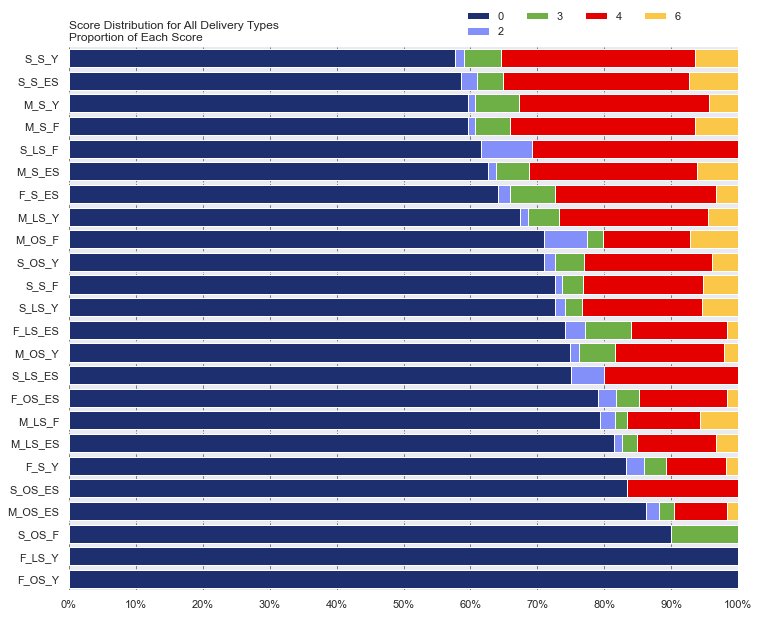

In [1105]:
labels = ['0', '2','3','4','6']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#E50000', '#FAC748']
title = 'Score Distribution for All Delivery Types\n'
subtitle = 'Proportion of Each Score'
def plot_stackedbar_p(df_100, labels, colors, title, subtitle):
    fields = df_100.columns.tolist()
    
    # figure and axis
    fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
    left = len(df_100) * [0]
    for idx, name in enumerate(fields):
        plt.barh(df_100.index, df_100[name], left = left, color=colors[idx])
        left = left + df_100[name]
# title and subtitle
    plt.title(title, loc='left')
    plt.text(0, ax.get_yticks()[-1] + 0.75, subtitle)
# legend
    plt.legend(labels, bbox_to_anchor=([0.58, 1, 0, 0]), ncol=4, frameon=False)
# remove spines
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
# format x ticks
    xticks = np.arange(0,1.1,0.1)
    xlabels = ['{}%'.format(i) for i in np.arange(0,101,10)]
    plt.xticks(xticks, xlabels)
# adjust limits and draw grid lines
    plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
    ax.xaxis.grid(color='gray', linestyle='dashed')
plt.show()
    
plot_stackedbar_p(df_plot1, labels, colors, title, subtitle)

In [82]:
pd.DataFrame((df.groupby(['Batfast_id','Session_no','Event_name','Overs'])["length/type_no"]
                       .apply(lambda x: ",".join(x)).loc[lambda x: x.str.count(",") == 5]).value_counts().loc[lambda x: x>=4].head(21))

,length/type_no
"0_M_S_Y,1_M_S_Y,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_Y",25513
"0_S_S_ES,1_S_S_ES,2_S_S_ES,3_S_S_ES,4_S_S_ES,5_S_S_ES",24073
"0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y",15604
"0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES",14982
"0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F",14898
"0_M_LS_ES,1_M_LS_ES,2_M_OS_ES,3_M_S_ES,4_M_LS_ES,5_M_LS_ES",13670
"0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_S_Y,5_S_LS_Y",12083
"0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_OS_Y,5_S_LS_Y",10850
"0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_S_Y,5_S_OS_Y",9805
"0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_LS_Y,5_S_OS_Y",8870


In [83]:
df['sequence'] = (df.groupby(['Batfast_id','Session_no','Event_name','Overs'])["length/type_no"]
                       .apply(lambda x: ",".join(x)).loc[lambda x: x.str.count(",") == 5]

                   )
df.head(20)

timestamp  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                       
bfs00200002 1          fulham     0     0                2021-07-13 12:15:31   
                                        1                2021-07-13 12:15:55   
                                        2                2021-07-13 12:16:10   
                                        3                2021-07-13 12:16:32   
                                        4                2021-07-13 12:16:52   
                                        5                2021-07-13 12:17:18   
                                  1     6                2021-07-13 12:20:34   
                                        7                2021-07-13 12:20:45   
                                        8                2021-07-13 12:21:02   
                                        9                2021-07-13 12:21:35   
                                        10               2021-07-13 12:21:52   
                                        11               2021-07-13 12:22:12   
                                  2     12               2021-07-13 12:25:36   
                                        13               2021-07-13 12:26:00   
                                        14               2021-07-13 12:26:18   
                                        15               2021-07-13 12:26:46   
                                        16               2021-07-13 12:27:23   
                                        17               2021-07-13 12:27:40   
                                  3     18               2021-07-13 12:31:26   
                                        19               2021-07-13 12:32:04   

                                                           batfast_id  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                
bfs00200002 1          fulham     0     0                 bfs00200002   
                                        1                 bfs00200002   
                                        2                 bfs00200002   
                                        3                 bfs00200002   
                                        4                 bfs00200002   
                                        5                 bfs00200002   
                                  1     6                 bfs00200002   
                                        7                 bfs00200002   
                                        8                 bfs00200002   
                                        9                 bfs00200002   
                                        10                bfs00200002   
                                        11                bfs00200002   
                                  2     12                bfs00200002   
                                        13                bfs00200002   
                                        14                bfs00200002   
                                        15                bfs00200002   
                                        16                bfs00200002   
                                        17                bfs00200002   
                                  3     18                bfs00200002   
                                        19                bfs00200002   

                                                         client_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced               
bfs00200002 1          fulham     0     0                      sixes   
                                        1                      sixes   
                                        2                      sixes   
                                        3                      sixes   
                                        4                      sixes   
                                        5                      sixes   
                                  1     6                      sixes   
                                        7          

In [85]:
df_reg= df.dropna(subset=['sequence'])

In [86]:
df_reg['sequence'].value_counts()

0_M_S_Y,1_M_S_Y,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_Y          153078
0_S_S_ES,1_S_S_ES,2_S_S_ES,3_S_S_ES,4_S_S_ES,5_S_S_ES    144438
0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y          93624
0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES     89892
0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F           89388
                                                          ...  
0_M_S_ES,1_S_S_Y,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES          6
0_S_S_ES,1_S_S_ES,2_S_S_ES,3_M_S_F,4_S_S_ES,5_S_S_ES          6
0_M_LS_ES,1_M_LS_ES,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_ES          6
0_S_S_Y,1_F_LS_ES,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y             6
0_S_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_S_S_ES         6
Name: sequence, Length: 1637, dtype: int64

In [87]:
(df_reg.groupby(['Batfast_id','Session_no','Event_name','Overs'])["length/type_no"]
                       .apply(lambda x: ",".join(x)).loc[lambda x: x.str.count(",") == 5]).value_counts().loc[lambda x: x>=4].head(70)

0_M_S_Y,1_M_S_Y,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_Y            25513
0_S_S_ES,1_S_S_ES,2_S_S_ES,3_S_S_ES,4_S_S_ES,5_S_S_ES      24073
0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y           15604
0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES      14982
0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F            14898
                                                           ...  
0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_OS_Y,5_M_OS_Y            25
0_M_LS_Y,1_M_LS_Y,2_S_LS_Y,3_S_S_Y,4_S_OS_Y,5_S_LS_Y          25
0_M_S_Y,1_M_S_Y,2_M_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y              25
0_M_LS_ES,1_M_LS_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES       25
0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_ES,4_M_LS_ES,5_M_LS_ES       24
Name: length/type_no, Length: 70, dtype: int64

In [247]:
df_reg['session_no'] = pd.concat([x.groupby('day_month_year').ngroup()+1 for _,x in df_reg.groupby('batfast_id')])
df_reg['deliveries_faced']=df_reg.groupby(['batfast_id','day_month_year']).cumcount()
df_reg['overs']=df_reg['deliveries_faced']//6
df_reg['runs']=df_reg.groupby(['batfast_id','day_month_year'])['score'].cumsum()
df_reg['no_of_wickets'] = df_reg.assign(is_out=df_reg['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['batfast_id', 'day_month_year'])['is_out'] \
                        .cumsum()
df_reg['total_runs']=df_reg.groupby(['batfast_id'])['score'].cumsum()
df_reg["total_overs"]=df_reg.groupby(['batfast_id']).cumcount()//6
df_reg['total_deliveries']=df_reg.groupby(['batfast_id']).cumcount()
df_reg['total_wickets'] =df_reg.assign(is_out=df_reg['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['batfast_id'])['is_out'] \
                        .cumsum()
df_reg['S/R'] = round((df_reg['runs']/(df_reg['deliveries_faced']+1)*100),2)
df_reg['batting_avg']=df_reg['total_runs']/(df_reg['total_wickets']+1)
df_reg['run_rate']=round((df_reg['runs']/((df_reg['deliveries_faced']+1)/6)),2)
df_reg['runs_per_over']= df_reg.groupby(['batfast_id','session_no','overs'])['score'].cumsum()

<ipython-input-247-9cbfc1ed8288>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-247-9cbfc1ed8288>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-247-9cbfc1ed8288>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-247-9cb

In [248]:
df_reg = df_reg.set_index(['batfast_id','session_no','event_name','overs', 'deliveries_faced'],drop=False)
df_reg.sort_index(inplace=True)

In [249]:
df_reg.rename_axis(['Batfast_id','Session_no','Event_name','Overs', 'Deliveries_faced'],inplace=True)

In [1113]:
df_grp = round(df_reg.groupby(['sequence', 'length/type_no'])[['score']].mean(),2)
# df_grp['sequence']=df_grp['sequence'].astype('category')
# df_grp['length/type']=df_grp['length/type'].astype('category')
#df_grp.reset_index(level=1, inplace=True)

df_grp


score
sequence                                           length/type_no       
0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_... 0_F_LS_ES        0.39
                                                   1_F_LS_ES        1.01
                                                   2_F_LS_ES        0.77
                                                   3_F_LS_ES        1.17
                                                   4_F_LS_ES        1.13
...                                                                  ...
0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y    1_S_S_Y          1.45
                                                   2_S_S_Y          1.52
                                                   3_S_S_Y          1.61
                                                   4_S_S_Y          1.91
                                                   5_S_S_Y          1.81

[9822 rows x 1 columns]

In [1114]:

#df_reg= df_reg[df_reg['sequence'].notna()]
df2 = df_reg.set_index(['sequence', 'length/type_no'])

df2 = df2[[]].merge(df_grp, left_index=True, right_index=True)

In [1115]:
df2 = df2[~df2.index.duplicated(keep='first')]
df2

score
sequence                                           length/type_no       
0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_... 0_F_LS_ES        0.39
                                                   1_F_LS_ES        1.01
                                                   2_F_LS_ES        0.77
                                                   3_F_LS_ES        1.17
                                                   4_F_LS_ES        1.13
...                                                                  ...
0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y    1_S_S_Y          1.45
                                                   2_S_S_Y          1.52
                                                   3_S_S_Y          1.61
                                                   4_S_S_Y          1.91
                                                   5_S_S_Y          1.81

[9822 rows x 1 columns]

In [1116]:
df2_runs = df2.groupby('sequence')[['score']].cumsum().rename(columns={"score" : "runs"})
df2['runs'] = df2_runs.runs
df2.head(12)

score  runs
sequence                                           length/type_no             
0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_... 0_F_LS_ES        0.39  0.39
                                                   1_F_LS_ES        1.01  1.40
                                                   2_F_LS_ES        0.77  2.17
                                                   3_F_LS_ES        1.17  3.34
                                                   4_F_LS_ES        1.13  4.47
                                                   5_F_LS_ES        1.36  5.83
0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_OS_ES,4_F_OS_... 0_F_LS_ES        3.00  3.00
                                                   1_F_LS_ES        0.00  3.00
                                                   2_F_LS_ES        6.00  9.00
                                                   3_F_OS_ES        0.00  9.00
                                                   4_F_OS_ES        0.00  9.00
                                                   5_F_OS_ES        0.00  9.00

In [1117]:
df2['delivery_no']=df2.groupby(['sequence']).cumcount()
df2

score  \
sequence                                           length/type_no          
0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_... 0_F_LS_ES        0.39   
                                                   1_F_LS_ES        1.01   
                                                   2_F_LS_ES        0.77   
                                                   3_F_LS_ES        1.17   
                                                   4_F_LS_ES        1.13   
...                                                                  ...   
0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y    1_S_S_Y          1.45   
                                                   2_S_S_Y          1.52   
                                                   3_S_S_Y          1.61   
                                                   4_S_S_Y          1.91   
                                                   5_S_S_Y          1.81   

                                                                   runs  \
sequence                                           length/type_no         
0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_... 0_F_LS_ES       0.39   
                                                   1_F_LS_ES       1.40   
                                                   2_F_LS_ES       2.17   
                                                   3_F_LS_ES       3.34   
                                                   4_F_LS_ES       4.47   
...                                                                 ...   
0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y    1_S_S_Y         2.54   
                                                   2_S_S_Y         4.06   
                                                   3_S_S_Y         5.67   
                                                   4_S_S_Y         7.58   
                                                   5_S_S_Y         9.39   

                                                                   delivery_no  
sequence                                           length/type_no               
0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_... 0_F_LS_ES                 0  
                                                   1_F_LS_ES                 1  
                                                   2_F_LS_ES                 2  
                                                   3_F_LS_ES                 3  
                                                   4_F_LS_ES                 4  
...                                                                        ...  
0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y    1_S_S_Y                   1  
                                                   2_S_S_Y                   2  
                                                   3_S_S_Y                   3  
                                                   4_S_S_Y                   4  
                                                   5_S_S_Y                   5  

[9822 rows x 3 columns]

In [1118]:
df3 = df2.reset_index()
df3.head(10)

,sequence,length/type_no,score,runs,delivery_no
0,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS...",0_F_LS_ES,0.39,0.39,0
1,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS...",1_F_LS_ES,1.01,1.40,1
2,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS...",2_F_LS_ES,0.77,2.17,2
3,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS...",3_F_LS_ES,1.17,3.34,3
4,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS...",4_F_LS_ES,1.13,4.47,4
5,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS...",5_F_LS_ES,1.36,5.83,5
6,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_OS_ES,4_F_OS...",0_F_LS_ES,3.00,3.00,0
7,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_OS_ES,4_F_OS...",1_F_LS_ES,0.00,3.00,1
8,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_OS_ES,4_F_OS...",2_F_LS_ES,6.00,9.00,2
9,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_OS_ES,4_F_OS...",3_F_OS_ES,0.00,9.00,3


In [1119]:
df100= df3[df3['sequence'].isin(['0_M_S_Y,1_M_S_Y,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_Y',  
                                '0_S_S_ES,1_S_S_ES,2_S_S_ES,3_S_S_ES,4_S_S_ES,5_S_S_ES',
                                '0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y',    
                                '0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES',
                                '0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F',
                                '0_M_LS_ES,1_M_LS_ES,2_M_OS_ES,3_M_S_ES,4_M_LS_ES,5_M_LS_ES',
                                '0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_S_Y,5_S_LS_Y',             
                                '0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_OS_Y,5_S_LS_Y',             
                                '0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_S_Y,5_S_OS_Y',            
                                '0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_LS_Y,5_S_OS_Y',           
                                '0_M_LS_Y,1_M_LS_Y,2_M_S_Y,3_M_OS_Y,4_S_LS_Y,5_M_LS_Y',        
                                '0_M_OS_Y,1_M_OS_Y,2_M_S_Y,3_M_LS_Y,4_S_OS_Y,5_M_OS_Y',           
                                '0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_ES,5_M_LS_ES',          
                                '0_F_S_ES,1_F_S_ES,2_M_S_ES,3_F_S_Y,4_F_S_ES,5_F_S_Y',         
                                '0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_F,5_M_LS_ES',     
                                '0_F_S_ES,1_F_S_ES,2_M_S_F,3_F_S_Y,4_F_S_ES,5_F_S_Y',      
                                '0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_F_S_ES,5_F_S_ES',        
                                '0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y',   
                                '0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_F,5_M_S_F',  
                                '0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES',
                                '0_S_S_Y,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F'])]

In [148]:
import plotly.express as px
fig = px.line(df100, x='delivery_no', y='runs', color='sequence',markers=True)
fig.update_layout(
    height=700,
)
#fig.update_traces(mode='markers+lines')

In [1120]:
df_100= df_reg[df_reg['sequence'].isin(['0_M_S_Y,1_M_S_Y,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_Y',  
                                '0_S_S_ES,1_S_S_ES,2_S_S_ES,3_S_S_ES,4_S_S_ES,5_S_S_ES',
                                '0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y',    
                                '0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES',
                                '0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F',
                                '0_M_LS_ES,1_M_LS_ES,2_M_OS_ES,3_M_S_ES,4_M_LS_ES,5_M_LS_ES',
                                '0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_S_Y,5_S_LS_Y',             
                                '0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_OS_Y,5_S_LS_Y',             
                                '0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_S_Y,5_S_OS_Y',            
                                '0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_LS_Y,5_S_OS_Y',           
                                '0_M_LS_Y,1_M_LS_Y,2_M_S_Y,3_M_OS_Y,4_S_LS_Y,5_M_LS_Y',        
                                '0_M_OS_Y,1_M_OS_Y,2_M_S_Y,3_M_LS_Y,4_S_OS_Y,5_M_OS_Y',           
                                '0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_ES,5_M_LS_ES',          
                                '0_F_S_ES,1_F_S_ES,2_M_S_ES,3_F_S_Y,4_F_S_ES,5_F_S_Y',         
                                '0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_F,5_M_LS_ES',     
                                '0_F_S_ES,1_F_S_ES,2_M_S_F,3_F_S_Y,4_F_S_ES,5_F_S_Y',      
                                '0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_F_S_ES,5_F_S_ES',        
                                '0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y',   
                                '0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_F,5_M_S_F',  
                                '0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES',
                                '0_S_S_Y,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F'])]

In [150]:
df_plot=df_100.groupby(['sequence', 'score']).size().reset_index().pivot(columns='score', index='sequence', values=0)
df_plot.fillna(0, inplace=True)
df_plot['total']=df_plot[0] + df_plot[2] + df_plot[3] + df_plot[4] + df_plot[6]
df_plot.sort_values(0, ascending=False)

score,0.0,2.0,3.0,4.0,6.0,total
sequence,,,,,,
"0_S_S_ES,1_S_S_ES,2_S_S_ES,3_S_S_ES,4_S_S_ES,5_S_S_ES",82588,3404,5840,41747,10859,144438
"0_M_S_Y,1_M_S_Y,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_Y",79558,1690,11874,51833,8123,153078
"0_M_LS_ES,1_M_LS_ES,2_M_OS_ES,3_M_S_ES,4_M_LS_ES,5_M_LS_ES",63185,1103,2610,12231,2891,82020
"0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES",60499,1007,4032,19615,4739,89892
"0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y",57386,1542,4701,24297,5698,93624
"0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F",57154,907,4174,22077,5076,89388
"0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_S_Y,5_S_LS_Y",44558,903,3315,19102,4620,72498
"0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_OS_Y,5_S_LS_Y",42795,808,2842,15167,3488,65100
"0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_S_Y,5_S_OS_Y",36663,889,2813,15178,3287,58830


In [151]:
fields = [0,2,3,4,6]
for i in fields:
    df_plot['{}_Percent'.format(i)] = df_plot[i] / df_plot['total']
df_plot=df_plot.sort_values('0_Percent', ascending=False)
df_plot = df_plot.iloc[-30:]
df_plot

score,0.0,2.0,3.0,4.0,6.0,total,0_Percent,2_Percent,3_Percent,4_Percent,6_Percent
sequence,,,,,,,,,,,
"0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_ES,5_M_LS_ES",26212,624,1079,4390,953,33258,0.788141,0.018762,0.032443,0.131998,0.028655
"0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_F,5_M_LS_ES",16954,404,818,2907,643,21726,0.780355,0.018595,0.037651,0.133803,0.029596
"0_M_LS_ES,1_M_LS_ES,2_M_OS_ES,3_M_S_ES,4_M_LS_ES,5_M_LS_ES",63185,1103,2610,12231,2891,82020,0.770361,0.013448,0.031822,0.149122,0.035248
"0_M_OS_Y,1_M_OS_Y,2_M_S_Y,3_M_LS_Y,4_S_OS_Y,5_M_OS_Y",35033,614,2280,7689,1244,46860,0.747610,0.013103,0.048656,0.164085,0.026547
"0_M_LS_Y,1_M_LS_Y,2_M_S_Y,3_M_OS_Y,4_S_LS_Y,5_M_LS_Y",36226,547,1819,8440,1910,48942,0.740182,0.011176,0.037166,0.172449,0.039026
"0_F_S_ES,1_F_S_ES,2_M_S_ES,3_F_S_Y,4_F_S_ES,5_F_S_Y",19471,518,1188,4365,852,26394,0.737706,0.019626,0.045010,0.165378,0.032280
"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES",808,33,81,163,19,1104,0.731884,0.029891,0.073370,0.147645,0.017210
"0_F_S_ES,1_F_S_ES,2_M_S_F,3_F_S_Y,4_F_S_ES,5_F_S_Y",13089,374,865,3463,527,18318,0.714543,0.020417,0.047221,0.189049,0.028770
"0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES",60499,1007,4032,19615,4739,89892,0.673019,0.011202,0.044854,0.218206,0.052719


In [152]:
df_plot1 = pd.DataFrame(df_plot[['0_Percent', '2_Percent','3_Percent', '4_Percent', '6_Percent']].copy())
df_plot1

score,0_Percent,2_Percent,3_Percent,4_Percent,6_Percent
sequence,,,,,
"0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_ES,5_M_LS_ES",0.788141,0.018762,0.032443,0.131998,0.028655
"0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_F,5_M_LS_ES",0.780355,0.018595,0.037651,0.133803,0.029596
"0_M_LS_ES,1_M_LS_ES,2_M_OS_ES,3_M_S_ES,4_M_LS_ES,5_M_LS_ES",0.770361,0.013448,0.031822,0.149122,0.035248
"0_M_OS_Y,1_M_OS_Y,2_M_S_Y,3_M_LS_Y,4_S_OS_Y,5_M_OS_Y",0.747610,0.013103,0.048656,0.164085,0.026547
"0_M_LS_Y,1_M_LS_Y,2_M_S_Y,3_M_OS_Y,4_S_LS_Y,5_M_LS_Y",0.740182,0.011176,0.037166,0.172449,0.039026
"0_F_S_ES,1_F_S_ES,2_M_S_ES,3_F_S_Y,4_F_S_ES,5_F_S_Y",0.737706,0.019626,0.045010,0.165378,0.032280
"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES",0.731884,0.029891,0.073370,0.147645,0.017210
"0_F_S_ES,1_F_S_ES,2_M_S_F,3_F_S_Y,4_F_S_ES,5_F_S_Y",0.714543,0.020417,0.047221,0.189049,0.028770
"0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES",0.673019,0.011202,0.044854,0.218206,0.052719


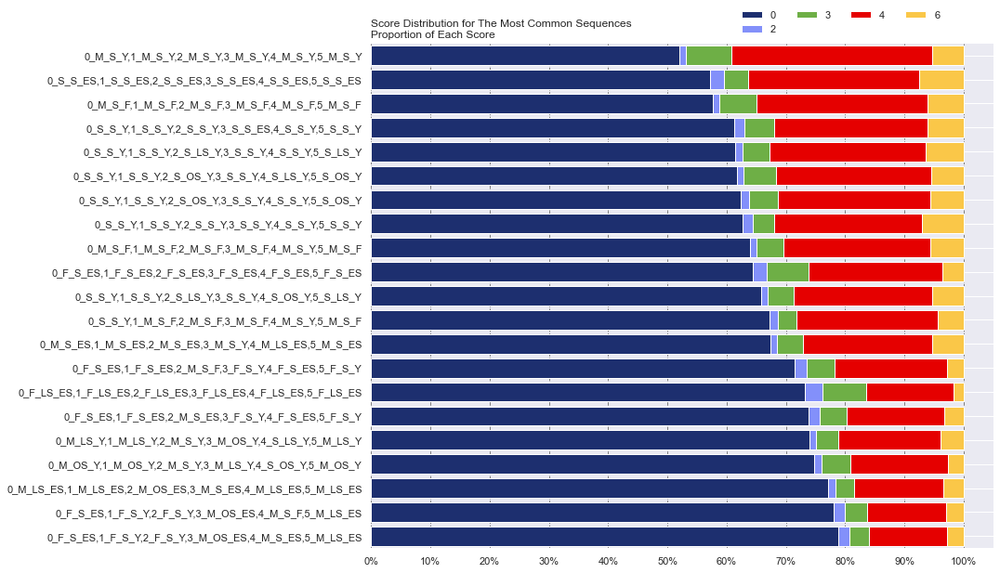

In [153]:
labels = ['0', '2','3','4','6']
colors = ['#1D2F6F', '#8390FA', '#6EAF46', '#E50000', '#FAC748']
title = 'Score Distribution for The Most Common Sequences\n'
subtitle = 'Proportion of Each Score'
def plot_stackedbar_p(df_100, labels, colors, title, subtitle):
    fields = df_100.columns.tolist()
    
    # figure and axis
    fig, ax = plt.subplots(1, figsize=(12, 10))
# plot bars
    left = len(df_100) * [0]
    for idx, name in enumerate(fields):
        plt.barh(df_100.index, df_100[name], left = left, color=colors[idx])
        left = left + df_100[name]
# title and subtitle
    plt.title(title, loc='left')
    plt.text(0, ax.get_yticks()[-1] + 0.75, subtitle)
# legend
    plt.legend(labels, bbox_to_anchor=([0.58, 1, 0, 0]), ncol=4, frameon=False)
# remove spines
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
# format x ticks
    xticks = np.arange(0,1.1,0.1)
    xlabels = ['{}%'.format(i) for i in np.arange(0,101,10)]
    plt.xticks(xticks, xlabels)
# adjust limits and draw grid lines
    plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
    ax.xaxis.grid(color='gray', linestyle='dashed')
plt.show()
    
plot_stackedbar_p(df_plot1, labels, colors, title, subtitle)

In [301]:
cols = ['overs', 'length/type']
df_reg['length/type_count'] = (~df_reg.reset_index().duplicated(subset=cols)
                             ).set_axis(df_reg.index).groupby(level="Overs").cumsum()

df_reg.head(50)



timestamp  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                       
bfs00200002 1          fulham     0     0                2021-07-13 12:15:31   
                                        1                2021-07-13 12:15:55   
                                        2                2021-07-13 12:16:10   
                                        3                2021-07-13 12:16:32   
                                        4                2021-07-13 12:16:52   
                                        5                2021-07-13 12:17:18   
                                  1     6                2021-07-13 12:20:34   
                                        7                2021-07-13 12:20:45   
                                        8                2021-07-13 12:21:02   
                                        9                2021-07-13 12:21:35   
                                        10               2021-07-13 12:21:52   
                                        11               2021-07-13 12:22:12   
                                  2     12               2021-07-13 12:25:36   
                                        13               2021-07-13 12:26:00   
                                        14               2021-07-13 12:26:18   
                                        15               2021-07-13 12:26:46   
                                        16               2021-07-13 12:27:23   
                                        17               2021-07-13 12:27:40   
                                  3     18               2021-07-13 12:31:26   
                                        19               2021-07-13 12:32:04   
                                        20               2021-07-13 12:32:29   
                                        21               2021-07-13 12:32:54   
                                        22               2021-07-13 12:33:10   
                                        23               2021-07-13 12:33:27   
                                  4     24               2021-07-13 12:37:21   
                                        25               2021-07-13 12:37:33   
                                        26               2021-07-13 12:38:01   
                                        27               2021-07-13 12:38:20   
                                        28               2021-07-13 12:39:04   
                                        29               2021-07-13 12:39:23   
                                  5     30               2021-07-13 12:43:38   
                                        31               2021-07-13 12:43:49   
                                        32               2021-07-13 12:44:13   
                                        33               2021-07-13 12:44:28   
                                        34               2021-07-13 12:44:50   
                                        35               2021-07-13 12:45:16   
                                  6     36               2021-07-13 12:49:01   
                                        37               2021-07-13 12:49:24   
                                        38               2021-07-13 12:49:47   
                                        39               2021-07-13 12:50:07   
                                        40               2021-07-13 12:50:21   
                                        41               2021-07-13 12:50:46   
                                  7     42               2021-07-13 12:55:08   
                                        43               2021-07-13 12:55:35   
                                        44               2021-07-13 12:55:47   
                                        45               2021-07-13 12:56:16   
                                        46               2021-07-13 12:56:36   
                                        47               2021-07-13 12:57:09   
                                  8     48               2021-07-13

In [311]:
df_reg['length/type_count'] = df_reg.groupby(['Batfast_id', 'Session_no', 'Event_name', 'Overs'])['length/type'].agg('nunique','cumsum')
df_reg.head(50)                                     

timestamp  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                       
bfs00200002 1          fulham     0     0                2021-07-13 12:15:31   
                                        1                2021-07-13 12:15:55   
                                        2                2021-07-13 12:16:10   
                                        3                2021-07-13 12:16:32   
                                        4                2021-07-13 12:16:52   
                                        5                2021-07-13 12:17:18   
                                  1     6                2021-07-13 12:20:34   
                                        7                2021-07-13 12:20:45   
                                        8                2021-07-13 12:21:02   
                                        9                2021-07-13 12:21:35   
                                        10               2021-07-13 12:21:52   
                                        11               2021-07-13 12:22:12   
                                  2     12               2021-07-13 12:25:36   
                                        13               2021-07-13 12:26:00   
                                        14               2021-07-13 12:26:18   
                                        15               2021-07-13 12:26:46   
                                        16               2021-07-13 12:27:23   
                                        17               2021-07-13 12:27:40   
                                  3     18               2021-07-13 12:31:26   
                                        19               2021-07-13 12:32:04   
                                        20               2021-07-13 12:32:29   
                                        21               2021-07-13 12:32:54   
                                        22               2021-07-13 12:33:10   
                                        23               2021-07-13 12:33:27   
                                  4     24               2021-07-13 12:37:21   
                                        25               2021-07-13 12:37:33   
                                        26               2021-07-13 12:38:01   
                                        27               2021-07-13 12:38:20   
                                        28               2021-07-13 12:39:04   
                                        29               2021-07-13 12:39:23   
                                  5     30               2021-07-13 12:43:38   
                                        31               2021-07-13 12:43:49   
                                        32               2021-07-13 12:44:13   
                                        33               2021-07-13 12:44:28   
                                        34               2021-07-13 12:44:50   
                                        35               2021-07-13 12:45:16   
                                  6     36               2021-07-13 12:49:01   
                                        37               2021-07-13 12:49:24   
                                        38               2021-07-13 12:49:47   
                                        39               2021-07-13 12:50:07   
                                        40               2021-07-13 12:50:21   
                                        41               2021-07-13 12:50:46   
                                  7     42               2021-07-13 12:55:08   
                                        43               2021-07-13 12:55:35   
                                        44               2021-07-13 12:55:47   
                                        45               2021-07-13 12:56:16   
                                        46               2021-07-13 12:56:36   
                                        47               2021-07-13 12:57:09   
                                  8     48               2021-07-13

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Average Runs per Over for Each Length/Type Count')

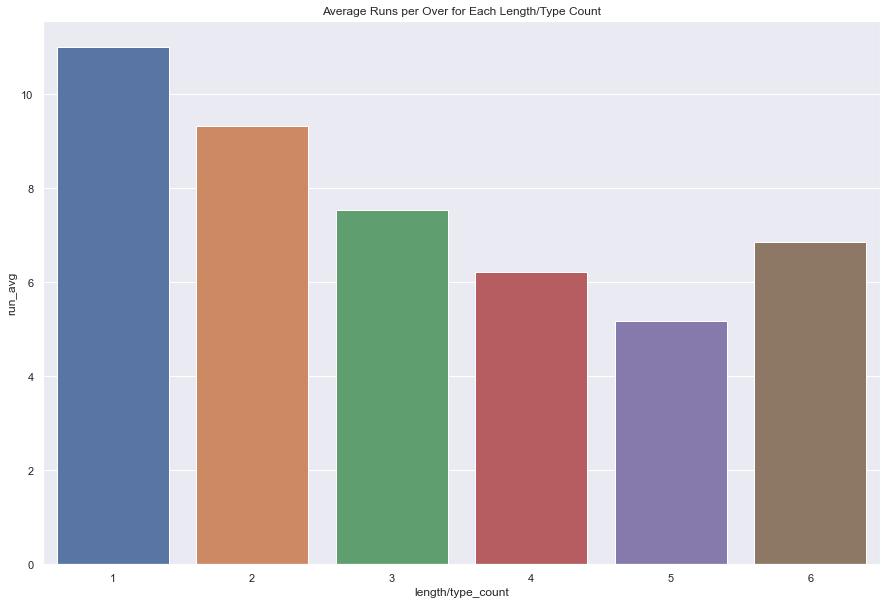

In [900]:
df_fig = df_reg.copy()
#df_fig = df_fig.groupby(['Batfast_id','Session_no','Event_name','Overs']).tail(1)
df_fig["total_overs"]=df_fig.groupby(['length/type_count']).cumcount()//6 +1
df_fig['total_runs']=df_fig.groupby(['length/type_count'])['score'].cumsum()
mean_fig = df_fig.groupby(['length/type_count']).agg({'total_overs': 'max', 'total_runs': 'max'})
mean_fig['run_avg']=mean_fig['total_runs']/mean_fig['total_overs']
mean_fig=mean_fig.reset_index()
plt.figure(figsize=(15,10))



ax = sns.barplot(y='run_avg', x='length/type_count', data=mean_fig)

# Customize the axes and title
plt.title('Average Runs per Over for Each Length/Type Count')
plt.show()

<Figure size 1080x720 with 0 Axes>

,sequence,total_wickets,total_runs,batting_avg
0,"0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_F,5_M_S_F",43.0,5479.0,127.418605
1,"0_M_LS_ES,1_M_LS_ES,2_M_OS_ES,3_M_S_ES,4_M_LS_...",605.0,76306.0,126.125620
2,"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS...",9.0,1075.0,119.444444
3,"0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_OS_Y,5_S_...",791.0,91738.0,115.977244
4,"0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_LS_Y,5_S_...",767.0,83204.0,108.479791
5,"0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y",1502.0,148563.0,98.910120
6,"0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_S_Y,5_S_LS_Y",1251.0,115879.0,92.629097
7,"0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y",67.0,5490.0,81.940299
8,"0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_S_Y,5_S_OS_Y",1350.0,90651.0,67.148889
9,"0_M_S_Y,1_M_S_Y,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_Y",4508.0,295072.0,65.455191


,sequence,total_wickets,total_deliveries,wicket_avg
0,"0_F_S_ES,1_F_S_ES,2_M_S_F,3_F_S_Y,4_F_S_ES,5_F...",1411.0,18318,0.077028
1,"0_S_S_Y,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F",38.0,606,0.062706
2,"0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F",5587.0,89388,0.062503
3,"0_M_LS_Y,1_M_LS_Y,2_M_S_Y,3_M_OS_Y,4_S_LS_Y,5_...",3040.0,48942,0.062114
4,"0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_F,5_M...",1287.0,21726,0.059238
5,"0_M_OS_Y,1_M_OS_Y,2_M_S_Y,3_M_LS_Y,4_S_OS_Y,5_...",2673.0,46860,0.057042
6,"0_F_S_ES,1_F_S_ES,2_M_S_ES,3_F_S_Y,4_F_S_ES,5_...",1424.0,26394,0.053952
7,"0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_ES,5_...",1548.0,33258,0.046545
8,"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_F_S_ES,5...",245.0,5874,0.041709
9,"0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5...",3602.0,89892,0.040070


Text(0.5, 0.98, 'Comparing Features between Classical and Pop Music')

<Figure size 1080x720 with 0 Axes>

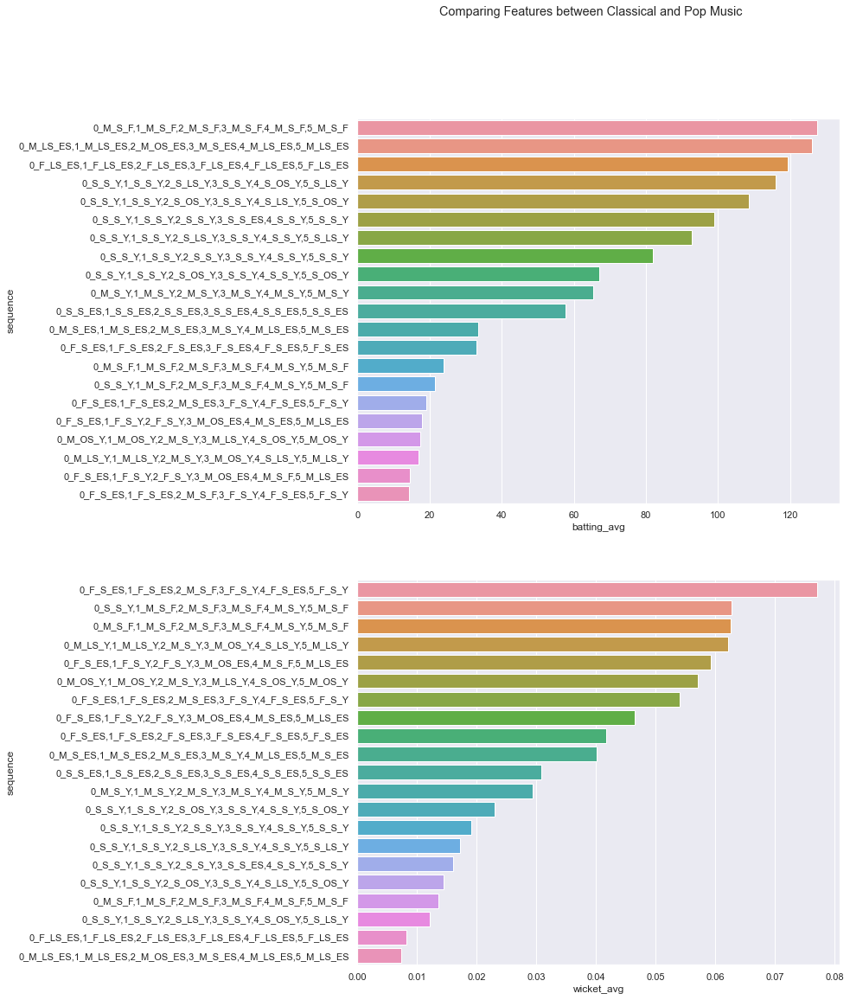

In [1125]:
plt.figure(figsize=(15,10))
df_b = df_100.copy()
df_b['total_wickets'] =df_b.assign(is_out=df_reg['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['sequence'])['is_out'] \
                        .cumsum()
df_b['total_runs']=df_b.groupby(['sequence'])['score'].cumsum()
df_b['total_deliveries']=df_b.groupby(['sequence']).cumcount()+1

mean_b = df_b.groupby(['sequence']).agg({'total_wickets': 'max', 'total_runs': 'max'})
mean_b['batting_avg']=mean_b['total_runs']/mean_b['total_wickets']
mean_b=mean_b.sort_values('batting_avg', ascending=False)
mean_b=mean_b.reset_index()
mean_b

mean_c = df_b.groupby(['sequence']).agg({'total_wickets': 'max', 'total_deliveries': 'max'})
mean_c['wicket_avg']=mean_c['total_wickets']/mean_c['total_deliveries']
mean_c=mean_c.sort_values('wicket_avg', ascending=False)
mean_c=mean_c.reset_index()
mean_c


#ax = sns.barplot(x='batting_avg', y='sequence', data=mean_b)


fig, (ax1,ax2) = plt.subplots(2,1, figsize=(10,18))

fig.suptitle('Comparing Features between Classical and Pop Music')

sns.barplot(ax=ax1, data=mean_b, x = "batting_avg", y = "sequence")

sns.barplot(ax=ax2, data=mean_c, x = "wicket_avg", y = "sequence")


plt.show()


In [164]:
df5=df_reg.groupby(['batfast_id','session_no']).filter(lambda x: len(x) == 30)
#df5=df_reg.groupby(['batfast_id','session_no']).filter(lambda x: (len(x) == 30 or len(x) == 24))
df5

timestamp  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                       
bfs00200003 3          gps        0     0                2021-06-03 14:15:48   
                                        1                2021-06-03 14:16:02   
                                        2                2021-06-03 14:16:16   
                                        3                2021-06-03 14:16:30   
                                        4                2021-06-03 14:16:52   
...                                                                      ...   
bfs6801643  1          manchester 4     25               2021-10-14 19:58:18   
                                        26               2021-10-14 19:58:33   
                                        27               2021-10-14 19:58:45   
                                        28               2021-10-14 19:59:00   
                                        29               2021-10-14 19:59:22   

                                                           batfast_id  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                
bfs00200003 3          gps        0     0                 bfs00200003   
                                        1                 bfs00200003   
                                        2                 bfs00200003   
                                        3                 bfs00200003   
                                        4                 bfs00200003   
...                                                               ...   
bfs6801643  1          manchester 4     25                 bfs6801643   
                                        26                 bfs6801643   
                                        27                 bfs6801643   
                                        28                 bfs6801643   
                                        29                 bfs6801643   

                                                         client_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced               
bfs00200003 3          gps        0     0                      sixes   
                                        1                      sixes   
                                        2                      sixes   
                                        3                      sixes   
                                        4                      sixes   
...                                                              ...   
bfs6801643  1          manchester 4     25                     sixes   
                                        26                     sixes   
                                        27                     sixes   
                                        28                     sixes   
                                        29                     sixes   

                                                          event_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced               
bfs00200003 3          gps        0     0                        gps   
                                        1                        gps   
                                        2                        gps   
                                        3                        gps   
                                        4                        gps   
...                                                              ...   
bfs6801643  1          manchester 4     25                manchester   
                                        26                manchester   
                                        27                manchester   
                                        28                manchester   
                                        29                manchester   

                                                                  game_mode  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                      
bfs00200003 3          gps        0     0   

In [165]:
round(df5.describe(),2)

,score,speed,pitch,swing,pan,turn,session_no,deliveries_faced,overs,runs,no_of_wickets,total_runs,total_overs,total_deliveries,total_wickets,S/R,batting_avg,run_rate,runs_per_over
count,208500.00,208500.00,208500.00,208500.0,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00,208500.00
mean,1.43,28.28,1.67,0.0,0.27,0.14,1.07,14.50,2.00,22.12,0.50,26.39,2.46,17.23,0.59,141.52,18.12,8.49,4.92
std,2.02,6.42,1.41,0.2,1.01,2.18,0.60,8.66,1.41,16.99,0.83,45.47,4.38,26.33,1.24,89.34,18.81,5.36,5.15
min,0.00,20.00,-1.40,-25.0,-5.00,-6.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,20.00,1.00,0.0,0.00,0.00,1.00,7.00,1.00,8.00,0.00,8.00,1.00,7.00,0.00,81.82,6.00,4.91,0.00
50%,0.00,30.00,1.50,0.0,0.00,0.00,1.00,14.50,2.00,19.00,0.00,20.00,2.00,15.00,0.00,135.00,13.50,8.10,4.00
75%,4.00,35.00,3.00,0.0,0.00,0.00,1.00,22.00,3.00,33.00,1.00,34.00,3.00,23.00,1.00,195.00,25.00,11.70,8.00
max,6.00,45.00,3.50,20.0,7.00,6.00,18.00,29.00,4.00,140.00,13.00,1332.00,119.00,719.00,36.00,600.00,508.00,36.00,36.00


In [166]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 208500 entries, ('bfs00200003', 3, 'gps', 0, 0) to ('bfs6801643', 1, 'manchester', 4, 29)
Data columns (total 36 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   timestamp         208500 non-null  datetime64[ns]
 1   batfast_id        208500 non-null  object        
 2   client_name       208500 non-null  object        
 3   event_name        208500 non-null  object        
 4   game_mode         208500 non-null  object        
 5   score             208500 non-null  float64       
 6   speed             208500 non-null  float64       
 7   pitch             208500 non-null  float64       
 8   swing             208500 non-null  float64       
 9   pan               208500 non-null  float64       
 10  turn              208500 non-null  float64       
 11  length            208500 non-null  object        
 12  wicket/dead ball  208500 non-null  object        
 1

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Distribution of Runs Scored by Players who Play 5 Overs')

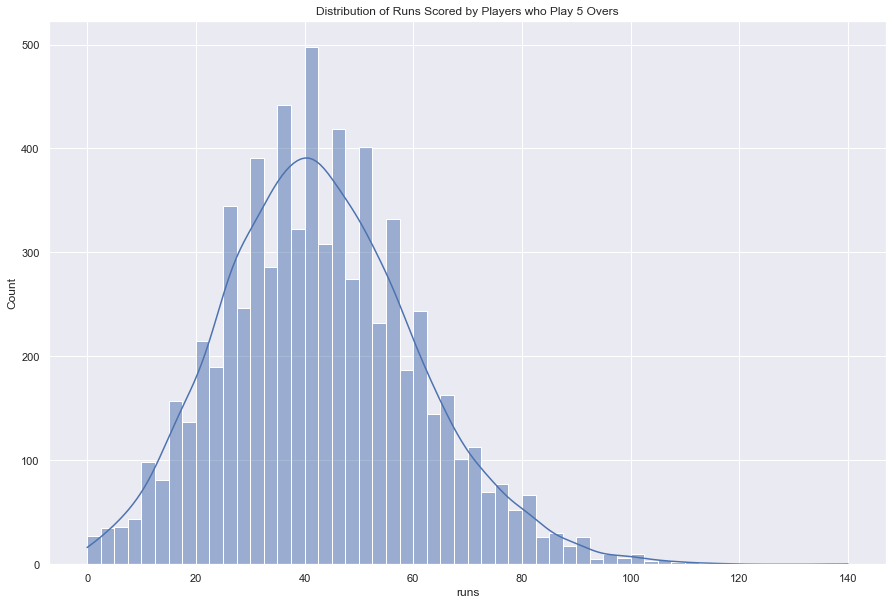

In [167]:
df_plot=df5.groupby(['Batfast_id']).agg({'runs': 'max'})

plt.figure(figsize=(15,10))
sns.histplot(data=df_plot, x="runs", kde=True)
plt.title('Distribution of Runs Scored by Players who Play 5 Overs')

<Figure size 1080x720 with 0 Axes>

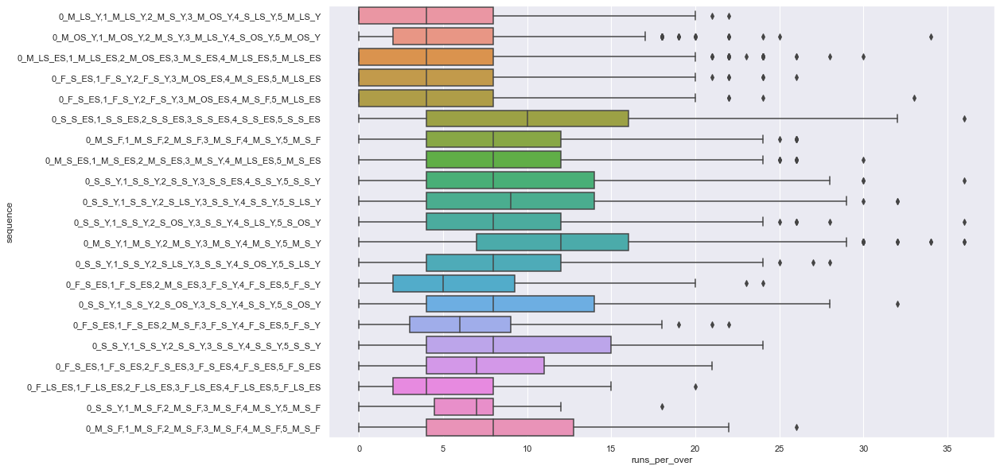

In [176]:
df_plot=df5.groupby(['Batfast_id','Session_no','Event_name','Overs','sequence']).agg({'runs_per_over':'max'})
df_plot=df_plot.reset_index()
df_plot= df_plot[df_plot['sequence'].isin(['0_M_S_Y,1_M_S_Y,2_M_S_Y,3_M_S_Y,4_M_S_Y,5_M_S_Y',  
                                '0_S_S_ES,1_S_S_ES,2_S_S_ES,3_S_S_ES,4_S_S_ES,5_S_S_ES',
                                '0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_ES,4_S_S_Y,5_S_S_Y',    
                                '0_M_S_ES,1_M_S_ES,2_M_S_ES,3_M_S_Y,4_M_LS_ES,5_M_S_ES',
                                '0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F',
                                '0_M_LS_ES,1_M_LS_ES,2_M_OS_ES,3_M_S_ES,4_M_LS_ES,5_M_LS_ES',
                                '0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_S_Y,5_S_LS_Y',             
                                '0_S_S_Y,1_S_S_Y,2_S_LS_Y,3_S_S_Y,4_S_OS_Y,5_S_LS_Y',             
                                '0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_S_Y,5_S_OS_Y',            
                                '0_S_S_Y,1_S_S_Y,2_S_OS_Y,3_S_S_Y,4_S_LS_Y,5_S_OS_Y',           
                                '0_M_LS_Y,1_M_LS_Y,2_M_S_Y,3_M_OS_Y,4_S_LS_Y,5_M_LS_Y',        
                                '0_M_OS_Y,1_M_OS_Y,2_M_S_Y,3_M_LS_Y,4_S_OS_Y,5_M_OS_Y',           
                                '0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_ES,5_M_LS_ES',          
                                '0_F_S_ES,1_F_S_ES,2_M_S_ES,3_F_S_Y,4_F_S_ES,5_F_S_Y',         
                                '0_F_S_ES,1_F_S_Y,2_F_S_Y,3_M_OS_ES,4_M_S_F,5_M_LS_ES',     
                                '0_F_S_ES,1_F_S_ES,2_M_S_F,3_F_S_Y,4_F_S_ES,5_F_S_Y',      
                                '0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_F_S_ES,5_F_S_ES',        
                                '0_S_S_Y,1_S_S_Y,2_S_S_Y,3_S_S_Y,4_S_S_Y,5_S_S_Y',   
                                '0_M_S_F,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_F,5_M_S_F',  
                                '0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES',
                                '0_S_S_Y,1_M_S_F,2_M_S_F,3_M_S_F,4_M_S_Y,5_M_S_F'])]
plt.figure(figsize=(15,10))
sns.boxplot(x=df_plot["runs_per_over"], y=df_plot['sequence'])


In [1077]:
corr_matrix = df_over.corr()

In [1078]:
corr_matrix["difficulty_level"].sort_values(ascending=False)

difficulty_level        1.000000
difficulty_level_T-1    0.495359
no_of_wickets           0.098965
deliveries_faced        0.097707
overs                   0.097707
hour                    0.095706
total_wickets           0.083283
total_deliveries        0.072195
total_overs             0.072195
session_no              0.037054
total_runs              0.025170
runs                   -0.007236
S/R_T-1                -0.012928
batting_avg            -0.059673
run_rate               -0.151811
S/R                    -0.151811
S/R_change             -0.232709
runs_per_over          -0.327547
Name: difficulty_level, dtype: float64

In [327]:
df_a=df_reg[df_reg.groupby('sequence')['sequence'].transform('size') >= 24]

In [328]:
df_a['session_no'] = pd.concat([x.groupby('day_month_year').ngroup()+1 for _,x in df_a.groupby('batfast_id')])
df_a['deliveries_faced']=df_a.groupby(['batfast_id','day_month_year']).cumcount()
df_a['overs']=df_a['deliveries_faced']//6
df_a['runs']=df_a.groupby(['batfast_id','day_month_year'])['score'].cumsum()
df_a['no_of_wickets'] = df_a.assign(is_out=df_a['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['batfast_id', 'day_month_year'])['is_out'] \
                        .cumsum()
df_a['total_runs']=df_a.groupby(['batfast_id'])['score'].cumsum()
df_a["total_overs"]=df_a.groupby(['batfast_id']).cumcount()//6
df_a['total_deliveries']=df_a.groupby(['batfast_id']).cumcount()
df_a['total_wickets'] =df_a.assign(is_out=df_a['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['batfast_id'])['is_out'] \
                        .cumsum()
df_a['S/R'] = round((df_a['runs']/(df_a['deliveries_faced']+1)*100),2)
df_a['batting_avg']=df_a['total_runs']/(df_a['total_wickets']+1)
df_a['run_rate']=round((df_a['runs']/((df_a['deliveries_faced']+1)/6)),2)
df_a['runs_per_over']= df_a.groupby(['batfast_id','session_no','overs'])['score'].cumsum()


<ipython-input-328-75df7ae84e02>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-328-75df7ae84e02>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-328-75df7ae84e02>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-328-75d

In [329]:
df_a = df_a.set_index(['batfast_id','session_no','event_name','overs', 'deliveries_faced'],drop=False)
df_a.sort_index(inplace=True)

In [330]:
df_a.rename_axis(['Batfast_id','Session_no','Event_name','Overs', 'Deliveries_faced'],inplace=True)

In [331]:
df_a['length/type_count'] = df_a.groupby(['Batfast_id', 'Session_no', 'Event_name', 'Overs'])['length/type'].agg('nunique','cumsum')
                           

<Figure size 1080x720 with 0 Axes>

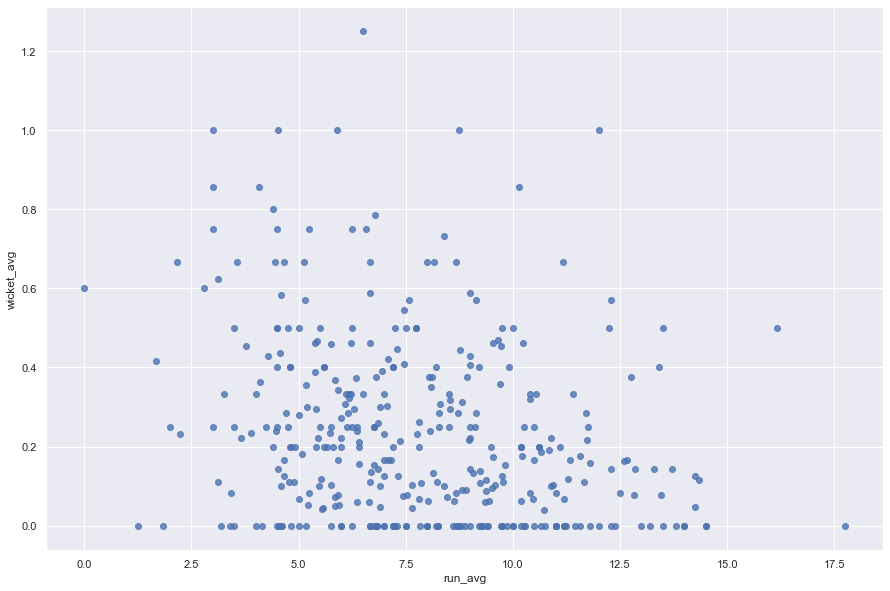

In [414]:
#df_a=df_reg[df_reg.groupby('sequence')['sequence'].transform('size') >= 24]

df_clust = df_a.copy()
df_clust['total_wickets'] =df_clust.assign(is_out=df_clust['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['sequence'])['is_out'] \
                        .cumsum()
df_clust['total_deliveries']=df_clust.groupby(['sequence']).cumcount()
df_clust["total_overs"]=df_clust.groupby(['sequence']).cumcount()//6+1
df_clust['total_runs']=df_clust.groupby(['sequence'])['score'].cumsum()
df_clust = df_clust.groupby(['sequence']).agg({'total_wickets': 'max', 'total_runs': 'max', 'total_overs': 'max', 'total_deliveries': 'max'})
df_clust['wicket_avg']=df_clust['total_wickets']/df_clust['total_overs']
df_clust['run_avg']=df_clust['total_runs']/df_clust['total_overs']
df_clust=df_clust.reset_index()

plt.figure(figsize=(15,10))

ax = sns.regplot(x=df_clust["run_avg"], y=df_clust["wicket_avg"], fit_reg=False)

plt.show()



In [415]:
# df_clust.drop(['total_wickets'], axis=1, inplace=True)
# df_clust.drop(['total_deliveries'], axis=1, inplace=True)
df_clust=df_clust.set_index('sequence')
X = df_clust.iloc[:, [5,4]].values

In [416]:
from sklearn.cluster import KMeans

k=10
kmeans = KMeans(n_clusters=k)
y_pred=kmeans.fit(X)
#print(y_pred)

In [417]:
idx = np.argsort(kmeans.cluster_centers_.sum(axis=1))[::-1]
lut = np.zeros_like(idx)
lut[idx] = np.arange(k)

In [418]:
kmeans.cluster_centers_.sum(axis=1)

array([ 7.27640038, 12.2984755 ,  4.94686099,  9.5931512 , 13.89040179,
        3.07786935,  6.16769852, 10.84499974,  8.53249808, 17.20833333])

In [419]:
idx

array([9, 4, 1, 7, 3, 8, 0, 6, 2, 5])

In [420]:
lut

array([6, 2, 8, 4, 1, 9, 7, 3, 5, 0])

In [421]:
kmeans.labels_

array([6, 2, 0, 8, 8, 5, 6, 3, 5, 2, 6, 8, 0, 2, 0, 0, 0, 5, 8, 2, 0, 1,
       2, 6, 5, 5, 2, 0, 2, 2, 2, 0, 5, 0, 2, 2, 2, 6, 3, 6, 3, 0, 3, 1,
       8, 8, 8, 6, 6, 8, 2, 6, 5, 5, 6, 5, 2, 2, 2, 0, 2, 6, 6, 3, 6, 8,
       2, 6, 2, 3, 0, 6, 3, 3, 0, 3, 6, 0, 5, 6, 0, 5, 5, 7, 2, 2, 2, 2,
       2, 6, 8, 3, 6, 2, 6, 2, 0, 2, 8, 8, 2, 6, 5, 2, 6, 6, 8, 0, 5, 3,
       0, 0, 3, 0, 2, 6, 6, 7, 6, 8, 0, 2, 0, 0, 8, 2, 2, 7, 6, 5, 2, 0,
       7, 0, 8, 6, 3, 7, 3, 8, 2, 5, 0, 2, 3, 4, 7, 3, 7, 3, 3, 6, 5, 1,
       1, 8, 2, 6, 5, 7, 4, 2, 5, 5, 3, 3, 8, 2, 6, 6, 6, 6, 6, 6, 2, 0,
       6, 3, 2, 0, 0, 6, 6, 4, 8, 2, 0, 6, 2, 8, 7, 6, 0, 0, 1, 7, 1, 3,
       7, 3, 4, 1, 1, 8, 4, 7, 1, 3, 3, 3, 1, 0, 2, 2, 0, 2, 0, 6, 3, 4,
       6, 7, 1, 0, 3, 8, 2, 3, 0, 4, 5, 8, 4, 7, 0, 6, 7, 3, 8, 7, 7, 7,
       1, 4, 4, 0, 8, 4, 9, 7, 7, 8, 9, 7, 7, 6, 8, 1, 4, 5, 3, 1, 2, 8,
       8, 0, 1, 6, 7, 7, 2, 2, 2, 1, 0, 6, 0, 0, 0, 8, 2, 0, 8, 0, 7, 3,
       0, 3, 7, 7, 7, 8, 7, 1, 3, 8, 2, 0, 8, 6, 8,

In [422]:
lut[kmeans.labels_]

array([7, 8, 6, 5, 5, 9, 7, 4, 9, 8, 7, 5, 6, 8, 6, 6, 6, 9, 5, 8, 6, 2,
       8, 7, 9, 9, 8, 6, 8, 8, 8, 6, 9, 6, 8, 8, 8, 7, 4, 7, 4, 6, 4, 2,
       5, 5, 5, 7, 7, 5, 8, 7, 9, 9, 7, 9, 8, 8, 8, 6, 8, 7, 7, 4, 7, 5,
       8, 7, 8, 4, 6, 7, 4, 4, 6, 4, 7, 6, 9, 7, 6, 9, 9, 3, 8, 8, 8, 8,
       8, 7, 5, 4, 7, 8, 7, 8, 6, 8, 5, 5, 8, 7, 9, 8, 7, 7, 5, 6, 9, 4,
       6, 6, 4, 6, 8, 7, 7, 3, 7, 5, 6, 8, 6, 6, 5, 8, 8, 3, 7, 9, 8, 6,
       3, 6, 5, 7, 4, 3, 4, 5, 8, 9, 6, 8, 4, 1, 3, 4, 3, 4, 4, 7, 9, 2,
       2, 5, 8, 7, 9, 3, 1, 8, 9, 9, 4, 4, 5, 8, 7, 7, 7, 7, 7, 7, 8, 6,
       7, 4, 8, 6, 6, 7, 7, 1, 5, 8, 6, 7, 8, 5, 3, 7, 6, 6, 2, 3, 2, 4,
       3, 4, 1, 2, 2, 5, 1, 3, 2, 4, 4, 4, 2, 6, 8, 8, 6, 8, 6, 7, 4, 1,
       7, 3, 2, 6, 4, 5, 8, 4, 6, 1, 9, 5, 1, 3, 6, 7, 3, 4, 5, 3, 3, 3,
       2, 1, 1, 6, 5, 1, 0, 3, 3, 5, 0, 3, 3, 7, 5, 2, 1, 9, 4, 2, 8, 5,
       5, 6, 2, 7, 3, 3, 8, 8, 8, 2, 6, 7, 6, 6, 6, 5, 8, 6, 5, 6, 3, 4,
       6, 4, 3, 3, 3, 5, 3, 2, 4, 5, 8, 6, 5, 7, 5,

In [423]:
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=4)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=30, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=50, linewidths=50,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

<Figure size 1080x720 with 0 Axes>

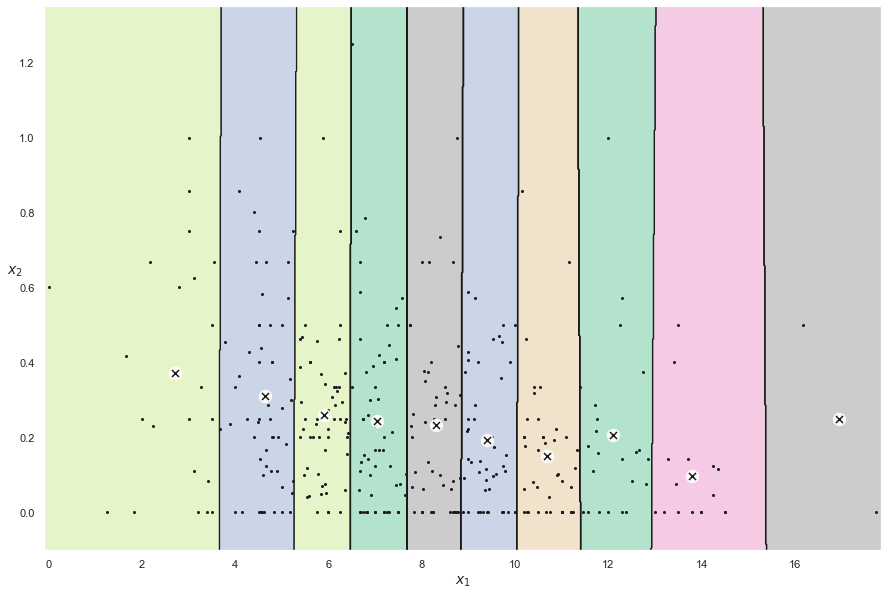

In [424]:
plt.figure(figsize=(15, 10))
plot_decision_boundaries(kmeans, X)
#save_fig("voronoi_diagram")
plt.show()

In [425]:
df_clust['difficulty_level'] = pd.Series(lut[kmeans.labels_], index=df_clust.index)

In [426]:
df_clust.head(40)

,total_wickets,total_runs,total_overs,total_deliveries,wicket_avg,run_avg,difficulty_level
sequence,,,,,,,
"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES",9.0,1075.0,184,1103,0.048913,5.842391,7
"0_F_OS_ES,1_F_OS_ES,2_F_OS_ES,3_F_OS_ES,4_F_OS_ES,5_F_OS_ES",14.0,337.0,70,419,0.200000,4.814286,8
"0_F_S_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES",0.0,27.0,4,23,0.000000,6.750000,6
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_F_S_ES,5_F_S_ES",245.0,8097.0,979,5873,0.250255,8.270684,5
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_F_S_ES,5_F_S_Y",2.0,31.0,4,23,0.500000,7.750000,5
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_S_S_Y,5_F_S_ES",0.0,16.0,5,29,0.000000,3.200000,9
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_S_S_Y,5_S_S_Y",1.0,30.0,5,29,0.200000,6.000000,7
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_S_S_Y,4_S_S_Y,5_S_S_Y",2.0,39.0,4,23,0.500000,9.750000,4
"0_F_S_ES,1_F_S_ES,2_F_S_Y,3_M_OS_ES,4_M_S_ES,5_M_LS_ES",1.0,14.0,4,23,0.250000,3.500000,9


In [427]:
df_clust=df_clust.reset_index()
df_clust.drop(['total_wickets'], axis=1, inplace=True)
df_clust.drop(['total_deliveries'], axis=1, inplace=True)
df_clust.drop(['run_avg'], axis=1, inplace=True)
df_clust.drop(['wicket_avg'], axis=1, inplace=True)
df_clust.drop(['total_runs'], axis=1, inplace=True)
df_clust.drop(['total_overs'], axis=1, inplace=True)


In [428]:
df_over = pd.merge(left=df_a, right=df_clust, left_on='sequence', right_on='sequence')

In [429]:
df_over = df_over.set_index(['batfast_id','session_no','event_name','overs', 'deliveries_faced'],drop=False)
df_over.sort_index(inplace=True)

In [430]:
df_over.rename_axis(['Batfast_id','Session_no','Event_name','Overs', 'Deliveries_faced'],inplace=True)
df_over.head(30)

timestamp  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                       
bfs00200002 1          fulham     0     0                2021-07-13 12:15:31   
                                        1                2021-07-13 12:15:55   
                                        2                2021-07-13 12:16:10   
                                        3                2021-07-13 12:16:32   
                                        4                2021-07-13 12:16:52   
                                        5                2021-07-13 12:17:18   
                                  1     6                2021-07-13 12:20:34   
                                        7                2021-07-13 12:20:45   
                                        8                2021-07-13 12:21:02   
                                        9                2021-07-13 12:21:35   
                                        10               2021-07-13 12:21:52   
                                        11               2021-07-13 12:22:12   
                                  2     12               2021-07-13 12:25:36   
                                        13               2021-07-13 12:26:00   
                                        14               2021-07-13 12:26:18   
                                        15               2021-07-13 12:26:46   
                                        16               2021-07-13 12:27:23   
                                        17               2021-07-13 12:27:40   
                                  3     18               2021-07-13 12:31:26   
                                        19               2021-07-13 12:32:04   
                                        20               2021-07-13 12:32:29   
                                        21               2021-07-13 12:32:54   
                                        22               2021-07-13 12:33:10   
                                        23               2021-07-13 12:33:27   
                                  4     24               2021-07-13 12:37:21   
                                        25               2021-07-13 12:37:33   
                                        26               2021-07-13 12:38:01   
                                        27               2021-07-13 12:38:20   
                                        28               2021-07-13 12:39:04   
                                        29               2021-07-13 12:39:23   

                                                           batfast_id  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                
bfs00200002 1          fulham     0     0                 bfs00200002   
                                        1                 bfs00200002   
                                        2                 bfs00200002   
                                        3                 bfs00200002   
                                        4                 bfs00200002   
                                        5                 bfs00200002   
                                  1     6                 bfs00200002   
                                        7                 bfs00200002   
                                        8                 bfs00200002   
                                        9                 bfs00200002   
                                        10                bfs00200002   
                                        11                bfs00200002   
                                  2     12                bfs00200002   
                                        13                bfs00200002   
                                        14                bfs00200002   
                                        15                bfs00200002   
                                        16                bfs00200002   
                                        17                bfs00200002   
                                  3     18    

In [431]:
df_over['difficulty_level'].value_counts()

4    375186
7    209430
5    164388
2    154722
3    150804
8     59028
6     23430
9       924
1       810
0        60
Name: difficulty_level, dtype: int64

<Figure size 1080x720 with 0 Axes>

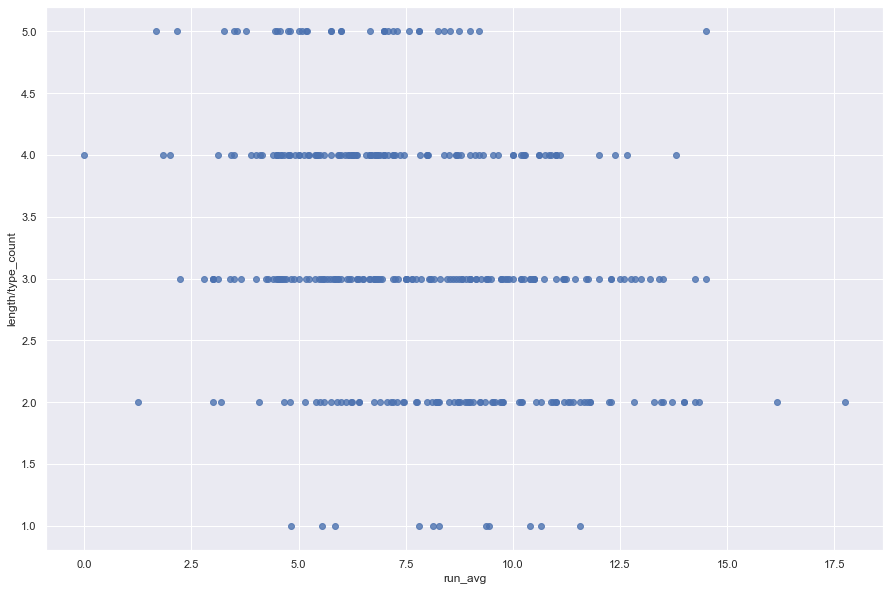

In [432]:
df_clust2 = df_a.copy()


df_clust2["total_overs"]=df_clust2.groupby(['sequence']).cumcount()//6+1
df_clust2['total_runs']=df_clust2.groupby(['sequence'])['score'].cumsum()
df_clust2 = df_clust2.groupby(['sequence']).agg({'total_runs': 'max', 'total_overs': 'max', 'length/type_count' : 'max'})

df_clust2['run_avg']=df_clust2['total_runs']/df_clust2['total_overs']
df_clust2=df_clust2.reset_index()

plt.figure(figsize=(15,10))

ax = sns.regplot(x=df_clust2["run_avg"], y=df_clust2["length/type_count"], fit_reg=False)

plt.show()



In [433]:
df_clust2=df_clust2.set_index('sequence')
X = df_clust2.iloc[:, [3,2]].values

In [434]:
from sklearn.cluster import KMeans

k=5
kmeans = KMeans(n_clusters=k)
y_pred=kmeans.fit(X)

In [435]:
idx = np.argsort(kmeans.cluster_centers_.sum(axis=1))[::-1]
lut = np.zeros_like(idx)
lut[idx] = np.arange(k)

In [436]:
kmeans.cluster_centers_.sum(axis=1)

array([ 7.71468242, 13.50174717,  9.82472454, 16.25115566, 11.44798723])

In [437]:
idx

array([3, 1, 4, 2, 0])

In [438]:
lut

array([4, 1, 3, 0, 2])

In [439]:
kmeans.labels_

array([2, 0, 2, 4, 4, 0, 2, 1, 0, 0, 2, 4, 2, 0, 2, 2, 2, 0, 4, 0, 4, 1,
       0, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 4, 2, 4, 2, 4, 1,
       4, 4, 4, 2, 2, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 4, 2, 4,
       0, 2, 0, 4, 2, 2, 4, 4, 2, 1, 2, 2, 0, 2, 2, 0, 0, 1, 0, 2, 0, 0,
       0, 2, 4, 4, 2, 0, 2, 0, 2, 0, 4, 4, 0, 2, 0, 0, 2, 2, 4, 2, 0, 1,
       2, 2, 4, 2, 0, 2, 2, 1, 2, 4, 2, 0, 4, 4, 4, 0, 0, 1, 2, 0, 0, 2,
       1, 2, 4, 2, 1, 1, 4, 4, 0, 0, 2, 0, 4, 3, 1, 4, 1, 4, 4, 2, 0, 1,
       3, 4, 0, 2, 0, 1, 3, 0, 0, 0, 4, 4, 4, 0, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 4, 0, 2, 2, 2, 2, 3, 4, 0, 2, 2, 2, 4, 1, 2, 2, 4, 1, 1, 3, 1,
       1, 4, 3, 3, 3, 4, 3, 1, 1, 1, 4, 4, 1, 4, 0, 0, 2, 0, 4, 2, 1, 3,
       2, 1, 1, 2, 4, 4, 0, 1, 2, 3, 0, 4, 3, 1, 2, 2, 1, 1, 4, 1, 1, 1,
       3, 3, 3, 4, 4, 3, 3, 1, 1, 4, 3, 1, 1, 2, 4, 1, 3, 0, 1, 3, 0, 4,
       4, 2, 3, 2, 1, 1, 0, 0, 0, 1, 2, 2, 2, 2, 2, 2, 0, 2, 4, 2, 1, 4,
       2, 1, 1, 1, 1, 4, 1, 1, 4, 4, 0, 2, 4, 2, 4,

In [440]:
lut[kmeans.labels_]

array([3, 4, 3, 2, 2, 4, 3, 1, 4, 4, 3, 2, 3, 4, 3, 3, 3, 4, 2, 4, 2, 1,
       4, 3, 4, 4, 4, 3, 4, 4, 4, 3, 4, 3, 4, 4, 4, 3, 2, 3, 2, 3, 2, 1,
       2, 2, 2, 3, 3, 3, 4, 3, 4, 4, 3, 4, 4, 4, 4, 3, 4, 3, 3, 2, 3, 2,
       4, 3, 4, 2, 3, 3, 2, 2, 3, 1, 3, 3, 4, 3, 3, 4, 4, 1, 4, 3, 4, 4,
       4, 3, 2, 2, 3, 4, 3, 4, 3, 4, 2, 2, 4, 3, 4, 4, 3, 3, 2, 3, 4, 1,
       3, 3, 2, 3, 4, 3, 3, 1, 3, 2, 3, 4, 2, 2, 2, 4, 4, 1, 3, 4, 4, 3,
       1, 3, 2, 3, 1, 1, 2, 2, 4, 4, 3, 4, 2, 0, 1, 2, 1, 2, 2, 3, 4, 1,
       0, 2, 4, 3, 4, 1, 0, 4, 4, 4, 2, 2, 2, 4, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 2, 4, 3, 3, 3, 3, 0, 2, 4, 3, 3, 3, 2, 1, 3, 3, 2, 1, 1, 0, 1,
       1, 2, 0, 0, 0, 2, 0, 1, 1, 1, 2, 2, 1, 2, 4, 4, 3, 4, 2, 3, 1, 0,
       3, 1, 1, 3, 2, 2, 4, 1, 3, 0, 4, 2, 0, 1, 3, 3, 1, 1, 2, 1, 1, 1,
       0, 0, 0, 2, 2, 0, 0, 1, 1, 2, 0, 1, 1, 3, 2, 1, 0, 4, 1, 0, 4, 2,
       2, 3, 0, 3, 1, 1, 4, 4, 4, 1, 3, 3, 3, 3, 3, 3, 4, 3, 2, 3, 1, 2,
       3, 1, 1, 1, 1, 2, 1, 1, 2, 2, 4, 3, 2, 3, 2,

In [441]:
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=4)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=30, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=50, linewidths=50,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

<Figure size 1080x720 with 0 Axes>

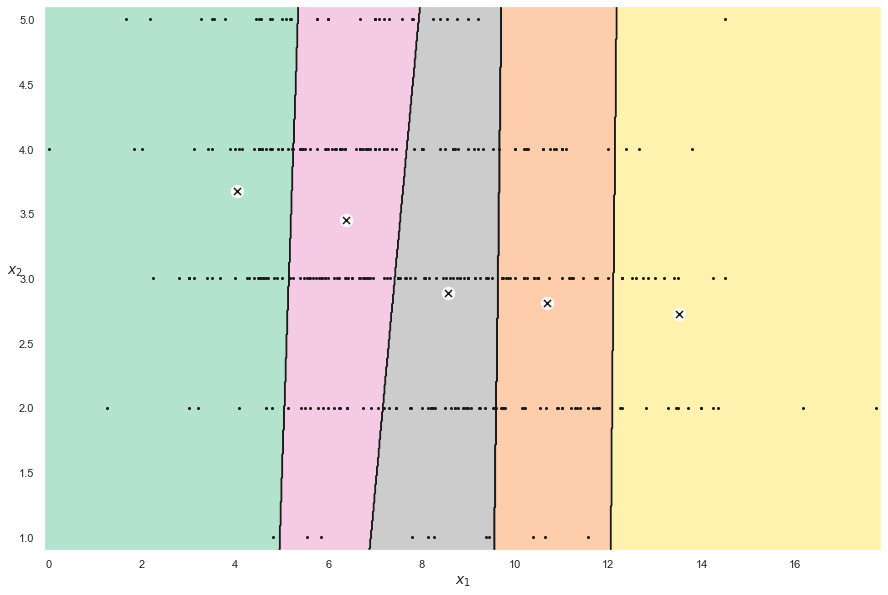

In [442]:
plt.figure(figsize=(15, 10))
plot_decision_boundaries(kmeans, X)
#save_fig("voronoi_diagram")
plt.show()

In [443]:
df_clust2['difficulty_level'] = pd.Series(lut[kmeans.labels_], index=df_clust2.index)

In [384]:
df_clust2.head(50)

,total_runs,total_overs,length/type_count,run_avg,difficulty_level
sequence,,,,,
"0_F_LS_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES",1075.0,184,1,5.842391,8
"0_F_OS_ES,1_F_OS_ES,2_F_OS_ES,3_F_OS_ES,4_F_OS_ES,5_F_OS_ES",337.0,70,1,4.814286,8
"0_F_S_ES,1_F_LS_ES,2_F_LS_ES,3_F_LS_ES,4_F_LS_ES,5_F_LS_ES",27.0,4,2,6.750000,8
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_F_S_ES,5_F_S_ES",8097.0,979,1,8.270684,6
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_F_S_ES,5_F_S_Y",31.0,4,2,7.750000,6
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_S_S_Y,5_F_S_ES",16.0,5,2,3.200000,9
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_F_S_ES,4_S_S_Y,5_S_S_Y",30.0,5,2,6.000000,8
"0_F_S_ES,1_F_S_ES,2_F_S_ES,3_S_S_Y,4_S_S_Y,5_S_S_Y",39.0,4,2,9.750000,4
"0_F_S_ES,1_F_S_ES,2_F_S_Y,3_M_OS_ES,4_M_S_ES,5_M_LS_ES",14.0,4,5,3.500000,7


In [444]:
df_clust2=df_clust2.reset_index()
df_clust2.drop(['total_runs'], axis=1, inplace=True)
df_clust2.drop(['total_overs'], axis=1, inplace=True)
df_clust2.drop(['run_avg'], axis=1, inplace=True)
df_clust2.drop(['length/type_count'], axis=1, inplace=True)

In [445]:
df_over2 = pd.merge(left=df_a, right=df_clust2, left_on='sequence', right_on='sequence')

In [446]:
df_over2 = df_over2.set_index(['batfast_id','session_no','event_name','overs', 'deliveries_faced'],drop=False)
df_over2.sort_index(inplace=True)

In [447]:
df_over2.rename_axis(['Batfast_id','Session_no','Event_name','Overs', 'Deliveries_faced'],inplace=True)
df_over2

timestamp  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                       
bfs00200002 1          fulham     0     0                2021-07-13 12:15:31   
                                        1                2021-07-13 12:15:55   
                                        2                2021-07-13 12:16:10   
                                        3                2021-07-13 12:16:32   
                                        4                2021-07-13 12:16:52   
...                                                                      ...   
bfs901776   1          gps        1     7                2021-05-11 17:45:26   
                                        8                2021-05-11 17:50:49   
                                        9                2021-05-11 17:51:02   
                                        10               2021-05-11 17:53:05   
                                        11               2021-05-11 17:53:34   

                                                           batfast_id  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                
bfs00200002 1          fulham     0     0                 bfs00200002   
                                        1                 bfs00200002   
                                        2                 bfs00200002   
                                        3                 bfs00200002   
                                        4                 bfs00200002   
...                                                               ...   
bfs901776   1          gps        1     7                   bfs901776   
                                        8                   bfs901776   
                                        9                   bfs901776   
                                        10                  bfs901776   
                                        11                  bfs901776   

                                                         client_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced               
bfs00200002 1          fulham     0     0                      sixes   
                                        1                      sixes   
                                        2                      sixes   
                                        3                      sixes   
                                        4                      sixes   
...                                                              ...   
bfs901776   1          gps        1     7                      sixes   
                                        8                      sixes   
                                        9                      sixes   
                                        10                     sixes   
                                        11                     sixes   

                                                         event_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced              
bfs00200002 1          fulham     0     0                    fulham   
                                        1                    fulham   
                                        2                    fulham   
                                        3                    fulham   
                                        4                    fulham   
...                                                             ...   
bfs901776   1          gps        1     7                       gps   
                                        8                       gps   
                                        9                       gps   
                                        10                      gps   
                                        11                      gps   

                                                                  game_mode  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                      
bfs00200002 1          fulham     0     0                

In [448]:
df_over=df_over.groupby(['Batfast_id','Session_no','Event_name','Overs']).tail(1)
df_over2=df_over2.groupby(['Batfast_id','Session_no','Event_name','Overs']).tail(1)

In [449]:
df_over['difficulty_level_T-1'] = df_over['difficulty_level'].shift(periods=1)
df_over2['difficulty_level_T-1'] = df_over2['difficulty_level'].shift(periods=1)

<ipython-input-449-bbe21b95c32e>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [450]:
df_over['S/R_T-1'] = df_over['S/R'].shift(periods=1)
df_over2['S/R_T-1'] = df_over['S/R'].shift(periods=1)
df_over['S/R_change'] = df_over['S/R']-df_over['S/R_T-1']
df_over2['S/R_change'] = df_over2['S/R']-df_over['S/R_T-1']

<ipython-input-450-33c6bf391c1d>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-450-33c6bf391c1d>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [451]:
df_over.drop(df_over.loc[df_over['deliveries_faced']==5].index, inplace=True)
df_over2.drop(df_over2.loc[df_over2['deliveries_faced']==5].index, inplace=True)

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3990: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [452]:
df_over.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 155000 entries, ('bfs00200002', 1, 'fulham', 1, 11) to ('bfs901776', 1, 'gps', 1, 11)
Data columns (total 41 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   timestamp             155000 non-null  datetime64[ns]
 1   batfast_id            155000 non-null  object        
 2   client_name           155000 non-null  object        
 3   event_name            155000 non-null  object        
 4   game_mode             155000 non-null  object        
 5   score                 155000 non-null  float64       
 6   speed                 155000 non-null  float64       
 7   pitch                 155000 non-null  float64       
 8   swing                 155000 non-null  float64       
 9   pan                   155000 non-null  float64       
 10  turn                  155000 non-null  float64       
 11  length                155000 non-null  object        
 12  

In [454]:
df_over.drop(['score'], axis=1, inplace=True)
df_over.drop(['speed'], axis=1, inplace=True)
df_over.drop(['pitch'], axis=1, inplace=True)
df_over.drop(['swing'], axis=1, inplace=True)
df_over.drop(['pan'], axis=1, inplace=True)
df_over.drop(['turn'], axis=1, inplace=True)
df_over.drop(['length'], axis=1, inplace=True)
df_over.drop(['wicket/dead ball'], axis=1, inplace=True)
df_over.drop(['delivery_type'], axis=1, inplace=True)
df_over.drop(['length/type'], axis=1, inplace=True)
df_over.drop(['length/type_no'], axis=1, inplace=True)
df_over.drop(['day_month_year'], axis=1, inplace=True)
df_over.drop(['client_name'], axis=1, inplace=True)
df_over.drop(['batfast_id'], axis=1, inplace=True)
df_over.drop(['timestamp'], axis=1, inplace=True)

In [453]:
df_over.drop(['month_year'], axis=1, inplace=True)
df_over.drop(['sequence'], axis=1, inplace=True)

In [729]:
df_over.head(20)

event_name  \
Batfast_id  Session_no Event_name Overs Deliveries_faced              
bfs00200002 1          fulham     1     11                   fulham   
                                  2     17                   fulham   
                                  3     23                   fulham   
                                  4     29                   fulham   
                                  5     35                   fulham   
                                  6     41                   fulham   
                                  7     47                   fulham   
                                  8     53                   fulham   
                                  9     59                   fulham   
                                  10    65                   fulham   
                                  11    71                   fulham   
                                  12    77                   fulham   
                                  13    83                   fulham   
                                  14    89                   fulham   
bfs00200003 3          gps        1     11                      gps   
                                  2     17                      gps   
                                  3     23                      gps   
                                  4     29                      gps   
            4          gps        1     11                      gps   
                                  2     17                      gps   

                                                                  game_mode  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                      
bfs00200002 1          fulham     1     11                over_challenge_RR   
                                  2     17                over_challenge_RR   
                                  3     23                over_challenge_RR   
                                  4     29                over_challenge_RR   
                                  5     35                over_challenge_RR   
                                  6     41                over_challenge_RR   
                                  7     47                over_challenge_RR   
                                  8     53                over_challenge_RR   
                                  9     59                over_challenge_RR   
                                  10    65                over_challenge_RR   
                                  11    71                over_challenge_RR   
                                  12    77                over_challenge_RR   
                                  13    83                over_challenge_RR   
                                  14    89                over_challenge_RR   
bfs00200003 3          gps        1     11                over_challenge_RR   
                                  2     17                over_challenge_RR   
                                  3     23                over_challenge_RR   
                                  4     29                over_challenge_RR   
            4          gps        1     11                over_challenge_RR   
                                  2     17                over_challenge_RR   

                                                         gender age_group  \
Batfast_id  Session_no Event_name Overs Deliveries_faced                    
bfs00200002 1          fulham     1     11                 male    16Plus   
                                  2     17                 male    16Plus   
                                  3     23                 male    16Plus   
                                  4     29                 male    16Plus   
                                  5     35                 male    16Plus   
                                  6     41                 male    16Plus   
                                  7     47                 male    16Plus   
                                  8     53                 mal

In [455]:
df_over["gender"].replace({np.nan: "male"}, inplace=True)
df_over["hand"].replace({np.nan: 'RHS'}, inplace=True)
df_over["age_group"].replace({np.nan: "16Plus"}, inplace=True)
df_over["game_mode"].replace({"Whack": "Whack_RR"}, inplace=True)
df_over["game_mode"].replace({"ball_challenge": "over_challenge"}, inplace=True)

In [459]:
#df_over.drop(df_over.loc[df_over['game_mode']=='Continuous'].index, inplace=True)
#df_over.drop(df_over.loc[df_over['game_mode']=='Finish'].index, inplace=True)

In [974]:
df_over.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 155159 entries, ('bfs00200002', 1, 'fulham', 1, 11) to ('bfs901776', 1, 'gps', 1, 11)
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   event_name            155159 non-null  object 
 1   game_mode             155159 non-null  object 
 2   gender                155159 non-null  object 
 3   age_group             155159 non-null  object 
 4   hand                  155159 non-null  object 
 5   session_no            155159 non-null  int64  
 6   deliveries_faced      155159 non-null  int64  
 7   overs                 155159 non-null  int64  
 8   runs                  155159 non-null  float64
 9   no_of_wickets         155159 non-null  float64
 10  total_runs            155159 non-null  float64
 11  total_overs           155159 non-null  int64  
 12  total_deliveries      155159 non-null  int64  
 13  total_wickets         155159 non-null  float64

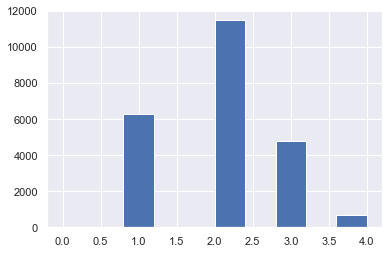

In [1103]:
X_val3["difficulty_level_T-1"].hist()

In [461]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
for train_index, test_val_index in split.split(df_over, df_over["difficulty_level"]):
    strat_train_set = df_over.iloc[train_index]
    strat_test_val_set = df_over.iloc[test_val_index]
    


In [462]:
split2 = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
for test_index, val_index in split2.split(strat_test_val_set, strat_test_val_set["difficulty_level"]):
    strat_test_set = strat_test_val_set.iloc[test_index]
    strat_val_set = strat_test_val_set.iloc[val_index]

In [463]:
strat_test_set["difficulty_level"].value_counts() / len(strat_test_set)

4    0.312989
7    0.200043
2    0.159183
5    0.126710
3    0.113419
8    0.062409
6    0.023699
1    0.000817
9    0.000688
0    0.000043
Name: difficulty_level, dtype: float64

In [464]:
45347/155160
40210/155160
31035/155160
24771/155160
9613/155160
3774/155160
228/155160
141/155160
33/155160
round(8/155160,6)

0.29225960299046144

0.2591518432585718

0.20001933488012374

0.15964810518174788

0.06195540087651456

0.024323279195668988

0.0014694508894044858

0.0009087393658159319

0.00021268368136117557

5.2e-05

In [465]:
strat_test_set.head()

,,,,,event_name,game_mode,gender,age_group,hand,session_no,deliveries_faced,overs,runs,no_of_wickets,...,S/R,batting_avg,run_rate,runs_per_over,hour,length/type_count,difficulty_level,difficulty_level_T-1,S/R_T-1,S/R_change
Batfast_id,Session_no,Event_name,Overs,Deliveries_faced,,,,,,,,,,,,,,,,,,,,,
bfs5501074,1,gps,3,23,gps,over_challenge_RR,male,16Plus,LHS,1,23,3,34.0,2.0,...,141.67,11.333333,8.5,8.0,11,5,8,5.0,144.44,-2.77
bfs00204940,1,gps,4,29,gps,set_over_rr_RR,female,16Plus,LHS,1,29,4,17.0,2.0,...,56.67,5.666667,3.4,3.0,17,1,3,4.0,58.33,-1.66
bfs5302111,1,gps,4,29,gps,set_over_rr_RR,male,16Plus,RHS,1,29,4,66.0,0.0,...,220.00,66.000000,13.2,13.0,17,3,5,2.0,220.83,-0.83
bfs6500810,1,gps,1,11,gps,set_over_rr_RR,male,16Plus,RHS,1,11,1,8.0,1.0,...,66.67,4.000000,4.0,8.0,17,1,2,5.0,0.00,66.67
bfs6500485,1,gps,2,17,gps,set_over_rr_RR,male,16Plus,RHS,1,17,2,6.0,1.0,...,33.33,3.000000,2.0,0.0,21,2,4,7.0,50.00,-16.67


In [466]:
X_train = strat_train_set.drop("difficulty_level", axis=1)
y_train = strat_train_set['difficulty_level']
X_test = strat_test_set.drop("difficulty_level", axis=1)
y_test = strat_test_set['difficulty_level']
X_val = strat_val_set.drop("difficulty_level", axis=1)
y_val = strat_val_set['difficulty_level']


In [467]:
X_train.shape
X_test.shape
X_val.shape

(108499, 23)

(23250, 23)

(23250, 23)

In [486]:
from sklearn.feature_extraction import DictVectorizer

# Convert df into a dictionary using .to_dict(): df_dict
df_dict = X_train.to_dict("records")

# Create the DictVectorizer object: dv
dv = DictVectorizer(sparse=False)

# Apply dv on df_dict: df_encoded
X_encoded = dv.fit_transform(df_dict)

X_encoded = pd.DataFrame(X_encoded)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

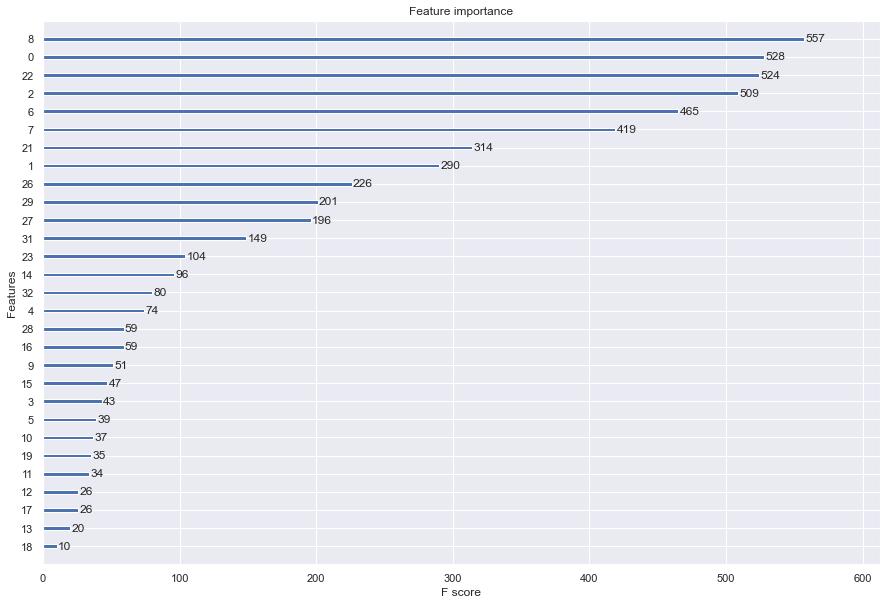

In [495]:
from xgboost import XGBRegressor
from xgboost import plot_importance
from matplotlib import pyplot

model = XGBRegressor()
model.fit(X_encoded, y_train)
# plot feature importance

ax = plot_importance(model)
fig = ax.figure
fig.set_size_inches(15, 10)
pyplot.show()

In [493]:
# Use pprint to make the vocabulary easier to read
import pprint
pprint.pprint(dv.vocabulary_)

{'S/R': 0,
 'S/R_T-1': 1,
 'S/R_change': 2,
 'age_group=10To16': 3,
 'age_group=16Plus': 4,
 'age_group=4To10': 5,
 'batting_avg': 6,
 'deliveries_faced': 7,
 'difficulty_level_T-1': 8,
 'event_name=fulham': 9,
 'event_name=gps': 10,
 'event_name=manchester': 11,
 'game_mode=Whack_RR': 12,
 'game_mode=over_challenge': 13,
 'game_mode=over_challenge_RR': 14,
 'game_mode=set_over_rr_RR': 15,
 'gender=female': 16,
 'gender=male': 17,
 'gender=other': 18,
 'hand=LHS': 19,
 'hand=RHS': 20,
 'hour': 21,
 'length/type_count': 22,
 'no_of_wickets': 23,
 'overs': 24,
 'run_rate': 25,
 'runs': 26,
 'runs_per_over': 27,
 'session_no': 28,
 'total_deliveries': 29,
 'total_overs': 30,
 'total_runs': 31,
 'total_wickets': 32}


In [496]:
X_train.drop(['event_name'], axis=1, inplace=True)
X_train.drop(['game_mode'], axis=1, inplace=True)
X_train.drop(['gender'], axis=1, inplace=True)
X_train.drop(['hand'], axis=1, inplace=True)
X_train.drop(['age_group'], axis=1, inplace=True)
X_train.drop(['session_no'], axis=1, inplace=True)
X_train.drop(['total_wickets'], axis=1, inplace=True)
X_train.drop(['no_of_wickets'], axis=1, inplace=True)
X_train.drop(['total_overs'], axis=1, inplace=True)
X_train.drop(['overs'], axis=1, inplace=True)
X_train.drop(['run_rate'], axis=1, inplace=True)
X_test.drop(['event_name'], axis=1, inplace=True)
X_test.drop(['game_mode'], axis=1, inplace=True)
X_test.drop(['gender'], axis=1, inplace=True)
X_test.drop(['hand'], axis=1, inplace=True)
X_test.drop(['age_group'], axis=1, inplace=True)
X_test.drop(['session_no'], axis=1, inplace=True)
X_test.drop(['total_wickets'], axis=1, inplace=True)
X_test.drop(['no_of_wickets'], axis=1, inplace=True)
X_test.drop(['total_overs'], axis=1, inplace=True)
X_test.drop(['overs'], axis=1, inplace=True)
X_test.drop(['run_rate'], axis=1, inplace=True)
X_val.drop(['event_name'], axis=1, inplace=True)
X_val.drop(['game_mode'], axis=1, inplace=True)
X_val.drop(['gender'], axis=1, inplace=True)
X_val.drop(['hand'], axis=1, inplace=True)
X_val.drop(['age_group'], axis=1, inplace=True)
X_val.drop(['session_no'], axis=1, inplace=True)
X_val.drop(['total_wickets'], axis=1, inplace=True)
X_val.drop(['no_of_wickets'], axis=1, inplace=True)
X_val.drop(['total_overs'], axis=1, inplace=True)
X_val.drop(['overs'], axis=1, inplace=True)
X_val.drop(['run_rate'], axis=1, inplace=True)

In [497]:
X_train_num = X_train.select_dtypes(include=[np.number])
# X_train_cat = X_train[['game_mode','gender','event_name','age_group']]
# X_train_cat2 = X_train[['hand']]

X_test_num = X_test.select_dtypes(include=[np.number])
# X_test_cat = X_test[['game_mode','gender','event_name','age_group']]
# X_test_cat2 = X_test[['hand']]

X_val_num = X_val.select_dtypes(include=[np.number])
# X_val_cat = X_val[['game_mode','gender','event_name','age_group']]
# X_val_cat2 = X_val[['hand']]

In [580]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder # just to raise an ImportError if Scikit-Learn < 0.20
from sklearn.preprocessing import OneHotEncoder

num_attribs = list(X_train_num)
#cat_attribs = list(X_train_cat)
#cat_attribs2 = list(X_train_cat2)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), num_attribs),
#        ("cat", OneHotEncoder(), cat_attribs),
#        ("cat2", OrdinalEncoder(), cat_attribs2),
    ])

X_train2 = full_pipeline.fit_transform(X_train)

test_num_attribs = list(X_test_num)
test_cat_attribs = list(X_test_cat)
test_cat_attribs2 = list(X_test_cat2)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), test_num_attribs),
#        ("cat", OneHotEncoder(), test_cat_attribs),
#        ("cat2", OrdinalEncoder(), test_cat_attribs2),
    ])

X_test2 = full_pipeline.fit_transform(X_test)

val_num_attribs = list(X_val_num)
#val_cat_attribs = list(X_val_cat)
#val_cat_attribs2 = list(X_val_cat2)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), val_num_attribs),
#        ("cat", OneHotEncoder(), val_cat_attribs),
#        ("cat2", OrdinalEncoder(), val_cat_attribs2),
    ])

X_val2 = full_pipeline.fit_transform(X_val)

In [581]:
X_train2.shape
X_test2.shape
X_val2.shape

(108499, 12)

(23250, 12)

(23250, 12)

In [500]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(X_train2, y_train)

LinearRegression()

In [501]:
y_lin_pred = lin_reg.predict(X_train2)

In [502]:
import sklearn.metrics as metrics

mae = metrics.mean_absolute_error(y_train, y_lin_pred)
mse = metrics.mean_squared_error(y_train, y_lin_pred)
rmse = np.sqrt(mse) #mse**(0.5)  
r2 = metrics.r2_score(y_train,y_lin_pred)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.5754267884243037
MSE: 0.6230044295166492
RMSE: 0.7893062963873082
R-Squared: 0.8191343242692127


In [724]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()
tree_reg.fit(X_train2, y_train)

DecisionTreeRegressor()

In [725]:
y_tree_pred = tree_reg.predict(X_train2)

In [726]:
import sklearn.metrics as metrics
mae = metrics.mean_absolute_error(y_train, y_tree_pred)
mse = metrics.mean_squared_error(y_train, y_tree_pred)
rmse = np.sqrt(mse)   
r2 = metrics.r2_score(y_train,y_tree_pred)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.036254168684603
MSE: 0.03819367138789696
RMSE: 0.19543201218811868
R-Squared: 0.9889119180266968


In [928]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_tree_pred_test = tree_reg.predict(X_test2)
print("R^2 : ", r2_score(y_test, y_tree_pred_test))
print("MAE :", mean_absolute_error(y_test,y_tree_pred_test))
print("MSE :", mean_squared_error(y_test,y_tree_pred_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, y_tree_pred_test)))

R^2 :  0.7090258689333138
MAE : 0.459786727297337
MSE : 1.0022003728443047
RMSE: 1.0010995818819948


In [953]:
from sklearn import metrics
y_tree_pred_test=np.round(y_tree_pred_test,0)
print(metrics.classification_report(y_test, y_tree_pred_test))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00        19
           2       0.79      0.74      0.77      3701
           3       0.71      0.75      0.73      2637
           4       0.84      0.87      0.85      7277
           5       0.46      0.45      0.46      2946
           6       0.29      0.40      0.34       551
           7       0.71      0.67      0.69      4651
           8       0.91      0.93      0.92      1451
           9       0.00      0.00      0.00        16

    accuracy                           0.73     23250
   macro avg       0.47      0.48      0.48     23250
weighted avg       0.73      0.73      0.73     23250



In [503]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = RandomForestRegressor(n_estimators = 10)
forest_reg.fit(X_train2, y_train)

RandomForestRegressor(n_estimators=10)

In [504]:
y_forest_pred = forest_reg.predict(X_train2)

In [505]:
import sklearn.metrics as metrics
mae = metrics.mean_absolute_error(y_train, y_forest_pred)
mse = metrics.mean_squared_error(y_train, y_forest_pred)
rmse = np.sqrt(mse)   
r2 = metrics.r2_score(y_train,y_forest_pred)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.14913247367913482
MSE: 0.11072988137647807
RMSE: 0.33276099737871634
R-Squared: 0.9678537842270487


In [929]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_forest_pred_test = forest_reg.predict(X_test2)
print("R^2 : ", r2_score(y_test, y_forest_pred_test))
print("MAE :", mean_absolute_error(y_test,y_forest_pred_test))
print("MSE :", mean_squared_error(y_test,y_forest_pred_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, y_forest_pred_test)))

R^2 :  0.8413298173117455
MAE : 0.40822499596304723
MSE : 0.5465067140727989
RMSE: 0.7392609242160706


In [952]:
from sklearn import metrics
y_forest_pred_test=np.round(y_forest_pred_test,0)
print(metrics.classification_report(y_test, y_forest_pred_test))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00        19
           2       0.85      0.76      0.81      3701
           3       0.71      0.80      0.75      2637
           4       0.88      0.85      0.87      7277
           5       0.52      0.44      0.48      2946
           6       0.11      0.60      0.18       551
           7       0.86      0.55      0.67      4651
           8       0.98      0.93      0.96      1451
           9       0.00      0.00      0.00        16

    accuracy                           0.72     23250
   macro avg       0.49      0.49      0.47     23250
weighted avg       0.79      0.72      0.74     23250



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [506]:
from xgboost import XGBRegressor
xgb_reg = xgboost.XGBRegressor()
xgb_reg.fit(X_train2, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [507]:
y_xgb_pred = xgb_reg.predict(X_train2)

In [508]:
mae = metrics.mean_absolute_error(y_train, y_xgb_pred)
mse = metrics.mean_squared_error(y_train, y_xgb_pred)
rmse = np.sqrt(mse) #mse**(0.5)  
r2 = metrics.r2_score(y_train,y_xgb_pred)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.32963163388661093
MSE: 0.3574594679506462
RMSE: 0.5978791415918824
R-Squared: 0.8962252190286657


In [935]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_xgb_pred_test = xgb_reg.predict(X_test2)
print("R^2 : ", r2_score(y_test, y_xgb_pred_test))
print("MAE :", mean_absolute_error(y_test,y_xgb_pred_test))
print("MSE :", mean_squared_error(y_test,y_xgb_pred_test))
print("RMSE:",np.sqrt(mean_squared_error(y_test, y_xgb_pred_test)))

R^2 :  0.865632239351095
MAE : 0.38547636893359566
MSE : 0.4628020344177069
RMSE: 0.6802955493149333


In [936]:
from sklearn import metrics
y_xgb_pred_test=np.round(y_xgb_pred_test,0)
print(metrics.classification_report(y_test, y_xgb_pred_test))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00        19
           2       0.84      0.85      0.85      3701
           3       0.76      0.78      0.77      2637
           4       0.95      0.85      0.89      7277
           5       0.58      0.62      0.60      2946
           6       0.12      0.66      0.20       551
           7       0.89      0.51      0.65      4651
           8       0.97      0.93      0.95      1451
           9       0.00      0.00      0.00        16

    accuracy                           0.74     23250
   macro avg       0.51      0.52      0.49     23250
weighted avg       0.83      0.74      0.77     23250



In [512]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_addons as tfa

In [487]:
pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 581.8/581.8 kB 4.3 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip available: 22.1.2 -> 22.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [513]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, BatchNormalization, Dropout
from tensorflow.keras import optimizers
from keras import backend
from tensorflow.keras.constraints import MaxNorm

In [514]:
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling

In [814]:
# pip install -q pyyaml h5py  # Required to save models in HDF5 format

checkpoint_path1 = r".\notebooks\ANN1.ckpt"

# Create a callback that saves the model's weights
ckpt_callback1 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path1,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [815]:
#def rmse(y_true, y_pred):
#    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model1_one_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

In [816]:
model1 = build_model1_one_hidden_layers()
print('Here is a summary of this model: ')
model1.summary()


Here is a summary of this model: 
Model: "sequential_248"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1208 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1209 (Dense)           (None, 1)                 9         
Total params: 113
Trainable params: 113
Non-trainable params: 0
_________________________________________________________________


In [817]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model1 = build_model1_one_hidden_layers()
print('Here is a summary of this model: ')
model1.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model1.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback1, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_249"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1210 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1211 (Dense)           (None, 1)                 9         
Total params: 113
Trainable params: 113
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 7s 2ms/step - loss: 2.1019 - root_mean_squared_error: 1.4498 - r_square: 0.3898 - mae: 0.9268 - mse: 2.1019 - val_loss: 0.6274 - val_root_mean_squared_error: 0.7921 - val_r_square: 0.8178 - val_mae: 0.5764 - val_mse: 0.6274

Epoch 00001: val_loss improved from inf to 0.62742, saving model to .\notebooks\ANN1.ckpt
Epoch 2/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.6164 - root_mean_squared_error:

3390/3390 [==============================] - 5s 1ms/step - loss: 0.5742 - root_mean_squared_error: 0.7578 - r_square: 0.8333 - mae: 0.5277 - mse: 0.5742 - val_loss: 0.5810 - val_root_mean_squared_error: 0.7623 - val_r_square: 0.8313 - val_mae: 0.5207 - val_mse: 0.5810

Epoch 00046: val_loss did not improve from 0.58026
Epoch 47/100
3390/3390 [==============================] - 5s 1ms/step - loss: 0.5746 - root_mean_squared_error: 0.7580 - r_square: 0.8332 - mae: 0.5266 - mse: 0.5746 - val_loss: 0.5852 - val_root_mean_squared_error: 0.7650 - val_r_square: 0.8301 - val_mae: 0.5358 - val_mse: 0.5852

Epoch 00047: val_loss did not improve from 0.58026
Epoch 48/100
3390/3390 [==============================] - 5s 2ms/step - loss: 0.5750 - root_mean_squared_error: 0.7583 - r_square: 0.8331 - mae: 0.5277 - mse: 0.5750 - val_loss: 0.5810 - val_root_mean_squared_error: 0.7623 - val_r_square: 0.8313 - val_mae: 0.5295 - val_mse: 0.5810

Epoch 00048: val_loss did not improve from 0.58026
Epoch 49/10

In [818]:
# pip install -q pyyaml h5py  # Required to save models in HDF5 format

checkpoint_path2 = r".\notebooks\ANN2.ckpt"

# Create a callback that saves the model's weights
ckpt_callback2 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path2,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [819]:
#def rmse(y_true, y_pred):
#    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model2_one_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

In [820]:
model2 = build_model2_one_hidden_layers()
print('Here is a summary of this model: ')
model2.summary()



Here is a summary of this model: 
Model: "sequential_250"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1212 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1213 (Dense)           (None, 1)                 65        
Total params: 897
Trainable params: 897
Non-trainable params: 0
_________________________________________________________________


In [821]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model2 = build_model2_one_hidden_layers()
print('Here is a summary of this model: ')
model2.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model2.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback2, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_251"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1214 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1215 (Dense)           (None, 1)                 65        
Total params: 897
Trainable params: 897
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 7s 2ms/step - loss: 1.0637 - root_mean_squared_error: 1.0314 - r_square: 0.6912 - mae: 0.6776 - mse: 1.0637 - val_loss: 0.6421 - val_root_mean_squared_error: 0.8013 - val_r_square: 0.8136 - val_mae: 0.6114 - val_mse: 0.6421

Epoch 00001: val_loss improved from inf to 0.64211, saving model to .\notebooks\ANN2.ckpt
Epoch 2/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.5783 - root_mean_squared_error:

3390/3390 [==============================] - 5s 2ms/step - loss: 0.4682 - root_mean_squared_error: 0.6843 - r_square: 0.8640 - mae: 0.4140 - mse: 0.4682 - val_loss: 0.4952 - val_root_mean_squared_error: 0.7037 - val_r_square: 0.8562 - val_mae: 0.4280 - val_mse: 0.4952

Epoch 00044: val_loss did not improve from 0.49229
Epoch 45/100
3390/3390 [==============================] - 5s 2ms/step - loss: 0.4674 - root_mean_squared_error: 0.6837 - r_square: 0.8643 - mae: 0.4143 - mse: 0.4674 - val_loss: 0.4981 - val_root_mean_squared_error: 0.7057 - val_r_square: 0.8554 - val_mae: 0.4357 - val_mse: 0.4981

Epoch 00045: val_loss did not improve from 0.49229
Epoch 46/100
3390/3390 [==============================] - 5s 2ms/step - loss: 0.4675 - root_mean_squared_error: 0.6837 - r_square: 0.8643 - mae: 0.4132 - mse: 0.4675 - val_loss: 0.5046 - val_root_mean_squared_error: 0.7104 - val_r_square: 0.8535 - val_mae: 0.4353 - val_mse: 0.5046

Epoch 00046: val_loss did not improve from 0.49229
Epoch 47/10

3390/3390 [==============================] - 6s 2ms/step - loss: 0.4511 - root_mean_squared_error: 0.6716 - r_square: 0.8691 - mae: 0.3992 - mse: 0.4511 - val_loss: 0.4940 - val_root_mean_squared_error: 0.7028 - val_r_square: 0.8566 - val_mae: 0.4381 - val_mse: 0.4940

Epoch 00092: val_loss did not improve from 0.47766
Epoch 93/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.4502 - root_mean_squared_error: 0.6709 - r_square: 0.8694 - mae: 0.3969 - mse: 0.4502 - val_loss: 0.4882 - val_root_mean_squared_error: 0.6987 - val_r_square: 0.8583 - val_mae: 0.4407 - val_mse: 0.4882

Epoch 00093: val_loss did not improve from 0.47766
Epoch 94/100
3390/3390 [==============================] - 5s 2ms/step - loss: 0.4480 - root_mean_squared_error: 0.6693 - r_square: 0.8698 - mae: 0.3970 - mse: 0.4480 - val_loss: 0.4828 - val_root_mean_squared_error: 0.6949 - val_r_square: 0.8598 - val_mae: 0.4326 - val_mse: 0.4828

Epoch 00094: val_loss did not improve from 0.47766
Epoch 95/10

In [822]:
# pip install -q pyyaml h5py  # Required to save models in HDF5 format

checkpoint_path3 = r".\notebooks\ANN3.ckpt"

# Create a callback that saves the model's weights
ckpt_callback3 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path3,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [823]:
#def rmse(y_true, y_pred):
#    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model3_one_hidden_layers():
    
    model = Sequential()

   
    
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

In [824]:
model3 = build_model3_one_hidden_layers()
print('Here is a summary of this model: ')
model3.summary()



Here is a summary of this model: 
Model: "sequential_252"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1216 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1217 (Dense)           (None, 1)                 129       
Total params: 1,793
Trainable params: 1,793
Non-trainable params: 0
_________________________________________________________________


In [825]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model3 = build_model3_one_hidden_layers()
print('Here is a summary of this model: ')
model3.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model3.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback3, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_253"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1218 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1219 (Dense)           (None, 1)                 129       
Total params: 1,793
Trainable params: 1,793
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.9361 - root_mean_squared_error: 0.9675 - r_square: 0.7282 - mae: 0.6365 - mse: 0.9361 - val_loss: 0.5860 - val_root_mean_squared_error: 0.7655 - val_r_square: 0.8299 - val_mae: 0.5424 - val_mse: 0.5860

Epoch 00001: val_loss improved from inf to 0.58600, saving model to .\notebooks\ANN3.ckpt
Epoch 2/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.5689 - root_mean_squared_er

3390/3390 [==============================] - 7s 2ms/step - loss: 0.4576 - root_mean_squared_error: 0.6764 - r_square: 0.8671 - mae: 0.4059 - mse: 0.4576 - val_loss: 0.4896 - val_root_mean_squared_error: 0.6997 - val_r_square: 0.8579 - val_mae: 0.4478 - val_mse: 0.4896

Epoch 00045: val_loss did not improve from 0.47420
Epoch 46/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.4566 - root_mean_squared_error: 0.6757 - r_square: 0.8675 - mae: 0.4061 - mse: 0.4566 - val_loss: 0.4865 - val_root_mean_squared_error: 0.6975 - val_r_square: 0.8588 - val_mae: 0.4450 - val_mse: 0.4865

Epoch 00046: val_loss did not improve from 0.47420
Epoch 47/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.4537 - root_mean_squared_error: 0.6736 - r_square: 0.8683 - mae: 0.4040 - mse: 0.4537 - val_loss: 0.4837 - val_root_mean_squared_error: 0.6955 - val_r_square: 0.8596 - val_mae: 0.4452 - val_mse: 0.4837

Epoch 00047: val_loss did not improve from 0.47420
Epoch 48/10

In [826]:
checkpoint_path4 = r".\notebooks\ANN4.ckpt"

# Create a callback that saves the model's weights
ckpt_callback4 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path4,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [827]:
def build_model4_three_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(8, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(8, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model4 = build_model4_three_hidden_layers()
print('Here is a summary of this model: ')
model4.summary()

Here is a summary of this model: 
Model: "sequential_254"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1220 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1221 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1222 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1223 (Dense)           (None, 1)                 9         
Total params: 257
Trainable params: 257
Non-trainable params: 0
_________________________________________________________________


In [844]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model4 = build_model4_three_hidden_layers()
print('Here is a summary of this model: ')
model4.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model4.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback4, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_266"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1280 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1281 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1282 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1283 (Dense)           (None, 1)                 9         
Total params: 257
Trainable params: 257
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 8s 2ms/step - loss: 1.7201 - root_mean_squared_error: 1.1754 - r_square: 0.5985 - mae: 0.7877 - mse: 1.7201 - val_loss: 0.5871 - val_root_mean_squared_error: 0.7

3390/3390 [==============================] - 7s 2ms/step - loss: 0.4689 - root_mean_squared_error: 0.6847 - r_square: 0.8639 - mae: 0.4017 - mse: 0.4689 - val_loss: 0.4906 - val_root_mean_squared_error: 0.7005 - val_r_square: 0.8576 - val_mae: 0.4054 - val_mse: 0.4906

Epoch 00046: val_loss did not improve from 0.48204
Epoch 47/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.4668 - root_mean_squared_error: 0.6832 - r_square: 0.8645 - mae: 0.3992 - mse: 0.4668 - val_loss: 0.4802 - val_root_mean_squared_error: 0.6930 - val_r_square: 0.8606 - val_mae: 0.4050 - val_mse: 0.4802

Epoch 00047: val_loss improved from 0.48204 to 0.48022, saving model to .\notebooks\ANN4.ckpt
Epoch 48/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.4641 - root_mean_squared_error: 0.6812 - r_square: 0.8653 - mae: 0.3971 - mse: 0.4641 - val_loss: 0.4837 - val_root_mean_squared_error: 0.6955 - val_r_square: 0.8596 - val_mae: 0.4143 - val_mse: 0.4837

Epoch 00048: val_lo


Epoch 00069: val_loss improved from 0.46826 to 0.46732, saving model to .\notebooks\ANN4.ckpt
Epoch 70/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.4556 - root_mean_squared_error: 0.6750 - r_square: 0.8677 - mae: 0.3879 - mse: 0.4556 - val_loss: 0.4764 - val_root_mean_squared_error: 0.6903 - val_r_square: 0.8617 - val_mae: 0.4057 - val_mse: 0.4764

Epoch 00070: val_loss did not improve from 0.46732
Epoch 71/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.4600 - root_mean_squared_error: 0.6782 - r_square: 0.8664 - mae: 0.3903 - mse: 0.4600 - val_loss: 0.4666 - val_root_mean_squared_error: 0.6831 - val_r_square: 0.8645 - val_mae: 0.3820 - val_mse: 0.4666 loss: 0.4614 - root_mean_squared_error: 0.6793 - r_square: 0.8661 -

Epoch 00071: val_loss improved from 0.46732 to 0.46661, saving model to .\notebooks\ANN4.ckpt
Epoch 72/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.4553 - root_mean_squared_error: 0.6748 - r_squ

In [845]:
checkpoint_path5 = r".\notebooks\ANN5.ckpt"

# Create a callback that saves the model's weights
ckpt_callback5 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path5,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [846]:
def build_model5_three_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(64, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(64, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model5 = build_model5_three_hidden_layers()
print('Here is a summary of this model: ')
model5.summary()

Here is a summary of this model: 
Model: "sequential_267"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1284 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1285 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1286 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1287 (Dense)           (None, 1)                 65        
Total params: 9,217
Trainable params: 9,217
Non-trainable params: 0
_________________________________________________________________


In [847]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model5 = build_model5_three_hidden_layers()
print('Here is a summary of this model: ')
model5.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model5.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback5, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_268"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1288 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1289 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1290 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1291 (Dense)           (None, 1)                 65        
Total params: 9,217
Trainable params: 9,217
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 9s 2ms/step - loss: 0.6453 - root_mean_squared_error: 0.7837 - r_square: 0.8217 - mae: 0.5495 - mse: 0.6453 - val_loss: 0.5806 - val_root_mean_squared_error:

3390/3390 [==============================] - 6s 2ms/step - loss: 0.4033 - root_mean_squared_error: 0.6350 - r_square: 0.8830 - mae: 0.3517 - mse: 0.4033 - val_loss: 0.4234 - val_root_mean_squared_error: 0.6507 - val_r_square: 0.8771 - val_mae: 0.3540 - val_mse: 0.4234

Epoch 00045: val_loss improved from 0.42534 to 0.42336, saving model to .\notebooks\ANN5.ckpt
Epoch 46/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.4034 - root_mean_squared_error: 0.6351 - r_square: 0.8829 - mae: 0.3520 - mse: 0.4034 - val_loss: 0.4416 - val_root_mean_squared_error: 0.6646 - val_r_square: 0.8718 - val_mae: 0.3641 - val_mse: 0.4416

Epoch 00046: val_loss did not improve from 0.42336
Epoch 47/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.4042 - root_mean_squared_error: 0.6358 - r_square: 0.8827 - mae: 0.3527 - mse: 0.4042 - val_loss: 0.4338 - val_root_mean_squared_error: 0.6586 - val_r_square: 0.8741 - val_mae: 0.3628 - val_mse: 0.4338

Epoch 00047: val_lo

In [848]:
checkpoint_path6 = r".\notebooks\ANN6.ckpt"

# Create a callback that saves the model's weights
ckpt_callback6 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path6,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [849]:
def build_model6_three_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(128,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(128, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(128, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model6 = build_model6_three_hidden_layers()
print('Here is a summary of this model: ')
model6.summary()

Here is a summary of this model: 
Model: "sequential_269"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1292 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1293 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1294 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1295 (Dense)           (None, 1)                 129       
Total params: 34,817
Trainable params: 34,817
Non-trainable params: 0
_________________________________________________________________


In [850]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model6 = build_model6_three_hidden_layers()
print('Here is a summary of this model: ')
model6.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model6.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback6, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_270"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1296 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1297 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1298 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1299 (Dense)           (None, 1)                 129       
Total params: 34,817
Trainable params: 34,817
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 10s 2ms/step - loss: 0.6299 - root_mean_squared_error: 0.7733 - r_square: 0.8264 - mae: 0.5257 - mse: 0.6299 - val_loss: 0.5366 - val_root_mean_squared_err


Epoch 00021: val_loss did not improve from 0.44599
Epoch 22/100
3390/3390 [==============================] - 12s 4ms/step - loss: 0.4164 - root_mean_squared_error: 0.6453 - r_square: 0.8791 - mae: 0.3630 - mse: 0.4164 - val_loss: 0.4579 - val_root_mean_squared_error: 0.6767 - val_r_square: 0.8671 - val_mae: 0.3671 - val_mse: 0.4579

Epoch 00022: val_loss did not improve from 0.44599
Epoch 23/100
3390/3390 [==============================] - 11s 3ms/step - loss: 0.4153 - root_mean_squared_error: 0.6445 - r_square: 0.8795 - mae: 0.3612 - mse: 0.4153 - val_loss: 0.4619 - val_root_mean_squared_error: 0.6797 - val_r_square: 0.8659 - val_mae: 0.3810 - val_mse: 0.4619

Epoch 00023: val_loss did not improve from 0.44599
Epoch 24/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.4146 - root_mean_squared_error: 0.6439 - r_square: 0.8796 - mae: 0.3602 - mse: 0.4146 - val_loss: 0.4652 - val_root_mean_squared_error: 0.6821 - val_r_square: 0.8649 - val_mae: 0.3934 - val_mse: 0.4

In [851]:
checkpoint_path7 = r".\notebooks\ANN7.ckpt"

# Create a callback that saves the model's weights
ckpt_callback7 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path7,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [852]:
def build_model7_five_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,Activation('relu')))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(8, Activation('relu')))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(8, Activation('relu')))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    model.add(Dense(8, Activation('relu')))
    
    model.add(Dense(8, Activation('relu')))
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.01
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model7 = build_model7_five_hidden_layers()
print('Here is a summary of this model: ')
model7.summary()

Here is a summary of this model: 
Model: "sequential_271"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1300 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1301 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1302 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1303 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1304 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1305 (Dense)           (None, 1)                 9         
Total params: 401
Trainable params: 401
Non-trainable params: 0
____________________

In [853]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model7 = build_model7_five_hidden_layers()
print('Here is a summary of this model: ')
model7.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model7.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback7, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_272"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1306 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1307 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1308 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1309 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1310 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1311 (Dense)           (None, 1)                 9         
Total params: 401
Trainable params: 401
Non-trainable params: 0
____________________

In [854]:
checkpoint_path8 = r".\notebooks\ANN8.ckpt"

# Create a callback that saves the model's weights
ckpt_callback8 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path8,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [855]:
def build_model8_five_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,Activation('relu')))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(64, Activation('relu')))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(64, Activation('relu')))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    model.add(Dense(64, Activation('relu')))
    
    model.add(Dense(64, Activation('relu')))
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.01
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model8 = build_model8_five_hidden_layers()
print('Here is a summary of this model: ')
model8.summary()

Here is a summary of this model: 
Model: "sequential_273"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1312 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1313 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1314 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1315 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1316 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1317 (Dense)           (None, 1)                 65        
Total params: 17,537
Trainable params: 17,537
Non-trainable params: 0
______________

In [856]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model8 = build_model8_five_hidden_layers()
print('Here is a summary of this model: ')
model8.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model8.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback8, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_274"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1318 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1319 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1320 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1321 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1322 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1323 (Dense)           (None, 1)                 65        
Total params: 17,537
Trainable params: 17,537
Non-trainable params: 0
______________

In [857]:
checkpoint_path9 = r".\notebooks\ANN9.ckpt"

# Create a callback that saves the model's weights
ckpt_callback9 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path9,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [858]:
def build_model9_five_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(1288,Activation('relu')))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(128, Activation('relu')))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(128, Activation('relu')))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    model.add(Dense(128, Activation('relu')))
    
    model.add(Dense(128, Activation('relu')))
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.01
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model9 = build_model9_five_hidden_layers()
print('Here is a summary of this model: ')
model9.summary()

Here is a summary of this model: 
Model: "sequential_275"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1324 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1325 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1326 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1327 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1328 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1329 (Dense)           (None, 1)                 9         
Total params: 401
Trainable params: 401
Non-trainable params: 0
____________________

In [859]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model9 = build_model9_five_hidden_layers()
print('Here is a summary of this model: ')
model9.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model9.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback9, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_276"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1330 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1331 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1332 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1333 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1334 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1335 (Dense)           (None, 1)                 9         
Total params: 401
Trainable params: 401
Non-trainable params: 0
____________________

In [762]:
def random_search_model(n_hidden=1, n_neurons=128, learning_rate=0.01, input_shape=(X_train2.shape[1],)):
    rmse = tf.keras.metrics.RootMeanSquaredError()
    r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape=input_shape))
    for layer in range(n_hidden):
        model.add(keras.layers.Dense(n_neurons, activation='relu', kernel_initializer='he_normal'))
    model.add(keras.layers.Dense(1))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mse',optimizer=optimizer, metrics=[rmse, r_square, 'mae', 'mse'])
    return model

In [763]:
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
random_reg = keras.wrappers.scikit_learn.KerasRegressor(random_search_model)

In [764]:
from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV

param_distribs = {
    "n_hidden": [1,3,5,7],
    "n_neurons": np.arange(32,256),
    "learning_rate": np.arange(0.001,0.1),
    "batch_size": np.arange(32, 64),
}

rnd_search_cv = RandomizedSearchCV(random_reg, param_distribs, n_iter = 10, cv=5)
rnd_search_cv.fit(X_train2, y_train, epochs=100,
                  validation_data = (X_val2, y_val),
                  callbacks = [keras.callbacks.EarlyStopping(patience=20)]
                  )

Epoch 1/100
2412/2412 [==============================] - 5s 2ms/step - loss: 1.3196 - root_mean_squared_error: 1.1487 - r_square: 0.6171 - mae: 0.7491 - mse: 1.3196 - val_loss: 0.6091 - val_root_mean_squared_error: 0.7804 - val_r_square: 0.8232 - val_mae: 0.5569 - val_mse: 0.6091
Epoch 2/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5870 - root_mean_squared_error: 0.7662 - r_square: 0.8297 - mae: 0.5538 - mse: 0.5870 - val_loss: 0.5887 - val_root_mean_squared_error: 0.7672 - val_r_square: 0.8291 - val_mae: 0.5393 - val_mse: 0.5887
Epoch 3/100
2412/2412 [==============================] - 6s 2ms/step - loss: 0.5733 - root_mean_squared_error: 0.7572 - r_square: 0.8336 - mae: 0.5352 - mse: 0.5733 - val_loss: 0.5778 - val_root_mean_squared_error: 0.7602 - val_r_square: 0.8322 - val_mae: 0.5260 - val_mse: 0.5778
Epoch 4/100
2412/2412 [==============================] - 6s 3ms/step - loss: 0.5623 - root_mean_squared_error: 0.7499 - r_square: 0.8368 - mae: 0.5185 - mse:

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4882 - root_mean_squared_error: 0.6987 - r_square: 0.8584 - mae: 0.4189 - mse: 0.4882 - val_loss: 0.5050 - val_root_mean_squared_error: 0.7106 - val_r_square: 0.8534 - val_mae: 0.4308 - val_mse: 0.5050
Epoch 60/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4881 - root_mean_squared_error: 0.6986 - r_square: 0.8584 - mae: 0.4186 - mse: 0.4881 - val_loss: 0.5093 - val_root_mean_squared_error: 0.7136 - val_r_square: 0.8521 - val_mae: 0.4382 - val_mse: 0.5093
Epoch 61/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4876 - root_mean_squared_error: 0.6983 - r_square: 0.8585 - mae: 0.4181 - mse: 0.4876 - val_loss: 0.5012 - val_root_mean_squared_error: 0.7080 - val_r_square: 0.8545 - val_mae: 0.4211 - val_mse: 0.5012
Epoch 62/100
2412/2412 [==============================] - 5s 2ms/step - loss: 0.4874 - root_mean_squared_error: 0.6981 - r_square: 0.8586 - mae: 0.4179 - mse: 0.4874 -

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4806 - root_mean_squared_error: 0.6933 - r_square: 0.8605 - mae: 0.4111 - mse: 0.4806 - val_loss: 0.4979 - val_root_mean_squared_error: 0.7056 - val_r_square: 0.8555 - val_mae: 0.4183 - val_mse: 0.4979
Epoch 89/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4803 - root_mean_squared_error: 0.6930 - r_square: 0.8606 - mae: 0.4114 - mse: 0.4803 - val_loss: 0.4952 - val_root_mean_squared_error: 0.7037 - val_r_square: 0.8562 - val_mae: 0.4105 - val_mse: 0.4952
Epoch 90/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4799 - root_mean_squared_error: 0.6928 - r_square: 0.8607 - mae: 0.4100 - mse: 0.4799 - val_loss: 0.5010 - val_root_mean_squared_error: 0.7078 - val_r_square: 0.8546 - val_mae: 0.4312 - val_mse: 0.5010
Epoch 91/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4803 - root_mean_squared_error: 0.6930 - r_square: 0.8606 - mae: 0.4122 - mse: 0.4803 -

Epoch 17/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5118 - root_mean_squared_error: 0.7154 - r_square: 0.8514 - mae: 0.4485 - mse: 0.5118 - val_loss: 0.5451 - val_root_mean_squared_error: 0.7383 - val_r_square: 0.8418 - val_mae: 0.4868 - val_mse: 0.5451
Epoch 18/100
2412/2412 [==============================] - 5s 2ms/step - loss: 0.5106 - root_mean_squared_error: 0.7145 - r_square: 0.8518 - mae: 0.4469 - mse: 0.5106 - val_loss: 0.5343 - val_root_mean_squared_error: 0.7310 - val_r_square: 0.8449 - val_mae: 0.4672 - val_mse: 0.5343
Epoch 19/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5078 - root_mean_squared_error: 0.7126 - r_square: 0.8526 - mae: 0.4434 - mse: 0.5078 - val_loss: 0.5477 - val_root_mean_squared_error: 0.7401 - val_r_square: 0.8410 - val_mae: 0.4876 - val_mse: 0.5477
Epoch 20/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5067 - root_mean_squared_error: 0.7118 - r_square: 0.8529 - mae: 0.4415 - 

2412/2412 [==============================] - 5s 2ms/step - loss: 0.4681 - root_mean_squared_error: 0.6842 - r_square: 0.8641 - mae: 0.4075 - mse: 0.4681 - val_loss: 0.4982 - val_root_mean_squared_error: 0.7059 - val_r_square: 0.8554 - val_mae: 0.4362 - val_mse: 0.4982
Epoch 75/100
2412/2412 [==============================] - 5s 2ms/step - loss: 0.4665 - root_mean_squared_error: 0.6830 - r_square: 0.8645 - mae: 0.4063 - mse: 0.4665 - val_loss: 0.5037 - val_root_mean_squared_error: 0.7097 - val_r_square: 0.8538 - val_mae: 0.4433 - val_mse: 0.5037
Epoch 76/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4670 - root_mean_squared_error: 0.6833 - r_square: 0.8644 - mae: 0.4080 - mse: 0.4670 - val_loss: 0.4902 - val_root_mean_squared_error: 0.7001 - val_r_square: 0.8577 - val_mae: 0.4130 - val_mse: 0.4902
Epoch 77/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4666 - root_mean_squared_error: 0.6831 - r_square: 0.8645 - mae: 0.4075 - mse: 0.4666 -

Epoch 7/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5406 - root_mean_squared_error: 0.7353 - r_square: 0.8434 - mae: 0.4925 - mse: 0.5406 - val_loss: 0.5515 - val_root_mean_squared_error: 0.7426 - val_r_square: 0.8399 - val_mae: 0.4878 - val_mse: 0.5515
Epoch 8/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5341 - root_mean_squared_error: 0.7308 - r_square: 0.8453 - mae: 0.4823 - mse: 0.5341 - val_loss: 0.5811 - val_root_mean_squared_error: 0.7623 - val_r_square: 0.8313 - val_mae: 0.5321 - val_mse: 0.5811
Epoch 9/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5283 - root_mean_squared_error: 0.7268 - r_square: 0.8470 - mae: 0.4746 - mse: 0.5283 - val_loss: 0.5370 - val_root_mean_squared_error: 0.7328 - val_r_square: 0.8441 - val_mae: 0.4640 - val_mse: 0.5370
Epoch 10/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5241 - root_mean_squared_error: 0.7240 - r_square: 0.8482 - mae: 0.4675 - mse

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4674 - root_mean_squared_error: 0.6836 - r_square: 0.8646 - mae: 0.4110 - mse: 0.4674 - val_loss: 0.4970 - val_root_mean_squared_error: 0.7050 - val_r_square: 0.8557 - val_mae: 0.4452 - val_mse: 0.4970
Epoch 66/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4660 - root_mean_squared_error: 0.6826 - r_square: 0.8650 - mae: 0.4099 - mse: 0.4660 - val_loss: 0.5241 - val_root_mean_squared_error: 0.7239 - val_r_square: 0.8478 - val_mae: 0.4912 - val_mse: 0.5241
Epoch 67/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4663 - root_mean_squared_error: 0.6829 - r_square: 0.8649 - mae: 0.4103 - mse: 0.4663 - val_loss: 0.4858 - val_root_mean_squared_error: 0.6970 - val_r_square: 0.8590 - val_mae: 0.4117 - val_mse: 0.4858
Epoch 68/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4664 - root_mean_squared_error: 0.6829 - r_square: 0.8649 - mae: 0.4099 - mse: 0.4664 -

Epoch 7/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5383 - root_mean_squared_error: 0.7337 - r_square: 0.8439 - mae: 0.4809 - mse: 0.5383 - val_loss: 0.5536 - val_root_mean_squared_error: 0.7440 - val_r_square: 0.8393 - val_mae: 0.4872 - val_mse: 0.5536
Epoch 8/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5340 - root_mean_squared_error: 0.7307 - r_square: 0.8451 - mae: 0.4726 - mse: 0.5340 - val_loss: 0.5564 - val_root_mean_squared_error: 0.7459 - val_r_square: 0.8385 - val_mae: 0.4931 - val_mse: 0.5564
Epoch 9/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5312 - root_mean_squared_error: 0.7289 - r_square: 0.8459 - mae: 0.4682 - mse: 0.5312 - val_loss: 0.5588 - val_root_mean_squared_error: 0.7476 - val_r_square: 0.8378 - val_mae: 0.4990 - val_mse: 0.5588
Epoch 10/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5307 - root_mean_squared_error: 0.7285 - r_square: 0.8461 - mae: 0.4674 - mse

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4666 - root_mean_squared_error: 0.6831 - r_square: 0.8647 - mae: 0.4106 - mse: 0.4666 - val_loss: 0.4906 - val_root_mean_squared_error: 0.7004 - val_r_square: 0.8576 - val_mae: 0.4190 - val_mse: 0.4906
Epoch 65/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4660 - root_mean_squared_error: 0.6826 - r_square: 0.8648 - mae: 0.4099 - mse: 0.4660 - val_loss: 0.4973 - val_root_mean_squared_error: 0.7052 - val_r_square: 0.8556 - val_mae: 0.4507 - val_mse: 0.4973
Epoch 66/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4647 - root_mean_squared_error: 0.6817 - r_square: 0.8652 - mae: 0.4085 - mse: 0.4647 - val_loss: 0.5199 - val_root_mean_squared_error: 0.7210 - val_r_square: 0.8491 - val_mae: 0.4874 - val_mse: 0.5199
Epoch 67/100
2412/2412 [==============================] - 4s 1ms/step - loss: 0.4643 - root_mean_squared_error: 0.6814 - r_square: 0.8653 - mae: 0.4083 - mse: 0.4643 -

Epoch 93/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4548 - root_mean_squared_error: 0.6744 - r_square: 0.8681 - mae: 0.4013 - mse: 0.4548 - val_loss: 0.4951 - val_root_mean_squared_error: 0.7036 - val_r_square: 0.8563 - val_mae: 0.4434 - val_mse: 0.4951
Epoch 94/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4551 - root_mean_squared_error: 0.6746 - r_square: 0.8680 - mae: 0.4003 - mse: 0.4551 - val_loss: 0.5577 - val_root_mean_squared_error: 0.7468 - val_r_square: 0.8381 - val_mae: 0.5285 - val_mse: 0.5577
Epoch 95/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4547 - root_mean_squared_error: 0.6743 - r_square: 0.8681 - mae: 0.4001 - mse: 0.4547 - val_loss: 0.5211 - val_root_mean_squared_error: 0.7219 - val_r_square: 0.8487 - val_mae: 0.4942 - val_mse: 0.5211
Epoch 96/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4551 - root_mean_squared_error: 0.6746 - r_square: 0.8680 - mae: 0.4014 - 

2412/2412 [==============================] - 6s 2ms/step - loss: 0.4994 - root_mean_squared_error: 0.7067 - r_square: 0.8545 - mae: 0.4266 - mse: 0.4994 - val_loss: 0.5218 - val_root_mean_squared_error: 0.7223 - val_r_square: 0.8485 - val_mae: 0.4662 - val_mse: 0.5218
Epoch 22/100
2412/2412 [==============================] - 5s 2ms/step - loss: 0.4984 - root_mean_squared_error: 0.7060 - r_square: 0.8548 - mae: 0.4263 - mse: 0.4984 - val_loss: 0.5139 - val_root_mean_squared_error: 0.7169 - val_r_square: 0.8508 - val_mae: 0.4478 - val_mse: 0.5139
Epoch 23/100
2412/2412 [==============================] - 5s 2ms/step - loss: 0.4964 - root_mean_squared_error: 0.7045 - r_square: 0.8554 - mae: 0.4235 - mse: 0.4964 - val_loss: 0.5205 - val_root_mean_squared_error: 0.7215 - val_r_square: 0.8489 - val_mae: 0.4724 - val_mse: 0.5205
Epoch 24/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4967 - root_mean_squared_error: 0.7048 - r_square: 0.8553 - mae: 0.4255 - mse: 0.4967 -

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4544 - root_mean_squared_error: 0.6741 - r_square: 0.8676 - mae: 0.4018 - mse: 0.4544 - val_loss: 0.4902 - val_root_mean_squared_error: 0.7002 - val_r_square: 0.8577 - val_mae: 0.4562 - val_mse: 0.4902
Epoch 80/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4541 - root_mean_squared_error: 0.6738 - r_square: 0.8677 - mae: 0.4023 - mse: 0.4541 - val_loss: 0.4737 - val_root_mean_squared_error: 0.6883 - val_r_square: 0.8625 - val_mae: 0.4205 - val_mse: 0.4737
Epoch 81/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4535 - root_mean_squared_error: 0.6734 - r_square: 0.8679 - mae: 0.4019 - mse: 0.4535 - val_loss: 0.4825 - val_root_mean_squared_error: 0.6946 - val_r_square: 0.8599 - val_mae: 0.4473 - val_mse: 0.4825
Epoch 82/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4531 - root_mean_squared_error: 0.6731 - r_square: 0.8680 - mae: 0.4007 - mse: 0.4531 -

Epoch 8/100
1670/1670 [==============================] - 5s 3ms/step - loss: 0.4611 - root_mean_squared_error: 0.6790 - r_square: 0.8662 - mae: 0.4054 - mse: 0.4611 - val_loss: 0.4863 - val_root_mean_squared_error: 0.6973 - val_r_square: 0.8588 - val_mae: 0.4287 - val_mse: 0.4863
Epoch 9/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4550 - root_mean_squared_error: 0.6745 - r_square: 0.8680 - mae: 0.3990 - mse: 0.4550 - val_loss: 0.4697 - val_root_mean_squared_error: 0.6853 - val_r_square: 0.8636 - val_mae: 0.3958 - val_mse: 0.4697
Epoch 10/100
1670/1670 [==============================] - 5s 3ms/step - loss: 0.4487 - root_mean_squared_error: 0.6699 - r_square: 0.8698 - mae: 0.3950 - mse: 0.4487 - val_loss: 0.5119 - val_root_mean_squared_error: 0.7154 - val_r_square: 0.8514 - val_mae: 0.4583 - val_mse: 0.5119
Epoch 11/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4447 - root_mean_squared_error: 0.6669 - r_square: 0.8710 - mae: 0.3888 - ms

Epoch 25/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4086 - root_mean_squared_error: 0.6392 - r_square: 0.8814 - mae: 0.3573 - mse: 0.4086 - val_loss: 0.4487 - val_root_mean_squared_error: 0.6699 - val_r_square: 0.8697 - val_mae: 0.3736 - val_mse: 0.4487
Epoch 26/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4085 - root_mean_squared_error: 0.6392 - r_square: 0.8814 - mae: 0.3572 - mse: 0.4085 - val_loss: 0.4649 - val_root_mean_squared_error: 0.6818 - val_r_square: 0.8650 - val_mae: 0.3854 - val_mse: 0.4649
Epoch 27/100
1670/1670 [==============================] - 5s 3ms/step - loss: 0.4059 - root_mean_squared_error: 0.6371 - r_square: 0.8821 - mae: 0.3562 - mse: 0.4059 - val_loss: 0.4514 - val_root_mean_squared_error: 0.6719 - val_r_square: 0.8689 - val_mae: 0.3563 - val_mse: 0.4514
Epoch 28/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4056 - root_mean_squared_error: 0.6368 - r_square: 0.8822 - mae: 0.3529 - 

1670/1670 [==============================] - 4s 3ms/step - loss: 0.4113 - root_mean_squared_error: 0.6413 - r_square: 0.8808 - mae: 0.3554 - mse: 0.4113 - val_loss: 0.4458 - val_root_mean_squared_error: 0.6677 - val_r_square: 0.8706 - val_mae: 0.3730 - val_mse: 0.4458
Epoch 33/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4106 - root_mean_squared_error: 0.6408 - r_square: 0.8810 - mae: 0.3544 - mse: 0.4106 - val_loss: 0.4658 - val_root_mean_squared_error: 0.6825 - val_r_square: 0.8648 - val_mae: 0.3820 - val_mse: 0.4658
Epoch 34/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4087 - root_mean_squared_error: 0.6393 - r_square: 0.8816 - mae: 0.3523 - mse: 0.4087 - val_loss: 0.4576 - val_root_mean_squared_error: 0.6765 - val_r_square: 0.8671 - val_mae: 0.3682 - val_mse: 0.4576
Epoch 35/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4085 - root_mean_squared_error: 0.6391 - r_square: 0.8817 - mae: 0.3527 - mse: 0.4085 -

Epoch 22/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4244 - root_mean_squared_error: 0.6515 - r_square: 0.8769 - mae: 0.3691 - mse: 0.4244 - val_loss: 0.4620 - val_root_mean_squared_error: 0.6797 - val_r_square: 0.8659 - val_mae: 0.3718 - val_mse: 0.4620
Epoch 23/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4239 - root_mean_squared_error: 0.6511 - r_square: 0.8771 - mae: 0.3693 - mse: 0.4239 - val_loss: 0.4461 - val_root_mean_squared_error: 0.6679 - val_r_square: 0.8705 - val_mae: 0.3613 - val_mse: 0.4461
Epoch 24/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4216 - root_mean_squared_error: 0.6493 - r_square: 0.8777 - mae: 0.3670 - mse: 0.4216 - val_loss: 0.4580 - val_root_mean_squared_error: 0.6768 - val_r_square: 0.8670 - val_mae: 0.3836 - val_mse: 0.4580
Epoch 25/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4215 - root_mean_squared_error: 0.6492 - r_square: 0.8778 - mae: 0.3656 - 

1670/1670 [==============================] - 4s 3ms/step - loss: 0.4145 - root_mean_squared_error: 0.6438 - r_square: 0.8793 - mae: 0.3566 - mse: 0.4145 - val_loss: 0.4449 - val_root_mean_squared_error: 0.6670 - val_r_square: 0.8708 - val_mae: 0.3643 - val_mse: 0.4449
Epoch 31/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4140 - root_mean_squared_error: 0.6434 - r_square: 0.8794 - mae: 0.3573 - mse: 0.4140 - val_loss: 0.4748 - val_root_mean_squared_error: 0.6891 - val_r_square: 0.8621 - val_mae: 0.3936 - val_mse: 0.4748
Epoch 32/100
1670/1670 [==============================] - 5s 3ms/step - loss: 0.4145 - root_mean_squared_error: 0.6438 - r_square: 0.8793 - mae: 0.3571 - mse: 0.4145 - val_loss: 0.4716 - val_root_mean_squared_error: 0.6867 - val_r_square: 0.8631 - val_mae: 0.3739 - val_mse: 0.4716
Epoch 33/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4138 - root_mean_squared_error: 0.6433 - r_square: 0.8795 - mae: 0.3578 - mse: 0.4138 -

2285/2285 [==============================] - 6s 3ms/step - loss: 0.3992 - root_mean_squared_error: 0.6318 - r_square: 0.8842 - mae: 0.3532 - mse: 0.3992 - val_loss: 0.4397 - val_root_mean_squared_error: 0.6631 - val_r_square: 0.8724 - val_mae: 0.3571 - val_mse: 0.4397
Epoch 44/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.3982 - root_mean_squared_error: 0.6310 - r_square: 0.8845 - mae: 0.3512 - mse: 0.3982 - val_loss: 0.4565 - val_root_mean_squared_error: 0.6756 - val_r_square: 0.8675 - val_mae: 0.3847 - val_mse: 0.4565
Epoch 45/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.3980 - root_mean_squared_error: 0.6309 - r_square: 0.8845 - mae: 0.3514 - mse: 0.3980 - val_loss: 0.4428 - val_root_mean_squared_error: 0.6655 - val_r_square: 0.8714 - val_mae: 0.3676 - val_mse: 0.4428
Epoch 46/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.3969 - root_mean_squared_error: 0.6300 - r_square: 0.8848 - mae: 0.3510 - mse: 0.3969 -

2285/2285 [==============================] - 6s 3ms/step - loss: 0.3938 - root_mean_squared_error: 0.6275 - r_square: 0.8857 - mae: 0.3524 - mse: 0.3938 - val_loss: 0.4434 - val_root_mean_squared_error: 0.6659 - val_r_square: 0.8713 - val_mae: 0.3652 - val_mse: 0.4434
Epoch 50/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.3934 - root_mean_squared_error: 0.6272 - r_square: 0.8858 - mae: 0.3506 - mse: 0.3934 - val_loss: 0.4384 - val_root_mean_squared_error: 0.6621 - val_r_square: 0.8727 - val_mae: 0.3536 - val_mse: 0.4384
Epoch 51/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.3910 - root_mean_squared_error: 0.6253 - r_square: 0.8865 - mae: 0.3503 - mse: 0.3910 - val_loss: 0.4449 - val_root_mean_squared_error: 0.6670 - val_r_square: 0.8709 - val_mae: 0.3713 - val_mse: 0.4449
Epoch 52/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.3917 - root_mean_squared_error: 0.6258 - r_square: 0.8863 - mae: 0.3509 - mse: 0.3917 -

2285/2285 [==============================] - 6s 3ms/step - loss: 0.4106 - root_mean_squared_error: 0.6408 - r_square: 0.8811 - mae: 0.3583 - mse: 0.4106 - val_loss: 0.4370 - val_root_mean_squared_error: 0.6610 - val_r_square: 0.8731 - val_mae: 0.3643 - val_mse: 0.4370
Epoch 33/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4089 - root_mean_squared_error: 0.6395 - r_square: 0.8815 - mae: 0.3564 - mse: 0.4089 - val_loss: 0.4482 - val_root_mean_squared_error: 0.6695 - val_r_square: 0.8699 - val_mae: 0.3768 - val_mse: 0.4482
Epoch 34/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4090 - root_mean_squared_error: 0.6396 - r_square: 0.8815 - mae: 0.3577 - mse: 0.4090 - val_loss: 0.4561 - val_root_mean_squared_error: 0.6753 - val_r_square: 0.8676 - val_mae: 0.3827 - val_mse: 0.4561
Epoch 35/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4075 - root_mean_squared_error: 0.6384 - r_square: 0.8819 - mae: 0.3559 - mse: 0.4075 -

Epoch 10/100
2285/2285 [==============================] - 7s 3ms/step - loss: 0.4470 - root_mean_squared_error: 0.6686 - r_square: 0.8704 - mae: 0.3956 - mse: 0.4470 - val_loss: 0.4612 - val_root_mean_squared_error: 0.6791 - val_r_square: 0.8661 - val_mae: 0.3907 - val_mse: 0.4612
Epoch 11/100
2285/2285 [==============================] - 8s 3ms/step - loss: 0.4401 - root_mean_squared_error: 0.6634 - r_square: 0.8724 - mae: 0.3899 - mse: 0.4401 - val_loss: 0.4744 - val_root_mean_squared_error: 0.6888 - val_r_square: 0.8623 - val_mae: 0.4289 - val_mse: 0.4744
Epoch 12/100
2285/2285 [==============================] - 7s 3ms/step - loss: 0.4374 - root_mean_squared_error: 0.6614 - r_square: 0.8731 - mae: 0.3866 - mse: 0.4374 - val_loss: 0.5209 - val_root_mean_squared_error: 0.7217 - val_r_square: 0.8488 - val_mae: 0.4693 - val_mse: 0.5209
Epoch 13/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4346 - root_mean_squared_error: 0.6593 - r_square: 0.8739 - mae: 0.3843 - 

2285/2285 [==============================] - 7s 3ms/step - loss: 0.4049 - root_mean_squared_error: 0.6363 - r_square: 0.8826 - mae: 0.3590 - mse: 0.4049 - val_loss: 0.4567 - val_root_mean_squared_error: 0.6758 - val_r_square: 0.8674 - val_mae: 0.3842 - val_mse: 0.4567
Epoch 40/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4050 - root_mean_squared_error: 0.6364 - r_square: 0.8825 - mae: 0.3590 - mse: 0.4050 - val_loss: 0.4504 - val_root_mean_squared_error: 0.6711 - val_r_square: 0.8692 - val_mae: 0.3795 - val_mse: 0.4504
Epoch 41/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4045 - root_mean_squared_error: 0.6360 - r_square: 0.8827 - mae: 0.3598 - mse: 0.4045 - val_loss: 0.4485 - val_root_mean_squared_error: 0.6697 - val_r_square: 0.8698 - val_mae: 0.3654 - val_mse: 0.4485
Epoch 42/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4043 - root_mean_squared_error: 0.6358 - r_square: 0.8827 - mae: 0.3577 - mse: 0.4043 -

Epoch 22/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4216 - root_mean_squared_error: 0.6493 - r_square: 0.8772 - mae: 0.3698 - mse: 0.4216 - val_loss: 0.4377 - val_root_mean_squared_error: 0.6616 - val_r_square: 0.8729 - val_mae: 0.3630 - val_mse: 0.4377
Epoch 23/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4204 - root_mean_squared_error: 0.6484 - r_square: 0.8775 - mae: 0.3695 - mse: 0.4204 - val_loss: 0.4554 - val_root_mean_squared_error: 0.6749 - val_r_square: 0.8678 - val_mae: 0.3803 - val_mse: 0.4554
Epoch 24/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4189 - root_mean_squared_error: 0.6472 - r_square: 0.8780 - mae: 0.3688 - mse: 0.4189 - val_loss: 0.4450 - val_root_mean_squared_error: 0.6671 - val_r_square: 0.8708 - val_mae: 0.4016 - val_mse: 0.4450
Epoch 25/100
2285/2285 [==============================] - 6s 3ms/step - loss: 0.4168 - root_mean_squared_error: 0.6456 - r_square: 0.8786 - mae: 0.3660 - 

1670/1670 [==============================] - 3s 2ms/step - loss: 0.5092 - root_mean_squared_error: 0.7136 - r_square: 0.8522 - mae: 0.4461 - mse: 0.5092 - val_loss: 0.5184 - val_root_mean_squared_error: 0.7200 - val_r_square: 0.8495 - val_mae: 0.4454 - val_mse: 0.5184
Epoch 27/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5085 - root_mean_squared_error: 0.7131 - r_square: 0.8524 - mae: 0.4452 - mse: 0.5085 - val_loss: 0.5216 - val_root_mean_squared_error: 0.7223 - val_r_square: 0.8486 - val_mae: 0.4439 - val_mse: 0.5216
Epoch 28/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5062 - root_mean_squared_error: 0.7115 - r_square: 0.8531 - mae: 0.4420 - mse: 0.5062 - val_loss: 0.5257 - val_root_mean_squared_error: 0.7250 - val_r_square: 0.8474 - val_mae: 0.4642 - val_mse: 0.5257
Epoch 29/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5054 - root_mean_squared_error: 0.7109 - r_square: 0.8533 - mae: 0.4404 - mse: 0.5054 -

1670/1670 [==============================] - 3s 2ms/step - loss: 0.4670 - root_mean_squared_error: 0.6834 - r_square: 0.8645 - mae: 0.4097 - mse: 0.4670 - val_loss: 0.5181 - val_root_mean_squared_error: 0.7198 - val_r_square: 0.8496 - val_mae: 0.4754 - val_mse: 0.5181
Epoch 85/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4673 - root_mean_squared_error: 0.6836 - r_square: 0.8644 - mae: 0.4100 - mse: 0.4673 - val_loss: 0.4890 - val_root_mean_squared_error: 0.6993 - val_r_square: 0.8580 - val_mae: 0.4177 - val_mse: 0.4890
Epoch 86/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4667 - root_mean_squared_error: 0.6831 - r_square: 0.8646 - mae: 0.4112 - mse: 0.4667 - val_loss: 0.4911 - val_root_mean_squared_error: 0.7008 - val_r_square: 0.8574 - val_mae: 0.4184 - val_mse: 0.4911
Epoch 87/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4665 - root_mean_squared_error: 0.6830 - r_square: 0.8646 - mae: 0.4107 - mse: 0.4665 -

1670/1670 [==============================] - 3s 2ms/step - loss: 0.4755 - root_mean_squared_error: 0.6896 - r_square: 0.8619 - mae: 0.4280 - mse: 0.4755 - val_loss: 0.5085 - val_root_mean_squared_error: 0.7131 - val_r_square: 0.8524 - val_mae: 0.4597 - val_mse: 0.5085
Epoch 42/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4754 - root_mean_squared_error: 0.6895 - r_square: 0.8620 - mae: 0.4282 - mse: 0.4754 - val_loss: 0.5212 - val_root_mean_squared_error: 0.7220 - val_r_square: 0.8487 - val_mae: 0.4720 - val_mse: 0.5212
Epoch 43/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4748 - root_mean_squared_error: 0.6890 - r_square: 0.8622 - mae: 0.4284 - mse: 0.4748 - val_loss: 0.4922 - val_root_mean_squared_error: 0.7015 - val_r_square: 0.8571 - val_mae: 0.4302 - val_mse: 0.4922
Epoch 44/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4734 - root_mean_squared_error: 0.6880 - r_square: 0.8625 - mae: 0.4267 - mse: 0.4734 -

1670/1670 [==============================] - 3s 2ms/step - loss: 0.5665 - root_mean_squared_error: 0.7526 - r_square: 0.8359 - mae: 0.5296 - mse: 0.5665 - val_loss: 0.5828 - val_root_mean_squared_error: 0.7634 - val_r_square: 0.8308 - val_mae: 0.5406 - val_mse: 0.5828
Epoch 5/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5578 - root_mean_squared_error: 0.7469 - r_square: 0.8384 - mae: 0.5154 - mse: 0.5578 - val_loss: 0.5659 - val_root_mean_squared_error: 0.7523 - val_r_square: 0.8357 - val_mae: 0.5076 - val_mse: 0.5659
Epoch 6/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5515 - root_mean_squared_error: 0.7426 - r_square: 0.8402 - mae: 0.5056 - mse: 0.5515 - val_loss: 0.5613 - val_root_mean_squared_error: 0.7492 - val_r_square: 0.8370 - val_mae: 0.5002 - val_mse: 0.5613
Epoch 7/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5475 - root_mean_squared_error: 0.7399 - r_square: 0.8414 - mae: 0.4982 - mse: 0.5475 - va

Epoch 62/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4599 - root_mean_squared_error: 0.6781 - r_square: 0.8668 - mae: 0.4035 - mse: 0.4599 - val_loss: 0.4824 - val_root_mean_squared_error: 0.6946 - val_r_square: 0.8599 - val_mae: 0.4132 - val_mse: 0.4824
Epoch 63/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4580 - root_mean_squared_error: 0.6768 - r_square: 0.8673 - mae: 0.4032 - mse: 0.4580 - val_loss: 0.4843 - val_root_mean_squared_error: 0.6959 - val_r_square: 0.8594 - val_mae: 0.4076 - val_mse: 0.4843
Epoch 64/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4584 - root_mean_squared_error: 0.6770 - r_square: 0.8672 - mae: 0.4034 - mse: 0.4584 - val_loss: 0.4810 - val_root_mean_squared_error: 0.6936 - val_r_square: 0.8604 - val_mae: 0.4068 - val_mse: 0.4810
Epoch 65/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4579 - root_mean_squared_error: 0.6767 - r_square: 0.8673 - mae: 0.4019 - 

Epoch 26/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5106 - root_mean_squared_error: 0.7145 - r_square: 0.8519 - mae: 0.4421 - mse: 0.5106 - val_loss: 0.5221 - val_root_mean_squared_error: 0.7226 - val_r_square: 0.8484 - val_mae: 0.4358 - val_mse: 0.5221
Epoch 27/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5087 - root_mean_squared_error: 0.7133 - r_square: 0.8525 - mae: 0.4395 - mse: 0.5087 - val_loss: 0.5257 - val_root_mean_squared_error: 0.7251 - val_r_square: 0.8474 - val_mae: 0.4481 - val_mse: 0.5257
Epoch 28/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5083 - root_mean_squared_error: 0.7129 - r_square: 0.8526 - mae: 0.4395 - mse: 0.5083 - val_loss: 0.5193 - val_root_mean_squared_error: 0.7206 - val_r_square: 0.8492 - val_mae: 0.4398 - val_mse: 0.5193
Epoch 29/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.5069 - root_mean_squared_error: 0.7120 - r_square: 0.8530 - mae: 0.4369 - 

Epoch 84/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4799 - root_mean_squared_error: 0.6927 - r_square: 0.8608 - mae: 0.4105 - mse: 0.4799 - val_loss: 0.5106 - val_root_mean_squared_error: 0.7146 - val_r_square: 0.8517 - val_mae: 0.4520 - val_mse: 0.5106
Epoch 85/100
1670/1670 [==============================] - 4s 3ms/step - loss: 0.4789 - root_mean_squared_error: 0.6920 - r_square: 0.8611 - mae: 0.4094 - mse: 0.4789 - val_loss: 0.4992 - val_root_mean_squared_error: 0.7065 - val_r_square: 0.8551 - val_mae: 0.4326 - val_mse: 0.4992
Epoch 86/100
1670/1670 [==============================] - 4s 2ms/step - loss: 0.4786 - root_mean_squared_error: 0.6918 - r_square: 0.8612 - mae: 0.4087 - mse: 0.4786 - val_loss: 0.4940 - val_root_mean_squared_error: 0.7028 - val_r_square: 0.8566 - val_mae: 0.4085 - val_mse: 0.4940
Epoch 87/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4775 - root_mean_squared_error: 0.6910 - r_square: 0.8615 - mae: 0.4080 - 

1670/1670 [==============================] - 3s 2ms/step - loss: 0.4840 - root_mean_squared_error: 0.6957 - r_square: 0.8590 - mae: 0.4242 - mse: 0.4840 - val_loss: 0.5077 - val_root_mean_squared_error: 0.7125 - val_r_square: 0.8526 - val_mae: 0.4563 - val_mse: 0.5077
Epoch 42/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4818 - root_mean_squared_error: 0.6941 - r_square: 0.8597 - mae: 0.4222 - mse: 0.4818 - val_loss: 0.5167 - val_root_mean_squared_error: 0.7188 - val_r_square: 0.8500 - val_mae: 0.4748 - val_mse: 0.5167
Epoch 43/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4818 - root_mean_squared_error: 0.6941 - r_square: 0.8596 - mae: 0.4225 - mse: 0.4818 - val_loss: 0.5047 - val_root_mean_squared_error: 0.7104 - val_r_square: 0.8535 - val_mae: 0.4537 - val_mse: 0.5047
Epoch 44/100
1670/1670 [==============================] - 3s 2ms/step - loss: 0.4808 - root_mean_squared_error: 0.6934 - r_square: 0.8599 - mae: 0.4222 - mse: 0.4808 -

1670/1670 [==============================] - 3s 2ms/step - loss: 0.4593 - root_mean_squared_error: 0.6778 - r_square: 0.8662 - mae: 0.4024 - mse: 0.4593 - val_loss: 0.5218 - val_root_mean_squared_error: 0.7224 - val_r_square: 0.8485 - val_mae: 0.5008 - val_mse: 0.5218
Epoch 100/100
418/418 [==============================] - 1s 1ms/step - loss: 0.4561 - root_mean_squared_error: 0.6753 - r_square: 0.8694 - mae: 0.4080 - mse: 0.4561
Epoch 1/100
2346/2346 [==============================] - 8s 3ms/step - loss: 0.6221 - root_mean_squared_error: 0.7887 - r_square: 0.8195 - mae: 0.5316 - mse: 0.6221 - val_loss: 0.5485 - val_root_mean_squared_error: 0.7406 - val_r_square: 0.8408 - val_mae: 0.4793 - val_mse: 0.5485
Epoch 2/100
2346/2346 [==============================] - 7s 3ms/step - loss: 0.5341 - root_mean_squared_error: 0.7308 - r_square: 0.8450 - mae: 0.4639 - mse: 0.5341 - val_loss: 0.5670 - val_root_mean_squared_error: 0.7530 - val_r_square: 0.8354 - val_mae: 0.5256 - val_mse: 0.5670
Epoc

Epoch 28/100
2346/2346 [==============================] - 7s 3ms/step - loss: 0.4132 - root_mean_squared_error: 0.6428 - r_square: 0.8801 - mae: 0.3652 - mse: 0.4132 - val_loss: 0.4444 - val_root_mean_squared_error: 0.6667 - val_r_square: 0.8710 - val_mae: 0.3745 - val_mse: 0.4444
Epoch 29/100
2346/2346 [==============================] - 8s 3ms/step - loss: 0.4120 - root_mean_squared_error: 0.6419 - r_square: 0.8805 - mae: 0.3639 - mse: 0.4120 - val_loss: 0.4585 - val_root_mean_squared_error: 0.6772 - val_r_square: 0.8669 - val_mae: 0.3777 - val_mse: 0.4585
Epoch 30/100
2346/2346 [==============================] - 7s 3ms/step - loss: 0.4109 - root_mean_squared_error: 0.6410 - r_square: 0.8808 - mae: 0.3632 - mse: 0.4109 - val_loss: 0.4310 - val_root_mean_squared_error: 0.6565 - val_r_square: 0.8749 - val_mae: 0.3814 - val_mse: 0.4310
Epoch 31/100
2346/2346 [==============================] - 8s 3ms/step - loss: 0.4101 - root_mean_squared_error: 0.6404 - r_square: 0.8810 - mae: 0.3627 - 

2346/2346 [==============================] - 7s 3ms/step - loss: 0.4002 - root_mean_squared_error: 0.6326 - r_square: 0.8838 - mae: 0.3560 - mse: 0.4002 - val_loss: 0.4475 - val_root_mean_squared_error: 0.6689 - val_r_square: 0.8701 - val_mae: 0.3571 - val_mse: 0.4475
Epoch 36/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.3989 - root_mean_squared_error: 0.6316 - r_square: 0.8842 - mae: 0.3531 - mse: 0.3989 - val_loss: 0.4391 - val_root_mean_squared_error: 0.6627 - val_r_square: 0.8725 - val_mae: 0.3750 - val_mse: 0.4391
Epoch 37/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.3981 - root_mean_squared_error: 0.6310 - r_square: 0.8844 - mae: 0.3536 - mse: 0.3981 - val_loss: 0.4492 - val_root_mean_squared_error: 0.6702 - val_r_square: 0.8696 - val_mae: 0.3640 - val_mse: 0.4492
Epoch 38/100
2346/2346 [==============================] - 7s 3ms/step - loss: 0.3977 - root_mean_squared_error: 0.6306 - r_square: 0.8845 - mae: 0.3526 - mse: 0.3977 -

Epoch 11/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.4392 - root_mean_squared_error: 0.6627 - r_square: 0.8728 - mae: 0.3905 - mse: 0.4392 - val_loss: 0.4541 - val_root_mean_squared_error: 0.6739 - val_r_square: 0.8682 - val_mae: 0.3989 - val_mse: 0.4541
Epoch 12/100
2346/2346 [==============================] - 7s 3ms/step - loss: 0.4364 - root_mean_squared_error: 0.6606 - r_square: 0.8736 - mae: 0.3875 - mse: 0.4364 - val_loss: 0.4616 - val_root_mean_squared_error: 0.6794 - val_r_square: 0.8660 - val_mae: 0.3809 - val_mse: 0.4616
Epoch 13/100
2346/2346 [==============================] - 7s 3ms/step - loss: 0.4357 - root_mean_squared_error: 0.6601 - r_square: 0.8738 - mae: 0.3868 - mse: 0.4357 - val_loss: 0.4655 - val_root_mean_squared_error: 0.6823 - val_r_square: 0.8649 - val_mae: 0.4024 - val_mse: 0.4655
Epoch 14/100
2346/2346 [==============================] - 7s 3ms/step - loss: 0.4328 - root_mean_squared_error: 0.6579 - r_square: 0.8746 - mae: 0.3843 - 

Epoch 40/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.4033 - root_mean_squared_error: 0.6350 - r_square: 0.8832 - mae: 0.3555 - mse: 0.4033 - val_loss: 0.4579 - val_root_mean_squared_error: 0.6767 - val_r_square: 0.8671 - val_mae: 0.3845 - val_mse: 0.4579
Epoch 41/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.4038 - root_mean_squared_error: 0.6354 - r_square: 0.8830 - mae: 0.3577 - mse: 0.4038 - val_loss: 0.4604 - val_root_mean_squared_error: 0.6785 - val_r_square: 0.8663 - val_mae: 0.3783 - val_mse: 0.4604
Epoch 42/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.4026 - root_mean_squared_error: 0.6345 - r_square: 0.8834 - mae: 0.3559 - mse: 0.4026 - val_loss: 0.4431 - val_root_mean_squared_error: 0.6657 - val_r_square: 0.8713 - val_mae: 0.3710 - val_mse: 0.4431
Epoch 43/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.4025 - root_mean_squared_error: 0.6344 - r_square: 0.8834 - mae: 0.3560 - 

2346/2346 [==============================] - 8s 3ms/step - loss: 0.6460 - root_mean_squared_error: 0.8037 - r_square: 0.8118 - mae: 0.5418 - mse: 0.6460 - val_loss: 0.5775 - val_root_mean_squared_error: 0.7599 - val_r_square: 0.8323 - val_mae: 0.4995 - val_mse: 0.5775
Epoch 2/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.5417 - root_mean_squared_error: 0.7360 - r_square: 0.8422 - mae: 0.4725 - mse: 0.5417 - val_loss: 0.5520 - val_root_mean_squared_error: 0.7429 - val_r_square: 0.8398 - val_mae: 0.4962 - val_mse: 0.5520
Epoch 3/100
2346/2346 [==============================] - 6s 3ms/step - loss: 0.5247 - root_mean_squared_error: 0.7243 - r_square: 0.8472 - mae: 0.4535 - mse: 0.5247 - val_loss: 0.5224 - val_root_mean_squared_error: 0.7228 - val_r_square: 0.8483 - val_mae: 0.4397 - val_mse: 0.5224
Epoch 4/100
2346/2346 [==============================] - 7s 3ms/step - loss: 0.5122 - root_mean_squared_error: 0.7157 - r_square: 0.8508 - mae: 0.4419 - mse: 0.5122 - va

1447/1447 [==============================] - 5s 3ms/step - loss: 0.5101 - root_mean_squared_error: 0.7142 - r_square: 0.8520 - mae: 0.4429 - mse: 0.5101 - val_loss: 0.5173 - val_root_mean_squared_error: 0.7192 - val_r_square: 0.8498 - val_mae: 0.4463 - val_mse: 0.5173
Epoch 5/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4863 - root_mean_squared_error: 0.6974 - r_square: 0.8589 - mae: 0.4239 - mse: 0.4863 - val_loss: 0.4805 - val_root_mean_squared_error: 0.6932 - val_r_square: 0.8605 - val_mae: 0.3969 - val_mse: 0.4805
Epoch 6/100
1447/1447 [==============================] - 5s 3ms/step - loss: 0.4733 - root_mean_squared_error: 0.6880 - r_square: 0.8627 - mae: 0.4142 - mse: 0.4733 - val_loss: 0.4772 - val_root_mean_squared_error: 0.6908 - val_r_square: 0.8615 - val_mae: 0.3908 - val_mse: 0.4772
Epoch 7/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4666 - root_mean_squared_error: 0.6831 - r_square: 0.8646 - mae: 0.4083 - mse: 0.4666 - va

Epoch 7/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4511 - root_mean_squared_error: 0.6716 - r_square: 0.8690 - mae: 0.4014 - mse: 0.4511 - val_loss: 0.4780 - val_root_mean_squared_error: 0.6914 - val_r_square: 0.8612 - val_mae: 0.4099 - val_mse: 0.4780
Epoch 8/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4460 - root_mean_squared_error: 0.6679 - r_square: 0.8705 - mae: 0.3968 - mse: 0.4460 - val_loss: 0.4762 - val_root_mean_squared_error: 0.6900 - val_r_square: 0.8618 - val_mae: 0.4058 - val_mse: 0.4762
Epoch 9/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4399 - root_mean_squared_error: 0.6633 - r_square: 0.8723 - mae: 0.3914 - mse: 0.4399 - val_loss: 0.4820 - val_root_mean_squared_error: 0.6943 - val_r_square: 0.8601 - val_mae: 0.4275 - val_mse: 0.4820
Epoch 10/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4347 - root_mean_squared_error: 0.6593 - r_square: 0.8738 - mae: 0.3840 - mse

1447/1447 [==============================] - 4s 3ms/step - loss: 0.5386 - root_mean_squared_error: 0.7339 - r_square: 0.8440 - mae: 0.4701 - mse: 0.5386 - val_loss: 0.5295 - val_root_mean_squared_error: 0.7277 - val_r_square: 0.8463 - val_mae: 0.4393 - val_mse: 0.5295
Epoch 3/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.5241 - root_mean_squared_error: 0.7240 - r_square: 0.8482 - mae: 0.4531 - mse: 0.5241 - val_loss: 0.5309 - val_root_mean_squared_error: 0.7287 - val_r_square: 0.8459 - val_mae: 0.4451 - val_mse: 0.5309
Epoch 4/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.5106 - root_mean_squared_error: 0.7146 - r_square: 0.8521 - mae: 0.4389 - mse: 0.5106 - val_loss: 0.5262 - val_root_mean_squared_error: 0.7254 - val_r_square: 0.8472 - val_mae: 0.4384 - val_mse: 0.5262
Epoch 5/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4963 - root_mean_squared_error: 0.7045 - r_square: 0.8562 - mae: 0.4300 - mse: 0.4963 - va

Epoch 31/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4076 - root_mean_squared_error: 0.6385 - r_square: 0.8819 - mae: 0.3567 - mse: 0.4076 - val_loss: 0.4436 - val_root_mean_squared_error: 0.6660 - val_r_square: 0.8712 - val_mae: 0.3604 - val_mse: 0.4436
Epoch 32/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4054 - root_mean_squared_error: 0.6367 - r_square: 0.8825 - mae: 0.3526 - mse: 0.4054 - val_loss: 0.4555 - val_root_mean_squared_error: 0.6749 - val_r_square: 0.8678 - val_mae: 0.3708 - val_mse: 0.4555
Epoch 33/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4058 - root_mean_squared_error: 0.6370 - r_square: 0.8824 - mae: 0.3539 - mse: 0.4058 - val_loss: 0.4739 - val_root_mean_squared_error: 0.6884 - val_r_square: 0.8624 - val_mae: 0.3920 - val_mse: 0.4739
Epoch 34/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4056 - root_mean_squared_error: 0.6369 - r_square: 0.8825 - mae: 0.3542 - 

Epoch 26/100
1447/1447 [==============================] - 5s 3ms/step - loss: 0.4137 - root_mean_squared_error: 0.6432 - r_square: 0.8800 - mae: 0.3615 - mse: 0.4137 - val_loss: 0.4397 - val_root_mean_squared_error: 0.6631 - val_r_square: 0.8724 - val_mae: 0.3744 - val_mse: 0.4397
Epoch 27/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4121 - root_mean_squared_error: 0.6420 - r_square: 0.8805 - mae: 0.3607 - mse: 0.4121 - val_loss: 0.4655 - val_root_mean_squared_error: 0.6823 - val_r_square: 0.8648 - val_mae: 0.3764 - val_mse: 0.4655
Epoch 28/100
1447/1447 [==============================] - 5s 3ms/step - loss: 0.4108 - root_mean_squared_error: 0.6410 - r_square: 0.8808 - mae: 0.3578 - mse: 0.4108 - val_loss: 0.4808 - val_root_mean_squared_error: 0.6934 - val_r_square: 0.8604 - val_mae: 0.4092 - val_mse: 0.4808
Epoch 29/100
1447/1447 [==============================] - 5s 3ms/step - loss: 0.4119 - root_mean_squared_error: 0.6418 - r_square: 0.8805 - mae: 0.3586 - 

Epoch 19/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4214 - root_mean_squared_error: 0.6491 - r_square: 0.8773 - mae: 0.3662 - mse: 0.4214 - val_loss: 0.4547 - val_root_mean_squared_error: 0.6743 - val_r_square: 0.8680 - val_mae: 0.3710 - val_mse: 0.4547
Epoch 20/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4200 - root_mean_squared_error: 0.6480 - r_square: 0.8777 - mae: 0.3666 - mse: 0.4200 - val_loss: 0.4356 - val_root_mean_squared_error: 0.6600 - val_r_square: 0.8735 - val_mae: 0.3565 - val_mse: 0.4356
Epoch 21/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4198 - root_mean_squared_error: 0.6479 - r_square: 0.8777 - mae: 0.3667 - mse: 0.4198 - val_loss: 0.4587 - val_root_mean_squared_error: 0.6773 - val_r_square: 0.8668 - val_mae: 0.3936 - val_mse: 0.4587
Epoch 22/100
1447/1447 [==============================] - 4s 3ms/step - loss: 0.4170 - root_mean_squared_error: 0.6457 - r_square: 0.8785 - mae: 0.3642 - 

Epoch 26/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4091 - root_mean_squared_error: 0.6396 - r_square: 0.8813 - mae: 0.3576 - mse: 0.4091 - val_loss: 0.4392 - val_root_mean_squared_error: 0.6627 - val_r_square: 0.8725 - val_mae: 0.3588 - val_mse: 0.4392
Epoch 27/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4100 - root_mean_squared_error: 0.6403 - r_square: 0.8810 - mae: 0.3579 - mse: 0.4100 - val_loss: 0.4382 - val_root_mean_squared_error: 0.6620 - val_r_square: 0.8728 - val_mae: 0.3619 - val_mse: 0.4382
Epoch 28/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4083 - root_mean_squared_error: 0.6389 - r_square: 0.8815 - mae: 0.3572 - mse: 0.4083 - val_loss: 0.4369 - val_root_mean_squared_error: 0.6610 - val_r_square: 0.8732 - val_mae: 0.3554 - val_mse: 0.4369
Epoch 29/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4074 - root_mean_squared_error: 0.6383 - r_square: 0.8818 - mae: 0.3544 - 

505/505 [==============================] - 1s 1ms/step - loss: 0.4449 - root_mean_squared_error: 0.6670 - r_square: 0.8709 - mae: 0.3673 - mse: 0.4449
Epoch 1/100
2019/2019 [==============================] - 7s 3ms/step - loss: 0.6235 - root_mean_squared_error: 0.7896 - r_square: 0.8194 - mae: 0.5251 - mse: 0.6235 - val_loss: 0.5899 - val_root_mean_squared_error: 0.7680 - val_r_square: 0.8288 - val_mae: 0.5314 - val_mse: 0.5899
Epoch 2/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.5367 - root_mean_squared_error: 0.7326 - r_square: 0.8445 - mae: 0.4671 - mse: 0.5367 - val_loss: 0.5925 - val_root_mean_squared_error: 0.7698 - val_r_square: 0.8280 - val_mae: 0.5388 - val_mse: 0.5925
Epoch 3/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.5222 - root_mean_squared_error: 0.7226 - r_square: 0.8487 - mae: 0.4535 - mse: 0.5222 - val_loss: 0.5256 - val_root_mean_squared_error: 0.7250 - val_r_square: 0.8474 - val_mae: 0.4544 - val_mse: 0.5256
Epoch 

2019/2019 [==============================] - 6s 3ms/step - loss: 0.3918 - root_mean_squared_error: 0.6260 - r_square: 0.8865 - mae: 0.3395 - mse: 0.3918 - val_loss: 0.4647 - val_root_mean_squared_error: 0.6817 - val_r_square: 0.8651 - val_mae: 0.3582 - val_mse: 0.4647
Epoch 59/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.3916 - root_mean_squared_error: 0.6258 - r_square: 0.8866 - mae: 0.3402 - mse: 0.3916 - val_loss: 0.4680 - val_root_mean_squared_error: 0.6841 - val_r_square: 0.8641 - val_mae: 0.3756 - val_mse: 0.4680
Epoch 60/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.3922 - root_mean_squared_error: 0.6263 - r_square: 0.8864 - mae: 0.3390 - mse: 0.3922 - val_loss: 0.4561 - val_root_mean_squared_error: 0.6754 - val_r_square: 0.8676 - val_mae: 0.3726 - val_mse: 0.4561
Epoch 61/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.3909 - root_mean_squared_error: 0.6252 - r_square: 0.8868 - mae: 0.3394 - mse: 0.3909 -

Epoch 13/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4319 - root_mean_squared_error: 0.6572 - r_square: 0.8747 - mae: 0.3765 - mse: 0.4319 - val_loss: 0.4492 - val_root_mean_squared_error: 0.6703 - val_r_square: 0.8696 - val_mae: 0.3669 - val_mse: 0.4492
Epoch 14/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4290 - root_mean_squared_error: 0.6550 - r_square: 0.8756 - mae: 0.3741 - mse: 0.4290 - val_loss: 0.4399 - val_root_mean_squared_error: 0.6633 - val_r_square: 0.8723 - val_mae: 0.3708 - val_mse: 0.4399
Epoch 15/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4261 - root_mean_squared_error: 0.6528 - r_square: 0.8764 - mae: 0.3716 - mse: 0.4261 - val_loss: 0.4523 - val_root_mean_squared_error: 0.6725 - val_r_square: 0.8687 - val_mae: 0.3688 - val_mse: 0.4523
Epoch 16/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4239 - root_mean_squared_error: 0.6510 - r_square: 0.8771 - mae: 0.3678 - 

Epoch 13/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4344 - root_mean_squared_error: 0.6591 - r_square: 0.8735 - mae: 0.3768 - mse: 0.4344 - val_loss: 0.4601 - val_root_mean_squared_error: 0.6783 - val_r_square: 0.8664 - val_mae: 0.3732 - val_mse: 0.4601
Epoch 14/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4301 - root_mean_squared_error: 0.6558 - r_square: 0.8747 - mae: 0.3715 - mse: 0.4301 - val_loss: 0.4416 - val_root_mean_squared_error: 0.6645 - val_r_square: 0.8718 - val_mae: 0.3743 - val_mse: 0.4416
Epoch 15/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4291 - root_mean_squared_error: 0.6551 - r_square: 0.8750 - mae: 0.3720 - mse: 0.4291 - val_loss: 0.4493 - val_root_mean_squared_error: 0.6703 - val_r_square: 0.8696 - val_mae: 0.3884 - val_mse: 0.4493
Epoch 16/100
2019/2019 [==============================] - 6s 3ms/step - loss: 0.4279 - root_mean_squared_error: 0.6541 - r_square: 0.8754 - mae: 0.3705 - 

Epoch 22/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4139 - root_mean_squared_error: 0.6433 - r_square: 0.8799 - mae: 0.3630 - mse: 0.4139 - val_loss: 0.4591 - val_root_mean_squared_error: 0.6776 - val_r_square: 0.8667 - val_mae: 0.3748 - val_mse: 0.4591
Epoch 23/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4124 - root_mean_squared_error: 0.6422 - r_square: 0.8803 - mae: 0.3613 - mse: 0.4124 - val_loss: 0.4407 - val_root_mean_squared_error: 0.6638 - val_r_square: 0.8721 - val_mae: 0.3700 - val_mse: 0.4407
Epoch 24/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4117 - root_mean_squared_error: 0.6416 - r_square: 0.8805 - mae: 0.3608 - mse: 0.4117 - val_loss: 0.4590 - val_root_mean_squared_error: 0.6775 - val_r_square: 0.8667 - val_mae: 0.3814 - val_mse: 0.4590
Epoch 25/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4094 - root_mean_squared_error: 0.6399 - r_square: 0.8812 - mae: 0.3597 - 

1472/1472 [==============================] - 7s 5ms/step - loss: 0.3978 - root_mean_squared_error: 0.6308 - r_square: 0.8845 - mae: 0.3526 - mse: 0.3978 - val_loss: 0.4408 - val_root_mean_squared_error: 0.6639 - val_r_square: 0.8720 - val_mae: 0.3657 - val_mse: 0.4408
Epoch 32/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3953 - root_mean_squared_error: 0.6288 - r_square: 0.8852 - mae: 0.3508 - mse: 0.3953 - val_loss: 0.4494 - val_root_mean_squared_error: 0.6704 - val_r_square: 0.8695 - val_mae: 0.3819 - val_mse: 0.4494
Epoch 33/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3960 - root_mean_squared_error: 0.6293 - r_square: 0.8850 - mae: 0.3508 - mse: 0.3960 - val_loss: 0.4833 - val_root_mean_squared_error: 0.6952 - val_r_square: 0.8597 - val_mae: 0.3842 - val_mse: 0.4833
Epoch 34/100
1472/1472 [==============================] - 8s 5ms/step - loss: 0.3953 - root_mean_squared_error: 0.6287 - r_square: 0.8852 - mae: 0.3502 - mse: 0.3953 -

Epoch 18/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4168 - root_mean_squared_error: 0.6456 - r_square: 0.8792 - mae: 0.3662 - mse: 0.4168 - val_loss: 0.4617 - val_root_mean_squared_error: 0.6795 - val_r_square: 0.8660 - val_mae: 0.3749 - val_mse: 0.4617
Epoch 19/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4155 - root_mean_squared_error: 0.6446 - r_square: 0.8796 - mae: 0.3648 - mse: 0.4155 - val_loss: 0.4562 - val_root_mean_squared_error: 0.6754 - val_r_square: 0.8676 - val_mae: 0.3860 - val_mse: 0.4562
Epoch 20/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4151 - root_mean_squared_error: 0.6443 - r_square: 0.8797 - mae: 0.3632 - mse: 0.4151 - val_loss: 0.4408 - val_root_mean_squared_error: 0.6639 - val_r_square: 0.8720 - val_mae: 0.3738 - val_mse: 0.4408
Epoch 21/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4146 - root_mean_squared_error: 0.6439 - r_square: 0.8799 - mae: 0.3639 - 

1472/1472 [==============================] - 7s 5ms/step - loss: 0.3934 - root_mean_squared_error: 0.6272 - r_square: 0.8860 - mae: 0.3466 - mse: 0.3934 - val_loss: 0.4627 - val_root_mean_squared_error: 0.6802 - val_r_square: 0.8657 - val_mae: 0.3757 - val_mse: 0.4627
Epoch 48/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3946 - root_mean_squared_error: 0.6281 - r_square: 0.8857 - mae: 0.3477 - mse: 0.3946 - val_loss: 0.4497 - val_root_mean_squared_error: 0.6706 - val_r_square: 0.8694 - val_mae: 0.3553 - val_mse: 0.4497
Epoch 49/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3941 - root_mean_squared_error: 0.6277 - r_square: 0.8858 - mae: 0.3457 - mse: 0.3941 - val_loss: 0.4576 - val_root_mean_squared_error: 0.6765 - val_r_square: 0.8672 - val_mae: 0.3785 - val_mse: 0.4576
Epoch 50/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3915 - root_mean_squared_error: 0.6257 - r_square: 0.8866 - mae: 0.3439 - mse: 0.3915 -

Epoch 25/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4108 - root_mean_squared_error: 0.6409 - r_square: 0.8809 - mae: 0.3584 - mse: 0.4108 - val_loss: 0.4481 - val_root_mean_squared_error: 0.6694 - val_r_square: 0.8699 - val_mae: 0.3818 - val_mse: 0.4481
Epoch 26/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4091 - root_mean_squared_error: 0.6396 - r_square: 0.8813 - mae: 0.3585 - mse: 0.4091 - val_loss: 0.4405 - val_root_mean_squared_error: 0.6637 - val_r_square: 0.8721 - val_mae: 0.3588 - val_mse: 0.4405
Epoch 27/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4076 - root_mean_squared_error: 0.6385 - r_square: 0.8818 - mae: 0.3560 - mse: 0.4076 - val_loss: 0.4569 - val_root_mean_squared_error: 0.6759 - val_r_square: 0.8674 - val_mae: 0.3662 - val_mse: 0.4569
Epoch 28/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.4076 - root_mean_squared_error: 0.6385 - r_square: 0.8818 - mae: 0.3549 - 

1472/1472 [==============================] - 7s 5ms/step - loss: 0.3871 - root_mean_squared_error: 0.6222 - r_square: 0.8877 - mae: 0.3411 - mse: 0.3871 - val_loss: 0.4741 - val_root_mean_squared_error: 0.6886 - val_r_square: 0.8624 - val_mae: 0.3842 - val_mse: 0.4741
Epoch 55/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3878 - root_mean_squared_error: 0.6228 - r_square: 0.8875 - mae: 0.3421 - mse: 0.3878 - val_loss: 0.4473 - val_root_mean_squared_error: 0.6688 - val_r_square: 0.8701 - val_mae: 0.3516 - val_mse: 0.4473
Epoch 56/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3866 - root_mean_squared_error: 0.6218 - r_square: 0.8879 - mae: 0.3414 - mse: 0.3866 - val_loss: 0.4412 - val_root_mean_squared_error: 0.6642 - val_r_square: 0.8719 - val_mae: 0.3573 - val_mse: 0.4412
Epoch 57/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3855 - root_mean_squared_error: 0.6209 - r_square: 0.8882 - mae: 0.3409 - mse: 0.3855 -

Epoch 22/100
1472/1472 [==============================] - 9s 6ms/step - loss: 0.4127 - root_mean_squared_error: 0.6424 - r_square: 0.8798 - mae: 0.3591 - mse: 0.4127 - val_loss: 0.4521 - val_root_mean_squared_error: 0.6724 - val_r_square: 0.8688 - val_mae: 0.3648 - val_mse: 0.4521
Epoch 23/100
1472/1472 [==============================] - 10s 7ms/step - loss: 0.4136 - root_mean_squared_error: 0.6431 - r_square: 0.8795 - mae: 0.3598 - mse: 0.4136 - val_loss: 0.4515 - val_root_mean_squared_error: 0.6719 - val_r_square: 0.8689 - val_mae: 0.3867 - val_mse: 0.4515
Epoch 24/100
1472/1472 [==============================] - 11s 8ms/step - loss: 0.4117 - root_mean_squared_error: 0.6416 - r_square: 0.8801 - mae: 0.3599 - mse: 0.4117 - val_loss: 0.4390 - val_root_mean_squared_error: 0.6625 - val_r_square: 0.8726 - val_mae: 0.3607 - val_mse: 0.4390
Epoch 25/100
1472/1472 [==============================] - 9s 6ms/step - loss: 0.4106 - root_mean_squared_error: 0.6408 - r_square: 0.8804 - mae: 0.3590 

1472/1472 [==============================] - 7s 5ms/step - loss: 0.3916 - root_mean_squared_error: 0.6258 - r_square: 0.8859 - mae: 0.3436 - mse: 0.3916 - val_loss: 0.4614 - val_root_mean_squared_error: 0.6793 - val_r_square: 0.8660 - val_mae: 0.3924 - val_mse: 0.4614
Epoch 52/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3917 - root_mean_squared_error: 0.6259 - r_square: 0.8859 - mae: 0.3452 - mse: 0.3917 - val_loss: 0.4527 - val_root_mean_squared_error: 0.6728 - val_r_square: 0.8686 - val_mae: 0.3855 - val_mse: 0.4527
Epoch 53/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3913 - root_mean_squared_error: 0.6255 - r_square: 0.8860 - mae: 0.3439 - mse: 0.3913 - val_loss: 0.4316 - val_root_mean_squared_error: 0.6570 - val_r_square: 0.8747 - val_mae: 0.3514 - val_mse: 0.4316
Epoch 54/100
1472/1472 [==============================] - 7s 5ms/step - loss: 0.3899 - root_mean_squared_error: 0.6244 - r_square: 0.8864 - mae: 0.3422 - mse: 0.3899 -

Epoch 7/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5285 - root_mean_squared_error: 0.7270 - r_square: 0.8467 - mae: 0.4672 - mse: 0.5285 - val_loss: 0.5352 - val_root_mean_squared_error: 0.7316 - val_r_square: 0.8446 - val_mae: 0.4607 - val_mse: 0.5352
Epoch 8/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5236 - root_mean_squared_error: 0.7236 - r_square: 0.8481 - mae: 0.4604 - mse: 0.5236 - val_loss: 0.5372 - val_root_mean_squared_error: 0.7329 - val_r_square: 0.8441 - val_mae: 0.4620 - val_mse: 0.5372
Epoch 9/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5207 - root_mean_squared_error: 0.7216 - r_square: 0.8489 - mae: 0.4572 - mse: 0.5207 - val_loss: 0.5389 - val_root_mean_squared_error: 0.7341 - val_r_square: 0.8435 - val_mae: 0.4661 - val_mse: 0.5389
Epoch 10/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.5176 - root_mean_squared_error: 0.7195 - r_square: 0.8498 - mae: 0.4530 - mse

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4572 - root_mean_squared_error: 0.6762 - r_square: 0.8673 - mae: 0.4029 - mse: 0.4572 - val_loss: 0.4942 - val_root_mean_squared_error: 0.7030 - val_r_square: 0.8565 - val_mae: 0.4276 - val_mse: 0.4942
Epoch 66/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4568 - root_mean_squared_error: 0.6759 - r_square: 0.8675 - mae: 0.4037 - mse: 0.4568 - val_loss: 0.4903 - val_root_mean_squared_error: 0.7002 - val_r_square: 0.8577 - val_mae: 0.4464 - val_mse: 0.4903
Epoch 67/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4564 - root_mean_squared_error: 0.6755 - r_square: 0.8676 - mae: 0.4024 - mse: 0.4564 - val_loss: 0.4839 - val_root_mean_squared_error: 0.6956 - val_r_square: 0.8595 - val_mae: 0.4272 - val_mse: 0.4839
Epoch 68/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4563 - root_mean_squared_error: 0.6755 - r_square: 0.8676 - mae: 0.4028 - mse: 0.4563 -

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4981 - root_mean_squared_error: 0.7058 - r_square: 0.8554 - mae: 0.4342 - mse: 0.4981 - val_loss: 0.5171 - val_root_mean_squared_error: 0.7191 - val_r_square: 0.8499 - val_mae: 0.4312 - val_mse: 0.5171
Epoch 22/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4967 - root_mean_squared_error: 0.7048 - r_square: 0.8558 - mae: 0.4324 - mse: 0.4967 - val_loss: 0.5150 - val_root_mean_squared_error: 0.7176 - val_r_square: 0.8505 - val_mae: 0.4312 - val_mse: 0.5150
Epoch 23/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4951 - root_mean_squared_error: 0.7036 - r_square: 0.8563 - mae: 0.4327 - mse: 0.4951 - val_loss: 0.5184 - val_root_mean_squared_error: 0.7200 - val_r_square: 0.8495 - val_mae: 0.4389 - val_mse: 0.5184
Epoch 24/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4933 - root_mean_squared_error: 0.7024 - r_square: 0.8568 - mae: 0.4301 - mse: 0.4933 -

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4463 - root_mean_squared_error: 0.6680 - r_square: 0.8704 - mae: 0.3988 - mse: 0.4463 - val_loss: 0.4904 - val_root_mean_squared_error: 0.7003 - val_r_square: 0.8576 - val_mae: 0.4436 - val_mse: 0.4904
Epoch 80/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4452 - root_mean_squared_error: 0.6673 - r_square: 0.8707 - mae: 0.3991 - mse: 0.4452 - val_loss: 0.4907 - val_root_mean_squared_error: 0.7005 - val_r_square: 0.8575 - val_mae: 0.4379 - val_mse: 0.4907
Epoch 81/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4458 - root_mean_squared_error: 0.6677 - r_square: 0.8706 - mae: 0.3986 - mse: 0.4458 - val_loss: 0.4929 - val_root_mean_squared_error: 0.7021 - val_r_square: 0.8569 - val_mae: 0.4498 - val_mse: 0.4929
Epoch 82/100
2412/2412 [==============================] - 5s 2ms/step - loss: 0.4443 - root_mean_squared_error: 0.6666 - r_square: 0.8710 - mae: 0.3970 - mse: 0.4443 -

Epoch 53/100
2412/2412 [==============================] - 5s 2ms/step - loss: 0.4604 - root_mean_squared_error: 0.6785 - r_square: 0.8666 - mae: 0.4059 - mse: 0.4604 - val_loss: 0.4898 - val_root_mean_squared_error: 0.6999 - val_r_square: 0.8578 - val_mae: 0.4307 - val_mse: 0.4898
Epoch 54/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4600 - root_mean_squared_error: 0.6782 - r_square: 0.8667 - mae: 0.4053 - mse: 0.4600 - val_loss: 0.4847 - val_root_mean_squared_error: 0.6962 - val_r_square: 0.8593 - val_mae: 0.4260 - val_mse: 0.4847
Epoch 55/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4598 - root_mean_squared_error: 0.6781 - r_square: 0.8668 - mae: 0.4067 - mse: 0.4598 - val_loss: 0.4835 - val_root_mean_squared_error: 0.6953 - val_r_square: 0.8596 - val_mae: 0.4237 - val_mse: 0.4835
Epoch 56/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4593 - root_mean_squared_error: 0.6777 - r_square: 0.8669 - mae: 0.4063 - 

2412/2412 [==============================] - 23s 10ms/step - loss: 0.4991 - root_mean_squared_error: 0.7065 - r_square: 0.8552 - mae: 0.4286 - mse: 0.4991 - val_loss: 0.5139 - val_root_mean_squared_error: 0.7169 - val_r_square: 0.8508 - val_mae: 0.4352 - val_mse: 0.5139.4970 - root_mean_sq - ETA: 0s - loss: 0.4966 - root_mean_squared_error: 0.7047 - r_square: 0.8560 - mae: 0.
Epoch 22/100
2412/2412 [==============================] - 19s 8ms/step - loss: 0.4975 - root_mean_squared_error: 0.7053 - r_square: 0.8557 - mae: 0.4279 - mse: 0.4975 - val_loss: 0.5191 - val_root_mean_squared_error: 0.7205 - val_r_square: 0.8493 - val_mae: 0.4520 - val_mse: 0.5191
Epoch 23/100
2412/2412 [==============================] - 15s 6ms/step - loss: 0.4969 - root_mean_squared_error: 0.7049 - r_square: 0.8559 - mae: 0.4273 - mse: 0.4969 - val_loss: 0.5146 - val_root_mean_squared_error: 0.7174 - val_r_square: 0.8506 - val_mae: 0.4471 - val_mse: 0.5146
Epoch 24/100
2412/2412 [==============================]

Epoch 78/100
2412/2412 [==============================] - 6s 2ms/step - loss: 0.4584 - root_mean_squared_error: 0.6770 - r_square: 0.8671 - mae: 0.4024 - mse: 0.4584 - val_loss: 0.4843 - val_root_mean_squared_error: 0.6959 - val_r_square: 0.8594 - val_mae: 0.4265 - val_mse: 0.4843
Epoch 79/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4573 - root_mean_squared_error: 0.6762 - r_square: 0.8674 - mae: 0.4018 - mse: 0.4573 - val_loss: 0.4841 - val_root_mean_squared_error: 0.6958 - val_r_square: 0.8595 - val_mae: 0.4340 - val_mse: 0.4841
Epoch 80/100
2412/2412 [==============================] - 5s 2ms/step - loss: 0.4580 - root_mean_squared_error: 0.6768 - r_square: 0.8672 - mae: 0.4018 - mse: 0.4580 - val_loss: 0.4942 - val_root_mean_squared_error: 0.7030 - val_r_square: 0.8565 - val_mae: 0.4497 - val_mse: 0.4942
Epoch 81/100
2412/2412 [==============================] - 6s 2ms/step - loss: 0.4577 - root_mean_squared_error: 0.6765 - r_square: 0.8673 - mae: 0.4017 - 

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4698 - root_mean_squared_error: 0.6854 - r_square: 0.8632 - mae: 0.4142 - mse: 0.4698 - val_loss: 0.4866 - val_root_mean_squared_error: 0.6976 - val_r_square: 0.8587 - val_mae: 0.4319 - val_mse: 0.4866
Epoch 36/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4678 - root_mean_squared_error: 0.6840 - r_square: 0.8637 - mae: 0.4120 - mse: 0.4678 - val_loss: 0.4865 - val_root_mean_squared_error: 0.6975 - val_r_square: 0.8588 - val_mae: 0.4294 - val_mse: 0.4865
Epoch 37/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4668 - root_mean_squared_error: 0.6832 - r_square: 0.8640 - mae: 0.4136 - mse: 0.4668 - val_loss: 0.4856 - val_root_mean_squared_error: 0.6969 - val_r_square: 0.8590 - val_mae: 0.4319 - val_mse: 0.4856
Epoch 38/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4673 - root_mean_squared_error: 0.6836 - r_square: 0.8639 - mae: 0.4125 - mse: 0.4673 -

2412/2412 [==============================] - 4s 2ms/step - loss: 0.4472 - root_mean_squared_error: 0.6687 - r_square: 0.8697 - mae: 0.3975 - mse: 0.4472 - val_loss: 0.4864 - val_root_mean_squared_error: 0.6974 - val_r_square: 0.8588 - val_mae: 0.4515 - val_mse: 0.4864
Epoch 93/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4466 - root_mean_squared_error: 0.6683 - r_square: 0.8699 - mae: 0.3971 - mse: 0.4466 - val_loss: 0.4714 - val_root_mean_squared_error: 0.6866 - val_r_square: 0.8631 - val_mae: 0.4087 - val_mse: 0.4714
Epoch 94/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4467 - root_mean_squared_error: 0.6684 - r_square: 0.8699 - mae: 0.3971 - mse: 0.4467 - val_loss: 0.4793 - val_root_mean_squared_error: 0.6923 - val_r_square: 0.8608 - val_mae: 0.4377 - val_mse: 0.4793
Epoch 95/100
2412/2412 [==============================] - 4s 2ms/step - loss: 0.4459 - root_mean_squared_error: 0.6677 - r_square: 0.8701 - mae: 0.3969 - mse: 0.4459 -

2553/2553 [==============================] - 11s 4ms/step - loss: 0.4012 - root_mean_squared_error: 0.6334 - r_square: 0.8836 - mae: 0.3456 - mse: 0.4012 - val_loss: 0.4506 - val_root_mean_squared_error: 0.6712 - val_r_square: 0.8692 - val_mae: 0.3678 - val_mse: 0.4506
Epoch 50/100
639/639 [==============================] - 1s 2ms/step - loss: 0.4255 - root_mean_squared_error: 0.6523 - r_square: 0.8762 - mae: 0.3605 - mse: 0.4255
Epoch 1/100
2553/2553 [==============================] - 11s 4ms/step - loss: 0.6734 - root_mean_squared_error: 0.8206 - r_square: 0.8045 - mae: 0.5380 - mse: 0.6734 - val_loss: 0.5500 - val_root_mean_squared_error: 0.7416 - val_r_square: 0.8403 - val_mae: 0.4855 - val_mse: 0.5500
Epoch 2/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.5337 - root_mean_squared_error: 0.7306 - r_square: 0.8450 - mae: 0.4676 - mse: 0.5337 - val_loss: 0.6183 - val_root_mean_squared_error: 0.7863 - val_r_square: 0.8205 - val_mae: 0.5487 - val_mse: 0.6183
Epo

Epoch 28/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4033 - root_mean_squared_error: 0.6351 - r_square: 0.8829 - mae: 0.3510 - mse: 0.4033 - val_loss: 0.4780 - val_root_mean_squared_error: 0.6914 - val_r_square: 0.8612 - val_mae: 0.3741 - val_mse: 0.4780
Epoch 29/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4029 - root_mean_squared_error: 0.6348 - r_square: 0.8830 - mae: 0.3508 - mse: 0.4029 - val_loss: 0.4460 - val_root_mean_squared_error: 0.6678 - val_r_square: 0.8705 - val_mae: 0.3616 - val_mse: 0.4460
Epoch 30/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4013 - root_mean_squared_error: 0.6335 - r_square: 0.8835 - mae: 0.3488 - mse: 0.4013 - val_loss: 0.4526 - val_root_mean_squared_error: 0.6727 - val_r_square: 0.8686 - val_mae: 0.3658 - val_mse: 0.4526
Epoch 31/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.3998 - root_mean_squared_error: 0.6323 - r_square: 0.8839 - mae: 0.3473 - 

2553/2553 [==============================] - 8s 3ms/step - loss: 0.4089 - root_mean_squared_error: 0.6395 - r_square: 0.8815 - mae: 0.3505 - mse: 0.4089 - val_loss: 0.4353 - val_root_mean_squared_error: 0.6598 - val_r_square: 0.8736 - val_mae: 0.3473 - val_mse: 0.4353
Epoch 34/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4060 - root_mean_squared_error: 0.6372 - r_square: 0.8824 - mae: 0.3489 - mse: 0.4060 - val_loss: 0.4772 - val_root_mean_squared_error: 0.6908 - val_r_square: 0.8615 - val_mae: 0.3759 - val_mse: 0.4772
Epoch 35/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4077 - root_mean_squared_error: 0.6385 - r_square: 0.8819 - mae: 0.3499 - mse: 0.4077 - val_loss: 0.4745 - val_root_mean_squared_error: 0.6888 - val_r_square: 0.8623 - val_mae: 0.3637 - val_mse: 0.4745
Epoch 36/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4049 - root_mean_squared_error: 0.6363 - r_square: 0.8827 - mae: 0.3485 - mse: 0.4049 -

Epoch 9/100
2553/2553 [==============================] - 12s 5ms/step - loss: 0.4436 - root_mean_squared_error: 0.6660 - r_square: 0.8713 - mae: 0.3854 - mse: 0.4436 - val_loss: 0.4623 - val_root_mean_squared_error: 0.6799 - val_r_square: 0.8658 - val_mae: 0.3820 - val_mse: 0.4623
Epoch 10/100
2553/2553 [==============================] - 10s 4ms/step - loss: 0.4396 - root_mean_squared_error: 0.6630 - r_square: 0.8725 - mae: 0.3814 - mse: 0.4396 - val_loss: 0.4599 - val_root_mean_squared_error: 0.6781 - val_r_square: 0.8665 - val_mae: 0.3982 - val_mse: 0.4599
Epoch 11/100
2553/2553 [==============================] - 9s 3ms/step - loss: 0.4386 - root_mean_squared_error: 0.6623 - r_square: 0.8728 - mae: 0.3801 - mse: 0.4386 - val_loss: 0.4520 - val_root_mean_squared_error: 0.6723 - val_r_square: 0.8688 - val_mae: 0.3827 - val_mse: 0.4520
Epoch 12/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4348 - root_mean_squared_error: 0.6594 - r_square: 0.8739 - mae: 0.3757 -

2553/2553 [==============================] - 9s 4ms/step - loss: 0.4041 - root_mean_squared_error: 0.6357 - r_square: 0.8828 - mae: 0.3496 - mse: 0.4041 - val_loss: 0.4821 - val_root_mean_squared_error: 0.6943 - val_r_square: 0.8600 - val_mae: 0.4056 - val_mse: 0.4821
Epoch 39/100
2553/2553 [==============================] - 9s 4ms/step - loss: 0.4060 - root_mean_squared_error: 0.6372 - r_square: 0.8822 - mae: 0.3528 - mse: 0.4060 - val_loss: 0.4665 - val_root_mean_squared_error: 0.6830 - val_r_square: 0.8646 - val_mae: 0.3845 - val_mse: 0.4665
Epoch 40/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4066 - root_mean_squared_error: 0.6376 - r_square: 0.8821 - mae: 0.3519 - mse: 0.4066 - val_loss: 0.4330 - val_root_mean_squared_error: 0.6580 - val_r_square: 0.8743 - val_mae: 0.3661 - val_mse: 0.4330
Epoch 41/100
2553/2553 [==============================] - 8s 3ms/step - loss: 0.4035 - root_mean_squared_error: 0.6352 - r_square: 0.8830 - mae: 0.3499 - mse: 0.4035 -

2553/2553 [==============================] - 10s 4ms/step - loss: 0.4044 - root_mean_squared_error: 0.6359 - r_square: 0.8822 - mae: 0.3461 - mse: 0.4044 - val_loss: 0.4424 - val_root_mean_squared_error: 0.6651 - val_r_square: 0.8716 - val_mae: 0.3593 - val_mse: 0.4424
Epoch 42/100
2553/2553 [==============================] - 9s 4ms/step - loss: 0.4027 - root_mean_squared_error: 0.6346 - r_square: 0.8827 - mae: 0.3453 - mse: 0.4027 - val_loss: 0.4522 - val_root_mean_squared_error: 0.6725 - val_r_square: 0.8687 - val_mae: 0.3593 - val_mse: 0.4522
Epoch 43/100
2553/2553 [==============================] - 9s 3ms/step - loss: 0.4039 - root_mean_squared_error: 0.6355 - r_square: 0.8824 - mae: 0.3459 - mse: 0.4039 - val_loss: 0.4472 - val_root_mean_squared_error: 0.6687 - val_r_square: 0.8702 - val_mae: 0.3737 - val_mse: 0.4472
Epoch 44/100
2553/2553 [==============================] - 9s 3ms/step - loss: 0.4026 - root_mean_squared_error: 0.6345 - r_square: 0.8827 - mae: 0.3452 - mse: 0.4026 

Epoch 49/100
2087/2087 [==============================] - 8s 4ms/step - loss: 0.4013 - root_mean_squared_error: 0.6335 - r_square: 0.8835 - mae: 0.3447 - mse: 0.4013 - val_loss: 0.4353 - val_root_mean_squared_error: 0.6598 - val_r_square: 0.8736 - val_mae: 0.3481 - val_mse: 0.4353
Epoch 50/100
2087/2087 [==============================] - 6s 3ms/step - loss: 0.4008 - root_mean_squared_error: 0.6331 - r_square: 0.8836 - mae: 0.3446 - mse: 0.4008 - val_loss: 0.4253 - val_root_mean_squared_error: 0.6522 - val_r_square: 0.8765 - val_mae: 0.3464 - val_mse: 0.4253
Epoch 51/100
2087/2087 [==============================] - 6s 3ms/step - loss: 0.4013 - root_mean_squared_error: 0.6335 - r_square: 0.8835 - mae: 0.3451 - mse: 0.4013 - val_loss: 0.4231 - val_root_mean_squared_error: 0.6504 - val_r_square: 0.8772 - val_mae: 0.3494 - val_mse: 0.4231
Epoch 52/100
2087/2087 [==============================] - 6s 3ms/step - loss: 0.3998 - root_mean_squared_error: 0.6323 - r_square: 0.8839 - mae: 0.3429 - 

RandomizedSearchCV(cv=5,
                   estimator=<keras.wrappers.scikit_learn.KerasRegressor object at 0x3c96d0e80>,
                   param_distributions={'batch_size': array([32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
       49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]),
                                        'learning_rate': array([0.001]),
                                        'n_hidden': [1, 3, 5, 7],
                                        'n_neurons': array([ 32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,  44,
        45,...
       162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174,
       175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187,
       188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200,
       201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213,
       214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226,
       227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239,
       240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252,
       253, 254, 255])})

In [765]:
rnd_search_cv.best_params_

{'n_neurons': 61, 'n_hidden': 7, 'learning_rate': 0.001, 'batch_size': 52}

In [766]:
rnd_search_cv.best_score_

-0.41286667585372927

In [913]:
checkpoint_path28 = r".\notebooks\ANN28.ckpt"

# Create a callback that saves the model's weights
ckpt_callback28 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path28,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [914]:
def build_model28_seven_hidden_layers():
    
    rmse = tf.keras.metrics.RootMeanSquaredError()
    r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))                          # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(1))                           # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model28 = build_model28_seven_hidden_layers()
print('Here is a summary of this model: ')
model28.summary()

Here is a summary of this model: 
Model: "sequential_311"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1472 (Dense)           (None, 61)                793       
_________________________________________________________________
dense_1473 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1474 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1475 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1476 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1477 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1478 (Dense)

In [915]:
%%time
EPOCHS = 100
batch_size = 52 # 6 iteration

model28 = build_model28_seven_hidden_layers()
print('Here is a summary of this model: ')
model28.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model28.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback28, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_312"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1480 (Dense)           (None, 61)                793       
_________________________________________________________________
dense_1481 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1482 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1483 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1484 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1485 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1486 (Dense)


Epoch 00019: val_loss did not improve from 0.44201
Epoch 20/100
2086/2086 [==============================] - 7s 3ms/step - loss: 0.4183 - root_mean_squared_error: 0.6467 - r_square: 0.8785 - mae: 0.3618 - mse: 0.4183 - val_loss: 0.4558 - val_root_mean_squared_error: 0.6751 - val_r_square: 0.8677 - val_mae: 0.3695 - val_mse: 0.4558

Epoch 00020: val_loss did not improve from 0.44201
Epoch 21/100
2086/2086 [==============================] - 10s 5ms/step - loss: 0.4196 - root_mean_squared_error: 0.6478 - r_square: 0.8782 - mae: 0.3605 - mse: 0.4196 - val_loss: 0.4491 - val_root_mean_squared_error: 0.6701 - val_r_square: 0.8696 - val_mae: 0.3651 - val_mse: 0.4491

Epoch 00021: val_loss did not improve from 0.44201
Epoch 22/100
2086/2086 [==============================] - 8s 4ms/step - loss: 0.4157 - root_mean_squared_error: 0.6448 - r_square: 0.8793 - mae: 0.3583 - mse: 0.4157 - val_loss: 0.4539 - val_root_mean_squared_error: 0.6737 - val_r_square: 0.8682 - val_mae: 0.3686 - val_mse: 0.45

In [916]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

(0.0, 1.0)

Text(0, 0.5, 'MSE [medv^2]/ MAE')

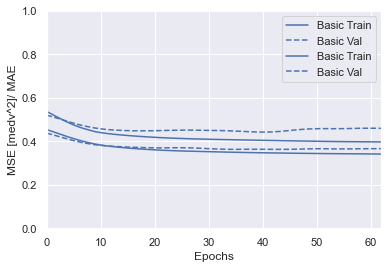

In [917]:
plotter.plot({'Basic': history}, metric = "mse")
plotter.plot({'Basic': history}, metric = "mae")
plt.ylim([0, 1])
plt.ylabel('MSE [medv^2]/ MAE')

In [918]:
checkpoint_path31 = r".\notebooks\ANN31.ckpt"

# Create a callback that saves the model's weights
ckpt_callback31 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path31,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [919]:
def build_model31_seven_hidden_layers():
    
    rmse = tf.keras.metrics.RootMeanSquaredError()
    r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    keras.layers.Dropout(0.3)
    keras.layers.BatchNormalization()
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    keras.layers.Dropout(0.3)
    keras.layers.BatchNormalization()
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))                          # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)
    keras.layers.Dropout(0.3)
    keras.layers.BatchNormalization()
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))
    keras.layers.Dropout(0.3)
    keras.layers.BatchNormalization()
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))
    keras.layers.Dropout(0.3)
    keras.layers.BatchNormalization()
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))
    keras.layers.Dropout(0.3)
    keras.layers.BatchNormalization()
    
    model.add(Dense(61, activation='relu', kernel_initializer='he_normal'))
    keras.layers.Dropout(0.3)
    keras.layers.BatchNormalization()
    
    model.add(Dense(1))                           # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model31 = build_model31_seven_hidden_layers()
print('Here is a summary of this model: ')
model31.summary()

Here is a summary of this model: 
Model: "sequential_313"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1488 (Dense)           (None, 61)                793       
_________________________________________________________________
dense_1489 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1490 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1491 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1492 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1493 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1494 (Dense)

In [920]:
%%time
EPOCHS = 100
batch_size = 52 # 6 iteration

model31 = build_model31_seven_hidden_layers()
print('Here is a summary of this model: ')
model31.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model31.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback31, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_314"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1496 (Dense)           (None, 61)                793       
_________________________________________________________________
dense_1497 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1498 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1499 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1500 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1501 (Dense)           (None, 61)                3782      
_________________________________________________________________
dense_1502 (Dense)

2086/2086 [==============================] - 6s 3ms/step - loss: 0.4163 - root_mean_squared_error: 0.6452 - r_square: 0.8792 - mae: 0.3599 - mse: 0.4163 - val_loss: 0.4274 - val_root_mean_squared_error: 0.6538 - val_r_square: 0.8759 - val_mae: 0.3482 - val_mse: 0.4274

Epoch 00020: val_loss improved from 0.42906 to 0.42740, saving model to .\notebooks\ANN31.ckpt
Epoch 21/100
2086/2086 [==============================] - 7s 4ms/step - loss: 0.4165 - root_mean_squared_error: 0.6454 - r_square: 0.8790 - mae: 0.3601 - mse: 0.4165 - val_loss: 0.4356 - val_root_mean_squared_error: 0.6600 - val_r_square: 0.8735 - val_mae: 0.3671 - val_mse: 0.4356

Epoch 00021: val_loss did not improve from 0.42740
Epoch 22/100
2086/2086 [==============================] - 6s 3ms/step - loss: 0.4157 - root_mean_squared_error: 0.6448 - r_square: 0.8793 - mae: 0.3592 - mse: 0.4157 - val_loss: 0.4417 - val_root_mean_squared_error: 0.6646 - val_r_square: 0.8718 - val_mae: 0.3741 - val_mse: 0.4417

Epoch 00022: val_l

In [940]:
def evaluate_model(model, X_test2, y_test):
    """
    evaluate model on test set and show results in dataframe.
    
    Parameters
    ----------
    model : keras model
        trained keras model.
    X_test : numpy array
        Features of holdout set.
    y_test : numpy array
        Labels of holdout set.
        
    Returns
    -------
    display_df : DataFrame
        Pandas dataframe containing evaluation results.
    """
    eval_dict = model5.evaluate(X_test2, y_test, return_dict=True)
    
    #display_df = pd.DataFrame([eval_dict.values()], columns=[list(eval_dict.keys())])
    
    return eval_dict
hyper_df = evaluate_model(model5, X_test2, y_test)

727/727 [==============================] - 1s 1ms/step - loss: 0.4191 - root_mean_squared_error: 0.6474 - r_square: 0.8783 - mae: 0.3444 - mse: 0.4191


In [941]:
y_test_pred = model5.predict(X_test2)
y_test_pred=np.round(y_test_pred,0)

In [942]:
print(metrics.classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00        19
           2       0.87      0.88      0.87      3701
           3       0.82      0.81      0.81      2637
           4       0.95      0.87      0.91      7277
           5       0.60      0.61      0.61      2946
           6       0.16      0.74      0.26       551
           7       0.89      0.64      0.74      4651
           8       0.99      0.94      0.96      1451
           9       0.00      0.00      0.00        16

    accuracy                           0.78     23250
   macro avg       0.53      0.55      0.52     23250
weighted avg       0.85      0.78      0.81     23250



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [943]:
from sklearn.metrics import confusion_matrix
cf_matrix=confusion_matrix(y_test,y_test_pred)
cf_matrix

array([[   0,    0,    0,    0,    1,    0,    0,    0,    0,    0],
       [   0,    0,    0,    1,   11,    2,    2,    3,    0,    0],
       [   0,    1, 3250,  381,   41,   22,    6,    0,    0,    0],
       [   0,    0,  421, 2141,   44,    9,   14,    8,    0,    0],
       [   0,    0,   35,   32, 6297,  707,  173,   33,    0,    0],
       [   0,    0,   38,   53,  128, 1794,  728,  203,    2,    0],
       [   0,    0,    0,    0,   33,   20,  409,   85,    4,    0],
       [   0,    0,   10,   12,   53,  417, 1193, 2955,   11,    0],
       [   0,    0,    3,    3,    4,   11,   24,   41, 1364,    1],
       [   0,    0,    0,    0,    2,    2,    1,    9,    2,    0]])

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Confusion Matrix with labels\n\n')

Text(0.5, 66.5, '\nPredicted Difficulty Level')

Text(111.5, 0.5, 'Actual Difficulty Level ')

[Text(0.5, 0, '0'),
 Text(1.5, 0, '1'),
 Text(2.5, 0, '2'),
 Text(3.5, 0, '3'),
 Text(4.5, 0, '4'),
 Text(5.5, 0, '5'),
 Text(6.5, 0, '6'),
 Text(7.5, 0, '7'),
 Text(8.5, 0, '8'),
 Text(9.5, 0, '9')]

[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

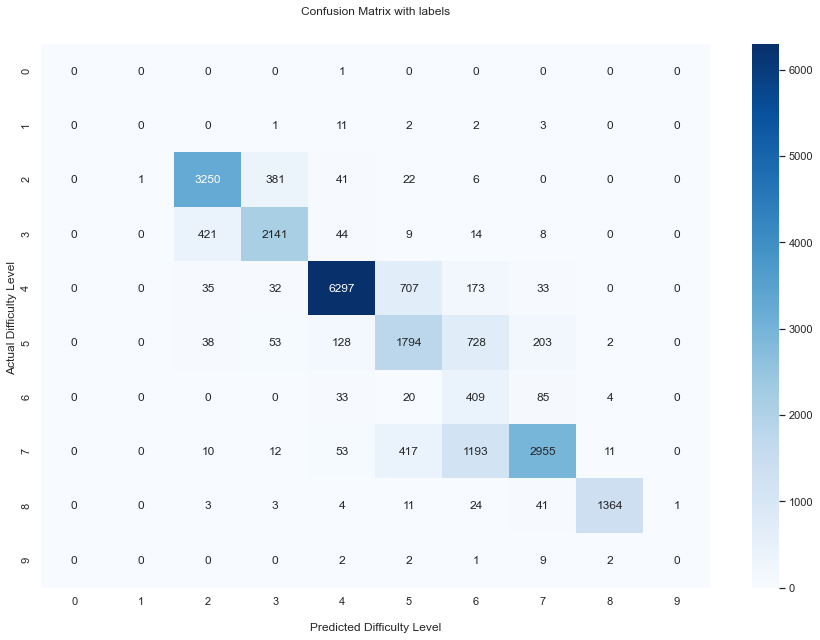

In [944]:
plt.figure(figsize=(15, 10))

ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt='g')

ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Difficulty Level')
ax.set_ylabel('Actual Difficulty Level ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])
ax.yaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [946]:
def evaluate_model(model, X_test2, y_test):
    """
    evaluate model on test set and show results in dataframe.
    
    Parameters
    ----------
    model : keras model
        trained keras model.
    X_test : numpy array
        Features of holdout set.
    y_test : numpy array
        Labels of holdout set.
        
    Returns
    -------
    display_df : DataFrame
        Pandas dataframe containing evaluation results.
    """
    eval_dict = model28.evaluate(X_test2, y_test, return_dict=True)
    
    #display_df = pd.DataFrame([eval_dict.values()], columns=[list(eval_dict.keys())])
    
    return eval_dict
hyper_df = evaluate_model(model28, X_test2, y_test)

727/727 [==============================] - 1s 1ms/step - loss: 0.4183 - root_mean_squared_error: 0.6468 - r_square: 0.8786 - mae: 0.3423 - mse: 0.4183


In [950]:
y_test_pred28 = model28.predict(X_test2)
y_test_pred28=np.round(y_test_pred28,0)

In [951]:
print(metrics.classification_report(y_test, y_test_pred28))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00        19
           2       0.84      0.94      0.89      3701
           3       0.88      0.77      0.82      2637
           4       0.95      0.86      0.91      7277
           5       0.59      0.64      0.61      2946
           6       0.16      0.73      0.26       551
           7       0.90      0.61      0.73      4651
           8       0.98      0.94      0.96      1451
           9       0.00      0.00      0.00        16

    accuracy                           0.79     23250
   macro avg       0.53      0.55      0.52     23250
weighted avg       0.85      0.79      0.81     23250



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [802]:
def build_model29_six_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()
    rmse = tf.keras.metrics.RootMeanSquaredError()
    r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))
    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
    keras.layers.BatchNormalization()
    
    model.add(Dense(224, activation='relu', kernel_initializer='he_normal'))
    keras.layers.Dropout(0.3)# Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    keras.layers.BatchNormalization()
    
    model.add(Dense(224, activation='relu', kernel_initializer='he_normal'))                          # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    keras.layers.BatchNormalization()
    
    model.add(Dense(96, activation='relu', kernel_initializer='he_normal'))
    keras.layers.BatchNormalization()
    
    model.add(Dense(160, activation='relu', kernel_initializer='he_normal'))
    keras.layers.Dropout(0.3)
    keras.layers.BatchNormalization()
    
    model.add(Dense(160, activation='relu', kernel_initializer='he_normal'))
    keras.layers.BatchNormalization()
    
    model.add(Dense(512, activation='relu', kernel_initializer='he_normal'))
    keras.layers.Dropout(0.2)
    keras.layers.BatchNormalization()


    
    model.add(Dense(1))                           # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model6 = build_model29_six_hidden_layers()
print('Here is a summary of this model: ')
model6.summary()

Here is a summary of this model: 
Model: "sequential_241"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1170 (Dense)           (None, 224)               2912      
_________________________________________________________________
dense_1171 (Dense)           (None, 224)               50400     
_________________________________________________________________
dense_1172 (Dense)           (None, 96)                21600     
_________________________________________________________________
dense_1173 (Dense)           (None, 160)               15520     
_________________________________________________________________
dense_1174 (Dense)           (None, 160)               25760     
_________________________________________________________________
dense_1175 (Dense)           (None, 512)               82432     
_________________________________________________________________
dense_1176 (Dense)

In [803]:
checkpoint_path29 = r".\notebooks\ANN29.ckpt"

# Create a callback that saves the model's weights
ckpt_callback29 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path29,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )
early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [804]:
%%time
EPOCHS = 100
batch_size = 58 # 6 iteration

model6 = build_model29_six_hidden_layers()
print('Here is a summary of this model: ')
model6.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model6.fit(
        X_train2, 
        y_train,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val2, y_val),
        callbacks=[ckpt_callback29, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_242"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1177 (Dense)           (None, 224)               2912      
_________________________________________________________________
dense_1178 (Dense)           (None, 224)               50400     
_________________________________________________________________
dense_1179 (Dense)           (None, 96)                21600     
_________________________________________________________________
dense_1180 (Dense)           (None, 160)               15520     
_________________________________________________________________
dense_1181 (Dense)           (None, 160)               25760     
_________________________________________________________________
dense_1182 (Dense)           (None, 512)               82432     
_________________________________________________________________
dense_1183 (Dense)


Epoch 00020: val_loss did not improve from 0.42675
Epoch 21/100
1870/1870 [==============================] - 8s 4ms/step - loss: 0.4106 - root_mean_squared_error: 0.6408 - r_square: 0.8807 - mae: 0.3522 - mse: 0.4106 - val_loss: 0.4324 - val_root_mean_squared_error: 0.6575 - val_r_square: 0.8745 - val_mae: 0.3569 - val_mse: 0.4324

Epoch 00021: val_loss did not improve from 0.42675
Epoch 22/100
1870/1870 [==============================] - 8s 4ms/step - loss: 0.4101 - root_mean_squared_error: 0.6404 - r_square: 0.8810 - mae: 0.3537 - mse: 0.4101 - val_loss: 0.4532 - val_root_mean_squared_error: 0.6732 - val_r_square: 0.8684 - val_mae: 0.3607 - val_mse: 0.4532

Epoch 00022: val_loss did not improve from 0.42675
Epoch 23/100
1870/1870 [==============================] - 8s 4ms/step - loss: 0.4092 - root_mean_squared_error: 0.6397 - r_square: 0.8811 - mae: 0.3517 - mse: 0.4092 - val_loss: 0.4462 - val_root_mean_squared_error: 0.6680 - val_r_square: 0.8704 - val_mae: 0.3515 - val_mse: 0.446

In [778]:
def evaluate_model(model, X_test2, y_test):
    """
    evaluate model on test set and show results in dataframe.
    
    Parameters
    ----------
    model : keras model
        trained keras model.
    X_test : numpy array
        Features of holdout set.
    y_test : numpy array
        Labels of holdout set.
        
    Returns
    -------
    display_df : DataFrame
        Pandas dataframe containing evaluation results.
    """
    eval_dict = model.evaluate(X_test2, y_test, return_dict=True)

    #display_df = pd.DataFrame([eval_dict.values()], columns=[list(eval_dict.keys())])
    
    return eval_dict
hyper_df = evaluate_model(model, X_test2, y_test)


727/727 [==============================] - 1s 1ms/step - loss: 0.4318 - root_mean_squared_error: 0.6571 - r_square: 0.8746 - mae: 0.3513 - mse: 0.4318


In [779]:
y_test_pred = model.predict(X_test2)
y_test_pred=np.round(y_test_pred,0)

In [780]:
from sklearn.metrics import confusion_matrix
cf_matrix=confusion_matrix(y_test,y_test_pred)
cf_matrix

array([[   0,    0,    0,    0,    1,    0,    0,    0,    0,    0],
       [   0,    0,    0,    1,   11,    2,    2,    1,    2,    0],
       [   0,    0, 3434,  200,   37,   20,    9,    1,    0,    0],
       [   0,    0,  549, 2016,   39,   10,   14,    9,    0,    0],
       [   0,    0,   42,   33, 6241,  794,  126,   40,    1,    0],
       [   0,    0,   52,   46,  136, 1770,  752,  186,    4,    0],
       [   0,    0,    0,    0,   34,   20,  308,  180,    9,    0],
       [   0,    0,    9,   15,   33,  504, 1036, 3048,    6,    0],
       [   0,    0,    3,    3,    4,   13,   14,   42, 1372,    0],
       [   0,    0,    0,    0,    2,    3,    0,    8,    3,    0]])

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Confusion Matrix with labels\n\n')

Text(0.5, 66.5, '\nPredicted Difficulty Level')

Text(111.5, 0.5, 'Actual Difficulty Level ')

[Text(0.5, 0, '0'),
 Text(1.5, 0, '1'),
 Text(2.5, 0, '2'),
 Text(3.5, 0, '3'),
 Text(4.5, 0, '4'),
 Text(5.5, 0, '5'),
 Text(6.5, 0, '6'),
 Text(7.5, 0, '7'),
 Text(8.5, 0, '8'),
 Text(9.5, 0, '9')]

[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

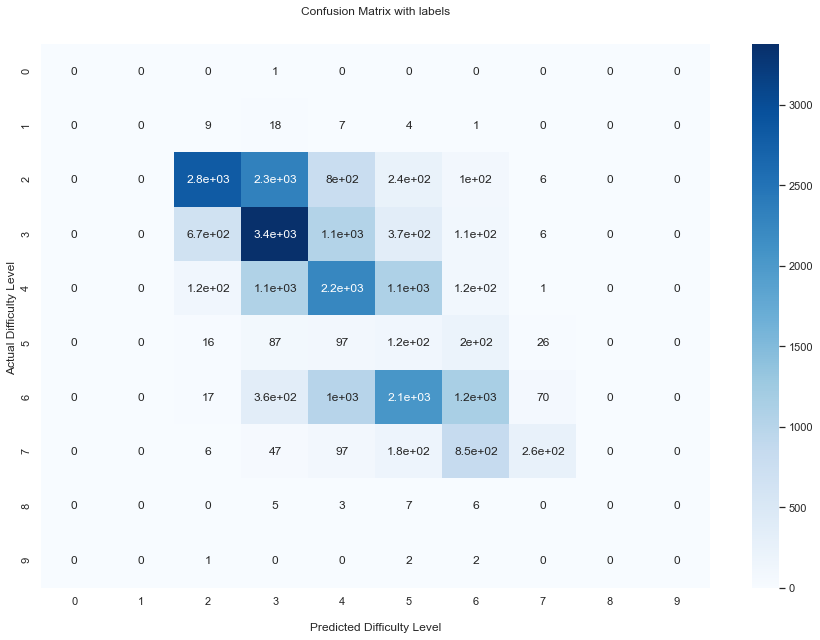

In [1025]:
plt.figure(figsize=(15, 10))

ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Difficulty Level')
ax.set_ylabel('Actual Difficulty Level ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])
ax.yaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [242]:
y_train_pred = model6.predict(X_train2)
y_train_pred=np.round(y_train_pred,0)
cf_matrix=confusion_matrix(y_train,y_train_pred)
cf_matrix

array([[    0,     0,     0,     6,     0,     0,     0,     0,     0,
            0],
       [    0,     6,    12,    98,    34,     6,     3,     0,     0,
            0],
       [    0,     0,  2296,  9472,  4059,  1225,   284,     4,     0,
            0],
       [    0,     0,   533, 21713,  7541,  1560,   384,    11,     0,
            0],
       [    0,     0,   149,  6203, 16835,  4511,   448,     1,     0,
            0],
       [    0,     0,    22,   363,   662,   939,   647,     9,     0,
            0],
       [    0,     0,    26,  1359,  5871, 10141,  4289,    38,     0,
            0],
       [    0,     0,     6,   166,   494,  1604,  4192,   267,     0,
            0],
       [    0,     0,     0,    14,    34,    41,     9,     1,     0,
            0],
       [    0,     0,     0,     0,     9,     6,     8,     0,     0,
            0]])

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Confusion Matrix with labels\n\n')

Text(0.5, 66.5, '\nPredicted Difficulty Level')

Text(111.5, 0.5, 'Actual Difficulty Level ')

[Text(0.5, 0, '0'),
 Text(1.5, 0, '1'),
 Text(2.5, 0, '2'),
 Text(3.5, 0, '3'),
 Text(4.5, 0, '4'),
 Text(5.5, 0, '5'),
 Text(6.5, 0, '6'),
 Text(7.5, 0, '7'),
 Text(8.5, 0, '8'),
 Text(9.5, 0, '9')]

[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

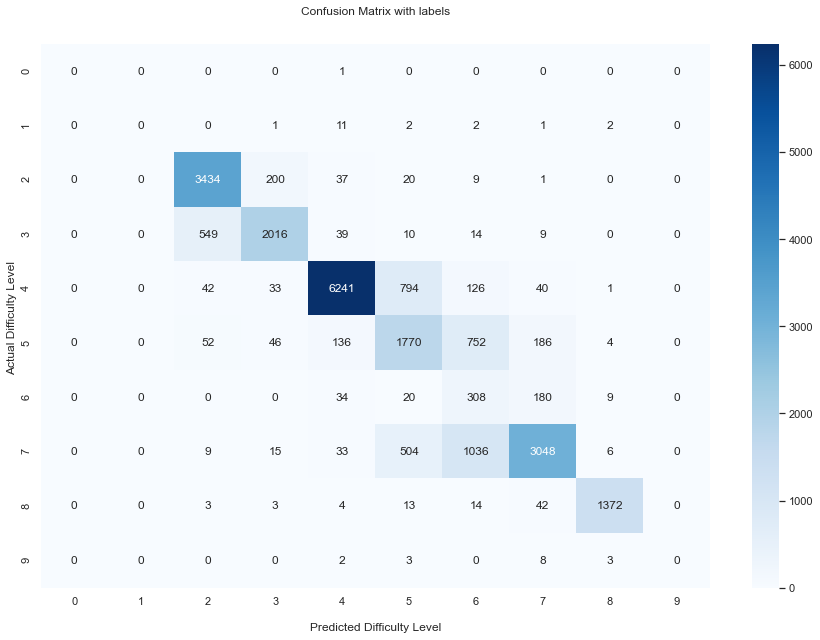

In [781]:
plt.figure(figsize=(15, 10))

ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt='g')

ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Difficulty Level')
ax.set_ylabel('Actual Difficulty Level ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])
ax.yaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])

## Display the visualization of the Confusion Matrix.
plt.show()

<Figure size 1080x720 with 0 Axes>

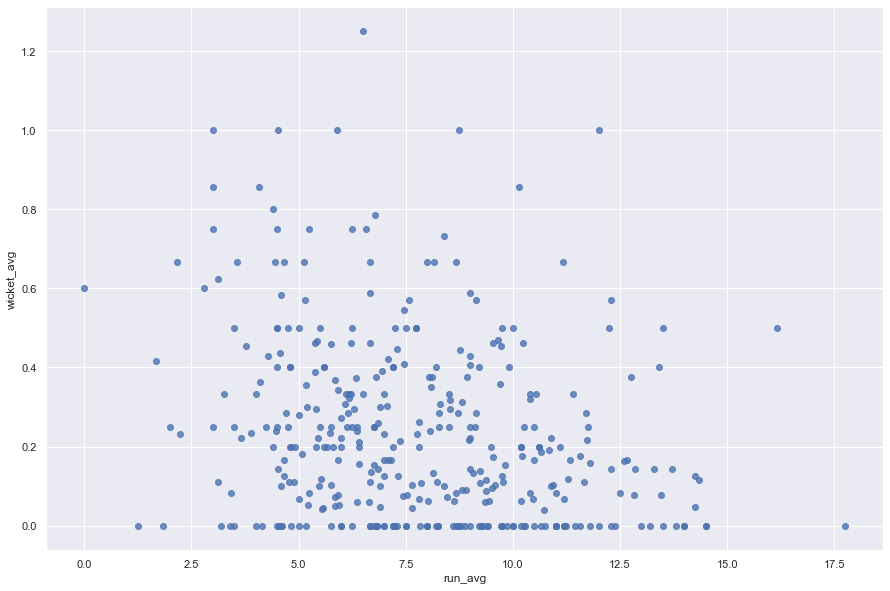

In [552]:


df_clust3 = df_a.copy()
df_clust3['total_wickets'] =df_clust3.assign(is_out=df_clust3['wicket/dead ball'].ne('Not Out')) \
                        .groupby(['sequence'])['is_out'] \
                        .cumsum()
df_clust3['total_deliveries']=df_clust3.groupby(['sequence']).cumcount()
df_clust3["total_overs"]=df_clust3.groupby(['sequence']).cumcount()//6+1
df_clust3['total_runs']=df_clust3.groupby(['sequence'])['score'].cumsum()
df_clust3 = df_clust3.groupby(['sequence']).agg({'total_wickets': 'max', 'total_runs': 'max', 'total_overs': 'max', 'total_deliveries': 'max'})
df_clust3['wicket_avg']=df_clust3['total_wickets']/df_clust3['total_overs']
df_clust3['run_avg']=df_clust3['total_runs']/df_clust3['total_overs']
df_clust3=df_clust3.reset_index()

plt.figure(figsize=(15,10))

ax = sns.regplot(x=df_clust3["run_avg"], y=df_clust3["wicket_avg"], fit_reg=False)

plt.show()

In [553]:
df_clust3=df_clust3.set_index('sequence')
X2 = df_clust3.iloc[:, [5,4]].values

In [554]:
k2=5
kmeans2 = KMeans(n_clusters=k2)
y_pred2=kmeans2.fit(X2)

In [555]:
idx2 = np.argsort(kmeans2.cluster_centers_.sum(axis=1))[::-1]
lut2 = np.zeros_like(idx2)
lut2[idx2] = np.arange(k2)



In [556]:
kmeans2.cluster_centers_.sum(axis=1)

array([13.67432356,  6.56674737, 10.85033663,  4.32365026,  8.75342511])

In [557]:
idx2

array([0, 2, 4, 1, 3])

In [558]:
lut2

array([0, 3, 1, 4, 2])

In [559]:
kmeans2.labels_

array([1, 3, 1, 4, 4, 3, 1, 2, 3, 3, 1, 4, 1, 3, 1, 1, 1, 3, 4, 3, 4, 2,
       3, 1, 3, 3, 3, 1, 1, 3, 3, 1, 3, 1, 3, 3, 3, 1, 4, 1, 4, 1, 4, 2,
       4, 4, 4, 1, 1, 4, 3, 1, 3, 3, 1, 3, 1, 3, 3, 1, 3, 1, 1, 4, 1, 4,
       3, 1, 1, 4, 1, 1, 4, 4, 1, 2, 1, 1, 3, 1, 1, 3, 3, 2, 3, 3, 3, 3,
       3, 1, 4, 4, 1, 3, 1, 3, 1, 3, 4, 4, 3, 1, 3, 3, 1, 1, 4, 1, 3, 2,
       1, 1, 4, 1, 1, 1, 1, 2, 1, 4, 1, 3, 1, 4, 4, 3, 3, 2, 1, 3, 3, 1,
       2, 1, 4, 1, 2, 2, 4, 4, 3, 3, 1, 3, 4, 0, 2, 4, 2, 4, 4, 1, 3, 2,
       0, 4, 3, 1, 3, 2, 0, 3, 3, 3, 4, 4, 4, 3, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 4, 3, 1, 1, 1, 1, 0, 4, 3, 1, 1, 1, 4, 2, 1, 1, 4, 2, 2, 0, 2,
       2, 4, 0, 0, 0, 4, 0, 2, 2, 2, 4, 4, 2, 4, 3, 3, 1, 3, 1, 1, 2, 0,
       1, 2, 2, 1, 4, 4, 3, 2, 1, 0, 3, 4, 0, 2, 1, 1, 2, 2, 4, 2, 2, 2,
       0, 0, 0, 4, 4, 0, 0, 2, 2, 4, 0, 2, 2, 1, 4, 2, 0, 3, 2, 0, 3, 4,
       4, 1, 0, 1, 2, 2, 3, 3, 3, 2, 1, 1, 1, 4, 1, 4, 3, 1, 4, 1, 2, 4,
       1, 2, 2, 2, 2, 4, 2, 2, 4, 4, 3, 1, 4, 1, 4,

In [560]:
lut2[kmeans2.labels_]

array([3, 4, 3, 2, 2, 4, 3, 1, 4, 4, 3, 2, 3, 4, 3, 3, 3, 4, 2, 4, 2, 1,
       4, 3, 4, 4, 4, 3, 3, 4, 4, 3, 4, 3, 4, 4, 4, 3, 2, 3, 2, 3, 2, 1,
       2, 2, 2, 3, 3, 2, 4, 3, 4, 4, 3, 4, 3, 4, 4, 3, 4, 3, 3, 2, 3, 2,
       4, 3, 3, 2, 3, 3, 2, 2, 3, 1, 3, 3, 4, 3, 3, 4, 4, 1, 4, 4, 4, 4,
       4, 3, 2, 2, 3, 4, 3, 4, 3, 4, 2, 2, 4, 3, 4, 4, 3, 3, 2, 3, 4, 1,
       3, 3, 2, 3, 3, 3, 3, 1, 3, 2, 3, 4, 3, 2, 2, 4, 4, 1, 3, 4, 4, 3,
       1, 3, 2, 3, 1, 1, 2, 2, 4, 4, 3, 4, 2, 0, 1, 2, 1, 2, 2, 3, 4, 1,
       0, 2, 4, 3, 4, 1, 0, 4, 4, 4, 2, 2, 2, 4, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 2, 4, 3, 3, 3, 3, 0, 2, 4, 3, 3, 3, 2, 1, 3, 3, 2, 1, 1, 0, 1,
       1, 2, 0, 0, 0, 2, 0, 1, 1, 1, 2, 2, 1, 2, 4, 4, 3, 4, 3, 3, 1, 0,
       3, 1, 1, 3, 2, 2, 4, 1, 3, 0, 4, 2, 0, 1, 3, 3, 1, 1, 2, 1, 1, 1,
       0, 0, 0, 2, 2, 0, 0, 1, 1, 2, 0, 1, 1, 3, 2, 1, 0, 4, 1, 0, 4, 2,
       2, 3, 0, 3, 1, 1, 4, 4, 4, 1, 3, 3, 3, 2, 3, 2, 4, 3, 2, 3, 1, 2,
       3, 1, 1, 1, 1, 2, 1, 1, 2, 2, 4, 3, 2, 3, 2,

In [561]:
def plot_data(X2):
    plt.plot(X2[:, 0], X2[:, 1], 'k.', markersize=4)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=30, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=50, linewidths=50,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X2, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True):
    mins = X2.min(axis=0) - 0.1
    maxs = X2.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z2 = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z2 = Z2.reshape(xx.shape)

    plt.contourf(Z2, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z2, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X2)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

<Figure size 1080x720 with 0 Axes>

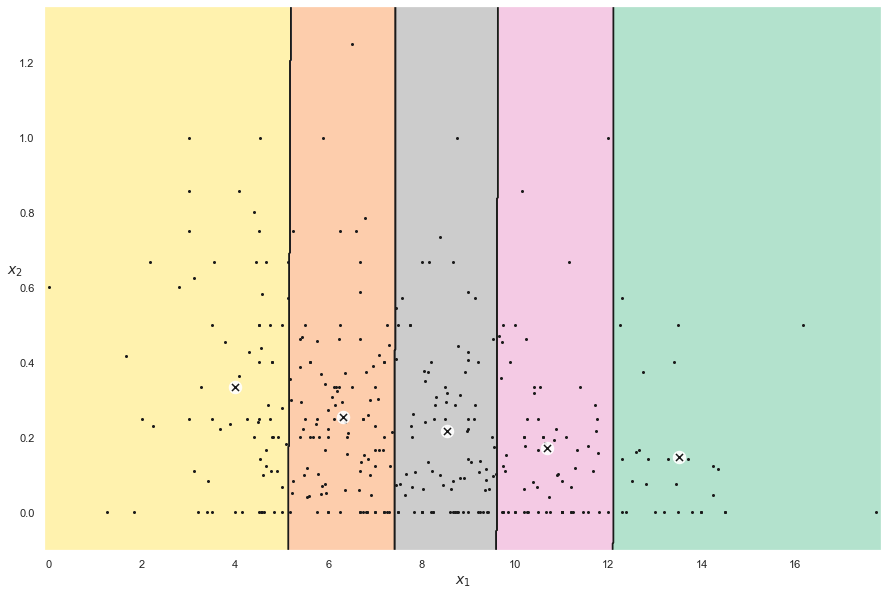

In [562]:
plt.figure(figsize=(15, 10))
plot_decision_boundaries(kmeans2, X2)
#save_fig("voronoi_diagram")
plt.show()

In [563]:
df_clust3['difficulty_level'] = pd.Series(lut2[kmeans2.labels_], index=df_clust3.index)

In [564]:
df_clust3=df_clust3.reset_index()
df_clust3.drop(['total_wickets'], axis=1, inplace=True)
df_clust3.drop(['total_deliveries'], axis=1, inplace=True)
df_clust3.drop(['run_avg'], axis=1, inplace=True)
df_clust3.drop(['wicket_avg'], axis=1, inplace=True)
df_clust3.drop(['total_runs'], axis=1, inplace=True)
df_clust3.drop(['total_overs'], axis=1, inplace=True)



In [1164]:
df_over3 = pd.merge(left=df_a, right=df_clust3, left_on='sequence', right_on='sequence')

In [978]:
df_over3['difficulty_level'].value_counts()

2    539130
1    305958
3    254040
4     37890
0      1764
Name: difficulty_level, dtype: int64

In [1165]:
df_over3 = df_over3.set_index(['batfast_id','session_no','event_name','overs', 'deliveries_faced'],drop=False)
df_over3.sort_index(inplace=True)

In [1166]:
df_over3.rename_axis(['Batfast_id','Session_no','Event_name','Overs', 'Deliveries_faced'],inplace=True)

In [1167]:
df_over3=df_over3.groupby(['Batfast_id','Session_no','Event_name','Overs']).tail(1)

In [1168]:
df_over3['difficulty_level_T-1'] = df_over3['difficulty_level'].shift(periods=1)

In [1169]:
df_over3['S/R_T-1'] = df_over3['S/R'].shift(periods=1)
#df_over['S/R_T-2'] = df_over['S/R'].shift(periods=2)
df_over3['S/R_change'] = df_over3['S/R']-df_over3['S/R_T-1']
#df_over['S/R_change_T-1'] = df_over['S/R_T-1']-df_over['S/R_T-2']

In [1170]:
df_over3.drop(df_over3.loc[df_over3['deliveries_faced']==5].index, inplace=True)

In [1171]:
df_over3.drop(['score'], axis=1, inplace=True)
df_over3.drop(['speed'], axis=1, inplace=True)
df_over3.drop(['pitch'], axis=1, inplace=True)
df_over3.drop(['swing'], axis=1, inplace=True)
df_over3.drop(['pan'], axis=1, inplace=True)
df_over3.drop(['turn'], axis=1, inplace=True)
df_over3.drop(['length'], axis=1, inplace=True)
df_over3.drop(['wicket/dead ball'], axis=1, inplace=True)
df_over3.drop(['delivery_type'], axis=1, inplace=True)
df_over3.drop(['length/type'], axis=1, inplace=True)
df_over3.drop(['length/type_no'], axis=1, inplace=True)
df_over3.drop(['day_month_year'], axis=1, inplace=True)
df_over3.drop(['client_name'], axis=1, inplace=True)
df_over3.drop(['batfast_id'], axis=1, inplace=True)
df_over3.drop(['timestamp'], axis=1, inplace=True)
df_over3.drop(['sequence'], axis=1, inplace=True)
df_over3.drop(['month_year'], axis=1, inplace=True)


In [1172]:
df_over3["gender"].replace({np.nan: "male"}, inplace=True)
df_over3["hand"].replace({np.nan: 'RHS'}, inplace=True)
df_over3["age_group"].replace({np.nan: "16Plus"}, inplace=True)
df_over3["game_mode"].replace({"Whack": "Whack_RR"}, inplace=True)
df_over3["game_mode"].replace({"ball_challenge": "over_challenge"}, inplace=True)

In [1173]:
# df_over4.drop(df_over4.loc[df_over4['game_mode']=='Continuous'].index, inplace=True)
# df_over4.drop(df_over4.loc[df_over4['game_mode']=='Finish'].index, inplace=True)

In [1174]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
for train_index, test_val_index in split.split(df_over3, df_over3["difficulty_level"]):
    strat_train_set = df_over3.iloc[train_index]
    strat_test_val_set = df_over3.iloc[test_val_index]
    

In [1175]:
split2 = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
for test_index, val_index in split2.split(strat_test_val_set, strat_test_val_set["difficulty_level"]):
    strat_test_set = strat_test_val_set.iloc[test_index]
    strat_val_set = strat_test_val_set.iloc[val_index]

In [1176]:
X_train3 = strat_train_set.drop("difficulty_level", axis=1)
y_train2 = strat_train_set['difficulty_level']
X_test3 = strat_test_set.drop("difficulty_level", axis=1)
y_test2 = strat_test_set['difficulty_level']
X_val3 = strat_val_set.drop("difficulty_level", axis=1)
y_val2 = strat_val_set['difficulty_level']

In [1177]:
X_train3['difficulty_level_T-1'].value_counts()

2.0    53135
1.0    29554
3.0    22463
4.0     3197
0.0      151
Name: difficulty_level_T-1, dtype: int64

In [1178]:
from sklearn.feature_extraction import DictVectorizer

# Convert df into a dictionary using .to_dict(): df_dict
df_dict = X_train3.to_dict("records")

# Create the DictVectorizer object: dv
dv = DictVectorizer(sparse=False)

# Apply dv on df_dict: df_encoded
X_encoded = dv.fit_transform(df_dict)

X_encoded = pd.DataFrame(X_encoded)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

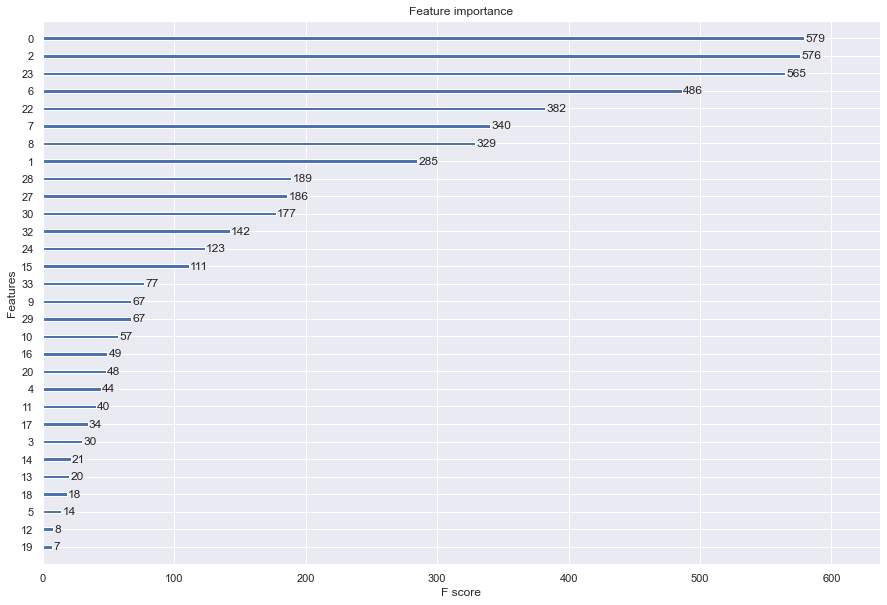

In [1179]:
from xgboost import XGBRegressor
from xgboost import plot_importance
from matplotlib import pyplot

model = XGBRegressor()
model.fit(X_encoded, y_train2)
# plot feature importance

ax = plot_importance(model)
fig = ax.figure
fig.set_size_inches(15, 10)
pyplot.show()

In [1110]:
# Use pprint to make the vocabulary easier to read
import pprint
pprint.pprint(dv.vocabulary_)

{'S/R': 0,
 'S/R_T-1': 1,
 'S/R_change': 2,
 'age_group=10To16': 3,
 'age_group=16Plus': 4,
 'age_group=4To10': 5,
 'batting_avg': 6,
 'deliveries_faced': 7,
 'difficulty_level_T-1': 8,
 'event_name=fulham': 9,
 'event_name=gps': 10,
 'event_name=manchester': 11,
 'game_mode=Continuous': 12,
 'game_mode=Whack_RR': 13,
 'game_mode=over_challenge': 14,
 'game_mode=over_challenge_RR': 15,
 'game_mode=set_over_rr_RR': 16,
 'gender=female': 17,
 'gender=male': 18,
 'gender=other': 19,
 'hand=LHS': 20,
 'hand=RHS': 21,
 'hour': 22,
 'length/type_count': 23,
 'no_of_wickets': 24,
 'overs': 25,
 'run_rate': 26,
 'runs': 27,
 'runs_per_over': 28,
 'session_no': 29,
 'total_deliveries': 30,
 'total_overs': 31,
 'total_runs': 32,
 'total_wickets': 33}


In [1180]:
X_train3.drop(['event_name'], axis=1, inplace=True)
X_train3.drop(['game_mode'], axis=1, inplace=True)
X_train3.drop(['gender'], axis=1, inplace=True)
X_train3.drop(['hand'], axis=1, inplace=True)
X_train3.drop(['age_group'], axis=1, inplace=True)
X_train3.drop(['session_no'], axis=1, inplace=True)
X_train3.drop(['total_wickets'], axis=1, inplace=True)
X_train3.drop(['no_of_wickets'], axis=1, inplace=True)
X_train3.drop(['total_overs'], axis=1, inplace=True)
X_train3.drop(['overs'], axis=1, inplace=True)
X_train3.drop(['run_rate'], axis=1, inplace=True)
X_test3.drop(['event_name'], axis=1, inplace=True)
X_test3.drop(['game_mode'], axis=1, inplace=True)
X_test3.drop(['gender'], axis=1, inplace=True)
X_test3.drop(['hand'], axis=1, inplace=True)
X_test3.drop(['age_group'], axis=1, inplace=True)
X_test3.drop(['session_no'], axis=1, inplace=True)
X_test3.drop(['total_wickets'], axis=1, inplace=True)
X_test3.drop(['no_of_wickets'], axis=1, inplace=True)
X_test3.drop(['total_overs'], axis=1, inplace=True)
X_test3.drop(['overs'], axis=1, inplace=True)
X_test3.drop(['run_rate'], axis=1, inplace=True)
X_val3.drop(['game_mode'], axis=1, inplace=True)
X_val3.drop(['gender'], axis=1, inplace=True)
X_val3.drop(['hand'], axis=1, inplace=True)
X_val3.drop(['age_group'], axis=1, inplace=True)
X_val3.drop(['session_no'], axis=1, inplace=True)
X_val3.drop(['total_wickets'], axis=1, inplace=True)
X_val3.drop(['no_of_wickets'], axis=1, inplace=True)
X_val3.drop(['total_overs'], axis=1, inplace=True)
X_val3.drop(['overs'], axis=1, inplace=True)
X_val3.drop(['run_rate'], axis=1, inplace=True)


In [1181]:
X_train3.drop(['total_runs'], axis=1, inplace=True)
X_test3.drop(['total_runs'], axis=1, inplace=True)
X_val3.drop(['total_runs'], axis=1, inplace=True)

In [1182]:
X_train_num2 = X_train3.select_dtypes(include=[np.number])
#X_train_cat_new3 = X_train_new3[['game_mode','gender','event_name','age_group']]
#X_train_cat2_new3 = X_train_new3[['hand']]

X_test_num2 = X_test3.select_dtypes(include=[np.number])
#X_test_cat_new3 = X_test_new3[['game_mode','gender','event_name','age_group']]
#X_test_cat2_new3 = X_test_new3[['hand']]

X_val_num2 = X_val3.select_dtypes(include=[np.number])
#X_val_cat_new3 = X_val_new3[['game_mode','gender','event_name','age_group']]
#X_val_cat2_new3 = X_val_new3[['hand']]

In [1183]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder # just to raise an ImportError if Scikit-Learn < 0.20
from sklearn.preprocessing import OneHotEncoder

train_num_attribs2 = list(X_train_num2)
#cat_attribs_new3 = list(X_train_cat_new3)
#cat_attribs2_new3 = list(X_train_cat2_new3)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), train_num_attribs2),
#        ("cat", OneHotEncoder(), cat_attribs_new3),
#        ("cat2", OrdinalEncoder(), cat_attribs2_new3),
    ])

X_train4 = full_pipeline.fit_transform(X_train3)

test_num_attribs2 = list(X_test_num2)
#test_cat_attribs_new3 = list(X_test_cat_new3)
#test_cat_attribs2_new3 = list(X_test_cat2_new3)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), test_num_attribs2),
#        ("cat", OneHotEncoder(), test_cat_attribs_new3),
#        ("cat2", OrdinalEncoder(), test_cat_attribs2_new3),
    ])

X_test4 = full_pipeline.fit_transform(X_test3)

val_num_attribs2 = list(X_val_num2)
#val_cat_attribs_new3 = list(X_val_cat_new3)
#val_cat_attribs2_new3 = list(X_val_cat2_new3)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), val_num_attribs2),
#        ("cat", OneHotEncoder(), val_cat_attribs_new3),
#        ("cat2", OrdinalEncoder(), val_cat_attribs2_new3),
    ])

X_val4 = full_pipeline.fit_transform(X_val3)

In [1184]:
X_train4.shape
X_test4.shape
X_val4.shape

(108500, 11)

(23250, 11)

(23250, 11)

In [1185]:
from sklearn.linear_model import LinearRegression

lin_reg2 = LinearRegression()
lin_reg2.fit(X_train4, y_train2)

LinearRegression()

In [1186]:
y_lin_pred2 = lin_reg2.predict(X_train4)

In [1187]:
import sklearn.metrics as metrics
mae = metrics.mean_absolute_error(y_train2, y_lin_pred2)
mse = metrics.mean_squared_error(y_train2, y_lin_pred2)
rmse = np.sqrt(mse)   
r2 = metrics.r2_score(y_train2,y_lin_pred2)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.3002515210973502
MSE: 0.1423472045819331
RMSE: 0.377289285008113
R-Squared: 0.7911394686106408


In [1188]:
from sklearn.tree import DecisionTreeRegressor

tree_reg2 = DecisionTreeRegressor()
tree_reg2.fit(X_train4, y_train2)

DecisionTreeRegressor()

In [1189]:
y_tree_pred2 = tree_reg2.predict(X_train4)

In [1190]:
import sklearn.metrics as metrics
mae = metrics.mean_absolute_error(y_train2, y_tree_pred2)
mse = metrics.mean_squared_error(y_train2, y_tree_pred2)
rmse = np.sqrt(mse)   
r2 = metrics.r2_score(y_train2,y_tree_pred2)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.019965740864358372
MSE: 0.010923017111198191
RMSE: 0.10451323892788986
R-Squared: 0.9839730807154222


In [1191]:
X_val3.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 23250 entries, ('bfs5302421', 1, 'gps', 5, 35) to ('bfs5601988', 1, 'gps', 5, 35)
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   event_name            23250 non-null  object 
 1   deliveries_faced      23250 non-null  int64  
 2   runs                  23250 non-null  float64
 3   total_deliveries      23250 non-null  int64  
 4   S/R                   23250 non-null  float64
 5   batting_avg           23250 non-null  float64
 6   runs_per_over         23250 non-null  float64
 7   hour                  23250 non-null  int64  
 8   length/type_count     23250 non-null  int64  
 9   difficulty_level_T-1  23250 non-null  float64
 10  S/R_T-1               23250 non-null  float64
 11  S/R_change            23250 non-null  float64
dtypes: float64(7), int64(4), object(1)
memory usage: 2.6+ MB


In [1193]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_tree_pred_test2 = tree_reg2.predict(X_test4)
print("R^2 : ", r2_score(y_test2, y_tree_pred_test2))
print("MAE :", mean_absolute_error(y_test2,y_tree_pred_test2))
print("MSE :", mean_squared_error(y_test2,y_tree_pred_test2))
print("RMSE:",np.sqrt(mean_squared_error(y_test2, y_tree_pred_test2)))

R^2 :  0.6884076883118598
MAE : 0.18235481500016604
MSE : 0.21237079475077494
RMSE: 0.4608370587862644


In [1238]:
from sklearn import metrics
y_tree_pred_test2=np.round(y_tree_pred_test2,0)
print(metrics.classification_report(y_test2, y_tree_pred_test2))

              precision    recall  f1-score   support

           0       0.01      0.03      0.02        40
           1       0.94      0.94      0.94      6340
           2       0.86      0.86      0.86     10221
           3       0.74      0.74      0.74      5731
           4       0.54      0.56      0.55       918

    accuracy                           0.84     23250
   macro avg       0.62      0.62      0.62     23250
weighted avg       0.84      0.84      0.84     23250



In [1195]:
from sklearn.ensemble import RandomForestRegressor

forest_reg2 = RandomForestRegressor(n_estimators = 10)
forest_reg2.fit(X_train4, y_train2)

RandomForestRegressor(n_estimators=10)

In [1196]:
y_forest_pred2 = forest_reg2.predict(X_train4)

In [1197]:
import sklearn.metrics as metrics
mae = metrics.mean_absolute_error(y_train2, y_forest_pred2)
mse = metrics.mean_squared_error(y_train2, y_forest_pred2)
rmse = np.sqrt(mse)   
r2 = metrics.r2_score(y_train2,y_forest_pred2)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.07087850401226403
MSE: 0.0284529595842097
RMSE: 0.16868005093729876
R-Squared: 0.958252076141492


In [1198]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_forest_pred_test2 = forest_reg2.predict(X_test4)
print("R^2 : ", r2_score(y_test2, y_forest_pred_test2))
print("MAE :", mean_absolute_error(y_test2,y_forest_pred_test2))
print("MSE :", mean_squared_error(y_test2,y_forest_pred_test2))
print("RMSE:",np.sqrt(mean_squared_error(y_test2, y_forest_pred_test2)))

R^2 :  0.831126688590835
MAE : 0.174413280699389
MSE : 0.11509834489130145
RMSE: 0.339261469800656


In [1239]:
from sklearn import metrics
y_forest_pred_test2=np.round(y_forest_pred_test2,0)
print(metrics.classification_report(y_test2, y_forest_pred_test2))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        40
           1       0.96      0.96      0.96      6340
           2       0.87      0.91      0.89     10221
           3       0.81      0.76      0.78      5731
           4       0.63      0.64      0.63       918

    accuracy                           0.87     23250
   macro avg       0.65      0.65      0.65     23250
weighted avg       0.87      0.87      0.87     23250



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [1199]:
from xgboost import XGBRegressor
xgb_reg2 = xgboost.XGBRegressor()
xgb_reg2.fit(X_train4, y_train2)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [1200]:
y_xgb_pred_2 = xgb_reg2.predict(X_train4)

In [1201]:
mae = metrics.mean_absolute_error(y_train2, y_xgb_pred_2)
mse = metrics.mean_squared_error(y_train2, y_xgb_pred_2)
rmse = np.sqrt(mse) #mse**(0.5)  
r2 = metrics.r2_score(y_train2,y_xgb_pred_2)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.15485234929229807
MSE: 0.08524983356551763
RMSE: 0.29197574139903754
R-Squared: 0.8749162261974738


In [1240]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_xgb_pred_test2 = xgb_reg2.predict(X_test4)
print("R^2 : ", r2_score(y_test2, y_xgb_pred_test2))
print("MAE :", mean_absolute_error(y_test2,y_xgb_pred_test2))
print("MSE :", mean_squared_error(y_test2,y_xgb_pred_test2))
print("RMSE:",np.sqrt(mean_squared_error(y_test2, y_xgb_pred_test2)))

R^2 :  0.8548944754174845
MAE : 0.16915681175006334
MSE : 0.09889902421327888
RMSE: 0.3144821524558729


In [1242]:
y__xgb_test_pred2 = xgb_reg2.predict(X_test4)
y_xgb_test_pred2=np.round(y_test_pred2,0)

In [1243]:
from sklearn import metrics

print(metrics.classification_report(y_test2, y_xgb_test_pred2))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        40
           1       0.96      0.98      0.97      6340
           2       0.90      0.92      0.91     10221
           3       0.84      0.77      0.80      5731
           4       0.63      0.77      0.69       918

    accuracy                           0.89     23250
   macro avg       0.67      0.69      0.68     23250
weighted avg       0.89      0.89      0.89     23250



In [1244]:
from sklearn.metrics import confusion_matrix
cf_matrix2=confusion_matrix(y_test2,y_xgb_test_pred2)
cf_matrix2

array([[   0,    0,   32,    8,    0],
       [   1, 6206,  107,   26,    0],
       [   0,  201, 9407,  610,    3],
       [   0,   27,  876, 4415,  413],
       [   0,    6,   24,  180,  708]])

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Confusion Matrix with labels\n\n')

Text(0.5, 66.5, '\nPredicted Difficulty Level')

Text(111.5, 0.5, 'Actual Difficulty Level ')

[Text(0.5, 0, '0'),
 Text(1.5, 0, '1'),
 Text(2.5, 0, '2'),
 Text(3.5, 0, '3'),
 Text(4.5, 0, '4')]

[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4')]

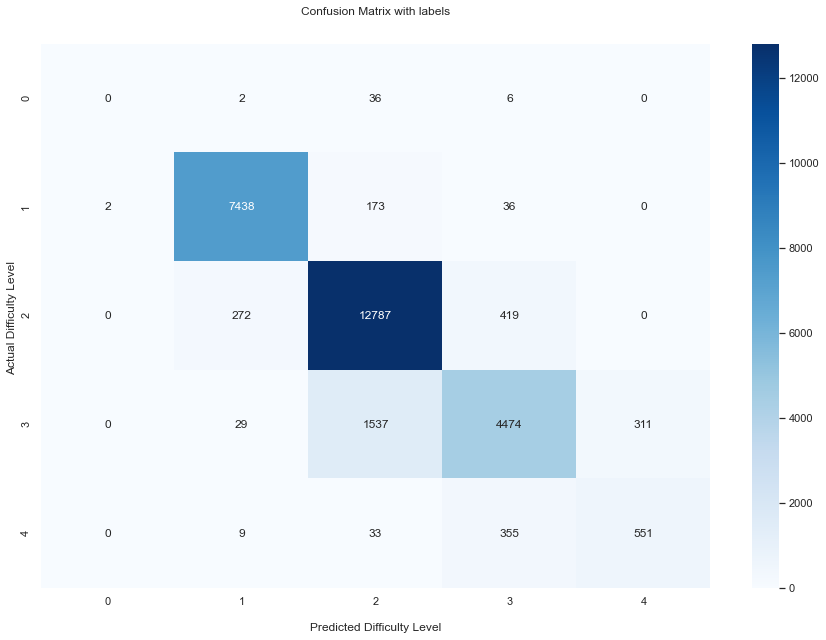

In [732]:
plt.figure(figsize=(15, 10))

ax = sns.heatmap(cf_matrix2, annot=True, cmap='Blues', fmt='g')

ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Difficulty Level')
ax.set_ylabel('Actual Difficulty Level ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])
ax.yaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [1204]:
checkpoint_path15 = r".\notebooks\ANN15.ckpt"

# Create a callback that saves the model's weights
ckpt_callback15 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path15,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1205]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model15_one_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model15 = build_model15_one_hidden_layers()
print('Here is a summary of this model: ')
model15.summary()

Here is a summary of this model: 
Model: "sequential_469"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2204 (Dense)           (None, 8)                 96        
_________________________________________________________________
dense_2205 (Dense)           (None, 1)                 9         
Total params: 105
Trainable params: 105
Non-trainable params: 0
_________________________________________________________________


In [1206]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model15 = build_model15_one_hidden_layers()
print('Here is a summary of this model: ')
model15.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model15.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train4.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback15, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_470"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2206 (Dense)           (None, 8)                 96        
_________________________________________________________________
dense_2207 (Dense)           (None, 1)                 9         
Total params: 105
Trainable params: 105
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 9s 2ms/step - loss: 0.3105 - root_mean_squared_error: 0.5573 - r_square: 0.5443 - mae: 0.3888 - mse: 0.3105 - val_loss: 0.1398 - val_root_mean_squared_error: 0.3739 - val_r_square: 0.7949 - val_mae: 0.3010 - val_mse: 0.1398149 - root_mean_squared_error: 0.5612 - r_square: 0.5380 - mae: 0.3911 - m

Epoch 00001: val_loss improved from inf to 0.13980, saving model to .\notebooks\ANN15.ckpt
Epoch 2/100
3390/3390 [============

3390/3390 [==============================] - 12s 4ms/step - loss: 0.1263 - root_mean_squared_error: 0.3554 - r_square: 0.8147 - mae: 0.2376 - mse: 0.1263 - val_loss: 0.1225 - val_root_mean_squared_error: 0.3500 - val_r_square: 0.8203 - val_mae: 0.2344 - val_mse: 0.1225

Epoch 00022: val_loss improved from 0.12251 to 0.12250, saving model to .\notebooks\ANN15.ckpt
Epoch 23/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.1267 - root_mean_squared_error: 0.3559 - r_square: 0.8142 - mae: 0.2379 - mse: 0.1267 - val_loss: 0.1228 - val_root_mean_squared_error: 0.3504 - val_r_square: 0.8199 - val_mae: 0.2342 - val_mse: 0.1228

Epoch 00023: val_loss did not improve from 0.12250
Epoch 24/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1264 - root_mean_squared_error: 0.3556 - r_square: 0.8145 - mae: 0.2381 - mse: 0.1264 - val_loss: 0.1237 - val_root_mean_squared_error: 0.3517 - val_r_square: 0.8185 - val_mae: 0.2345 - val_mse: 0.1237

Epoch 00024: val_

3390/3390 [==============================] - 8s 2ms/step - loss: 0.1265 - root_mean_squared_error: 0.3557 - r_square: 0.8144 - mae: 0.2377 - mse: 0.1265 - val_loss: 0.1231 - val_root_mean_squared_error: 0.3508 - val_r_square: 0.8194 - val_mae: 0.2351 - val_mse: 0.1231

Epoch 00045: val_loss did not improve from 0.12247
Epoch 46/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1263 - root_mean_squared_error: 0.3554 - r_square: 0.8147 - mae: 0.2376 - mse: 0.1263 - val_loss: 0.1234 - val_root_mean_squared_error: 0.3512 - val_r_square: 0.8190 - val_mae: 0.2380 - val_mse: 0.1234

Epoch 00046: val_loss did not improve from 0.12247
Epoch 47/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1263 - root_mean_squared_error: 0.3554 - r_square: 0.8144 - mae: 0.2376 - mse: 0.1263 - val_loss: 0.1226 - val_root_mean_squared_error: 0.3502 - val_r_square: 0.8201 - val_mae: 0.2347 - val_mse: 0.1226

Epoch 00047: val_loss did not improve from 0.12247
Epoch 48/10

In [1138]:
checkpoint_path16 = r".\notebooks\ANN16.ckpt"

# Create a callback that saves the model's weights
ckpt_callback16 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path16,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1139]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model16_one_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model16 = build_model16_one_hidden_layers()
print('Here is a summary of this model: ')
model16.summary()

Here is a summary of this model: 
Model: "sequential_453"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2136 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_2137 (Dense)           (None, 1)                 65        
Total params: 897
Trainable params: 897
Non-trainable params: 0
_________________________________________________________________


In [1140]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model16 = build_model16_one_hidden_layers()
print('Here is a summary of this model: ')
model.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model16.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train4.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback16, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_441"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2090 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_2091 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2092 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2093 (Dense)           (None, 1)                 65        
Total params: 9,217
Trainable params: 9,217
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 9s 2ms/step - loss: 0.2043 - root_mean_squared_error: 0.4520 - r_square: 0.7002 - mae: 0.2900 - mse: 0.2043 - val_loss: 0.1227 - val_root_mean_squared_error:


Epoch 00044: val_loss did not improve from 0.10518
Epoch 45/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1059 - root_mean_squared_error: 0.3254 - r_square: 0.8446 - mae: 0.1937 - mse: 0.1059 - val_loss: 0.1063 - val_root_mean_squared_error: 0.3260 - val_r_square: 0.8441 - val_mae: 0.1961 - val_mse: 0.1063

Epoch 00045: val_loss did not improve from 0.10518
Epoch 46/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1058 - root_mean_squared_error: 0.3253 - r_square: 0.8447 - mae: 0.1929 - mse: 0.1058 - val_loss: 0.1041 - val_root_mean_squared_error: 0.3227 - val_r_square: 0.8472 - val_mae: 0.1919 - val_mse: 0.1041

Epoch 00046: val_loss improved from 0.10518 to 0.10412, saving model to .\notebooks\ANN16.ckpt
Epoch 47/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1058 - root_mean_squared_error: 0.3252 - r_square: 0.8447 - mae: 0.1930 - mse: 0.1058 - val_loss: 0.1053 - val_root_mean_squared_error: 0.3245 - val_r_squar

3390/3390 [==============================] - 16s 5ms/step - loss: 0.1039 - root_mean_squared_error: 0.3224 - r_square: 0.8474 - mae: 0.1874 - mse: 0.1039 - val_loss: 0.1023 - val_root_mean_squared_error: 0.3199 - val_r_square: 0.8499 - val_mae: 0.1842 - val_mse: 0.1023

Epoch 00069: val_loss improved from 0.10249 to 0.10232, saving model to .\notebooks\ANN16.ckpt
Epoch 70/100
3390/3390 [==============================] - 12s 4ms/step - loss: 0.1042 - root_mean_squared_error: 0.3229 - r_square: 0.8470 - mae: 0.1880 - mse: 0.1042 - val_loss: 0.1027 - val_root_mean_squared_error: 0.3205 - val_r_square: 0.8493 - val_mae: 0.1862 - val_mse: 0.1027

Epoch 00070: val_loss did not improve from 0.10232
Epoch 71/100
3390/3390 [==============================] - 11s 3ms/step - loss: 0.1041 - root_mean_squared_error: 0.3226 - r_square: 0.8474 - mae: 0.1872 - mse: 0.1041 - val_loss: 0.1056 - val_root_mean_squared_error: 0.3250 - val_r_square: 0.8450 - val_mae: 0.1887 - val_mse: 0.1056

Epoch 00071: va

In [1210]:
checkpoint_path10 = r".\notebooks\ANN10.ckpt"

# Create a callback that saves the model's weights
ckpt_callback10 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path10,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1211]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model10_one_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model10 = build_model10_one_hidden_layers()
print('Here is a summary of this model: ')
model10.summary()

Here is a summary of this model: 
Model: "sequential_473"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2212 (Dense)           (None, 128)               1536      
_________________________________________________________________
dense_2213 (Dense)           (None, 1)                 129       
Total params: 1,665
Trainable params: 1,665
Non-trainable params: 0
_________________________________________________________________


In [1212]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model10 = build_model10_one_hidden_layers()
print('Here is a summary of this model: ')
model10.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model10.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train2.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback10, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_474"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2214 (Dense)           (None, 128)               1536      
_________________________________________________________________
dense_2215 (Dense)           (None, 1)                 129       
Total params: 1,665
Trainable params: 1,665
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 12s 3ms/step - loss: 0.1891 - root_mean_squared_error: 0.4349 - r_square: 0.7225 - mae: 0.2810 - mse: 0.1891 - val_loss: 0.1216 - val_root_mean_squared_error: 0.3488 - val_r_square: 0.8215 - val_mae: 0.2343 - val_mse: 0.1216

Epoch 00001: val_loss improved from inf to 0.12164, saving model to .\notebooks\ANN10.ckpt
Epoch 2/100
3390/3390 [==============================] - 11s 3ms/step - loss: 0.1251 - root_mean_squared

3390/3390 [==============================] - 11s 3ms/step - loss: 0.1090 - root_mean_squared_error: 0.3302 - r_square: 0.8400 - mae: 0.1973 - mse: 0.1090 - val_loss: 0.1066 - val_root_mean_squared_error: 0.3265 - val_r_square: 0.8436 - val_mae: 0.1930 - val_mse: 0.1066

Epoch 00021: val_loss improved from 0.10675 to 0.10662, saving model to .\notebooks\ANN10.ckpt
Epoch 22/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.1087 - root_mean_squared_error: 0.3297 - r_square: 0.8406 - mae: 0.1974 - mse: 0.1087 - val_loss: 0.1067 - val_root_mean_squared_error: 0.3266 - val_r_square: 0.8435 - val_mae: 0.2047 - val_mse: 0.1067

Epoch 00022: val_loss did not improve from 0.10662
Epoch 23/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1084 - root_mean_squared_error: 0.3292 - r_square: 0.8409 - mae: 0.1962 - mse: 0.1084 - val_loss: 0.1057 - val_root_mean_squared_error: 0.3251 - val_r_square: 0.8450 - val_mae: 0.1923 - val_mse: 0.1057

Epoch 00023: val_

3390/3390 [==============================] - 6s 2ms/step - loss: 0.1048 - root_mean_squared_error: 0.3238 - r_square: 0.8462 - mae: 0.1885 - mse: 0.1048 - val_loss: 0.1039 - val_root_mean_squared_error: 0.3223 - val_r_square: 0.8476 - val_mae: 0.1879 - val_mse: 0.1039

Epoch 00044: val_loss did not improve from 0.10341
Epoch 45/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1051 - root_mean_squared_error: 0.3243 - r_square: 0.8457 - mae: 0.1883 - mse: 0.1051 - val_loss: 0.1048 - val_root_mean_squared_error: 0.3237 - val_r_square: 0.8462 - val_mae: 0.1920 - val_mse: 0.1048

Epoch 00045: val_loss did not improve from 0.10341
Epoch 46/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1041 - root_mean_squared_error: 0.3227 - r_square: 0.8473 - mae: 0.1881 - mse: 0.1041 - val_loss: 0.1052 - val_root_mean_squared_error: 0.3243 - val_r_square: 0.8457 - val_mae: 0.1949 - val_mse: 0.1052

Epoch 00046: val_loss did not improve from 0.10341
Epoch 47/10

3390/3390 [==============================] - 7s 2ms/step - loss: 0.1035 - root_mean_squared_error: 0.3218 - r_square: 0.8483 - mae: 0.1856 - mse: 0.1035 - val_loss: 0.1041 - val_root_mean_squared_error: 0.3226 - val_r_square: 0.8473 - val_mae: 0.2046 - val_mse: 0.1041

Epoch 00068: val_loss did not improve from 0.10159
Epoch 69/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1025 - root_mean_squared_error: 0.3202 - r_square: 0.8494 - mae: 0.1842 - mse: 0.1025 - val_loss: 0.1026 - val_root_mean_squared_error: 0.3203 - val_r_square: 0.8495 - val_mae: 0.1934 - val_mse: 0.1026

Epoch 00069: val_loss did not improve from 0.10159
Epoch 70/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1031 - root_mean_squared_error: 0.3212 - r_square: 0.8486 - mae: 0.1850 - mse: 0.1031 - val_loss: 0.1034 - val_root_mean_squared_error: 0.3216 - val_r_square: 0.8483 - val_mae: 0.1861 - val_mse: 0.1034

Epoch 00070: val_loss did not improve from 0.10159
Epoch 71/10

3390/3390 [==============================] - 8s 2ms/step - loss: 0.1021 - root_mean_squared_error: 0.3195 - r_square: 0.8505 - mae: 0.1831 - mse: 0.1021 - val_loss: 0.1050 - val_root_mean_squared_error: 0.3240 - val_r_square: 0.8459 - val_mae: 0.1977 - val_mse: 0.1050

Epoch 00092: val_loss did not improve from 0.10154
CPU times: user 13min 33s, sys: 1min 49s, total: 15min 23s
Wall time: 11min


In [1213]:
checkpoint_path11 = r".\notebooks\ANN11.ckpt"

# Create a callback that saves the model's weights
ckpt_callback11 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path11,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1214]:
def build_model11_three_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(8, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(8, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model11 = build_model11_three_hidden_layers()
print('Here is a summary of this model: ')
model11.summary()

Here is a summary of this model: 
Model: "sequential_475"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2216 (Dense)           (None, 8)                 96        
_________________________________________________________________
dense_2217 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2218 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2219 (Dense)           (None, 1)                 9         
Total params: 249
Trainable params: 249
Non-trainable params: 0
_________________________________________________________________


In [1215]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model11 = build_model11_three_hidden_layers()
print('Here is a summary of this model: ')
model11.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model11.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train4.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback11, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_476"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2220 (Dense)           (None, 8)                 96        
_________________________________________________________________
dense_2221 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2222 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2223 (Dense)           (None, 1)                 9         
Total params: 249
Trainable params: 249
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 10s 2ms/step - loss: 0.1973 - root_mean_squared_error: 0.4255 - r_square: 0.7344 - mae: 0.3181 - mse: 0.1973 - val_loss: 0.1273 - val_root_mean_squared_error: 0.

3390/3390 [==============================] - 7s 2ms/step - loss: 0.1108 - root_mean_squared_error: 0.3328 - r_square: 0.8375 - mae: 0.1998 - mse: 0.1108 - val_loss: 0.1086 - val_root_mean_squared_error: 0.3295 - val_r_square: 0.8407 - val_mae: 0.1971 - val_mse: 0.1086

Epoch 00021: val_loss did not improve from 0.10789
Epoch 22/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1105 - root_mean_squared_error: 0.3325 - r_square: 0.8379 - mae: 0.1986 - mse: 0.1105 - val_loss: 0.1074 - val_root_mean_squared_error: 0.3277 - val_r_square: 0.8424 - val_mae: 0.1918 - val_mse: 0.1074

Epoch 00022: val_loss improved from 0.10789 to 0.10741, saving model to .\notebooks\ANN11.ckpt
Epoch 23/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1100 - root_mean_squared_error: 0.3317 - r_square: 0.8385 - mae: 0.1972 - mse: 0.1100 - val_loss: 0.1082 - val_root_mean_squared_error: 0.3289 - val_r_square: 0.8413 - val_mae: 0.2108 - val_mse: 0.1082

Epoch 00023: val_l

3390/3390 [==============================] - 8s 2ms/step - loss: 0.1042 - root_mean_squared_error: 0.3228 - r_square: 0.8472 - mae: 0.1813 - mse: 0.1042 - val_loss: 0.1026 - val_root_mean_squared_error: 0.3203 - val_r_square: 0.8495 - val_mae: 0.1821 - val_mse: 0.1026

Epoch 00044: val_loss did not improve from 0.10152
Epoch 45/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1048 - root_mean_squared_error: 0.3237 - r_square: 0.8462 - mae: 0.1820 - mse: 0.1048 - val_loss: 0.1032 - val_root_mean_squared_error: 0.3212 - val_r_square: 0.8486 - val_mae: 0.1908 - val_mse: 0.1032 0.1046 - root_mean_squared_error: 0.3234 - r_square: 0.8465 - mae: 0.1815 - m - ETA: 1s - loss: 0.1048 - root_mean_squared_er

Epoch 00045: val_loss did not improve from 0.10152
Epoch 46/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1044 - root_mean_squared_error: 0.3231 - r_square: 0.8467 - mae: 0.1811 - mse: 0.1044 - val_loss: 0.1019 - val_root_mean_squared_error: 0.3

3390/3390 [==============================] - 11s 3ms/step - loss: 0.1036 - root_mean_squared_error: 0.3219 - r_square: 0.8480 - mae: 0.1783 - mse: 0.1036 - val_loss: 0.1027 - val_root_mean_squared_error: 0.3204 - val_r_square: 0.8494 - val_mae: 0.1847 - val_mse: 0.1027

Epoch 00067: val_loss did not improve from 0.10056
Epoch 68/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.1033 - root_mean_squared_error: 0.3214 - r_square: 0.8485 - mae: 0.1776 - mse: 0.1033 - val_loss: 0.1034 - val_root_mean_squared_error: 0.3215 - val_r_square: 0.8483 - val_mae: 0.1778 - val_mse: 0.1034

Epoch 00068: val_loss did not improve from 0.10056
Epoch 69/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.1033 - root_mean_squared_error: 0.3213 - r_square: 0.8483 - mae: 0.1771 - mse: 0.1033 - val_loss: 0.1016 - val_root_mean_squared_error: 0.3188 - val_r_square: 0.8509 - val_mae: 0.1809 - val_mse: 0.1016

Epoch 00069: val_loss did not improve from 0.10056
Epoch 70/1

3390/3390 [==============================] - 8s 2ms/step - loss: 0.1026 - root_mean_squared_error: 0.3203 - r_square: 0.8496 - mae: 0.1754 - mse: 0.1026 - val_loss: 0.1012 - val_root_mean_squared_error: 0.3182 - val_r_square: 0.8515 - val_mae: 0.1737 - val_mse: 0.1012

Epoch 00091: val_loss did not improve from 0.10025
Epoch 92/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1024 - root_mean_squared_error: 0.3200 - r_square: 0.8496 - mae: 0.1748 - mse: 0.1024 - val_loss: 0.1028 - val_root_mean_squared_error: 0.3206 - val_r_square: 0.8492 - val_mae: 0.1739 - val_mse: 0.1028

Epoch 00092: val_loss did not improve from 0.10025
Epoch 93/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1025 - root_mean_squared_error: 0.3202 - r_square: 0.8495 - mae: 0.1756 - mse: 0.1025 - val_loss: 0.1018 - val_root_mean_squared_error: 0.3190 - val_r_square: 0.8507 - val_mae: 0.1878 - val_mse: 0.1018

Epoch 00093: val_loss did not improve from 0.10025
Epoch 94/10

In [1216]:
checkpoint_path12 = r".\notebooks\ANN12.ckpt"

# Create a callback that saves the model's weights
ckpt_callback12 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path12,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1217]:
def build_model12_three_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(64, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(64, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model12 = build_model12_three_hidden_layers()
print('Here is a summary of this model: ')
model12.summary()

Here is a summary of this model: 
Model: "sequential_477"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2224 (Dense)           (None, 64)                768       
_________________________________________________________________
dense_2225 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2226 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2227 (Dense)           (None, 1)                 65        
Total params: 9,153
Trainable params: 9,153
Non-trainable params: 0
_________________________________________________________________


In [1218]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model = build_model12_three_hidden_layers()
print('Here is a summary of this model: ')
model12.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model12.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train4.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback12, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_477"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2224 (Dense)           (None, 64)                768       
_________________________________________________________________
dense_2225 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2226 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2227 (Dense)           (None, 1)                 65        
Total params: 9,153
Trainable params: 9,153
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 18s 4ms/step - loss: 0.1358 - root_mean_squared_error: 0.3606 - r_square: 0.8092 - mae: 0.2479 - mse: 0.1358 - val_loss: 0.1234 - val_root_mean_squared_error

3390/3390 [==============================] - 8s 2ms/step - loss: 0.1004 - root_mean_squared_error: 0.3169 - r_square: 0.8526 - mae: 0.1708 - mse: 0.1004 - val_loss: 0.1027 - val_root_mean_squared_error: 0.3205 - val_r_square: 0.8493 - val_mae: 0.1708 - val_mse: 0.1027

Epoch 00021: val_loss did not improve from 0.09795
Epoch 22/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1001 - root_mean_squared_error: 0.3165 - r_square: 0.8531 - mae: 0.1703 - mse: 0.1001 - val_loss: 0.0994 - val_root_mean_squared_error: 0.3153 - val_r_square: 0.8541 - val_mae: 0.1648 - val_mse: 0.0994

Epoch 00022: val_loss did not improve from 0.09795
Epoch 23/100
3390/3390 [==============================] - 11s 3ms/step - loss: 0.1002 - root_mean_squared_error: 0.3165 - r_square: 0.8530 - mae: 0.1699 - mse: 0.1002 - val_loss: 0.0996 - val_root_mean_squared_error: 0.3156 - val_r_square: 0.8538 - val_mae: 0.1693 - val_mse: 0.0996

Epoch 00023: val_loss did not improve from 0.09795
Epoch 24/1

In [1219]:
checkpoint_path13 = r".\notebooks\ANN13.ckpt"

# Create a callback that saves the model's weights
ckpt_callback13 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path13,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1220]:
def build_model13_three_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(128,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(128, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(128, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 3 => only output dimension should be designated (output dimension = # of Neurons = 128)

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model13 = build_model13_three_hidden_layers()
print('Here is a summary of this model: ')
model13.summary()

Here is a summary of this model: 
Model: "sequential_479"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2232 (Dense)           (None, 128)               1536      
_________________________________________________________________
dense_2233 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_2234 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_2235 (Dense)           (None, 1)                 129       
Total params: 34,689
Trainable params: 34,689
Non-trainable params: 0
_________________________________________________________________


In [1221]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model13 = build_model13_three_hidden_layers()
print('Here is a summary of this model: ')
model13.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model13.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train4.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback13, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_480"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2236 (Dense)           (None, 128)               1536      
_________________________________________________________________
dense_2237 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_2238 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_2239 (Dense)           (None, 1)                 129       
Total params: 34,689
Trainable params: 34,689
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 14s 3ms/step - loss: 0.1371 - root_mean_squared_error: 0.3616 - r_square: 0.8081 - mae: 0.2457 - mse: 0.1371 - val_loss: 0.1184 - val_root_mean_squared_err

3390/3390 [==============================] - 8s 2ms/step - loss: 0.0997 - root_mean_squared_error: 0.3158 - r_square: 0.8538 - mae: 0.1682 - mse: 0.0997 - val_loss: 0.1012 - val_root_mean_squared_error: 0.3182 - val_r_square: 0.8514 - val_mae: 0.1771 - val_mse: 0.1012

Epoch 00021: val_loss did not improve from 0.09853
Epoch 22/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.0993 - root_mean_squared_error: 0.3152 - r_square: 0.8543 - mae: 0.1676 - mse: 0.0993 - val_loss: 0.0993 - val_root_mean_squared_error: 0.3151 - val_r_square: 0.8543 - val_mae: 0.1731 - val_mse: 0.0993

Epoch 00022: val_loss did not improve from 0.09853
Epoch 23/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0991 - root_mean_squared_error: 0.3148 - r_square: 0.8546 - mae: 0.1673 - mse: 0.0991 - val_loss: 0.0994 - val_root_mean_squared_error: 0.3153 - val_r_square: 0.8541 - val_mae: 0.1714 - val_mse: 0.0994

Epoch 00023: val_loss did not improve from 0.09853
Epoch 24/10

3390/3390 [==============================] - 8s 2ms/step - loss: 0.0968 - root_mean_squared_error: 0.3112 - r_square: 0.8578 - mae: 0.1630 - mse: 0.0968 - val_loss: 0.0992 - val_root_mean_squared_error: 0.3150 - val_r_square: 0.8544 - val_mae: 0.1634 - val_mse: 0.0992

Epoch 00045: val_loss did not improve from 0.09780
Epoch 46/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0972 - root_mean_squared_error: 0.3118 - r_square: 0.8574 - mae: 0.1636 - mse: 0.0972 - val_loss: 0.0984 - val_root_mean_squared_error: 0.3137 - val_r_square: 0.8556 - val_mae: 0.1607 - val_mse: 0.0984

Epoch 00046: val_loss did not improve from 0.09780
Epoch 47/100
3390/3390 [==============================] - 10s 3ms/step - loss: 0.0967 - root_mean_squared_error: 0.3110 - r_square: 0.8580 - mae: 0.1625 - mse: 0.0967 - val_loss: 0.1010 - val_root_mean_squared_error: 0.3178 - val_r_square: 0.8519 - val_mae: 0.1673 - val_mse: 0.1010

Epoch 00047: val_loss did not improve from 0.09780
Epoch 48/1

In [1222]:
checkpoint_path14 = r".\notebooks\ANN14.ckpt"

# Create a callback that saves the model's weights
ckpt_callback14 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path14,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1223]:
def build_model14_five_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(8, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(8, activation='relu',kernel_initializer='he_normal'))    
    model.add(Dense(8, activation='relu',kernel_initializer='he_normal'))
    model.add(Dense(8, activation='relu',kernel_initializer='he_normal'))

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model14 = build_model14_five_hidden_layers()
print('Here is a summary of this model: ')
model14.summary()

Here is a summary of this model: 
Model: "sequential_481"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2240 (Dense)           (None, 8)                 96        
_________________________________________________________________
dense_2241 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2242 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2243 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2244 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2245 (Dense)           (None, 1)                 9         
Total params: 393
Trainable params: 393
Non-trainable params: 0
____________________

In [1224]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model14 = build_model14_five_hidden_layers()
print('Here is a summary of this model: ')
model14.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model14.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train4.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback14, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_482"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2246 (Dense)           (None, 8)                 96        
_________________________________________________________________
dense_2247 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2248 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2249 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2250 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_2251 (Dense)           (None, 1)                 9         
Total params: 393
Trainable params: 393
Non-trainable params: 0
____________________

3390/3390 [==============================] - 7s 2ms/step - loss: 0.1090 - root_mean_squared_error: 0.3301 - r_square: 0.8401 - mae: 0.1923 - mse: 0.1090 - val_loss: 0.1109 - val_root_mean_squared_error: 0.3331 - val_r_square: 0.8372 - val_mae: 0.2062 - val_mse: 0.1109

Epoch 00020: val_loss did not improve from 0.10579
Epoch 21/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1083 - root_mean_squared_error: 0.3290 - r_square: 0.8412 - mae: 0.1913 - mse: 0.1083 - val_loss: 0.1048 - val_root_mean_squared_error: 0.3237 - val_r_square: 0.8463 - val_mae: 0.1865 - val_mse: 0.1048

Epoch 00021: val_loss improved from 0.10579 to 0.10475, saving model to .\notebooks\ANN14.ckpt
Epoch 22/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.1080 - root_mean_squared_error: 0.3287 - r_square: 0.8414 - mae: 0.1906 - mse: 0.1080 - val_loss: 0.1041 - val_root_mean_squared_error: 0.3226 - val_r_square: 0.8473 - val_mae: 0.1877 - val_mse: 0.1041

Epoch 00022: val_l

3390/3390 [==============================] - 6s 2ms/step - loss: 0.1056 - root_mean_squared_error: 0.3250 - r_square: 0.8449 - mae: 0.1835 - mse: 0.1056 - val_loss: 0.1035 - val_root_mean_squared_error: 0.3217 - val_r_square: 0.8482 - val_mae: 0.1906 - val_mse: 0.1035

Epoch 00044: val_loss did not improve from 0.10234
Epoch 45/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.1053 - root_mean_squared_error: 0.3245 - r_square: 0.8455 - mae: 0.1827 - mse: 0.1053 - val_loss: 0.1028 - val_root_mean_squared_error: 0.3207 - val_r_square: 0.8491 - val_mae: 0.1906 - val_mse: 0.1028

Epoch 00045: val_loss did not improve from 0.10234
Epoch 46/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1057 - root_mean_squared_error: 0.3252 - r_square: 0.8450 - mae: 0.1828 - mse: 0.1057 - val_loss: 0.1037 - val_root_mean_squared_error: 0.3220 - val_r_square: 0.8479 - val_mae: 0.1854 - val_mse: 0.1037

Epoch 00046: val_loss did not improve from 0.10234
Epoch 47/10


Epoch 00067: val_loss improved from 0.10093 to 0.10082, saving model to .\notebooks\ANN14.ckpt
Epoch 68/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1029 - root_mean_squared_error: 0.3208 - r_square: 0.8490 - mae: 0.1761 - mse: 0.1029 - val_loss: 0.1013 - val_root_mean_squared_error: 0.3183 - val_r_square: 0.8513 - val_mae: 0.1700 - val_mse: 0.1013

Epoch 00068: val_loss did not improve from 0.10082
Epoch 69/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1030 - root_mean_squared_error: 0.3209 - r_square: 0.8488 - mae: 0.1751 - mse: 0.1030 - val_loss: 0.1009 - val_root_mean_squared_error: 0.3177 - val_r_square: 0.8519 - val_mae: 0.1778 - val_mse: 0.1009

Epoch 00069: val_loss did not improve from 0.10082
Epoch 70/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1034 - root_mean_squared_error: 0.3216 - r_square: 0.8482 - mae: 0.1759 - mse: 0.1034 - val_loss: 0.1005 - val_root_mean_squared_error: 0.3170 - val_r_squar

3390/3390 [==============================] - 8s 2ms/step - loss: 0.1027 - root_mean_squared_error: 0.3205 - r_square: 0.8492 - mae: 0.1723 - mse: 0.1027 - val_loss: 0.1017 - val_root_mean_squared_error: 0.3189 - val_r_square: 0.8508 - val_mae: 0.1760 - val_mse: 0.1017

Epoch 00092: val_loss did not improve from 0.09978
Epoch 93/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.1020 - root_mean_squared_error: 0.3194 - r_square: 0.8503 - mae: 0.1713 - mse: 0.1020 - val_loss: 0.1012 - val_root_mean_squared_error: 0.3182 - val_r_square: 0.8515 - val_mae: 0.1726 - val_mse: 0.1012

Epoch 00093: val_loss did not improve from 0.09978
Epoch 94/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1019 - root_mean_squared_error: 0.3192 - r_square: 0.8504 - mae: 0.1708 - mse: 0.1019 - val_loss: 0.1014 - val_root_mean_squared_error: 0.3184 - val_r_square: 0.8513 - val_mae: 0.1727 - val_mse: 0.1014

Epoch 00094: val_loss did not improve from 0.09978
Epoch 95/10

In [1225]:
checkpoint_path17 = r".\notebooks\ANN17.ckpt"

# Create a callback that saves the model's weights
ckpt_callback17 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path17,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1226]:
def build_model17_five_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(64, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(64, activation='relu',kernel_initializer='he_normal'))    
    
    model.add(Dense(64, activation='relu',kernel_initializer='he_normal'))
    
    model.add(Dense(64, activation='relu',kernel_initializer='he_normal'))

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model17 = build_model17_five_hidden_layers()
print('Here is a summary of this model: ')
model17.summary()

Here is a summary of this model: 
Model: "sequential_483"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2252 (Dense)           (None, 64)                768       
_________________________________________________________________
dense_2253 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2254 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2255 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2256 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2257 (Dense)           (None, 1)                 65        
Total params: 17,473
Trainable params: 17,473
Non-trainable params: 0
______________

In [1227]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model17 = build_model17_five_hidden_layers()
print('Here is a summary of this model: ')
model17.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model17.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train4.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback17, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_484"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2258 (Dense)           (None, 64)                768       
_________________________________________________________________
dense_2259 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2260 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2261 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2262 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2263 (Dense)           (None, 1)                 65        
Total params: 17,473
Trainable params: 17,473
Non-trainable params: 0
______________

3390/3390 [==============================] - 11s 3ms/step - loss: 0.0994 - root_mean_squared_error: 0.3152 - r_square: 0.8542 - mae: 0.1671 - mse: 0.0994 - val_loss: 0.1021 - val_root_mean_squared_error: 0.3195 - val_r_square: 0.8502 - val_mae: 0.1775 - val_mse: 0.1021

Epoch 00021: val_loss did not improve from 0.09786
Epoch 22/100
3390/3390 [==============================] - 12s 3ms/step - loss: 0.0994 - root_mean_squared_error: 0.3153 - r_square: 0.8541 - mae: 0.1677 - mse: 0.0994 - val_loss: 0.1026 - val_root_mean_squared_error: 0.3203 - val_r_square: 0.8495 - val_mae: 0.1750 - val_mse: 0.1026

Epoch 00022: val_loss did not improve from 0.09786
Epoch 23/100
3390/3390 [==============================] - 11s 3ms/step - loss: 0.0994 - root_mean_squared_error: 0.3153 - r_square: 0.8541 - mae: 0.1678 - mse: 0.0994 - val_loss: 0.1033 - val_root_mean_squared_error: 0.3214 - val_r_square: 0.8484 - val_mae: 0.1728 - val_mse: 0.1033

Epoch 00023: val_loss did not improve from 0.09786
Epoch 24

In [1228]:
checkpoint_path18 = r".\notebooks\ANN18.ckpt"

# Create a callback that saves the model's weights
ckpt_callback18 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path18,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [1229]:
def build_model18_five_hidden_layers():
    # Keras model object created from Sequential class. This will be the container that contains all layers.
    model = Sequential()

    # The model so far is empty. It can be constructed by adding layers and compilation.
    # This Keras model with multiple hidden layers.
    
    # Input Layer with 32 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train4.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(128,activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 32)
    
    
    model.add(Dense(128, activation='relu',kernel_initializer='he_normal'))                         # Hidden layer 2 => only output dimension should be designated (output dimension = # of Neurons = 64)
    
    
    model.add(Dense(128, activation='relu',kernel_initializer='he_normal'))    
    model.add(Dense(128, activation='relu',kernel_initializer='he_normal'))
    model.add(Dense(128, activation='relu',kernel_initializer='he_normal'))

    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
    # Activation: sigmoid, softmax, tanh, relu, LeakyReLU. 
    #Optimizer: SGD, Adam, RMSProp, etc. # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model18 = build_model8_five_hidden_layers()
print('Here is a summary of this model: ')
model18.summary()

Here is a summary of this model: 
Model: "sequential_485"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2264 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_2265 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2266 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2267 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2268 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_2269 (Dense)           (None, 1)                 65        
Total params: 17,537
Trainable params: 17,537
Non-trainable params: 0
______________

In [1230]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model18 = build_model18_five_hidden_layers()
print('Here is a summary of this model: ')
model18.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model18.fit(
        X_train4, 
        y_train2,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train4.shape[0] / batch_size) ,
        validation_data = (X_val4, y_val2),
        callbacks=[ckpt_callback18, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_486"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2270 (Dense)           (None, 128)               1536      
_________________________________________________________________
dense_2271 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_2272 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_2273 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_2274 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_2275 (Dense)           (None, 1)                 129       
Total params: 67,713
Trainable params: 67,713
Non-trainable params: 0
______________


Epoch 00020: val_loss did not improve from 0.09812
Epoch 21/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0991 - root_mean_squared_error: 0.3149 - r_square: 0.8545 - mae: 0.1653 - mse: 0.0991 - val_loss: 0.1022 - val_root_mean_squared_error: 0.3196 - val_r_square: 0.8501 - val_mae: 0.1772 - val_mse: 0.1022

Epoch 00021: val_loss did not improve from 0.09812
Epoch 22/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0993 - root_mean_squared_error: 0.3150 - r_square: 0.8543 - mae: 0.1650 - mse: 0.0993 - val_loss: 0.0992 - val_root_mean_squared_error: 0.3150 - val_r_square: 0.8544 - val_mae: 0.1619 - val_mse: 0.0992

Epoch 00022: val_loss did not improve from 0.09812
Epoch 23/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0987 - root_mean_squared_error: 0.3142 - r_square: 0.8552 - mae: 0.1647 - mse: 0.0987 - val_loss: 0.0999 - val_root_mean_squared_error: 0.3161 - val_r_square: 0.8534 - val_mae: 0.1640 - val_mse: 0.099

In [954]:
def random_search_model(n_hidden=1, n_neurons=128, learning_rate=0.01, input_shape=(X_train4.shape[1],)):
    rmse = tf.keras.metrics.RootMeanSquaredError()
    r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape=input_shape))
    for layer in range(n_hidden):
        model.add(keras.layers.Dense(n_neurons, activation='relu', kernel_initializer='he_normal'))
    model.add(keras.layers.Dense(1))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss='mse',optimizer=optimizer, metrics=[rmse, r_square, 'mae', 'mse'])
    return model

In [955]:
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
random_reg = keras.wrappers.scikit_learn.KerasRegressor(random_search_model)

In [ ]:
from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV

param_distribs = {
    "n_hidden": [1,3,5,7],
    "n_neurons": np.arange(32,128),
    "learning_rate": np.arange(0.001,0.1),
    "batch_size": np.arange(32, 64),
}

rnd_search_cv = RandomizedSearchCV(random_reg, param_distribs, n_iter = 10, cv=5)
rnd_search_cv.fit(X_train4, y_train2, epochs=100,
                  validation_data = (X_val4, y_val2),
                  callbacks = [keras.callbacks.EarlyStopping(patience=20)]
                  )

Epoch 1/100
2416/2416 [==============================] - 8s 2ms/step - loss: 0.1771 - root_mean_squared_error: 0.4209 - r_square: 0.7182 - mae: 0.2783 - mse: 0.1771 - val_loss: 0.1218 - val_root_mean_squared_error: 0.3489 - val_r_square: 0.8069 - val_mae: 0.2362 - val_mse: 0.1218
Epoch 2/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.1171 - root_mean_squared_error: 0.3422 - r_square: 0.8137 - mae: 0.2257 - mse: 0.1171 - val_loss: 0.1170 - val_root_mean_squared_error: 0.3420 - val_r_square: 0.8145 - val_mae: 0.2268 - val_mse: 0.1170
Epoch 3/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.1137 - root_mean_squared_error: 0.3371 - r_square: 0.8192 - mae: 0.2165 - mse: 0.1137 - val_loss: 0.1139 - val_root_mean_squared_error: 0.3375 - val_r_square: 0.8194 - val_mae: 0.2081 - val_mse: 0.1139
Epoch 4/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.1117 - root_mean_squared_error: 0.3342 - r_square: 0.8223 - mae: 0.2110 - mse:

2416/2416 [==============================] - 4s 2ms/step - loss: 0.1000 - root_mean_squared_error: 0.3162 - r_square: 0.8409 - mae: 0.1810 - mse: 0.1000 - val_loss: 0.1057 - val_root_mean_squared_error: 0.3251 - val_r_square: 0.8324 - val_mae: 0.1983 - val_mse: 0.1057
Epoch 31/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0996 - root_mean_squared_error: 0.3155 - r_square: 0.8416 - mae: 0.1794 - mse: 0.0996 - val_loss: 0.1061 - val_root_mean_squared_error: 0.3257 - val_r_square: 0.8318 - val_mae: 0.1995 - val_mse: 0.1061
Epoch 32/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0994 - root_mean_squared_error: 0.3153 - r_square: 0.8418 - mae: 0.1795 - mse: 0.0994 - val_loss: 0.1026 - val_root_mean_squared_error: 0.3204 - val_r_square: 0.8373 - val_mae: 0.1847 - val_mse: 0.1026
Epoch 33/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0993 - root_mean_squared_error: 0.3150 - r_square: 0.8421 - mae: 0.1794 - mse: 0.0993 -

2416/2416 [==============================] - 4s 2ms/step - loss: 0.0945 - root_mean_squared_error: 0.3074 - r_square: 0.8497 - mae: 0.1708 - mse: 0.0945 - val_loss: 0.1001 - val_root_mean_squared_error: 0.3163 - val_r_square: 0.8413 - val_mae: 0.1845 - val_mse: 0.1001
Epoch 89/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0944 - root_mean_squared_error: 0.3072 - r_square: 0.8499 - mae: 0.1710 - mse: 0.0944 - val_loss: 0.0975 - val_root_mean_squared_error: 0.3122 - val_r_square: 0.8454 - val_mae: 0.1677 - val_mse: 0.0975
Epoch 90/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0943 - root_mean_squared_error: 0.3071 - r_square: 0.8500 - mae: 0.1711 - mse: 0.0943 - val_loss: 0.0997 - val_root_mean_squared_error: 0.3158 - val_r_square: 0.8419 - val_mae: 0.1780 - val_mse: 0.0997
Epoch 91/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0943 - root_mean_squared_error: 0.3071 - r_square: 0.8500 - mae: 0.1709 - mse: 0.0943 -

2416/2416 [==============================] - 4s 2ms/step - loss: 0.0965 - root_mean_squared_error: 0.3106 - r_square: 0.8470 - mae: 0.1739 - mse: 0.0965 - val_loss: 0.1103 - val_root_mean_squared_error: 0.3322 - val_r_square: 0.8251 - val_mae: 0.2280 - val_mse: 0.1103
Epoch 45/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0964 - root_mean_squared_error: 0.3105 - r_square: 0.8471 - mae: 0.1738 - mse: 0.0964 - val_loss: 0.0993 - val_root_mean_squared_error: 0.3151 - val_r_square: 0.8425 - val_mae: 0.1779 - val_mse: 0.0993
Epoch 46/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0964 - root_mean_squared_error: 0.3104 - r_square: 0.8472 - mae: 0.1739 - mse: 0.0964 - val_loss: 0.0995 - val_root_mean_squared_error: 0.3155 - val_r_square: 0.8422 - val_mae: 0.1770 - val_mse: 0.0995
Epoch 47/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0962 - root_mean_squared_error: 0.3102 - r_square: 0.8474 - mae: 0.1734 - mse: 0.0962 -

2416/2416 [==============================] - 7s 3ms/step - loss: 0.1667 - root_mean_squared_error: 0.4083 - r_square: 0.7361 - mae: 0.2751 - mse: 0.1667 - val_loss: 0.1186 - val_root_mean_squared_error: 0.3443 - val_r_square: 0.8120 - val_mae: 0.2212 - val_mse: 0.1186
Epoch 2/100
2416/2416 [==============================] - 6s 3ms/step - loss: 0.1150 - root_mean_squared_error: 0.3391 - r_square: 0.8180 - mae: 0.2222 - mse: 0.1150 - val_loss: 0.1156 - val_root_mean_squared_error: 0.3401 - val_r_square: 0.8166 - val_mae: 0.2255 - val_mse: 0.1156
Epoch 3/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.1123 - root_mean_squared_error: 0.3352 - r_square: 0.8222 - mae: 0.2144 - mse: 0.1123 - val_loss: 0.1315 - val_root_mean_squared_error: 0.3626 - val_r_square: 0.7915 - val_mae: 0.2798 - val_mse: 0.1315
Epoch 4/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.1107 - root_mean_squared_error: 0.3327 - r_square: 0.8247 - mae: 0.2096 - mse: 0.1107 - va

2416/2416 [==============================] - 5s 2ms/step - loss: 0.0941 - root_mean_squared_error: 0.3067 - r_square: 0.8511 - mae: 0.1706 - mse: 0.0941 - val_loss: 0.0988 - val_root_mean_squared_error: 0.3143 - val_r_square: 0.8434 - val_mae: 0.1780 - val_mse: 0.0988
Epoch 60/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0941 - root_mean_squared_error: 0.3067 - r_square: 0.8511 - mae: 0.1706 - mse: 0.0941 - val_loss: 0.0994 - val_root_mean_squared_error: 0.3152 - val_r_square: 0.8425 - val_mae: 0.1920 - val_mse: 0.0994
Epoch 61/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0939 - root_mean_squared_error: 0.3065 - r_square: 0.8513 - mae: 0.1702 - mse: 0.0939 - val_loss: 0.1002 - val_root_mean_squared_error: 0.3165 - val_r_square: 0.8412 - val_mae: 0.1973 - val_mse: 0.1002
Epoch 62/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0940 - root_mean_squared_error: 0.3066 - r_square: 0.8512 - mae: 0.1705 - mse: 0.0940 -

2416/2416 [==============================] - 5s 2ms/step - loss: 0.1012 - root_mean_squared_error: 0.3181 - r_square: 0.8400 - mae: 0.1864 - mse: 0.1012 - val_loss: 0.1048 - val_root_mean_squared_error: 0.3237 - val_r_square: 0.8338 - val_mae: 0.1936 - val_mse: 0.1048
Epoch 17/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.1008 - root_mean_squared_error: 0.3174 - r_square: 0.8406 - mae: 0.1849 - mse: 0.1008 - val_loss: 0.1041 - val_root_mean_squared_error: 0.3227 - val_r_square: 0.8349 - val_mae: 0.1865 - val_mse: 0.1041
Epoch 18/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.1005 - root_mean_squared_error: 0.3170 - r_square: 0.8411 - mae: 0.1843 - mse: 0.1005 - val_loss: 0.1060 - val_root_mean_squared_error: 0.3256 - val_r_square: 0.8319 - val_mae: 0.2005 - val_mse: 0.1060
Epoch 19/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.1002 - root_mean_squared_error: 0.3166 - r_square: 0.8415 - mae: 0.1837 - mse: 0.1002 -

2416/2416 [==============================] - 4s 2ms/step - loss: 0.0933 - root_mean_squared_error: 0.3054 - r_square: 0.8525 - mae: 0.1691 - mse: 0.0933 - val_loss: 0.0999 - val_root_mean_squared_error: 0.3161 - val_r_square: 0.8416 - val_mae: 0.1873 - val_mse: 0.0999
Epoch 75/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0930 - root_mean_squared_error: 0.3049 - r_square: 0.8530 - mae: 0.1684 - mse: 0.0930 - val_loss: 0.0980 - val_root_mean_squared_error: 0.3130 - val_r_square: 0.8446 - val_mae: 0.1691 - val_mse: 0.0980
Epoch 76/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0930 - root_mean_squared_error: 0.3050 - r_square: 0.8529 - mae: 0.1688 - mse: 0.0930 - val_loss: 0.0972 - val_root_mean_squared_error: 0.3117 - val_r_square: 0.8459 - val_mae: 0.1657 - val_mse: 0.0972
Epoch 77/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0929 - root_mean_squared_error: 0.3048 - r_square: 0.8531 - mae: 0.1683 - mse: 0.0929 -

Epoch 31/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0962 - root_mean_squared_error: 0.3101 - r_square: 0.8474 - mae: 0.1739 - mse: 0.0962 - val_loss: 0.1003 - val_root_mean_squared_error: 0.3167 - val_r_square: 0.8410 - val_mae: 0.1776 - val_mse: 0.1003
Epoch 32/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0963 - root_mean_squared_error: 0.3103 - r_square: 0.8473 - mae: 0.1745 - mse: 0.0963 - val_loss: 0.1001 - val_root_mean_squared_error: 0.3164 - val_r_square: 0.8413 - val_mae: 0.1701 - val_mse: 0.1001
Epoch 33/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0960 - root_mean_squared_error: 0.3098 - r_square: 0.8477 - mae: 0.1729 - mse: 0.0960 - val_loss: 0.1011 - val_root_mean_squared_error: 0.3179 - val_r_square: 0.8397 - val_mae: 0.1823 - val_mse: 0.1011
Epoch 34/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0959 - root_mean_squared_error: 0.3097 - r_square: 0.8478 - mae: 0.1738 - 

2416/2416 [==============================] - 4s 2ms/step - loss: 0.0930 - root_mean_squared_error: 0.3050 - r_square: 0.8524 - mae: 0.1676 - mse: 0.0930 - val_loss: 0.0982 - val_root_mean_squared_error: 0.3134 - val_r_square: 0.8443 - val_mae: 0.1774 - val_mse: 0.0982
Epoch 90/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0928 - root_mean_squared_error: 0.3046 - r_square: 0.8528 - mae: 0.1672 - mse: 0.0928 - val_loss: 0.0984 - val_root_mean_squared_error: 0.3136 - val_r_square: 0.8440 - val_mae: 0.1696 - val_mse: 0.0984
Epoch 91/100
2416/2416 [==============================] - 5s 2ms/step - loss: 0.0928 - root_mean_squared_error: 0.3047 - r_square: 0.8527 - mae: 0.1671 - mse: 0.0928 - val_loss: 0.0998 - val_root_mean_squared_error: 0.3159 - val_r_square: 0.8417 - val_mae: 0.1951 - val_mse: 0.0998
Epoch 92/100
2416/2416 [==============================] - 4s 2ms/step - loss: 0.0929 - root_mean_squared_error: 0.3047 - r_square: 0.8527 - mae: 0.1668 - mse: 0.0929 -

Epoch 20/100
2362/2362 [==============================] - 8s 3ms/step - loss: 0.0894 - root_mean_squared_error: 0.2990 - r_square: 0.8577 - mae: 0.1490 - mse: 0.0894 - val_loss: 0.0934 - val_root_mean_squared_error: 0.3057 - val_r_square: 0.8519 - val_mae: 0.1469 - val_mse: 0.0934
Epoch 21/100
2362/2362 [==============================] - 9s 4ms/step - loss: 0.0889 - root_mean_squared_error: 0.2981 - r_square: 0.8586 - mae: 0.1470 - mse: 0.0889 - val_loss: 0.0949 - val_root_mean_squared_error: 0.3080 - val_r_square: 0.8496 - val_mae: 0.1539 - val_mse: 0.0949
Epoch 22/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0890 - root_mean_squared_error: 0.2984 - r_square: 0.8583 - mae: 0.1477 - mse: 0.0890 - val_loss: 0.0919 - val_root_mean_squared_error: 0.3031 - val_r_square: 0.8543 - val_mae: 0.1475 - val_mse: 0.0919
Epoch 23/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0886 - root_mean_squared_error: 0.2977 - r_square: 0.8590 - mae: 0.1467 - 

2362/2362 [==============================] - 7s 3ms/step - loss: 0.0844 - root_mean_squared_error: 0.2906 - r_square: 0.8657 - mae: 0.1389 - mse: 0.0844 - val_loss: 0.0956 - val_root_mean_squared_error: 0.3093 - val_r_square: 0.8483 - val_mae: 0.1480 - val_mse: 0.0956
Epoch 79/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0845 - root_mean_squared_error: 0.2907 - r_square: 0.8655 - mae: 0.1392 - mse: 0.0845 - val_loss: 0.0913 - val_root_mean_squared_error: 0.3022 - val_r_square: 0.8552 - val_mae: 0.1437 - val_mse: 0.0913
Epoch 80/100
591/591 [==============================] - 1s 1ms/step - loss: 0.0871 - root_mean_squared_error: 0.2951 - r_square: 0.8638 - mae: 0.1393 - mse: 0.0871
Epoch 1/100
2362/2362 [==============================] - 9s 3ms/step - loss: 0.1259 - root_mean_squared_error: 0.3549 - r_square: 0.8003 - mae: 0.2265 - mse: 0.1259 - val_loss: 0.1102 - val_root_mean_squared_error: 0.3319 - val_r_square: 0.8253 - val_mae: 0.1965 - val_mse: 0.1102
Epoc

Epoch 27/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0880 - root_mean_squared_error: 0.2966 - r_square: 0.8605 - mae: 0.1439 - mse: 0.0880 - val_loss: 0.0934 - val_root_mean_squared_error: 0.3055 - val_r_square: 0.8520 - val_mae: 0.1530 - val_mse: 0.0934
Epoch 28/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0878 - root_mean_squared_error: 0.2962 - r_square: 0.8608 - mae: 0.1439 - mse: 0.0878 - val_loss: 0.1030 - val_root_mean_squared_error: 0.3209 - val_r_square: 0.8367 - val_mae: 0.1555 - val_mse: 0.1030
Epoch 29/100
2362/2362 [==============================] - 6s 3ms/step - loss: 0.0876 - root_mean_squared_error: 0.2961 - r_square: 0.8610 - mae: 0.1428 - mse: 0.0876 - val_loss: 0.0931 - val_root_mean_squared_error: 0.3051 - val_r_square: 0.8524 - val_mae: 0.1507 - val_mse: 0.0931
Epoch 30/100
2362/2362 [==============================] - 6s 3ms/step - loss: 0.0876 - root_mean_squared_error: 0.2960 - r_square: 0.8611 - mae: 0.1428 - 

2362/2362 [==============================] - 8s 3ms/step - loss: 0.0878 - root_mean_squared_error: 0.2963 - r_square: 0.8610 - mae: 0.1457 - mse: 0.0878 - val_loss: 0.0914 - val_root_mean_squared_error: 0.3023 - val_r_square: 0.8551 - val_mae: 0.1471 - val_mse: 0.0914
Epoch 30/100
2362/2362 [==============================] - 8s 3ms/step - loss: 0.0874 - root_mean_squared_error: 0.2957 - r_square: 0.8616 - mae: 0.1446 - mse: 0.0874 - val_loss: 0.0958 - val_root_mean_squared_error: 0.3096 - val_r_square: 0.8480 - val_mae: 0.1544 - val_mse: 0.0958
Epoch 31/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0889 - root_mean_squared_error: 0.2982 - r_square: 0.8593 - mae: 0.1471 - mse: 0.0889 - val_loss: 0.1001 - val_root_mean_squared_error: 0.3164 - val_r_square: 0.8413 - val_mae: 0.1672 - val_mse: 0.1001
Epoch 32/100
2362/2362 [==============================] - 8s 3ms/step - loss: 0.0874 - root_mean_squared_error: 0.2957 - r_square: 0.8616 - mae: 0.1448 - mse: 0.0874 -

Epoch 29/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0876 - root_mean_squared_error: 0.2960 - r_square: 0.8614 - mae: 0.1449 - mse: 0.0876 - val_loss: 0.0921 - val_root_mean_squared_error: 0.3035 - val_r_square: 0.8540 - val_mae: 0.1478 - val_mse: 0.0921
Epoch 30/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0872 - root_mean_squared_error: 0.2953 - r_square: 0.8621 - mae: 0.1441 - mse: 0.0872 - val_loss: 0.0922 - val_root_mean_squared_error: 0.3037 - val_r_square: 0.8537 - val_mae: 0.1473 - val_mse: 0.0922
Epoch 31/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0872 - root_mean_squared_error: 0.2953 - r_square: 0.8621 - mae: 0.1442 - mse: 0.0872 - val_loss: 0.0923 - val_root_mean_squared_error: 0.3038 - val_r_square: 0.8537 - val_mae: 0.1469 - val_mse: 0.0923
Epoch 32/100
2362/2362 [==============================] - 6s 3ms/step - loss: 0.0872 - root_mean_squared_error: 0.2953 - r_square: 0.8621 - mae: 0.1444 - 

Epoch 27/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0874 - root_mean_squared_error: 0.2956 - r_square: 0.8614 - mae: 0.1446 - mse: 0.0874 - val_loss: 0.0919 - val_root_mean_squared_error: 0.3031 - val_r_square: 0.8543 - val_mae: 0.1494 - val_mse: 0.0919
Epoch 28/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0873 - root_mean_squared_error: 0.2955 - r_square: 0.8614 - mae: 0.1438 - mse: 0.0873 - val_loss: 0.0916 - val_root_mean_squared_error: 0.3027 - val_r_square: 0.8547 - val_mae: 0.1407 - val_mse: 0.0916
Epoch 29/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0872 - root_mean_squared_error: 0.2954 - r_square: 0.8616 - mae: 0.1435 - mse: 0.0872 - val_loss: 0.0967 - val_root_mean_squared_error: 0.3109 - val_r_square: 0.8467 - val_mae: 0.1556 - val_mse: 0.0967
Epoch 30/100
2362/2362 [==============================] - 7s 3ms/step - loss: 0.0870 - root_mean_squared_error: 0.2949 - r_square: 0.8620 - mae: 0.1434 - 

2416/2416 [==============================] - 7s 3ms/step - loss: 0.0890 - root_mean_squared_error: 0.2983 - r_square: 0.8585 - mae: 0.1471 - mse: 0.0890 - val_loss: 0.0996 - val_root_mean_squared_error: 0.3155 - val_r_square: 0.8421 - val_mae: 0.1635 - val_mse: 0.0996
Epoch 18/100
2416/2416 [==============================] - 8s 3ms/step - loss: 0.0889 - root_mean_squared_error: 0.2982 - r_square: 0.8585 - mae: 0.1476 - mse: 0.0889 - val_loss: 0.0926 - val_root_mean_squared_error: 0.3044 - val_r_square: 0.8531 - val_mae: 0.1393 - val_mse: 0.0926
Epoch 19/100
2416/2416 [==============================] - 8s 3ms/step - loss: 0.0888 - root_mean_squared_error: 0.2980 - r_square: 0.8588 - mae: 0.1467 - mse: 0.0888 - val_loss: 0.0928 - val_root_mean_squared_error: 0.3046 - val_r_square: 0.8529 - val_mae: 0.1558 - val_mse: 0.0928
Epoch 20/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0884 - root_mean_squared_error: 0.2974 - r_square: 0.8593 - mae: 0.1463 - mse: 0.0884 -

Epoch 75/100
2416/2416 [==============================] - 8s 3ms/step - loss: 0.0847 - root_mean_squared_error: 0.2910 - r_square: 0.8653 - mae: 0.1398 - mse: 0.0847 - val_loss: 0.0935 - val_root_mean_squared_error: 0.3058 - val_r_square: 0.8517 - val_mae: 0.1425 - val_mse: 0.0935
Epoch 76/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0847 - root_mean_squared_error: 0.2910 - r_square: 0.8653 - mae: 0.1394 - mse: 0.0847 - val_loss: 0.0914 - val_root_mean_squared_error: 0.3024 - val_r_square: 0.8550 - val_mae: 0.1433 - val_mse: 0.0914
Epoch 77/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0845 - root_mean_squared_error: 0.2908 - r_square: 0.8655 - mae: 0.1386 - mse: 0.0845 - val_loss: 0.0926 - val_root_mean_squared_error: 0.3042 - val_r_square: 0.8532 - val_mae: 0.1528 - val_mse: 0.0926
Epoch 78/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0845 - root_mean_squared_error: 0.2906 - r_square: 0.8656 - mae: 0.1393 - 

2416/2416 [==============================] - 7s 3ms/step - loss: 0.0864 - root_mean_squared_error: 0.2940 - r_square: 0.8630 - mae: 0.1412 - mse: 0.0864 - val_loss: 0.1008 - val_root_mean_squared_error: 0.3174 - val_r_square: 0.8402 - val_mae: 0.1565 - val_mse: 0.1008
Epoch 50/100
2416/2416 [==============================] - 8s 3ms/step - loss: 0.0857 - root_mean_squared_error: 0.2927 - r_square: 0.8641 - mae: 0.1406 - mse: 0.0857 - val_loss: 0.1044 - val_root_mean_squared_error: 0.3232 - val_r_square: 0.8344 - val_mae: 0.1576 - val_mse: 0.1044
Epoch 51/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0860 - root_mean_squared_error: 0.2933 - r_square: 0.8636 - mae: 0.1405 - mse: 0.0860 - val_loss: 0.0923 - val_root_mean_squared_error: 0.3038 - val_r_square: 0.8537 - val_mae: 0.1426 - val_mse: 0.0923
Epoch 52/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0858 - root_mean_squared_error: 0.2930 - r_square: 0.8639 - mae: 0.1412 - mse: 0.0858 -

Epoch 28/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0878 - root_mean_squared_error: 0.2963 - r_square: 0.8611 - mae: 0.1439 - mse: 0.0878 - val_loss: 0.0950 - val_root_mean_squared_error: 0.3083 - val_r_square: 0.8493 - val_mae: 0.1503 - val_mse: 0.0950
Epoch 29/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0874 - root_mean_squared_error: 0.2957 - r_square: 0.8616 - mae: 0.1433 - mse: 0.0874 - val_loss: 0.0942 - val_root_mean_squared_error: 0.3070 - val_r_square: 0.8506 - val_mae: 0.1511 - val_mse: 0.0942
Epoch 30/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0874 - root_mean_squared_error: 0.2957 - r_square: 0.8616 - mae: 0.1436 - mse: 0.0874 - val_loss: 0.0920 - val_root_mean_squared_error: 0.3033 - val_r_square: 0.8542 - val_mae: 0.1514 - val_mse: 0.0920
Epoch 31/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0876 - root_mean_squared_error: 0.2959 - r_square: 0.8614 - mae: 0.1439 - 

Epoch 27/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0877 - root_mean_squared_error: 0.2962 - r_square: 0.8613 - mae: 0.1442 - mse: 0.0877 - val_loss: 0.0927 - val_root_mean_squared_error: 0.3045 - val_r_square: 0.8530 - val_mae: 0.1423 - val_mse: 0.0927
Epoch 28/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0877 - root_mean_squared_error: 0.2961 - r_square: 0.8613 - mae: 0.1440 - mse: 0.0877 - val_loss: 0.0930 - val_root_mean_squared_error: 0.3049 - val_r_square: 0.8526 - val_mae: 0.1461 - val_mse: 0.0930
Epoch 29/100
2416/2416 [==============================] - 6s 3ms/step - loss: 0.0876 - root_mean_squared_error: 0.2960 - r_square: 0.8615 - mae: 0.1439 - mse: 0.0876 - val_loss: 0.0927 - val_root_mean_squared_error: 0.3044 - val_r_square: 0.8531 - val_mae: 0.1478 - val_mse: 0.0927
Epoch 30/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0878 - root_mean_squared_error: 0.2963 - r_square: 0.8612 - mae: 0.1440 - 

2416/2416 [==============================] - 7s 3ms/step - loss: 0.0915 - root_mean_squared_error: 0.3025 - r_square: 0.8548 - mae: 0.1540 - mse: 0.0915 - val_loss: 0.0940 - val_root_mean_squared_error: 0.3066 - val_r_square: 0.8509 - val_mae: 0.1653 - val_mse: 0.0940
Epoch 9/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0910 - root_mean_squared_error: 0.3016 - r_square: 0.8557 - mae: 0.1520 - mse: 0.0910 - val_loss: 0.0933 - val_root_mean_squared_error: 0.3055 - val_r_square: 0.8521 - val_mae: 0.1535 - val_mse: 0.0933
Epoch 10/100
2416/2416 [==============================] - 6s 3ms/step - loss: 0.0908 - root_mean_squared_error: 0.3013 - r_square: 0.8560 - mae: 0.1518 - mse: 0.0908 - val_loss: 0.0934 - val_root_mean_squared_error: 0.3057 - val_r_square: 0.8518 - val_mae: 0.1506 - val_mse: 0.0934
Epoch 11/100
2416/2416 [==============================] - 7s 3ms/step - loss: 0.0902 - root_mean_squared_error: 0.3003 - r_square: 0.8569 - mae: 0.1503 - mse: 0.0902 - 

1898/1898 [==============================] - 3s 2ms/step - loss: 0.1066 - root_mean_squared_error: 0.3265 - r_square: 0.8304 - mae: 0.1964 - mse: 0.1066 - val_loss: 0.1092 - val_root_mean_squared_error: 0.3304 - val_r_square: 0.8269 - val_mae: 0.1936 - val_mse: 0.1092
Epoch 12/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.1061 - root_mean_squared_error: 0.3257 - r_square: 0.8313 - mae: 0.1954 - mse: 0.1061 - val_loss: 0.1110 - val_root_mean_squared_error: 0.3332 - val_r_square: 0.8239 - val_mae: 0.2139 - val_mse: 0.1110
Epoch 13/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.1058 - root_mean_squared_error: 0.3253 - r_square: 0.8317 - mae: 0.1944 - mse: 0.1058 - val_loss: 0.1143 - val_root_mean_squared_error: 0.3381 - val_r_square: 0.8188 - val_mae: 0.2239 - val_mse: 0.1143
Epoch 14/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.1054 - root_mean_squared_error: 0.3246 - r_square: 0.8324 - mae: 0.1938 - mse: 0.1054 -

Epoch 40/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0974 - root_mean_squared_error: 0.3121 - r_square: 0.8450 - mae: 0.1746 - mse: 0.0974 - val_loss: 0.1007 - val_root_mean_squared_error: 0.3173 - val_r_square: 0.8404 - val_mae: 0.1808 - val_mse: 0.1007
Epoch 41/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0972 - root_mean_squared_error: 0.3117 - r_square: 0.8454 - mae: 0.1741 - mse: 0.0972 - val_loss: 0.1022 - val_root_mean_squared_error: 0.3197 - val_r_square: 0.8380 - val_mae: 0.1791 - val_mse: 0.1022
Epoch 42/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0971 - root_mean_squared_error: 0.3117 - r_square: 0.8454 - mae: 0.1738 - mse: 0.0971 - val_loss: 0.0996 - val_root_mean_squared_error: 0.3157 - val_r_square: 0.8420 - val_mae: 0.1757 - val_mse: 0.0996
Epoch 43/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0971 - root_mean_squared_error: 0.3116 - r_square: 0.8456 - mae: 0.1743 - 

1898/1898 [==============================] - 4s 2ms/step - loss: 0.0936 - root_mean_squared_error: 0.3060 - r_square: 0.8511 - mae: 0.1683 - mse: 0.0936 - val_loss: 0.0985 - val_root_mean_squared_error: 0.3139 - val_r_square: 0.8438 - val_mae: 0.1870 - val_mse: 0.0985
Epoch 99/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0937 - root_mean_squared_error: 0.3060 - r_square: 0.8510 - mae: 0.1682 - mse: 0.0937 - val_loss: 0.0983 - val_root_mean_squared_error: 0.3136 - val_r_square: 0.8441 - val_mae: 0.1708 - val_mse: 0.0983
Epoch 100/100
475/475 [==============================] - 1s 1ms/step - loss: 0.0932 - root_mean_squared_error: 0.3053 - r_square: 0.8542 - mae: 0.1670 - mse: 0.0932: 0s - loss: 0.0928 - root_mean_squared_error: 0.3046 - r_square: 0.8548 - mae: 0.1664 - mse: 0.
Epoch 1/100
1898/1898 [==============================] - 7s 3ms/step - loss: 0.1810 - root_mean_squared_error: 0.4255 - r_square: 0.7129 - mae: 0.2841 - mse: 0.1810 - val_loss: 0.1311 - va

Epoch 26/100
1898/1898 [==============================] - 5s 2ms/step - loss: 0.1008 - root_mean_squared_error: 0.3175 - r_square: 0.8402 - mae: 0.1823 - mse: 0.1008 - val_loss: 0.1067 - val_root_mean_squared_error: 0.3266 - val_r_square: 0.8308 - val_mae: 0.2043 - val_mse: 0.1067
Epoch 27/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.1004 - root_mean_squared_error: 0.3168 - r_square: 0.8409 - mae: 0.1807 - mse: 0.1004 - val_loss: 0.1048 - val_root_mean_squared_error: 0.3238 - val_r_square: 0.8338 - val_mae: 0.1971 - val_mse: 0.1048
Epoch 28/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.1004 - root_mean_squared_error: 0.3168 - r_square: 0.8408 - mae: 0.1810 - mse: 0.1004 - val_loss: 0.1056 - val_root_mean_squared_error: 0.3250 - val_r_square: 0.8325 - val_mae: 0.2018 - val_mse: 0.1056
Epoch 29/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.1000 - root_mean_squared_error: 0.3162 - r_square: 0.8415 - mae: 0.1800 - 

1898/1898 [==============================] - 4s 2ms/step - loss: 0.0951 - root_mean_squared_error: 0.3084 - r_square: 0.8491 - mae: 0.1708 - mse: 0.0951 - val_loss: 0.0997 - val_root_mean_squared_error: 0.3157 - val_r_square: 0.8419 - val_mae: 0.1831 - val_mse: 0.0997
Epoch 85/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0950 - root_mean_squared_error: 0.3082 - r_square: 0.8494 - mae: 0.1703 - mse: 0.0950 - val_loss: 0.1017 - val_root_mean_squared_error: 0.3188 - val_r_square: 0.8388 - val_mae: 0.1919 - val_mse: 0.1017
Epoch 86/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0949 - root_mean_squared_error: 0.3081 - r_square: 0.8494 - mae: 0.1706 - mse: 0.0949 - val_loss: 0.1036 - val_root_mean_squared_error: 0.3218 - val_r_square: 0.8358 - val_mae: 0.2059 - val_mse: 0.1036
Epoch 87/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0950 - root_mean_squared_error: 0.3082 - r_square: 0.8493 - mae: 0.1703 - mse: 0.0950 -

1898/1898 [==============================] - 3s 2ms/step - loss: 0.0968 - root_mean_squared_error: 0.3111 - r_square: 0.8468 - mae: 0.1760 - mse: 0.0968 - val_loss: 0.1026 - val_root_mean_squared_error: 0.3203 - val_r_square: 0.8373 - val_mae: 0.1799 - val_mse: 0.1026
Epoch 41/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0967 - root_mean_squared_error: 0.3110 - r_square: 0.8469 - mae: 0.1760 - mse: 0.0967 - val_loss: 0.1040 - val_root_mean_squared_error: 0.3225 - val_r_square: 0.8351 - val_mae: 0.1918 - val_mse: 0.1040
Epoch 42/100
1898/1898 [==============================] - 5s 3ms/step - loss: 0.0967 - root_mean_squared_error: 0.3110 - r_square: 0.8469 - mae: 0.1759 - mse: 0.0967 - val_loss: 0.1052 - val_root_mean_squared_error: 0.3243 - val_r_square: 0.8332 - val_mae: 0.1960 - val_mse: 0.1052
Epoch 43/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0964 - root_mean_squared_error: 0.3105 - r_square: 0.8474 - mae: 0.1748 - mse: 0.0964 -

Epoch 69/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0942 - root_mean_squared_error: 0.3068 - r_square: 0.8510 - mae: 0.1702 - mse: 0.0942 - val_loss: 0.1046 - val_root_mean_squared_error: 0.3235 - val_r_square: 0.8341 - val_mae: 0.1921 - val_mse: 0.1046
Epoch 70/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0941 - root_mean_squared_error: 0.3068 - r_square: 0.8510 - mae: 0.1703 - mse: 0.0941 - val_loss: 0.1039 - val_root_mean_squared_error: 0.3223 - val_r_square: 0.8353 - val_mae: 0.1979 - val_mse: 0.1039
Epoch 71/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0940 - root_mean_squared_error: 0.3066 - r_square: 0.8512 - mae: 0.1691 - mse: 0.0940 - val_loss: 0.1019 - val_root_mean_squared_error: 0.3193 - val_r_square: 0.8384 - val_mae: 0.1884 - val_mse: 0.1019
Epoch 72/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0940 - root_mean_squared_error: 0.3065 - r_square: 0.8513 - mae: 0.1694 - 

1898/1898 [==============================] - 3s 2ms/step - loss: 0.0993 - root_mean_squared_error: 0.3151 - r_square: 0.8430 - mae: 0.1815 - mse: 0.0993 - val_loss: 0.1070 - val_root_mean_squared_error: 0.3272 - val_r_square: 0.8303 - val_mae: 0.2071 - val_mse: 0.1070
Epoch 27/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0992 - root_mean_squared_error: 0.3150 - r_square: 0.8431 - mae: 0.1814 - mse: 0.0992 - val_loss: 0.1081 - val_root_mean_squared_error: 0.3287 - val_r_square: 0.8287 - val_mae: 0.1992 - val_mse: 0.1081
Epoch 28/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0990 - root_mean_squared_error: 0.3146 - r_square: 0.8435 - mae: 0.1809 - mse: 0.0990 - val_loss: 0.1030 - val_root_mean_squared_error: 0.3210 - val_r_square: 0.8367 - val_mae: 0.1880 - val_mse: 0.1030
Epoch 29/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0990 - root_mean_squared_error: 0.3146 - r_square: 0.8435 - mae: 0.1813 - mse: 0.0990 -

1898/1898 [==============================] - 3s 2ms/step - loss: 0.0943 - root_mean_squared_error: 0.3071 - r_square: 0.8509 - mae: 0.1707 - mse: 0.0943 - val_loss: 0.1096 - val_root_mean_squared_error: 0.3311 - val_r_square: 0.8261 - val_mae: 0.2274 - val_mse: 0.1096
Epoch 85/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0939 - root_mean_squared_error: 0.3065 - r_square: 0.8514 - mae: 0.1692 - mse: 0.0939 - val_loss: 0.1003 - val_root_mean_squared_error: 0.3167 - val_r_square: 0.8410 - val_mae: 0.1835 - val_mse: 0.1003
Epoch 86/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0942 - root_mean_squared_error: 0.3069 - r_square: 0.8511 - mae: 0.1704 - mse: 0.0942 - val_loss: 0.0996 - val_root_mean_squared_error: 0.3155 - val_r_square: 0.8421 - val_mae: 0.1858 - val_mse: 0.0996
Epoch 87/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0941 - root_mean_squared_error: 0.3068 - r_square: 0.8512 - mae: 0.1701 - mse: 0.0941 -

Epoch 41/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0972 - root_mean_squared_error: 0.3117 - r_square: 0.8459 - mae: 0.1764 - mse: 0.0972 - val_loss: 0.1183 - val_root_mean_squared_error: 0.3440 - val_r_square: 0.8124 - val_mae: 0.2534 - val_mse: 0.1183
Epoch 42/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0969 - root_mean_squared_error: 0.3113 - r_square: 0.8462 - mae: 0.1758 - mse: 0.0969 - val_loss: 0.1098 - val_root_mean_squared_error: 0.3314 - val_r_square: 0.8259 - val_mae: 0.2128 - val_mse: 0.1098
Epoch 43/100
1898/1898 [==============================] - 4s 2ms/step - loss: 0.0971 - root_mean_squared_error: 0.3116 - r_square: 0.8460 - mae: 0.1767 - mse: 0.0971 - val_loss: 0.1096 - val_root_mean_squared_error: 0.3310 - val_r_square: 0.8263 - val_mae: 0.2156 - val_mse: 0.1096
Epoch 44/100
1898/1898 [==============================] - 3s 2ms/step - loss: 0.0967 - root_mean_squared_error: 0.3110 - r_square: 0.8465 - mae: 0.1757 - 

1715/1715 [==============================] - 6s 3ms/step - loss: 0.0896 - root_mean_squared_error: 0.2994 - r_square: 0.8574 - mae: 0.1469 - mse: 0.0896 - val_loss: 0.0972 - val_root_mean_squared_error: 0.3117 - val_r_square: 0.8459 - val_mae: 0.1531 - val_mse: 0.0972
Epoch 18/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0896 - root_mean_squared_error: 0.2993 - r_square: 0.8575 - mae: 0.1467 - mse: 0.0896 - val_loss: 0.0943 - val_root_mean_squared_error: 0.3071 - val_r_square: 0.8505 - val_mae: 0.1504 - val_mse: 0.0943
Epoch 19/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0891 - root_mean_squared_error: 0.2985 - r_square: 0.8583 - mae: 0.1460 - mse: 0.0891 - val_loss: 0.0932 - val_root_mean_squared_error: 0.3052 - val_r_square: 0.8523 - val_mae: 0.1497 - val_mse: 0.0932
Epoch 20/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0896 - root_mean_squared_error: 0.2993 - r_square: 0.8575 - mae: 0.1467 - mse: 0.0896 -

Epoch 6/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0942 - root_mean_squared_error: 0.3070 - r_square: 0.8505 - mae: 0.1623 - mse: 0.0942 - val_loss: 0.0982 - val_root_mean_squared_error: 0.3134 - val_r_square: 0.8443 - val_mae: 0.1684 - val_mse: 0.0982
Epoch 7/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0935 - root_mean_squared_error: 0.3059 - r_square: 0.8516 - mae: 0.1594 - mse: 0.0935 - val_loss: 0.0964 - val_root_mean_squared_error: 0.3104 - val_r_square: 0.8472 - val_mae: 0.1596 - val_mse: 0.0964
Epoch 8/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0925 - root_mean_squared_error: 0.3041 - r_square: 0.8534 - mae: 0.1562 - mse: 0.0925 - val_loss: 0.0946 - val_root_mean_squared_error: 0.3075 - val_r_square: 0.8500 - val_mae: 0.1572 - val_mse: 0.0946
Epoch 9/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0923 - root_mean_squared_error: 0.3038 - r_square: 0.8537 - mae: 0.1558 - mse:

1715/1715 [==============================] - 6s 3ms/step - loss: 0.0858 - root_mean_squared_error: 0.2930 - r_square: 0.8639 - mae: 0.1398 - mse: 0.0858 - val_loss: 0.0950 - val_root_mean_squared_error: 0.3082 - val_r_square: 0.8494 - val_mae: 0.1583 - val_mse: 0.0950
Epoch 65/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0853 - root_mean_squared_error: 0.2921 - r_square: 0.8647 - mae: 0.1393 - mse: 0.0853 - val_loss: 0.0928 - val_root_mean_squared_error: 0.3046 - val_r_square: 0.8529 - val_mae: 0.1472 - val_mse: 0.0928
Epoch 66/100
1715/1715 [==============================] - 13s 7ms/step - loss: 0.0853 - root_mean_squared_error: 0.2921 - r_square: 0.8647 - mae: 0.1391 - mse: 0.0853 - val_loss: 0.0940 - val_root_mean_squared_error: 0.3066 - val_r_square: 0.8510 - val_mae: 0.1582 - val_mse: 0.0940
Epoch 67/100
1715/1715 [==============================] - 8s 4ms/step - loss: 0.0853 - root_mean_squared_error: 0.2920 - r_square: 0.8648 - mae: 0.1388 - mse: 0.0853 

Epoch 25/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0882 - root_mean_squared_error: 0.2969 - r_square: 0.8604 - mae: 0.1454 - mse: 0.0882 - val_loss: 0.0915 - val_root_mean_squared_error: 0.3024 - val_r_square: 0.8550 - val_mae: 0.1497 - val_mse: 0.0915
Epoch 26/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0885 - root_mean_squared_error: 0.2975 - r_square: 0.8599 - mae: 0.1466 - mse: 0.0885 - val_loss: 0.0933 - val_root_mean_squared_error: 0.3055 - val_r_square: 0.8520 - val_mae: 0.1641 - val_mse: 0.0933
Epoch 27/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0881 - root_mean_squared_error: 0.2968 - r_square: 0.8606 - mae: 0.1444 - mse: 0.0881 - val_loss: 0.0916 - val_root_mean_squared_error: 0.3027 - val_r_square: 0.8547 - val_mae: 0.1449 - val_mse: 0.0916
Epoch 28/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0878 - root_mean_squared_error: 0.2963 - r_square: 0.8610 - mae: 0.1444 - 

Epoch 6/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0938 - root_mean_squared_error: 0.3063 - r_square: 0.8516 - mae: 0.1620 - mse: 0.0938 - val_loss: 0.0976 - val_root_mean_squared_error: 0.3124 - val_r_square: 0.8453 - val_mae: 0.1555 - val_mse: 0.0976
Epoch 7/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0937 - root_mean_squared_error: 0.3061 - r_square: 0.8518 - mae: 0.1603 - mse: 0.0937 - val_loss: 0.0975 - val_root_mean_squared_error: 0.3123 - val_r_square: 0.8453 - val_mae: 0.1621 - val_mse: 0.0975
Epoch 8/100
1715/1715 [==============================] - 8s 5ms/step - loss: 0.0929 - root_mean_squared_error: 0.3047 - r_square: 0.8531 - mae: 0.1586 - mse: 0.0929 - val_loss: 0.0937 - val_root_mean_squared_error: 0.3061 - val_r_square: 0.8514 - val_mae: 0.1457 - val_mse: 0.0937
Epoch 9/100
1715/1715 [==============================] - 7s 4ms/step - loss: 0.0921 - root_mean_squared_error: 0.3035 - r_square: 0.8543 - mae: 0.1562 - mse:

Epoch 22/100
1715/1715 [==============================] - 8s 5ms/step - loss: 0.0879 - root_mean_squared_error: 0.2965 - r_square: 0.8605 - mae: 0.1444 - mse: 0.0879 - val_loss: 0.0916 - val_root_mean_squared_error: 0.3027 - val_r_square: 0.8547 - val_mae: 0.1460 - val_mse: 0.0916
Epoch 23/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0882 - root_mean_squared_error: 0.2970 - r_square: 0.8600 - mae: 0.1446 - mse: 0.0882 - val_loss: 0.0920 - val_root_mean_squared_error: 0.3033 - val_r_square: 0.8542 - val_mae: 0.1452 - val_mse: 0.0920
Epoch 24/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0877 - root_mean_squared_error: 0.2962 - r_square: 0.8608 - mae: 0.1441 - mse: 0.0877 - val_loss: 0.0916 - val_root_mean_squared_error: 0.3026 - val_r_square: 0.8548 - val_mae: 0.1435 - val_mse: 0.0916
Epoch 25/100
1715/1715 [==============================] - 8s 4ms/step - loss: 0.0879 - root_mean_squared_error: 0.2964 - r_square: 0.8606 - mae: 0.1445 - 

Epoch 27/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0881 - root_mean_squared_error: 0.2968 - r_square: 0.8598 - mae: 0.1467 - mse: 0.0881 - val_loss: 0.0928 - val_root_mean_squared_error: 0.3047 - val_r_square: 0.8528 - val_mae: 0.1550 - val_mse: 0.0928
Epoch 28/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0879 - root_mean_squared_error: 0.2965 - r_square: 0.8602 - mae: 0.1458 - mse: 0.0879 - val_loss: 0.0931 - val_root_mean_squared_error: 0.3052 - val_r_square: 0.8523 - val_mae: 0.1530 - val_mse: 0.0931
Epoch 29/100
2531/2531 [==============================] - 7s 3ms/step - loss: 0.0879 - root_mean_squared_error: 0.2965 - r_square: 0.8602 - mae: 0.1461 - mse: 0.0879 - val_loss: 0.0919 - val_root_mean_squared_error: 0.3032 - val_r_square: 0.8542 - val_mae: 0.1437 - val_mse: 0.0919
Epoch 30/100
2531/2531 [==============================] - 8s 3ms/step - loss: 0.0877 - root_mean_squared_error: 0.2962 - r_square: 0.8604 - mae: 0.1456 - 

2531/2531 [==============================] - 7s 3ms/step - loss: 0.0845 - root_mean_squared_error: 0.2906 - r_square: 0.8656 - mae: 0.1396 - mse: 0.0845 - val_loss: 0.0923 - val_root_mean_squared_error: 0.3038 - val_r_square: 0.8536 - val_mae: 0.1430 - val_mse: 0.0923
Epoch 86/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0844 - root_mean_squared_error: 0.2905 - r_square: 0.8657 - mae: 0.1392 - mse: 0.0844 - val_loss: 0.0914 - val_root_mean_squared_error: 0.3023 - val_r_square: 0.8551 - val_mae: 0.1451 - val_mse: 0.0914
Epoch 87/100
633/633 [==============================] - 1s 2ms/step - loss: 0.0877 - root_mean_squared_error: 0.2962 - r_square: 0.8627 - mae: 0.1423 - mse: 0.0877
Epoch 1/100
2531/2531 [==============================] - 41s 4ms/step - loss: 0.1358 - root_mean_squared_error: 0.3686 - r_square: 0.7846 - mae: 0.2380 - mse: 0.1358 - val_loss: 0.1133 - val_root_mean_squared_error: 0.3367 - val_r_square: 0.8203 - val_mae: 0.2230 - val_mse: 0.1133
Epo

2531/2531 [==============================] - 7s 3ms/step - loss: 0.0859 - root_mean_squared_error: 0.2930 - r_square: 0.8638 - mae: 0.1438 - mse: 0.0859 - val_loss: 0.0921 - val_root_mean_squared_error: 0.3035 - val_r_square: 0.8540 - val_mae: 0.1449 - val_mse: 0.0921
Epoch 55/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0859 - root_mean_squared_error: 0.2930 - r_square: 0.8638 - mae: 0.1437 - mse: 0.0859 - val_loss: 0.0914 - val_root_mean_squared_error: 0.3023 - val_r_square: 0.8551 - val_mae: 0.1431 - val_mse: 0.0914
Epoch 56/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0857 - root_mean_squared_error: 0.2928 - r_square: 0.8640 - mae: 0.1434 - mse: 0.0857 - val_loss: 0.0929 - val_root_mean_squared_error: 0.3047 - val_r_square: 0.8528 - val_mae: 0.1461 - val_mse: 0.0929
Epoch 57/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0856 - root_mean_squared_error: 0.2926 - r_square: 0.8642 - mae: 0.1427 - mse: 0.0856 -

Epoch 8/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0934 - root_mean_squared_error: 0.3056 - r_square: 0.8521 - mae: 0.1640 - mse: 0.0934 - val_loss: 0.0953 - val_root_mean_squared_error: 0.3087 - val_r_square: 0.8489 - val_mae: 0.1647 - val_mse: 0.0953
Epoch 9/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0929 - root_mean_squared_error: 0.3048 - r_square: 0.8530 - mae: 0.1616 - mse: 0.0929 - val_loss: 0.0948 - val_root_mean_squared_error: 0.3079 - val_r_square: 0.8497 - val_mae: 0.1639 - val_mse: 0.0948
Epoch 10/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0924 - root_mean_squared_error: 0.3040 - r_square: 0.8537 - mae: 0.1607 - mse: 0.0924 - val_loss: 0.1004 - val_root_mean_squared_error: 0.3169 - val_r_square: 0.8408 - val_mae: 0.1866 - val_mse: 0.1004
Epoch 11/100
2531/2531 [==============================] - 6s 3ms/step - loss: 0.0918 - root_mean_squared_error: 0.3029 - r_square: 0.8547 - mae: 0.1593 - ms

2531/2531 [==============================] - 6s 2ms/step - loss: 0.0852 - root_mean_squared_error: 0.2919 - r_square: 0.8651 - mae: 0.1453 - mse: 0.0852 - val_loss: 0.0985 - val_root_mean_squared_error: 0.3138 - val_r_square: 0.8438 - val_mae: 0.1711 - val_mse: 0.0985
Epoch 67/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0850 - root_mean_squared_error: 0.2915 - r_square: 0.8655 - mae: 0.1450 - mse: 0.0850 - val_loss: 0.0926 - val_root_mean_squared_error: 0.3042 - val_r_square: 0.8532 - val_mae: 0.1463 - val_mse: 0.0926
Epoch 68/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0851 - root_mean_squared_error: 0.2917 - r_square: 0.8653 - mae: 0.1449 - mse: 0.0851 - val_loss: 0.0947 - val_root_mean_squared_error: 0.3077 - val_r_square: 0.8499 - val_mae: 0.1591 - val_mse: 0.0947
Epoch 69/100
2531/2531 [==============================] - 7s 3ms/step - loss: 0.0851 - root_mean_squared_error: 0.2917 - r_square: 0.8653 - mae: 0.1444 - mse: 0.0851 -

Epoch 12/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0910 - root_mean_squared_error: 0.3016 - r_square: 0.8557 - mae: 0.1573 - mse: 0.0910 - val_loss: 0.0975 - val_root_mean_squared_error: 0.3122 - val_r_square: 0.8455 - val_mae: 0.1550 - val_mse: 0.0975
Epoch 13/100
2531/2531 [==============================] - 6s 2ms/step - loss: 0.0909 - root_mean_squared_error: 0.3014 - r_square: 0.8558 - mae: 0.1567 - mse: 0.0909 - val_loss: 0.0931 - val_root_mean_squared_error: 0.3051 - val_r_square: 0.8524 - val_mae: 0.1538 - val_mse: 0.0931
Epoch 14/100
2531/2531 [==============================] - 8s 3ms/step - loss: 0.0903 - root_mean_squared_error: 0.3005 - r_square: 0.8568 - mae: 0.1543 - mse: 0.0903 - val_loss: 0.0937 - val_root_mean_squared_error: 0.3060 - val_r_square: 0.8515 - val_mae: 0.1661 - val_mse: 0.0937
Epoch 15/100
2531/2531 [==============================] - 7s 3ms/step - loss: 0.0901 - root_mean_squared_error: 0.3001 - r_square: 0.8571 - mae: 0.1538 - 

Epoch 5/100
2126/2126 [==============================] - 8s 4ms/step - loss: 0.0948 - root_mean_squared_error: 0.3079 - r_square: 0.8492 - mae: 0.1631 - mse: 0.0948 - val_loss: 0.0971 - val_root_mean_squared_error: 0.3116 - val_r_square: 0.8461 - val_mae: 0.1604 - val_mse: 0.0971
Epoch 6/100
2126/2126 [==============================] - 9s 4ms/step - loss: 0.0937 - root_mean_squared_error: 0.3061 - r_square: 0.8509 - mae: 0.1591 - mse: 0.0937 - val_loss: 0.0984 - val_root_mean_squared_error: 0.3136 - val_r_square: 0.8440 - val_mae: 0.1590 - val_mse: 0.0984
Epoch 7/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0929 - root_mean_squared_error: 0.3048 - r_square: 0.8522 - mae: 0.1564 - mse: 0.0929 - val_loss: 0.0963 - val_root_mean_squared_error: 0.3103 - val_r_square: 0.8474 - val_mae: 0.1730 - val_mse: 0.0963
Epoch 8/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0924 - root_mean_squared_error: 0.3040 - r_square: 0.8530 - mae: 0.1551 - mse:

Epoch 34/100
2126/2126 [==============================] - 6s 3ms/step - loss: 0.0873 - root_mean_squared_error: 0.2954 - r_square: 0.8612 - mae: 0.1424 - mse: 0.0873 - val_loss: 0.0919 - val_root_mean_squared_error: 0.3031 - val_r_square: 0.8543 - val_mae: 0.1359 - val_mse: 0.0919
Epoch 35/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0874 - root_mean_squared_error: 0.2956 - r_square: 0.8610 - mae: 0.1426 - mse: 0.0874 - val_loss: 0.0921 - val_root_mean_squared_error: 0.3035 - val_r_square: 0.8540 - val_mae: 0.1454 - val_mse: 0.0921
Epoch 36/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0872 - root_mean_squared_error: 0.2953 - r_square: 0.8613 - mae: 0.1424 - mse: 0.0872 - val_loss: 0.0935 - val_root_mean_squared_error: 0.3058 - val_r_square: 0.8517 - val_mae: 0.1538 - val_mse: 0.0935
Epoch 37/100
2126/2126 [==============================] - 6s 3ms/step - loss: 0.0869 - root_mean_squared_error: 0.2948 - r_square: 0.8617 - mae: 0.1413 - 

2126/2126 [==============================] - 8s 4ms/step - loss: 0.0874 - root_mean_squared_error: 0.2956 - r_square: 0.8614 - mae: 0.1429 - mse: 0.0874 - val_loss: 0.0981 - val_root_mean_squared_error: 0.3132 - val_r_square: 0.8444 - val_mae: 0.1545 - val_mse: 0.0981
Epoch 33/100
2126/2126 [==============================] - 8s 4ms/step - loss: 0.0876 - root_mean_squared_error: 0.2959 - r_square: 0.8611 - mae: 0.1422 - mse: 0.0876 - val_loss: 0.0945 - val_root_mean_squared_error: 0.3074 - val_r_square: 0.8501 - val_mae: 0.1530 - val_mse: 0.0945
Epoch 34/100
2126/2126 [==============================] - 8s 4ms/step - loss: 0.0873 - root_mean_squared_error: 0.2955 - r_square: 0.8615 - mae: 0.1427 - mse: 0.0873 - val_loss: 0.0923 - val_root_mean_squared_error: 0.3039 - val_r_square: 0.8536 - val_mae: 0.1417 - val_mse: 0.0923
Epoch 35/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0870 - root_mean_squared_error: 0.2949 - r_square: 0.8621 - mae: 0.1415 - mse: 0.0870 -

Epoch 17/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0893 - root_mean_squared_error: 0.2988 - r_square: 0.8586 - mae: 0.1477 - mse: 0.0893 - val_loss: 0.0929 - val_root_mean_squared_error: 0.3048 - val_r_square: 0.8527 - val_mae: 0.1440 - val_mse: 0.0929
Epoch 18/100
2126/2126 [==============================] - 9s 4ms/step - loss: 0.0891 - root_mean_squared_error: 0.2985 - r_square: 0.8590 - mae: 0.1468 - mse: 0.0891 - val_loss: 0.0932 - val_root_mean_squared_error: 0.3052 - val_r_square: 0.8523 - val_mae: 0.1531 - val_mse: 0.0932
Epoch 19/100
2126/2126 [==============================] - 8s 4ms/step - loss: 0.0891 - root_mean_squared_error: 0.2985 - r_square: 0.8589 - mae: 0.1468 - mse: 0.0891 - val_loss: 0.0930 - val_root_mean_squared_error: 0.3049 - val_r_square: 0.8526 - val_mae: 0.1451 - val_mse: 0.0930
Epoch 20/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0890 - root_mean_squared_error: 0.2984 - r_square: 0.8591 - mae: 0.1468 - 

Epoch 27/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0879 - root_mean_squared_error: 0.2965 - r_square: 0.8610 - mae: 0.1427 - mse: 0.0879 - val_loss: 0.0964 - val_root_mean_squared_error: 0.3105 - val_r_square: 0.8471 - val_mae: 0.1445 - val_mse: 0.0964
Epoch 28/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0877 - root_mean_squared_error: 0.2962 - r_square: 0.8613 - mae: 0.1423 - mse: 0.0877 - val_loss: 0.0948 - val_root_mean_squared_error: 0.3079 - val_r_square: 0.8497 - val_mae: 0.1350 - val_mse: 0.0948
Epoch 29/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0876 - root_mean_squared_error: 0.2959 - r_square: 0.8615 - mae: 0.1415 - mse: 0.0876 - val_loss: 0.1075 - val_root_mean_squared_error: 0.3278 - val_r_square: 0.8296 - val_mae: 0.1523 - val_mse: 0.1075
Epoch 30/100
2126/2126 [==============================] - 7s 3ms/step - loss: 0.0876 - root_mean_squared_error: 0.2960 - r_square: 0.8615 - mae: 0.1414 - 

2126/2126 [==============================] - 7s 3ms/step - loss: 0.0878 - root_mean_squared_error: 0.2963 - r_square: 0.8608 - mae: 0.1431 - mse: 0.0878 - val_loss: 0.1011 - val_root_mean_squared_error: 0.3179 - val_r_square: 0.8398 - val_mae: 0.1637 - val_mse: 0.1011
Epoch 32/100
2126/2126 [==============================] - 10s 4ms/step - loss: 0.0874 - root_mean_squared_error: 0.2957 - r_square: 0.8613 - mae: 0.1420 - mse: 0.0874 - val_loss: 0.0916 - val_root_mean_squared_error: 0.3027 - val_r_square: 0.8547 - val_mae: 0.1406 - val_mse: 0.0916
Epoch 33/100
2126/2126 [==============================] - 8s 4ms/step - loss: 0.0871 - root_mean_squared_error: 0.2952 - r_square: 0.8618 - mae: 0.1423 - mse: 0.0871 - val_loss: 0.0955 - val_root_mean_squared_error: 0.3090 - val_r_square: 0.8486 - val_mae: 0.1422 - val_mse: 0.0955
Epoch 34/100
2126/2126 [==============================] - 8s 4ms/step - loss: 0.0873 - root_mean_squared_error: 0.2955 - r_square: 0.8615 - mae: 0.1415 - mse: 0.0873 

1898/1898 [==============================] - 6s 3ms/step - loss: 0.0878 - root_mean_squared_error: 0.2963 - r_square: 0.8603 - mae: 0.1440 - mse: 0.0878 - val_loss: 0.0917 - val_root_mean_squared_error: 0.3028 - val_r_square: 0.8546 - val_mae: 0.1442 - val_mse: 0.0917
Epoch 33/100
1898/1898 [==============================] - 5s 3ms/step - loss: 0.0879 - root_mean_squared_error: 0.2964 - r_square: 0.8602 - mae: 0.1438 - mse: 0.0879 - val_loss: 0.0927 - val_root_mean_squared_error: 0.3044 - val_r_square: 0.8530 - val_mae: 0.1525 - val_mse: 0.0927
Epoch 34/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0878 - root_mean_squared_error: 0.2963 - r_square: 0.8603 - mae: 0.1445 - mse: 0.0878 - val_loss: 0.0936 - val_root_mean_squared_error: 0.3060 - val_r_square: 0.8516 - val_mae: 0.1501 - val_mse: 0.0936
Epoch 35/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0874 - root_mean_squared_error: 0.2957 - r_square: 0.8609 - mae: 0.1431 - mse: 0.0874 -

Epoch 6/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0937 - root_mean_squared_error: 0.3061 - r_square: 0.8514 - mae: 0.1607 - mse: 0.0937 - val_loss: 0.0954 - val_root_mean_squared_error: 0.3089 - val_r_square: 0.8487 - val_mae: 0.1521 - val_mse: 0.0954
Epoch 7/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0929 - root_mean_squared_error: 0.3048 - r_square: 0.8527 - mae: 0.1574 - mse: 0.0929 - val_loss: 0.0942 - val_root_mean_squared_error: 0.3069 - val_r_square: 0.8507 - val_mae: 0.1553 - val_mse: 0.0942
Epoch 8/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0922 - root_mean_squared_error: 0.3037 - r_square: 0.8538 - mae: 0.1554 - mse: 0.0922 - val_loss: 0.0935 - val_root_mean_squared_error: 0.3057 - val_r_square: 0.8518 - val_mae: 0.1534 - val_mse: 0.0935
Epoch 9/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0916 - root_mean_squared_error: 0.3027 - r_square: 0.8547 - mae: 0.1533 - mse:

Epoch 13/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0902 - root_mean_squared_error: 0.3003 - r_square: 0.8572 - mae: 0.1495 - mse: 0.0902 - val_loss: 0.0947 - val_root_mean_squared_error: 0.3078 - val_r_square: 0.8498 - val_mae: 0.1578 - val_mse: 0.0947
Epoch 14/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0900 - root_mean_squared_error: 0.2999 - r_square: 0.8576 - mae: 0.1485 - mse: 0.0900 - val_loss: 0.0919 - val_root_mean_squared_error: 0.3032 - val_r_square: 0.8542 - val_mae: 0.1415 - val_mse: 0.0919
Epoch 15/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0896 - root_mean_squared_error: 0.2994 - r_square: 0.8581 - mae: 0.1481 - mse: 0.0896 - val_loss: 0.0925 - val_root_mean_squared_error: 0.3042 - val_r_square: 0.8533 - val_mae: 0.1496 - val_mse: 0.0925
Epoch 16/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0895 - root_mean_squared_error: 0.2992 - r_square: 0.8583 - mae: 0.1477 - 

1898/1898 [==============================] - 6s 3ms/step - loss: 0.0913 - root_mean_squared_error: 0.3021 - r_square: 0.8557 - mae: 0.1528 - mse: 0.0913 - val_loss: 0.0999 - val_root_mean_squared_error: 0.3160 - val_r_square: 0.8416 - val_mae: 0.1631 - val_mse: 0.0999
Epoch 11/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0905 - root_mean_squared_error: 0.3008 - r_square: 0.8569 - mae: 0.1514 - mse: 0.0905 - val_loss: 0.0943 - val_root_mean_squared_error: 0.3071 - val_r_square: 0.8505 - val_mae: 0.1540 - val_mse: 0.0943
Epoch 12/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0910 - root_mean_squared_error: 0.3016 - r_square: 0.8562 - mae: 0.1521 - mse: 0.0910 - val_loss: 0.0948 - val_root_mean_squared_error: 0.3078 - val_r_square: 0.8498 - val_mae: 0.1618 - val_mse: 0.0948
Epoch 13/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0903 - root_mean_squared_error: 0.3005 - r_square: 0.8572 - mae: 0.1502 - mse: 0.0903 -

Epoch 68/100
1898/1898 [==============================] - 7s 4ms/step - loss: 0.0849 - root_mean_squared_error: 0.2913 - r_square: 0.8658 - mae: 0.1387 - mse: 0.0849 - val_loss: 0.0923 - val_root_mean_squared_error: 0.3038 - val_r_square: 0.8536 - val_mae: 0.1434 - val_mse: 0.0923
Epoch 69/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0851 - root_mean_squared_error: 0.2917 - r_square: 0.8655 - mae: 0.1394 - mse: 0.0851 - val_loss: 0.0932 - val_root_mean_squared_error: 0.3054 - val_r_square: 0.8521 - val_mae: 0.1374 - val_mse: 0.0932
Epoch 70/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0851 - root_mean_squared_error: 0.2918 - r_square: 0.8654 - mae: 0.1392 - mse: 0.0851 - val_loss: 0.0915 - val_root_mean_squared_error: 0.3024 - val_r_square: 0.8550 - val_mae: 0.1449 - val_mse: 0.0915
Epoch 71/100
1898/1898 [==============================] - 6s 3ms/step - loss: 0.0848 - root_mean_squared_error: 0.2913 - r_square: 0.8658 - mae: 0.1381 - 

1715/1715 [==============================] - 9s 4ms/step - loss: 0.1273 - root_mean_squared_error: 0.3568 - r_square: 0.7975 - mae: 0.2295 - mse: 0.1273 - val_loss: 0.1136 - val_root_mean_squared_error: 0.3371 - val_r_square: 0.8198 - val_mae: 0.2101 - val_mse: 0.1136
Epoch 2/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.1096 - root_mean_squared_error: 0.3311 - r_square: 0.8256 - mae: 0.2011 - mse: 0.1096 - val_loss: 0.1081 - val_root_mean_squared_error: 0.3288 - val_r_square: 0.8286 - val_mae: 0.2001 - val_mse: 0.1081
Epoch 3/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.1000 - root_mean_squared_error: 0.3163 - r_square: 0.8409 - mae: 0.1801 - mse: 0.1000 - val_loss: 0.0975 - val_root_mean_squared_error: 0.3122 - val_r_square: 0.8454 - val_mae: 0.1700 - val_mse: 0.0975
Epoch 4/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0969 - root_mean_squared_error: 0.3112 - r_square: 0.8459 - mae: 0.1720 - mse: 0.0969 - va

Epoch 8/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0927 - root_mean_squared_error: 0.3045 - r_square: 0.8529 - mae: 0.1583 - mse: 0.0927 - val_loss: 0.0934 - val_root_mean_squared_error: 0.3056 - val_r_square: 0.8519 - val_mae: 0.1490 - val_mse: 0.0934
Epoch 9/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0917 - root_mean_squared_error: 0.3028 - r_square: 0.8546 - mae: 0.1553 - mse: 0.0917 - val_loss: 0.0963 - val_root_mean_squared_error: 0.3103 - val_r_square: 0.8473 - val_mae: 0.1573 - val_mse: 0.0963
Epoch 10/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0917 - root_mean_squared_error: 0.3028 - r_square: 0.8546 - mae: 0.1542 - mse: 0.0917 - val_loss: 0.0926 - val_root_mean_squared_error: 0.3044 - val_r_square: 0.8531 - val_mae: 0.1486 - val_mse: 0.0926
Epoch 11/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0913 - root_mean_squared_error: 0.3022 - r_square: 0.8551 - mae: 0.1536 - ms

Epoch 17/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0892 - root_mean_squared_error: 0.2987 - r_square: 0.8588 - mae: 0.1492 - mse: 0.0892 - val_loss: 0.0932 - val_root_mean_squared_error: 0.3053 - val_r_square: 0.8522 - val_mae: 0.1498 - val_mse: 0.0932
Epoch 18/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0892 - root_mean_squared_error: 0.2986 - r_square: 0.8588 - mae: 0.1490 - mse: 0.0892 - val_loss: 0.0924 - val_root_mean_squared_error: 0.3039 - val_r_square: 0.8535 - val_mae: 0.1420 - val_mse: 0.0924
Epoch 19/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0888 - root_mean_squared_error: 0.2981 - r_square: 0.8594 - mae: 0.1487 - mse: 0.0888 - val_loss: 0.0961 - val_root_mean_squared_error: 0.3100 - val_r_square: 0.8476 - val_mae: 0.1560 - val_mse: 0.0961
Epoch 20/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0888 - root_mean_squared_error: 0.2980 - r_square: 0.8594 - mae: 0.1482 - 

1715/1715 [==============================] - 8s 5ms/step - loss: 0.0905 - root_mean_squared_error: 0.3008 - r_square: 0.8569 - mae: 0.1526 - mse: 0.0905 - val_loss: 0.0954 - val_root_mean_squared_error: 0.3089 - val_r_square: 0.8487 - val_mae: 0.1591 - val_mse: 0.0954
Epoch 12/100
1715/1715 [==============================] - 7s 4ms/step - loss: 0.0904 - root_mean_squared_error: 0.3006 - r_square: 0.8571 - mae: 0.1521 - mse: 0.0904 - val_loss: 0.0929 - val_root_mean_squared_error: 0.3048 - val_r_square: 0.8527 - val_mae: 0.1501 - val_mse: 0.0929
Epoch 13/100
1715/1715 [==============================] - 7s 4ms/step - loss: 0.0901 - root_mean_squared_error: 0.3002 - r_square: 0.8575 - mae: 0.1519 - mse: 0.0901 - val_loss: 0.0934 - val_root_mean_squared_error: 0.3056 - val_r_square: 0.8519 - val_mae: 0.1519 - val_mse: 0.0934
Epoch 14/100
1715/1715 [==============================] - 7s 4ms/step - loss: 0.0896 - root_mean_squared_error: 0.2994 - r_square: 0.8582 - mae: 0.1498 - mse: 0.0896 -

Epoch 69/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0838 - root_mean_squared_error: 0.2895 - r_square: 0.8674 - mae: 0.1396 - mse: 0.0838 - val_loss: 0.0924 - val_root_mean_squared_error: 0.3039 - val_r_square: 0.8536 - val_mae: 0.1399 - val_mse: 0.0924
Epoch 70/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0842 - root_mean_squared_error: 0.2902 - r_square: 0.8669 - mae: 0.1396 - mse: 0.0842 - val_loss: 0.0927 - val_root_mean_squared_error: 0.3045 - val_r_square: 0.8530 - val_mae: 0.1455 - val_mse: 0.0927
Epoch 71/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0839 - root_mean_squared_error: 0.2896 - r_square: 0.8674 - mae: 0.1395 - mse: 0.0839 - val_loss: 0.0929 - val_root_mean_squared_error: 0.3047 - val_r_square: 0.8528 - val_mae: 0.1441 - val_mse: 0.0929
Epoch 72/100
1715/1715 [==============================] - 6s 4ms/step - loss: 0.0839 - root_mean_squared_error: 0.2896 - r_square: 0.8674 - mae: 0.1392 - 

1715/1715 [==============================] - 5s 3ms/step - loss: 0.0860 - root_mean_squared_error: 0.2933 - r_square: 0.8635 - mae: 0.1436 - mse: 0.0860 - val_loss: 0.0924 - val_root_mean_squared_error: 0.3039 - val_r_square: 0.8535 - val_mae: 0.1522 - val_mse: 0.0924
Epoch 41/100
1715/1715 [==============================] - 5s 3ms/step - loss: 0.0860 - root_mean_squared_error: 0.2932 - r_square: 0.8636 - mae: 0.1438 - mse: 0.0860 - val_loss: 0.0926 - val_root_mean_squared_error: 0.3043 - val_r_square: 0.8531 - val_mae: 0.1425 - val_mse: 0.0926
Epoch 42/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0857 - root_mean_squared_error: 0.2928 - r_square: 0.8640 - mae: 0.1431 - mse: 0.0857 - val_loss: 0.0918 - val_root_mean_squared_error: 0.3030 - val_r_square: 0.8544 - val_mae: 0.1433 - val_mse: 0.0918
Epoch 43/100
1715/1715 [==============================] - 6s 3ms/step - loss: 0.0856 - root_mean_squared_error: 0.2925 - r_square: 0.8643 - mae: 0.1429 - mse: 0.0856 -

Epoch 23/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0894 - root_mean_squared_error: 0.2989 - r_square: 0.8578 - mae: 0.1509 - mse: 0.0894 - val_loss: 0.0935 - val_root_mean_squared_error: 0.3058 - val_r_square: 0.8517 - val_mae: 0.1630 - val_mse: 0.0935
Epoch 24/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0890 - root_mean_squared_error: 0.2982 - r_square: 0.8585 - mae: 0.1505 - mse: 0.0890 - val_loss: 0.0941 - val_root_mean_squared_error: 0.3067 - val_r_square: 0.8508 - val_mae: 0.1517 - val_mse: 0.0941
Epoch 25/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0889 - root_mean_squared_error: 0.2981 - r_square: 0.8586 - mae: 0.1501 - mse: 0.0889 - val_loss: 0.0934 - val_root_mean_squared_error: 0.3056 - val_r_square: 0.8519 - val_mae: 0.1540 - val_mse: 0.0934
Epoch 26/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0887 - root_mean_squared_error: 0.2978 - r_square: 0.8590 - mae: 0.1499 - 

3127/3127 [==============================] - 9s 3ms/step - loss: 0.0867 - root_mean_squared_error: 0.2945 - r_square: 0.8621 - mae: 0.1452 - mse: 0.0867 - val_loss: 0.0916 - val_root_mean_squared_error: 0.3027 - val_r_square: 0.8547 - val_mae: 0.1456 - val_mse: 0.0916
Epoch 53/100
3127/3127 [==============================] - 8s 2ms/step - loss: 0.0866 - root_mean_squared_error: 0.2943 - r_square: 0.8622 - mae: 0.1446 - mse: 0.0866 - val_loss: 0.0905 - val_root_mean_squared_error: 0.3008 - val_r_square: 0.8565 - val_mae: 0.1487 - val_mse: 0.0905
Epoch 54/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0867 - root_mean_squared_error: 0.2945 - r_square: 0.8621 - mae: 0.1457 - mse: 0.0867 - val_loss: 0.0925 - val_root_mean_squared_error: 0.3041 - val_r_square: 0.8534 - val_mae: 0.1514 - val_mse: 0.0925
Epoch 55/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0863 - root_mean_squared_error: 0.2937 - r_square: 0.8627 - mae: 0.1440 - mse: 0.0863 -

3127/3127 [==============================] - 7s 2ms/step - loss: 0.0879 - root_mean_squared_error: 0.2965 - r_square: 0.8606 - mae: 0.1462 - mse: 0.0879 - val_loss: 0.0930 - val_root_mean_squared_error: 0.3049 - val_r_square: 0.8526 - val_mae: 0.1435 - val_mse: 0.0930
Epoch 37/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0877 - root_mean_squared_error: 0.2961 - r_square: 0.8610 - mae: 0.1456 - mse: 0.0877 - val_loss: 0.0918 - val_root_mean_squared_error: 0.3030 - val_r_square: 0.8544 - val_mae: 0.1412 - val_mse: 0.0918
Epoch 38/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0876 - root_mean_squared_error: 0.2959 - r_square: 0.8611 - mae: 0.1447 - mse: 0.0876 - val_loss: 0.0920 - val_root_mean_squared_error: 0.3033 - val_r_square: 0.8542 - val_mae: 0.1440 - val_mse: 0.0920
Epoch 39/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0873 - root_mean_squared_error: 0.2955 - r_square: 0.8615 - mae: 0.1449 - mse: 0.0873 -

3127/3127 [==============================] - 7s 2ms/step - loss: 0.0846 - root_mean_squared_error: 0.2909 - r_square: 0.8658 - mae: 0.1400 - mse: 0.0846 - val_loss: 0.0934 - val_root_mean_squared_error: 0.3056 - val_r_square: 0.8519 - val_mae: 0.1528 - val_mse: 0.0934
Epoch 95/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0847 - root_mean_squared_error: 0.2910 - r_square: 0.8657 - mae: 0.1400 - mse: 0.0847 - val_loss: 0.0930 - val_root_mean_squared_error: 0.3049 - val_r_square: 0.8526 - val_mae: 0.1522 - val_mse: 0.0930
Epoch 96/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0846 - root_mean_squared_error: 0.2908 - r_square: 0.8659 - mae: 0.1406 - mse: 0.0846 - val_loss: 0.0931 - val_root_mean_squared_error: 0.3052 - val_r_square: 0.8523 - val_mae: 0.1470 - val_mse: 0.0931
Epoch 97/100
3127/3127 [==============================] - 8s 2ms/step - loss: 0.0845 - root_mean_squared_error: 0.2907 - r_square: 0.8660 - mae: 0.1400 - mse: 0.0845 -

Epoch 22/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0893 - root_mean_squared_error: 0.2989 - r_square: 0.8586 - mae: 0.1521 - mse: 0.0893 - val_loss: 0.0939 - val_root_mean_squared_error: 0.3064 - val_r_square: 0.8511 - val_mae: 0.1538 - val_mse: 0.0939
Epoch 23/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0895 - root_mean_squared_error: 0.2991 - r_square: 0.8584 - mae: 0.1526 - mse: 0.0895 - val_loss: 0.0943 - val_root_mean_squared_error: 0.3070 - val_r_square: 0.8505 - val_mae: 0.1735 - val_mse: 0.0943
Epoch 24/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0891 - root_mean_squared_error: 0.2985 - r_square: 0.8590 - mae: 0.1516 - mse: 0.0891 - val_loss: 0.0974 - val_root_mean_squared_error: 0.3120 - val_r_square: 0.8456 - val_mae: 0.1786 - val_mse: 0.0974
Epoch 25/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0891 - root_mean_squared_error: 0.2985 - r_square: 0.8589 - mae: 0.1517 - 

782/782 [==============================] - 1s 2ms/step - loss: 0.0896 - root_mean_squared_error: 0.2993 - r_square: 0.8570 - mae: 0.1505 - mse: 0.0896: 0s - loss: 0.0901 - root_mean_squared_error: 0.3002 - r_square: 0.8563 - mae: 0.1507 - mse: 
Epoch 1/100
3127/3127 [==============================] - 14s 3ms/step - loss: 0.1201 - root_mean_squared_error: 0.3466 - r_square: 0.8101 - mae: 0.2260 - mse: 0.1201 - val_loss: 0.1139 - val_root_mean_squared_error: 0.3376 - val_r_square: 0.8193 - val_mae: 0.2114 - val_mse: 0.1139
Epoch 2/100
3127/3127 [==============================] - 11s 4ms/step - loss: 0.1080 - root_mean_squared_error: 0.3286 - r_square: 0.8293 - mae: 0.1980 - mse: 0.1080 - val_loss: 0.1138 - val_root_mean_squared_error: 0.3373 - val_r_square: 0.8196 - val_mae: 0.2321 - val_mse: 0.1138
Epoch 3/100
3127/3127 [==============================] - 9s 3ms/step - loss: 0.1022 - root_mean_squared_error: 0.3197 - r_square: 0.8384 - mae: 0.1858 - mse: 0.1022 - val_loss: 0.1014 - val_r

Epoch 29/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0882 - root_mean_squared_error: 0.2970 - r_square: 0.8605 - mae: 0.1472 - mse: 0.0882 - val_loss: 0.0943 - val_root_mean_squared_error: 0.3070 - val_r_square: 0.8505 - val_mae: 0.1537 - val_mse: 0.0943
Epoch 30/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0880 - root_mean_squared_error: 0.2966 - r_square: 0.8609 - mae: 0.1463 - mse: 0.0880 - val_loss: 0.0932 - val_root_mean_squared_error: 0.3052 - val_r_square: 0.8523 - val_mae: 0.1437 - val_mse: 0.0932
Epoch 31/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0877 - root_mean_squared_error: 0.2962 - r_square: 0.8613 - mae: 0.1460 - mse: 0.0877 - val_loss: 0.0948 - val_root_mean_squared_error: 0.3080 - val_r_square: 0.8496 - val_mae: 0.1505 - val_mse: 0.0948
Epoch 32/100
3127/3127 [==============================] - 7s 2ms/step - loss: 0.0877 - root_mean_squared_error: 0.2962 - r_square: 0.8612 - mae: 0.1459 - 

In [1231]:
def evaluate_model(model, X_test4, y_test2):
    """
    evaluate model on test set and show results in dataframe.
    
    Parameters
    ----------
    model : keras model
        trained keras model.
    X_test : numpy array
        Features of holdout set.
    y_test : numpy array
        Labels of holdout set.
        
    Returns
    -------
    display_df : DataFrame
        Pandas dataframe containing evaluation results.
    """
    eval_dict = model13.evaluate(X_test4, y_test2, return_dict=True)
    
    #display_df = pd.DataFrame([eval_dict.values()], columns=[list(eval_dict.keys())])
    
    return eval_dict
hyper_df2 = evaluate_model(model13, X_test4, y_test2)



727/727 [==============================] - 1s 1ms/step - loss: 0.0984 - root_mean_squared_error: 0.3136 - r_square: 0.8557 - mae: 0.1644 - mse: 0.0984: 0s - loss: 0.0965 - root_mean_squared_error: 0.3106 - r_square: 0.8573 - mae: 0.1636 - m


In [1232]:
y_test_pred_mod13 = model13.predict(X_test4)
y_test_pred_mod13=np.round(y_test_pred_mod13,0)

In [1233]:
from sklearn.metrics import confusion_matrix
cf_matrix=confusion_matrix(y_test2,y_test_pred_mod13)
cf_matrix

array([[   0,    0,   31,    9,    0],
       [   0, 6221,   93,   26,    0],
       [   0,  197, 9388,  630,    6],
       [   0,   26,  850, 4336,  519],
       [   0,    5,   30,   76,  807]])

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Confusion Matrix with labels\n\n')

Text(0.5, 66.5, '\nPredicted Difficulty Level')

Text(111.5, 0.5, 'Actual Difficulty Level ')

[Text(0.5, 0, '0'),
 Text(1.5, 0, '1'),
 Text(2.5, 0, '2'),
 Text(3.5, 0, '3'),
 Text(4.5, 0, '4')]

[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4')]

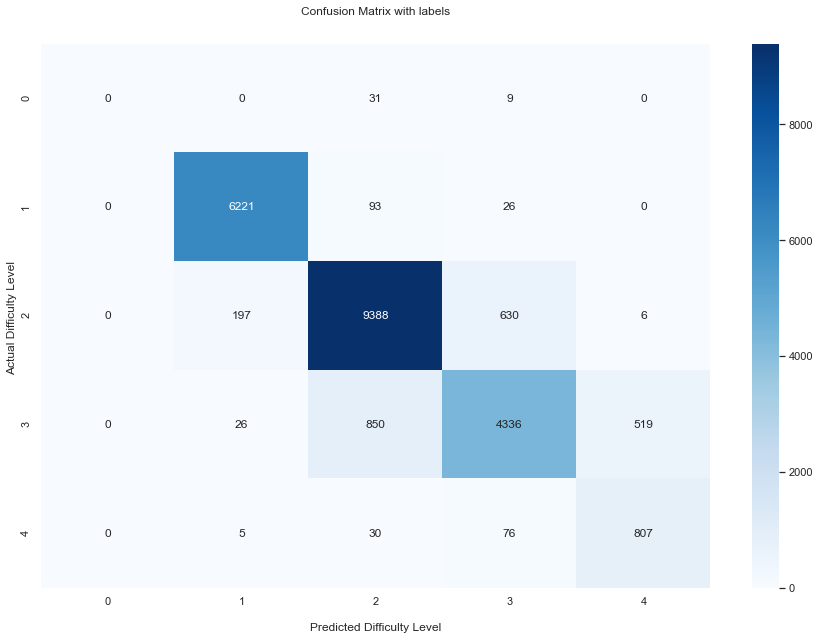

In [1234]:
plt.figure(figsize=(15, 10))

ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt='g')

ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Difficulty Level')
ax.set_ylabel('Actual Difficulty Level ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])
ax.yaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [1237]:
from sklearn import metrics

print(metrics.classification_report(y_test2, y_test_pred_mod13))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        40
           1       0.96      0.98      0.97      6340
           2       0.90      0.92      0.91     10221
           3       0.85      0.76      0.80      5731
           4       0.61      0.88      0.72       918

    accuracy                           0.89     23250
   macro avg       0.67      0.71      0.68     23250
weighted avg       0.89      0.89      0.89     23250



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [600]:
df_over2.drop(['score'], axis=1, inplace=True)
df_over2.drop(['speed'], axis=1, inplace=True)
df_over2.drop(['pitch'], axis=1, inplace=True)
df_over2.drop(['swing'], axis=1, inplace=True)
df_over2.drop(['pan'], axis=1, inplace=True)
df_over2.drop(['turn'], axis=1, inplace=True)
df_over2.drop(['length'], axis=1, inplace=True)
df_over2.drop(['wicket/dead ball'], axis=1, inplace=True)
df_over2.drop(['delivery_type'], axis=1, inplace=True)
df_over2.drop(['length/type'], axis=1, inplace=True)
df_over2.drop(['length/type_no'], axis=1, inplace=True)
df_over2.drop(['day_month_year'], axis=1, inplace=True)
df_over2.drop(['client_name'], axis=1, inplace=True)
df_over2.drop(['batfast_id'], axis=1, inplace=True)
df_over2.drop(['timestamp'], axis=1, inplace=True)
df_over2.drop(['sequence'], axis=1, inplace=True)
df_over2.drop(['month_year'], axis=1, inplace=True)



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3990: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [601]:
df_over2["gender"].replace({np.nan: "male"}, inplace=True)
df_over2["hand"].replace({np.nan: 'RHS'}, inplace=True)
df_over2["age_group"].replace({np.nan: "16Plus"}, inplace=True)
df_over2["game_mode"].replace({"Whack": "Whack_RR"}, inplace=True)
df_over2["game_mode"].replace({"ball_challenge": "over_challenge"}, inplace=True)

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:6746: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [602]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
for train_index, test_val_index in split.split(df_over2, df_over2["difficulty_level"]):
    strat_train_set = df_over2.iloc[train_index]
    strat_test_val_set = df_over2.iloc[test_val_index]
    

In [603]:
split2 = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
for test_index, val_index in split2.split(strat_test_val_set, strat_test_val_set["difficulty_level"]):
    strat_test_set = strat_test_val_set.iloc[test_index]
    strat_val_set = strat_test_val_set.iloc[val_index]

In [604]:
X_train5 = strat_train_set.drop("difficulty_level", axis=1)
y_train3 = strat_train_set['difficulty_level']
X_test5 = strat_test_set.drop("difficulty_level", axis=1)
y_test3 = strat_test_set['difficulty_level']
X_val5 = strat_val_set.drop("difficulty_level", axis=1)
y_val3 = strat_val_set['difficulty_level']

In [605]:
from sklearn.feature_extraction import DictVectorizer

# Convert df into a dictionary using .to_dict(): df_dict
df_dict = X_train5.to_dict("records")

# Create the DictVectorizer object: dv
dv = DictVectorizer(sparse=False)

# Apply dv on df_dict: df_encoded
X_encoded = dv.fit_transform(df_dict)

X_encoded = pd.DataFrame(X_encoded)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

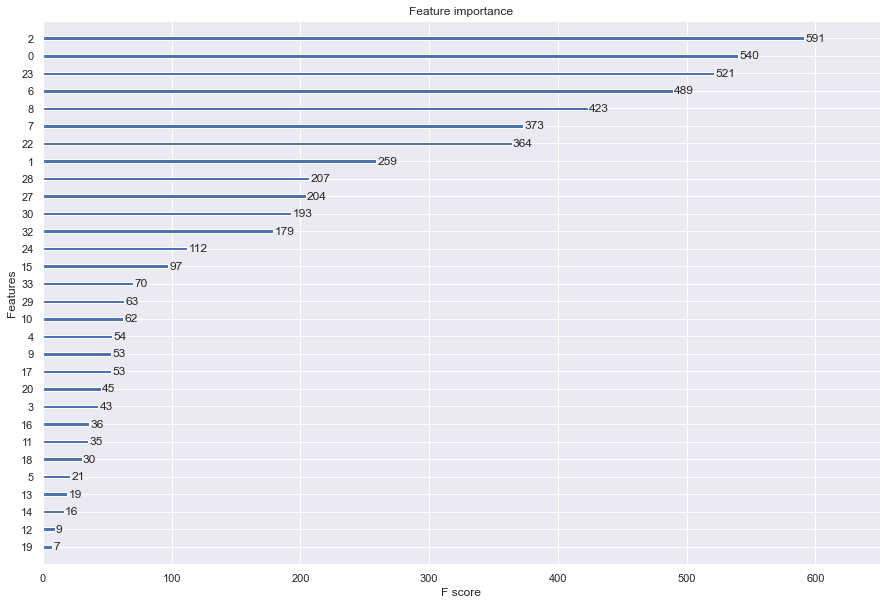

In [606]:
from xgboost import XGBRegressor
from xgboost import plot_importance
from matplotlib import pyplot

model = XGBRegressor()
model.fit(X_encoded, y_train3)
# plot feature importance

ax = plot_importance(model)
fig = ax.figure
fig.set_size_inches(15, 10)
pyplot.show()

In [607]:
import pprint
pprint.pprint(dv.vocabulary_)

{'S/R': 0,
 'S/R_T-1': 1,
 'S/R_change': 2,
 'age_group=10To16': 3,
 'age_group=16Plus': 4,
 'age_group=4To10': 5,
 'batting_avg': 6,
 'deliveries_faced': 7,
 'difficulty_level_T-1': 8,
 'event_name=fulham': 9,
 'event_name=gps': 10,
 'event_name=manchester': 11,
 'game_mode=Continuous': 12,
 'game_mode=Whack_RR': 13,
 'game_mode=over_challenge': 14,
 'game_mode=over_challenge_RR': 15,
 'game_mode=set_over_rr_RR': 16,
 'gender=female': 17,
 'gender=male': 18,
 'gender=other': 19,
 'hand=LHS': 20,
 'hand=RHS': 21,
 'hour': 22,
 'length/type_count': 23,
 'no_of_wickets': 24,
 'overs': 25,
 'run_rate': 26,
 'runs': 27,
 'runs_per_over': 28,
 'session_no': 29,
 'total_deliveries': 30,
 'total_overs': 31,
 'total_runs': 32,
 'total_wickets': 33}


In [608]:
X_train5.drop(['event_name'], axis=1, inplace=True)
X_train5.drop(['game_mode'], axis=1, inplace=True)
X_train5.drop(['gender'], axis=1, inplace=True)
X_train5.drop(['hand'], axis=1, inplace=True)
X_train5.drop(['age_group'], axis=1, inplace=True)
X_train5.drop(['session_no'], axis=1, inplace=True)
X_train5.drop(['total_wickets'], axis=1, inplace=True)
X_train5.drop(['no_of_wickets'], axis=1, inplace=True)
X_train5.drop(['total_overs'], axis=1, inplace=True)
X_train5.drop(['overs'], axis=1, inplace=True)
X_train5.drop(['run_rate'], axis=1, inplace=True)
X_test5.drop(['event_name'], axis=1, inplace=True)
X_test5.drop(['game_mode'], axis=1, inplace=True)
X_test5.drop(['gender'], axis=1, inplace=True)
X_test5.drop(['hand'], axis=1, inplace=True)
X_test5.drop(['age_group'], axis=1, inplace=True)
X_test5.drop(['session_no'], axis=1, inplace=True)
X_test5.drop(['total_wickets'], axis=1, inplace=True)
X_test5.drop(['no_of_wickets'], axis=1, inplace=True)
X_test5.drop(['total_overs'], axis=1, inplace=True)
X_test5.drop(['overs'], axis=1, inplace=True)
X_test5.drop(['run_rate'], axis=1, inplace=True)
X_val5.drop(['event_name'], axis=1, inplace=True)
X_val5.drop(['game_mode'], axis=1, inplace=True)
X_val5.drop(['gender'], axis=1, inplace=True)
X_val5.drop(['hand'], axis=1, inplace=True)
X_val5.drop(['age_group'], axis=1, inplace=True)
X_val5.drop(['session_no'], axis=1, inplace=True)
X_val5.drop(['total_wickets'], axis=1, inplace=True)
X_val5.drop(['no_of_wickets'], axis=1, inplace=True)
X_val5.drop(['total_overs'], axis=1, inplace=True)
X_val5.drop(['overs'], axis=1, inplace=True)
X_val5.drop(['run_rate'], axis=1, inplace=True)

In [609]:
X_train_num3 = X_train5.select_dtypes(include=[np.number])
#X_train_cat_new3 = X_train_new3[['game_mode','gender','event_name','age_group']]
#X_train_cat2_new3 = X_train_new3[['hand']]

X_test_num3 = X_test5.select_dtypes(include=[np.number])
#X_test_cat_new3 = X_test_new3[['game_mode','gender','event_name','age_group']]
#X_test_cat2_new3 = X_test_new3[['hand']]

X_val_num3 = X_val5.select_dtypes(include=[np.number])
#X_val_cat_new3 = X_val_new3[['game_mode','gender','event_name','age_group']]
#X_val_cat2_new3 = X_val_new3[['hand']]

In [610]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OrdinalEncoder # just to raise an ImportError if Scikit-Learn < 0.20
from sklearn.preprocessing import OneHotEncoder

train_num_attribs3 = list(X_train_num3)
#cat_attribs_new3 = list(X_train_cat_new3)
#cat_attribs2_new3 = list(X_train_cat2_new3)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), train_num_attribs3),
#        ("cat", OneHotEncoder(), cat_attribs_new3),
#        ("cat2", OrdinalEncoder(), cat_attribs2_new3),
    ])

X_train6 = full_pipeline.fit_transform(X_train5)

test_num_attribs3 = list(X_test_num3)
#test_cat_attribs_new3 = list(X_test_cat_new3)
#test_cat_attribs2_new3 = list(X_test_cat2_new3)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), test_num_attribs3),
#        ("cat", OneHotEncoder(), test_cat_attribs_new3),
#        ("cat2", OrdinalEncoder(), test_cat_attribs2_new3),
    ])

X_test6 = full_pipeline.fit_transform(X_test5)

val_num_attribs3 = list(X_val_num3)
#val_cat_attribs_new3 = list(X_val_cat_new3)
#val_cat_attribs2_new3 = list(X_val_cat2_new3)

full_pipeline = ColumnTransformer([
        ("num", MinMaxScaler(), val_num_attribs3),
#        ("cat", OneHotEncoder(), val_cat_attribs_new3),
#        ("cat2", OrdinalEncoder(), val_cat_attribs2_new3),
    ])

X_val6 = full_pipeline.fit_transform(X_val5)

In [957]:
X_train6.shape
X_test6.shape
X_val6.shape

(108500, 12)

(23250, 12)

(23250, 12)

In [733]:
from sklearn.linear_model import LinearRegression

lin_reg3 = LinearRegression()
lin_reg3.fit(X_train6, y_train3)

LinearRegression()

In [734]:
y_lin_pred3 = lin_reg3.predict(X_train6)

In [738]:
import sklearn.metrics as metrics
mae = metrics.mean_absolute_error(y_train3, y_lin_pred3)
mse = metrics.mean_squared_error(y_train3, y_lin_pred3)
rmse = np.sqrt(mse)   
r2 = metrics.r2_score(y_train3,y_lin_pred3)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.280141112718714
MSE: 0.12879299424482243
RMSE: 0.3588774083789929
R-Squared: 0.828152806148417


In [736]:
from sklearn.tree import DecisionTreeRegressor

tree_reg3 = DecisionTreeRegressor()
tree_reg3.fit(X_train6, y_train3)

DecisionTreeRegressor()

In [739]:
y_tree_pred3 = tree_reg3.predict(X_train6)

In [740]:
import sklearn.metrics as metrics
mae = metrics.mean_absolute_error(y_train3, y_tree_pred3)
mse = metrics.mean_squared_error(y_train3, y_tree_pred3)
rmse = np.sqrt(mse)   
r2 = metrics.r2_score(y_train3,y_tree_pred3)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.015755599684161122
MSE: 0.00855263386170992
RMSE: 0.09248045124084289
R-Squared: 0.9885883068578944


In [1245]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_tree_pred_test3 = tree_reg3.predict(X_test6)
print("R^2 : ", r2_score(y_test3, y_tree_pred_test3))
print("MAE :", mean_absolute_error(y_test3,y_tree_pred_test3))
print("MSE :", mean_squared_error(y_test3,y_tree_pred_test3))
print("RMSE:",np.sqrt(mean_squared_error(y_test3, y_tree_pred_test3)))

R^2 :  0.6410651195463127
MAE : 0.22544830595646534
MSE : 0.26901445676620866
RMSE: 0.5186660358710686


In [1246]:
from sklearn import metrics
y_tree_pred_test3=np.round(y_tree_pred_test3,0)
print(metrics.classification_report(y_test3, y_tree_pred_test3))

              precision    recall  f1-score   support

           0       0.01      0.03      0.01        40
           1       0.93      0.91      0.92      6338
           2       0.79      0.84      0.82     10218
           3       0.65      0.62      0.64      5188
           4       0.86      0.65      0.74      1466

    accuracy                           0.80     23250
   macro avg       0.65      0.61      0.62     23250
weighted avg       0.80      0.80      0.80     23250



In [741]:
from sklearn.ensemble import RandomForestRegressor

forest_reg3 = RandomForestRegressor(n_estimators = 10)
forest_reg3.fit(X_train6, y_train3)

RandomForestRegressor(n_estimators=10)

In [742]:
y_forest_pred3 = forest_reg3.predict(X_train6)

In [743]:
import sklearn.metrics as metrics
mae = metrics.mean_absolute_error(y_train3, y_forest_pred3)
mse = metrics.mean_squared_error(y_train3, y_forest_pred3)
rmse = np.sqrt(mse)   
r2 = metrics.r2_score(y_train3,y_forest_pred3)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.05811209394774549
MSE: 0.023436571712273094
RMSE: 0.15309007711890765
R-Squared: 0.968728818629687


In [1247]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_forest_pred_test3 = forest_reg3.predict(X_test6)
print("R^2 : ", r2_score(y_test3, y_forest_pred_test3))
print("MAE :", mean_absolute_error(y_test3,y_forest_pred_test3))
print("MSE :", mean_squared_error(y_test3,y_forest_pred_test3))
print("RMSE:",np.sqrt(mean_squared_error(y_test3, y_forest_pred_test3)))

R^2 :  0.8239619438606943
MAE : 0.20155366072786265
MSE : 0.1319369741459413
RMSE: 0.36323129565875967


In [1248]:
from sklearn import metrics
y_forest_pred_test3=np.round(y_forest_pred_test3,0)
print(metrics.classification_report(y_test3, y_forest_pred_test3))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        40
           1       0.96      0.95      0.95      6338
           2       0.80      0.90      0.85     10218
           3       0.79      0.63      0.70      5188
           4       0.99      0.91      0.95      1466

    accuracy                           0.85     23250
   macro avg       0.71      0.68      0.69     23250
weighted avg       0.85      0.85      0.85     23250



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [744]:
from xgboost import XGBRegressor
xgb_reg3 = xgboost.XGBRegressor()
xgb_reg3.fit(X_train6, y_train3)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [745]:
y_xgb_pred_3 = xgb_reg3.predict(X_train6)

In [746]:
mae = metrics.mean_absolute_error(y_train3, y_xgb_pred_3)
mse = metrics.mean_squared_error(y_train3, y_xgb_pred_3)
rmse = np.sqrt(mse) #mse**(0.5)  
r2 = metrics.r2_score(y_train3,y_xgb_pred_3)

print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("R-Squared:", r2)

Results of sklearn.metrics:
MAE: 0.12620657746720423
MSE: 0.0708993460927243
RMSE: 0.2662693112108947
R-Squared: 0.9053997172486992


In [1249]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
y_xgb_pred_test3 = xgb_reg3.predict(X_test6)
print("R^2 : ", r2_score(y_test3, y_xgb_pred_test3))
print("MAE :", mean_absolute_error(y_test3,y_xgb_pred_test3))
print("MSE :", mean_squared_error(y_test3,y_xgb_pred_test3))
print("RMSE:",np.sqrt(mean_squared_error(y_test3, y_xgb_pred_test3)))

R^2 :  0.8431730229522693
MAE : 0.19310594453606555
MSE : 0.11753865766251576
RMSE: 0.34283911337902473


In [1250]:
from sklearn import metrics
y_xgb_pred_test3=np.round(y_xgb_pred_test3,0)
print(metrics.classification_report(y_test, y_xgb_pred_test3))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        40
         1.0       0.96      0.97      0.96      6338
         2.0       0.81      0.91      0.86     10218
         3.0       0.81      0.63      0.71      5188
         4.0       0.99      0.93      0.96      1466
         5.0       0.00      0.00      0.00         0

    accuracy                           0.86     23250
   macro avg       0.60      0.57      0.58     23250
weighted avg       0.86      0.86      0.86     23250



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [884]:
checkpoint_path19 = r".\notebooks\ANN19.ckpt"

# Create a callback that saves the model's weights
ckpt_callback19 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path19,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [885]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model19_one_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model19 = build_model19_one_hidden_layers()
print('Here is a summary of this model: ')
model.summary()

Here is a summary of this model: 
Model: "sequential_286"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1360 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1361 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1362 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1363 (Dense)           (None, 1)                 65        
Total params: 9,217
Trainable params: 9,217
Non-trainable params: 0
_________________________________________________________________


In [886]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model19 = build_model19_one_hidden_layers()
print('Here is a summary of this model: ')
model19.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model19.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback19, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_294"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1402 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1403 (Dense)           (None, 1)                 9         
Total params: 113
Trainable params: 113
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.3202 - root_mean_squared_error: 0.5659 - r_square: 0.5727 - mae: 0.3841 - mse: 0.3202 - val_loss: 0.1329 - val_root_mean_squared_error: 0.3646 - val_r_square: 0.8226 - val_mae: 0.2833 - val_mse: 0.1329

Epoch 00001: val_loss improved from inf to 0.13294, saving model to .\notebooks\ANN19.ckpt
Epoch 2/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1295 - root_mean_squared_error

3390/3390 [==============================] - 7s 2ms/step - loss: 0.1161 - root_mean_squared_error: 0.3408 - r_square: 0.8451 - mae: 0.2304 - mse: 0.1161 - val_loss: 0.1171 - val_root_mean_squared_error: 0.3422 - val_r_square: 0.8437 - val_mae: 0.2359 - val_mse: 0.1171

Epoch 00045: val_loss did not improve from 0.11512
Epoch 46/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1160 - root_mean_squared_error: 0.3406 - r_square: 0.8453 - mae: 0.2303 - mse: 0.1160 - val_loss: 0.1157 - val_root_mean_squared_error: 0.3401 - val_r_square: 0.8457 - val_mae: 0.2319 - val_mse: 0.1157

Epoch 00046: val_loss did not improve from 0.11512
Epoch 47/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1159 - root_mean_squared_error: 0.3405 - r_square: 0.8452 - mae: 0.2303 - mse: 0.1159 - val_loss: 0.1156 - val_root_mean_squared_error: 0.3399 - val_r_square: 0.8458 - val_mae: 0.2334 - val_mse: 0.1156

Epoch 00047: val_loss did not improve from 0.11512
Epoch 48/10

In [887]:
checkpoint_path20 = r".\notebooks\ANN20.ckpt"

# Create a callback that saves the model's weights
ckpt_callback20 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path20,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [888]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model20_one_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model20 = build_model20_one_hidden_layers()
print('Here is a summary of this model: ')
model20.summary()

Here is a summary of this model: 
Model: "sequential_295"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1404 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1405 (Dense)           (None, 1)                 65        
Total params: 897
Trainable params: 897
Non-trainable params: 0
_________________________________________________________________


In [889]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model20 = build_model20_one_hidden_layers()
print('Here is a summary of this model: ')
model20.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model20.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback20, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_296"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1406 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1407 (Dense)           (None, 1)                 65        
Total params: 897
Trainable params: 897
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 9s 2ms/step - loss: 0.1507 - root_mean_squared_error: 0.3882 - r_square: 0.7989 - mae: 0.2944 - mse: 0.1507 - val_loss: 0.1250 - val_root_mean_squared_error: 0.3536 - val_r_square: 0.8332 - val_mae: 0.2717 - val_mse: 0.1250

Epoch 00001: val_loss improved from inf to 0.12501, saving model to .\notebooks\ANN20.ckpt
Epoch 2/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.1173 - root_mean_squared_error

3390/3390 [==============================] - 6s 2ms/step - loss: 0.0895 - root_mean_squared_error: 0.2991 - r_square: 0.8806 - mae: 0.1596 - mse: 0.0895 - val_loss: 0.0912 - val_root_mean_squared_error: 0.3021 - val_r_square: 0.8783 - val_mae: 0.1601 - val_mse: 0.0912

Epoch 00045: val_loss did not improve from 0.08981
Epoch 46/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0892 - root_mean_squared_error: 0.2986 - r_square: 0.8811 - mae: 0.1607 - mse: 0.0892 - val_loss: 0.0892 - val_root_mean_squared_error: 0.2987 - val_r_square: 0.8809 - val_mae: 0.1577 - val_mse: 0.0892

Epoch 00046: val_loss improved from 0.08981 to 0.08924, saving model to .\notebooks\ANN20.ckpt
Epoch 47/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0892 - root_mean_squared_error: 0.2986 - r_square: 0.8810 - mae: 0.1600 - mse: 0.0892 - val_loss: 0.0904 - val_root_mean_squared_error: 0.3007 - val_r_square: 0.8794 - val_mae: 0.1619 - val_mse: 0.0904

Epoch 00047: val_l

3390/3390 [==============================] - 6s 2ms/step - loss: 0.0872 - root_mean_squared_error: 0.2952 - r_square: 0.8838 - mae: 0.1543 - mse: 0.0872 - val_loss: 0.0887 - val_root_mean_squared_error: 0.2978 - val_r_square: 0.8816 - val_mae: 0.1540 - val_mse: 0.0887

Epoch 00093: val_loss did not improve from 0.08811
Epoch 94/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0878 - root_mean_squared_error: 0.2964 - r_square: 0.8828 - mae: 0.1553 - mse: 0.0878 - val_loss: 0.0887 - val_root_mean_squared_error: 0.2979 - val_r_square: 0.8816 - val_mae: 0.1572 - val_mse: 0.0887

Epoch 00094: val_loss did not improve from 0.08811
Epoch 95/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0874 - root_mean_squared_error: 0.2957 - r_square: 0.8834 - mae: 0.1547 - mse: 0.0874 - val_loss: 0.0889 - val_root_mean_squared_error: 0.2981 - val_r_square: 0.8814 - val_mae: 0.1603 - val_mse: 0.0889

Epoch 00095: val_loss did not improve from 0.08811
Epoch 96/10

In [890]:
checkpoint_path21 = r".\notebooks\ANN21.ckpt"

# Create a callback that saves the model's weights
ckpt_callback21 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path21,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [891]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model21_one_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model21 = build_model21_one_hidden_layers()
print('Here is a summary of this model: ')
model21.summary()

Here is a summary of this model: 
Model: "sequential_297"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1408 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1409 (Dense)           (None, 1)                 129       
Total params: 1,793
Trainable params: 1,793
Non-trainable params: 0
_________________________________________________________________


In [892]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model21 = build_model21_one_hidden_layers()
print('Here is a summary of this model: ')
model21.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model21.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback21, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_298"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1410 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1411 (Dense)           (None, 1)                 129       
Total params: 1,793
Trainable params: 1,793
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 9s 2ms/step - loss: 0.1807 - root_mean_squared_error: 0.4251 - r_square: 0.7589 - mae: 0.2725 - mse: 0.1807 - val_loss: 0.1216 - val_root_mean_squared_error: 0.3487 - val_r_square: 0.8377 - val_mae: 0.2361 - val_mse: 0.1216

Epoch 00001: val_loss improved from inf to 0.12162, saving model to .\notebooks\ANN21.ckpt
Epoch 2/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1098 - root_mean_squared_e

3390/3390 [==============================] - 6s 2ms/step - loss: 0.0918 - root_mean_squared_error: 0.3030 - r_square: 0.8774 - mae: 0.1685 - mse: 0.0918 - val_loss: 0.0946 - val_root_mean_squared_error: 0.3075 - val_r_square: 0.8738 - val_mae: 0.1754 - val_mse: 0.0946

Epoch 00022: val_loss did not improve from 0.09282
Epoch 23/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0918 - root_mean_squared_error: 0.3030 - r_square: 0.8776 - mae: 0.1685 - mse: 0.0918 - val_loss: 0.0942 - val_root_mean_squared_error: 0.3070 - val_r_square: 0.8743 - val_mae: 0.1732 - val_mse: 0.0942

Epoch 00023: val_loss did not improve from 0.09282
Epoch 24/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0915 - root_mean_squared_error: 0.3025 - r_square: 0.8779 - mae: 0.1671 - mse: 0.0915 - val_loss: 0.0963 - val_root_mean_squared_error: 0.3103 - val_r_square: 0.8715 - val_mae: 0.1816 - val_mse: 0.0963

Epoch 00024: val_loss did not improve from 0.09282
Epoch 25/10

3390/3390 [==============================] - 6s 2ms/step - loss: 0.0877 - root_mean_squared_error: 0.2962 - r_square: 0.8829 - mae: 0.1564 - mse: 0.0877 - val_loss: 0.0886 - val_root_mean_squared_error: 0.2977 - val_r_square: 0.8818 - val_mae: 0.1563 - val_mse: 0.0886

Epoch 00070: val_loss did not improve from 0.08847
Epoch 71/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0873 - root_mean_squared_error: 0.2954 - r_square: 0.8835 - mae: 0.1559 - mse: 0.0873 - val_loss: 0.0932 - val_root_mean_squared_error: 0.3053 - val_r_square: 0.8756 - val_mae: 0.1730 - val_mse: 0.0932

Epoch 00071: val_loss did not improve from 0.08847
Epoch 72/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0872 - root_mean_squared_error: 0.2953 - r_square: 0.8837 - mae: 0.1548 - mse: 0.0872 - val_loss: 0.0909 - val_root_mean_squared_error: 0.3016 - val_r_square: 0.8787 - val_mae: 0.1672 - val_mse: 0.0909

Epoch 00072: val_loss did not improve from 0.08847
Epoch 73/10

In [893]:
checkpoint_path22 = r".\notebooks\ANN15.ckpt"

# Create a callback that saves the model's weights
ckpt_callback22 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path22,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [894]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model22_three_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model22 = build_model22_three_hidden_layers()
print('Here is a summary of this model: ')
model22.summary()

Here is a summary of this model: 
Model: "sequential_299"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1412 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1413 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1414 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1415 (Dense)           (None, 1)                 9         
Total params: 257
Trainable params: 257
Non-trainable params: 0
_________________________________________________________________


In [895]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model22 = build_model22_three_hidden_layers()
print('Here is a summary of this model: ')
model22.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model22.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback22, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_300"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1416 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1417 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1418 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1419 (Dense)           (None, 1)                 9         
Total params: 257
Trainable params: 257
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 9s 2ms/step - loss: 0.2540 - root_mean_squared_error: 0.5039 - r_square: 0.6611 - mae: 0.3405 - mse: 0.2540 - val_loss: 0.1279 - val_root_mean_squared_error: 0.3

3390/3390 [==============================] - 7s 2ms/step - loss: 0.0938 - root_mean_squared_error: 0.3063 - r_square: 0.8749 - mae: 0.1633 - mse: 0.0938 - val_loss: 0.0940 - val_root_mean_squared_error: 0.3065 - val_r_square: 0.8746 - val_mae: 0.1641 - val_mse: 0.0940

Epoch 00044: val_loss did not improve from 0.09278
Epoch 45/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0931 - root_mean_squared_error: 0.3051 - r_square: 0.8757 - mae: 0.1618 - mse: 0.0931 - val_loss: 0.0931 - val_root_mean_squared_error: 0.3052 - val_r_square: 0.8758 - val_mae: 0.1587 - val_mse: 0.0931

Epoch 00045: val_loss did not improve from 0.09278
Epoch 46/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0929 - root_mean_squared_error: 0.3049 - r_square: 0.8760 - mae: 0.1610 - mse: 0.0929 - val_loss: 0.0952 - val_root_mean_squared_error: 0.3086 - val_r_square: 0.8729 - val_mae: 0.1700 - val_mse: 0.0952

Epoch 00046: val_loss did not improve from 0.09278
Epoch 47/10

3390/3390 [==============================] - 6s 2ms/step - loss: 0.0906 - root_mean_squared_error: 0.3010 - r_square: 0.8792 - mae: 0.1532 - mse: 0.0906 - val_loss: 0.0933 - val_root_mean_squared_error: 0.3055 - val_r_square: 0.8754 - val_mae: 0.1571 - val_mse: 0.0933

Epoch 00068: val_loss did not improve from 0.08986
Epoch 69/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0903 - root_mean_squared_error: 0.3006 - r_square: 0.8794 - mae: 0.1532 - mse: 0.0903 - val_loss: 0.0905 - val_root_mean_squared_error: 0.3008 - val_r_square: 0.8793 - val_mae: 0.1553 - val_mse: 0.0905

Epoch 00069: val_loss did not improve from 0.08986
Epoch 70/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.0905 - root_mean_squared_error: 0.3008 - r_square: 0.8794 - mae: 0.1532 - mse: 0.0905 - val_loss: 0.0901 - val_root_mean_squared_error: 0.3002 - val_r_square: 0.8798 - val_mae: 0.1472 - val_mse: 0.0901

Epoch 00070: val_loss did not improve from 0.08986
Epoch 71/10

In [896]:
checkpoint_path23 = r".\notebooks\ANN23.ckpt"

# Create a callback that saves the model's weights
ckpt_callback23 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path23,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [897]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model23_three_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model23 = build_model23_three_hidden_layers()
print('Here is a summary of this model: ')
model23.summary()

Here is a summary of this model: 
Model: "sequential_301"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1420 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1421 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1422 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1423 (Dense)           (None, 1)                 65        
Total params: 9,217
Trainable params: 9,217
Non-trainable params: 0
_________________________________________________________________


In [898]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model23 = build_model23_three_hidden_layers()
print('Here is a summary of this model: ')
model23.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model23.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback23, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_302"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1424 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1425 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1426 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1427 (Dense)           (None, 1)                 65        
Total params: 9,217
Trainable params: 9,217
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 10s 2ms/step - loss: 0.1246 - root_mean_squared_error: 0.3530 - r_square: 0.8338 - mae: 0.2217 - mse: 0.1246 - val_loss: 0.1086 - val_root_mean_squared_error

3390/3390 [==============================] - 7s 2ms/step - loss: 0.0815 - root_mean_squared_error: 0.2855 - r_square: 0.8911 - mae: 0.1359 - mse: 0.0815 - val_loss: 0.0894 - val_root_mean_squared_error: 0.2990 - val_r_square: 0.8807 - val_mae: 0.1529 - val_mse: 0.0894

Epoch 00045: val_loss did not improve from 0.08466
Epoch 46/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.0813 - root_mean_squared_error: 0.2851 - r_square: 0.8916 - mae: 0.1357 - mse: 0.0813 - val_loss: 0.0868 - val_root_mean_squared_error: 0.2946 - val_r_square: 0.8842 - val_mae: 0.1442 - val_mse: 0.0868

Epoch 00046: val_loss did not improve from 0.08466
Epoch 47/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0811 - root_mean_squared_error: 0.2847 - r_square: 0.8919 - mae: 0.1354 - mse: 0.0811 - val_loss: 0.0861 - val_root_mean_squared_error: 0.2935 - val_r_square: 0.8851 - val_mae: 0.1401 - val_mse: 0.0861

Epoch 00047: val_loss did not improve from 0.08466
Epoch 48/10

In [901]:
checkpoint_path24 = r".\notebooks\ANN24.ckpt"

# Create a callback that saves the model's weights
ckpt_callback24 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path24,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [902]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model24_three_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model24 = build_model24_three_hidden_layers()
print('Here is a summary of this model: ')
model24.summary()

Here is a summary of this model: 
Model: "sequential_303"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1428 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1429 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1430 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1431 (Dense)           (None, 1)                 129       
Total params: 34,817
Trainable params: 34,817
Non-trainable params: 0
_________________________________________________________________


In [903]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model24 = build_model24_three_hidden_layers()
print('Here is a summary of this model: ')
model24.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model24.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback24, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_304"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1432 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1433 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1434 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1435 (Dense)           (None, 1)                 129       
Total params: 34,817
Trainable params: 34,817
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
3390/3390 [==============================] - 11s 2ms/step - loss: 0.1226 - root_mean_squared_error: 0.3502 - r_square: 0.8364 - mae: 0.2227 - mse: 0.1226 - val_loss: 0.1099 - val_root_mean_squared_err

In [904]:
checkpoint_path25 = r".\notebooks\ANN25.ckpt"

# Create a callback that saves the model's weights
ckpt_callback25 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path25,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [905]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model25_five_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(8,activation='relu', kernel_initializer='he_normal'))
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model25 = build_model25_five_hidden_layers()
print('Here is a summary of this model: ')
model25.summary()

Here is a summary of this model: 
Model: "sequential_305"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1436 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1437 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1438 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1439 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1440 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1441 (Dense)           (None, 1)                 9         
Total params: 401
Trainable params: 401
Non-trainable params: 0
____________________

In [906]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model25 = build_model25_five_hidden_layers()
print('Here is a summary of this model: ')
model25.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model25.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback25, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_306"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1442 (Dense)           (None, 8)                 104       
_________________________________________________________________
dense_1443 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1444 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1445 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1446 (Dense)           (None, 8)                 72        
_________________________________________________________________
dense_1447 (Dense)           (None, 1)                 9         
Total params: 401
Trainable params: 401
Non-trainable params: 0
____________________


Epoch 00020: val_loss did not improve from 0.10363
Epoch 21/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1037 - root_mean_squared_error: 0.3221 - r_square: 0.8617 - mae: 0.1800 - mse: 0.1037 - val_loss: 0.1045 - val_root_mean_squared_error: 0.3232 - val_r_square: 0.8606 - val_mae: 0.1900 - val_mse: 0.1045

Epoch 00021: val_loss did not improve from 0.10363
Epoch 22/100
3390/3390 [==============================] - 6s 2ms/step - loss: 0.1037 - root_mean_squared_error: 0.3220 - r_square: 0.8615 - mae: 0.1796 - mse: 0.1037 - val_loss: 0.1032 - val_root_mean_squared_error: 0.3213 - val_r_square: 0.8623 - val_mae: 0.1748 - val_mse: 0.1032

Epoch 00022: val_loss improved from 0.10363 to 0.10323, saving model to .\notebooks\ANN25.ckpt
Epoch 23/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.1037 - root_mean_squared_error: 0.3220 - r_square: 0.8618 - mae: 0.1798 - mse: 0.1037 - val_loss: 0.1028 - val_root_mean_squared_error: 0.3207 - val_r_squar

3390/3390 [==============================] - 7s 2ms/step - loss: 0.0881 - root_mean_squared_error: 0.2969 - r_square: 0.8823 - mae: 0.1491 - mse: 0.0881 - val_loss: 0.0902 - val_root_mean_squared_error: 0.3003 - val_r_square: 0.8797 - val_mae: 0.1619 - val_mse: 0.0902

Epoch 00066: val_loss did not improve from 0.08856
Epoch 67/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.0880 - root_mean_squared_error: 0.2967 - r_square: 0.8827 - mae: 0.1494 - mse: 0.0880 - val_loss: 0.0913 - val_root_mean_squared_error: 0.3022 - val_r_square: 0.8782 - val_mae: 0.1586 - val_mse: 0.0913

Epoch 00067: val_loss did not improve from 0.08856
Epoch 68/100
3390/3390 [==============================] - 7s 2ms/step - loss: 0.0878 - root_mean_squared_error: 0.2962 - r_square: 0.8828 - mae: 0.1480 - mse: 0.0878 - val_loss: 0.0907 - val_root_mean_squared_error: 0.3011 - val_r_square: 0.8790 - val_mae: 0.1582 - val_mse: 0.0907

Epoch 00068: val_loss did not improve from 0.08856
Epoch 69/10

In [907]:
checkpoint_path26 = r".\notebooks\ANN26.ckpt"

# Create a callback that saves the model's weights
ckpt_callback26 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path26,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [908]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model26_five_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(64,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model26 = build_model26_five_hidden_layers()
print('Here is a summary of this model: ')
model26.summary()

Here is a summary of this model: 
Model: "sequential_307"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1448 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1449 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1450 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1451 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1452 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1453 (Dense)           (None, 1)                 65        
Total params: 17,537
Trainable params: 17,537
Non-trainable params: 0
______________

In [909]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model26 = build_model26_five_hidden_layers()
print('Here is a summary of this model: ')
model26.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model26.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback26, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_308"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1454 (Dense)           (None, 64)                832       
_________________________________________________________________
dense_1455 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1456 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1457 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1458 (Dense)           (None, 64)                4160      
_________________________________________________________________
dense_1459 (Dense)           (None, 1)                 65        
Total params: 17,537
Trainable params: 17,537
Non-trainable params: 0
______________

3390/3390 [==============================] - 8s 2ms/step - loss: 0.0814 - root_mean_squared_error: 0.2853 - r_square: 0.8913 - mae: 0.1341 - mse: 0.0814 - val_loss: 0.0830 - val_root_mean_squared_error: 0.2881 - val_r_square: 0.8892 - val_mae: 0.1339 - val_mse: 0.0830

Epoch 00044: val_loss did not improve from 0.08229
Epoch 45/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.0810 - root_mean_squared_error: 0.2847 - r_square: 0.8918 - mae: 0.1333 - mse: 0.0810 - val_loss: 0.0845 - val_root_mean_squared_error: 0.2907 - val_r_square: 0.8872 - val_mae: 0.1400 - val_mse: 0.0845

Epoch 00045: val_loss did not improve from 0.08229
Epoch 46/100
3390/3390 [==============================] - 8s 2ms/step - loss: 0.0814 - root_mean_squared_error: 0.2854 - r_square: 0.8914 - mae: 0.1332 - mse: 0.0814 - val_loss: 0.0837 - val_root_mean_squared_error: 0.2893 - val_r_square: 0.8883 - val_mae: 0.1395 - val_mse: 0.0837

Epoch 00046: val_loss did not improve from 0.08229
Epoch 47/10

In [910]:
checkpoint_path27 = r".\notebooks\ANN27.ckpt"

# Create a callback that saves the model's weights
ckpt_callback27 = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path27,
                                                 monitor='val_loss', # or val_accuracy if you have it.
                                                 save_best_only=True, # Default false. If you don't change the file name then the output will be overritten at each step and only the last model will be saved.
                                                 save_weights_only=True, # True => model.save_weights (weights and no structure, you need JSON file for structure), False => model.save (saves weights & structure)
                                                 verbose=1,
                                                  )

early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [911]:
rmse = tf.keras.metrics.RootMeanSquaredError()
r_square = tfa.metrics.RSquare(dtype=tf.float32, y_shape=(1,))

def build_model27_five_hidden_layers():
    
    model = Sequential()

   
    
    # Input Layer with 10 Neurons
    model.add(keras.layers.InputLayer(input_shape = (X_train2.shape[1],)))    # Input layer => input_shape must be explicitly designated
#     model.add(Activation('relu')) # relu or sigmoid.
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))                         # Hidden layer 1 => only output dimension should be designated (output dimension = # of Neurons = 50)
        
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(128,activation='relu', kernel_initializer='he_normal'))
    
    model.add(Dense(1))                          # Output layer => output dimension = 1 since it is a regression problem
    
   
    learning_rate = 0.001
    optimizer = optimizers.Adam(learning_rate)
    model.compile(loss='mse',
                optimizer=optimizer,
                metrics=[rmse,r_square, 'mae', 'mse']) # for regression problems, mean squared error (MSE) is often employed
    
    return model

model27 = build_model27_five_hidden_layers()
print('Here is a summary of this model: ')
model27.summary()

Here is a summary of this model: 
Model: "sequential_309"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1460 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1461 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1462 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1463 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1464 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1465 (Dense)           (None, 1)                 129       
Total params: 67,841
Trainable params: 67,841
Non-trainable params: 0
______________

In [912]:
%%time
EPOCHS = 100
batch_size = 32 # 6 iteration

model27 = build_model27_five_hidden_layers()
print('Here is a summary of this model: ')
model27.summary()


with tf.device('/CPU:0'): # it can be with '/CPU:0'
# with tf.device('/GPU:0'): # comment the previous line and uncomment this line to train with a GPU, if available.
    history = model27.fit(
        X_train6, 
        y_train3,
        batch_size = batch_size,
        epochs=EPOCHS, 
        verbose=1,
        shuffle=True,
        steps_per_epoch = int(X_train6.shape[0] / batch_size) ,
        validation_data = (X_val6, y_val3),
        callbacks=[ckpt_callback27, early_stopping_cb
                  ],
        
    )

Here is a summary of this model: 
Model: "sequential_310"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1466 (Dense)           (None, 128)               1664      
_________________________________________________________________
dense_1467 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1468 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1469 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1470 (Dense)           (None, 128)               16512     
_________________________________________________________________
dense_1471 (Dense)           (None, 1)                 129       
Total params: 67,841
Trainable params: 67,841
Non-trainable params: 0
______________


Epoch 00020: val_loss did not improve from 0.08462
Epoch 21/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0830 - root_mean_squared_error: 0.2881 - r_square: 0.8891 - mae: 0.1375 - mse: 0.0830 - val_loss: 0.0890 - val_root_mean_squared_error: 0.2983 - val_r_square: 0.8813 - val_mae: 0.1532 - val_mse: 0.0890

Epoch 00021: val_loss did not improve from 0.08462
Epoch 22/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0828 - root_mean_squared_error: 0.2877 - r_square: 0.8896 - mae: 0.1374 - mse: 0.0828 - val_loss: 0.0867 - val_root_mean_squared_error: 0.2945 - val_r_square: 0.8843 - val_mae: 0.1438 - val_mse: 0.0867

Epoch 00022: val_loss did not improve from 0.08462
Epoch 23/100
3390/3390 [==============================] - 9s 3ms/step - loss: 0.0825 - root_mean_squared_error: 0.2871 - r_square: 0.8900 - mae: 0.1359 - mse: 0.0825 - val_loss: 0.0857 - val_root_mean_squared_error: 0.2927 - val_r_square: 0.8857 - val_mae: 0.1374 - val_mse: 0.085

In [1251]:
def evaluate_model(model, X_test6, y_test3):
    """
    evaluate model on test set and show results in dataframe.
    
    Parameters
    ----------
    model : keras model
        trained keras model.
    X_test : numpy array
        Features of holdout set.
    y_test : numpy array
        Labels of holdout set.
        
    Returns
    -------
    display_df : DataFrame
        Pandas dataframe containing evaluation results.
    """
    eval_dict = model26.evaluate(X_test6, y_test3, return_dict=True)
    
    #display_df = pd.DataFrame([eval_dict.values()], columns=[list(eval_dict.keys())])
    
    return eval_dict
hyper_df3 = evaluate_model(model26, X_test6, y_test3)




727/727 [==============================] - 2s 2ms/step - loss: 0.1113 - root_mean_squared_error: 0.3337 - r_square: 0.8514 - mae: 0.1741 - mse: 0.1113


In [1252]:
y_test_pred_mod26 = model26.predict(X_test6)
y_test_pred_mod26=np.round(y_test_pred_mod26,0)

In [1253]:
from sklearn.metrics import confusion_matrix
cf_matrix=confusion_matrix(y_test3,y_test_pred_mod26)
cf_matrix

array([[   0,    0,   31,    9,    0],
       [   0, 6198,  113,   27,    0],
       [   0,  197, 9492,  525,    4],
       [   0,   22, 1705, 3446,   15],
       [   0,    6,   35,  139, 1286]])

<Figure size 1080x720 with 0 Axes>

Text(0.5, 1.0, 'Confusion Matrix with labels\n\n')

Text(0.5, 66.5, '\nPredicted Difficulty Level')

Text(111.5, 0.5, 'Actual Difficulty Level ')

[Text(0.5, 0, '0'),
 Text(1.5, 0, '1'),
 Text(2.5, 0, '2'),
 Text(3.5, 0, '3'),
 Text(4.5, 0, '4')]

[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4')]

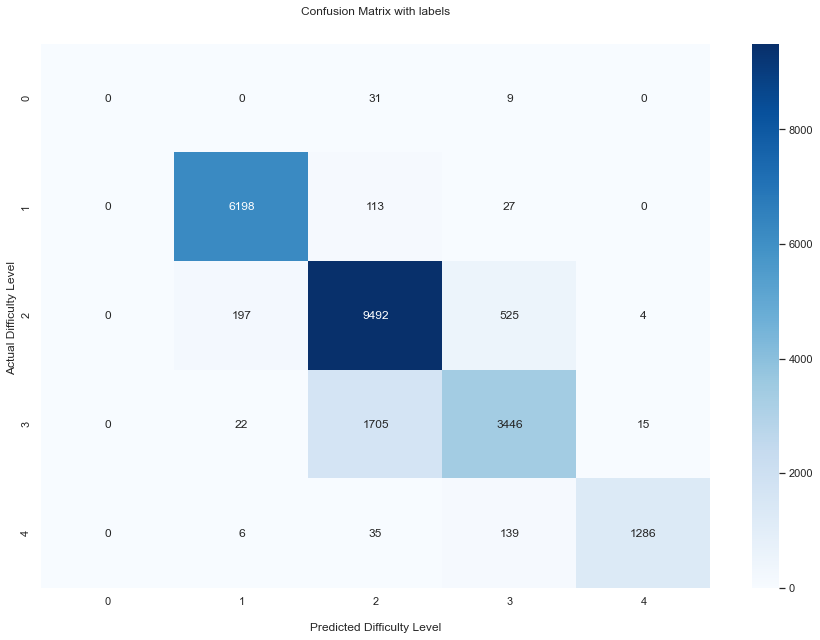

In [1254]:
plt.figure(figsize=(15, 10))

ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt='g')

ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Difficulty Level')
ax.set_ylabel('Actual Difficulty Level ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])
ax.yaxis.set_ticklabels(['0','1', '2','3','4','5','6', '7','8','9'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [1255]:
from sklearn import metrics

print(metrics.classification_report(y_test3, y_test_pred_mod26))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        40
           1       0.96      0.98      0.97      6338
           2       0.83      0.93      0.88     10218
           3       0.83      0.66      0.74      5188
           4       0.99      0.88      0.93      1466

    accuracy                           0.88     23250
   macro avg       0.72      0.69      0.70     23250
weighted avg       0.88      0.88      0.87     23250



/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yosephismail/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

